In [1]:
# Group members: Abdennour Aissaoui , Obaid Muhammad, Ling Feng Zhou, Shiyuan Lin
# Header: 
# Given a list of co-integrated pairs of tickers, the program uses the LSTM to predict the spread(price)
# of the two ETFs for each pair. Then, it uses backtest to evaluate the performance of the model, outputting the plots
# of good results.
# The input features of the LSTM are close prices, volumes and Volatility Index
# We train three LSTMs: 
# the LSTM with window normalization, dual LSTM and original LSTM to predict the spread(price) for result comparison.
# Each version of LSTM uses z-score
# and Ornstein-Uhlenbeck (O-U calibration method) separately to determine the trading threshold


# Make sure that you have all these libaries available to run the code successfully
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split

import statsmodels.api as sm

#Retrieve data libraries
import yfinance as yf

Using TensorFlow backend.


In [2]:
# %reset

In [3]:
## Retrieve data functions
def filter_data(etf_data: pd.DataFrame, query: str = None):
    if query: return etf_data.query(query)
    else: return etf_data


def load_data(tickers: list, interval: str, start: str, end: str = None) -> pd.DataFrame:
    """
    Downloads data from Yahoo Finance.
    Valid intervals: 1m,2m,5m,15m,30m,60m,90m,1h,1d,5d,1wk,1mo,3mo
    Returns a dataframe with where each column is a ticker
    """
    data = yf.download(tickers + ["^VIX"],
                       start=start,
                       end=end,
                       interval=interval,
                       progress=False).dropna()
    data["Volume"] = data["Volume"].pct_change()
    data[('Close', '^VIX')] = data[('Close', '^VIX')].pct_change()
    return data[["Close", "Volume"]]

def run_with_tickers(tickers: list, interval: str,
                     start: str = None, end: str = None) -> pd.DataFrame:
    '''
    Retrives the data from Yahoo Finance. The tickers are inputted by the user.
    :param tickers: a list of tickers
    :param interval: 1m,2m,5m,15m,30m,60m,90m,1h,1d,5d,1wk,1mo,3mo
    :param start:
    :param end:
    :return: a dataframe with where each column is a ticker
    '''
    return load_data(tickers, interval, start, end)

In [4]:
## Data preprocess functions

def split_train_test(data, test_ratio):
    dataset = np.array(data[['Close', 'Volume', '^VIX']].values).reshape(-1,data.shape[1])
    dataset = dataset.astype('float32')
    data_train, data_test = train_test_split(dataset, test_size=test_ratio, shuffle=False)
    return data_train, data_test
    

def calculate_spread(ticker_data, ticker_pair):
    spread_price = pd.Series(ticker_data[('Close', ticker_pair[0])]-ticker_data[('Close', ticker_pair[1])],
                             name="Close")
    spread_volume = pd.Series(ticker_data[('Volume', ticker_pair[0])]-ticker_data[('Volume', ticker_pair[1])],
                             name="Volume")
    VIX = pd.Series(ticker_data[('Close', '^VIX')], name='^VIX')
    
    spread_df = pd.concat([spread_price, spread_volume, VIX], axis=1)
    spread_df = spread_df.replace([np.inf, -np.inf], np.nan).dropna(how="any")
    return spread_df

def calculate_dual_spread(ticker_data, ticker_pair):
    '''
    Calculate spread for dual LSTMs
    '''
    spread_price_0 = pd.Series(ticker_data[('Close', ticker_pair[0])]+ticker_data[('Close', ticker_pair[1])]
                               -ticker_data[('Close', ticker_pair[1])],
                             name="Close")
    spread_price_1 = pd.Series(ticker_data[('Close', ticker_pair[0])]+ticker_data[('Close', ticker_pair[1])]
                               -ticker_data[('Close', ticker_pair[0])],
                             name="Close")
    spread_volume_0 = pd.Series(ticker_data[('Volume', ticker_pair[0])]+ticker_data[('Volume', ticker_pair[1])]
                                -ticker_data[('Volume', ticker_pair[1])],
                             name="Volume")
    spread_volume_1 = pd.Series(ticker_data[('Volume', ticker_pair[0])]+ticker_data[('Volume', ticker_pair[1])]
                                -ticker_data[('Volume', ticker_pair[0])],
                             name="Volume")
    VIX = pd.Series(ticker_data[('Close', '^VIX')], name='^VIX')
    spread_df_0 = pd.concat([spread_price_0, spread_volume_0, VIX], axis=1)
    spread_df_1 = pd.concat([spread_price_1, spread_volume_1, VIX], axis=1)
    spread_df_0 = spread_df_0.replace([np.inf, -np.inf], np.nan).dropna(how="any")
    spread_df_1 = spread_df_1.replace([np.inf, -np.inf], np.nan).dropna(how="any")
    return spread_df_0, spread_df_1
    
def data_preprocess(data):
    '''
    Run preprocess
    '''
    scaler_price = MinMaxScaler(feature_range=(0,1))
    scaler_volume = MinMaxScaler(feature_range=(0,1))
    scaler_vix = MinMaxScaler(feature_range=(0,1))
    # scaler = StandardScaler()
    
    scaled_price = scaler_price.fit_transform(data[:, 0].reshape(-1, 1))
    scaled_volume = scaler_volume.fit_transform(data[:, 1].reshape(-1, 1))
    scaled_vix = scaler_vix.fit_transform(data[:, 2].reshape(-1, 1))
    
    scaled_price = np.squeeze(scaled_price)
    scaled_volume = np.squeeze(scaled_volume)
    scaled_vix = np.squeeze(scaled_vix)
    
    scaled_data = np.array([scaled_price, scaled_volume, scaled_vix]).T
    return scaled_data, scaler_price

def create_dataset(dataset, look_back: int = 10, window_normalize=True):
    '''
    Create dataset for regression
    '''
    data_X, data_y, unscaled_X = [], [], []
    
    for i in range(len(dataset) - look_back - 1):
        window = dataset[i:(i+look_back)]
        if window_normalize:
            normalized_window = normalise_window(window)
            unscaled_X.append(window)
            data_X.append(normalized_window)
            data_y.append(normalized_window[look_back-1, 0]) # target should only be the price
        else:
            data_X.append(window)
            data_y.append(window[look_back-1, 0]) # target should only be the price
    data_X = np.array(data_X)
    data_y = np.array(data_y)
    unscaled_X = np.array(unscaled_X)
    return data_X, data_y, unscaled_X

def normalise_window(window):
    '''Normalise window with a base value of zero'''
    normalized_window = (window/(window[0]+0.00000000001))-1
    return normalized_window

def denormalize_windows(y_values, windows):
    p0s = windows[:, 0, 0]
    denormalize_predictions = p0s*(y_values+1)
    return np.array(denormalize_predictions)

def scale_back(train_pred, y_train, test_pred, y_test, scaler_train, scaler_test):
    train_pred = scaler_train.inverse_transform(train_pred)
    y_train = scaler_train.inverse_transform(y_train.reshape(-1, 1))
    test_pred = scaler_test.inverse_transform(test_pred)
    y_test = scaler_test.inverse_transform(y_test.reshape(-1, 1))
    return train_pred, y_train, test_pred, y_test

In [5]:

def bootstrap(ser):
    '''
    White's reality check
    '''
    ser.dropna(inplace=True)
    arr = np.array(ser.values)
    alpha = .05*100 #significance alpha
    reps = 5000 #how many bootstrapings, 50000 limit if you have 8GB RAM

    percentile = 100-alpha
    ave = np.average(arr) #arithmetic mean
    print("average return %f" %ave)
    #ave = ms.gmean(arr) #geometric mean
    centered_arr = arr-ave
    n = len(centered_arr)
    #constructs 50000 alternative return histories and calculates their theoretical averages
    xb = np.random.choice(centered_arr, (n, reps), replace=True)
    mb = xb.mean(axis=0) #arithmetic mean
    #mb = ms.gmean(mb, axis=0) #geometric mean
    #sorts the 50000 averages
    mb.sort()
    #calculates the 95% conficence interval (two tails) threshold for the theoretical averages
    print(np.percentile(mb, [2.5, 97.5])) 
    threshold = np.percentile(mb, [percentile])[0]
    if ave > threshold:
        print("Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)")
    else:
        print("Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)")
    #count will be the items i that are smaller than ave
    count_vals = 0
    for i in mb:
        count_vals += 1
        if i > ave:
            break     
    #p is based on the count that are larger than ave so 1-count is needed:
    p = 1-count_vals/len(mb)
    print("p_value:")
    print(p)
    #histogram
    sr = pd.Series(mb)
    desc = sr.describe()
    count = desc[0]
    std = desc[2]
    minim = desc[3]
    maxim = desc[7]
    R = maxim-minim
    n = count
    s = std
    bins = int(round(R*(n**(1/3))/(3.49*std),0))
    fig = sr.hist(bins=bins)
    plt.show()
    return ave, p

In [6]:
# LSTM model and evaluation
def lstm(X_train, y_train, X_test, y_test, batch_size):
    '''
    Train a LSTM
    '''
    # LSTM
    model = Sequential()
    model.add(LSTM(24, input_shape=(X_train.shape[1], X_train.shape[2]))) #look_back))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(X_train, y_train, batch_size=batch_size, epochs=20, verbose=1)

    train_pred = model.predict(X_train)
    test_pred = model.predict(X_test) 

    return y_train, train_pred, y_test, test_pred, model

In [7]:
def train_and_predict(ticker_pair, interval, test_ratio, batch_size, 
                      look_back=10, start=None, end=None):
    ticker_data = run_with_tickers(ticker_pair, interval, start=start, end=end)
    spread = calculate_spread(ticker_data, ticker_pair)
    date_all = spread.index.tolist()
    
    data_train, data_test = split_train_test(spread, test_ratio)
    scaled_train, scaler_train = data_preprocess(data_train)
    scaled_test, scaler_test = data_preprocess(data_test)
    
    X_train, y_train, unscaled_X_train = create_dataset(scaled_train, look_back, window_normalize=False)
    X_test, y_test, unscaled_X_test = create_dataset(scaled_test, look_back, window_normalize=False)
    
    # train a lstm model
    y_train, train_pred, y_test, test_pred, lstm_model = lstm(X_train, y_train, X_test, y_test, batch_size)
    
    train_pred, y_train, test_pred, y_test = scale_back(train_pred, y_train, test_pred, y_test, scaler_train, 
                                                        scaler_test)
    print("============ finish model training and generating prediction =================")
    return train_pred, y_train, test_pred, y_test, date_all

def train_and_predict_window_normalization(ticker_pair, interval, test_ratio, batch_size, 
                                           look_back=10, start=None, end=None):
    ticker_data = run_with_tickers(ticker_pair, interval, start=start, end=end)
    spread = calculate_spread(ticker_data, ticker_pair)
    date_all = spread.index.tolist()
    
    data_train, data_test = split_train_test(spread, test_ratio)
    
    scaled_train = data_train
    scaled_test = data_test
    X_train, y_train, unscaled_X_train = create_dataset(scaled_train, look_back)
    X_test, y_test, unscaled_X_test = create_dataset(scaled_test, look_back)
    
    # train a lstm model
    y_train, train_pred, y_test, test_pred, lstm_model = lstm(X_train, y_train, X_test, y_test, batch_size) 
    
    train_pred = denormalize_windows(train_pred, unscaled_X_train)
    y_train = denormalize_windows(y_train, unscaled_X_train)
    test_pred = denormalize_windows(test_pred, unscaled_X_test)
    y_test = denormalize_windows(y_test, unscaled_X_test)
    print("============ finish model training and generating prediction =================")
    return train_pred, y_train, test_pred, y_test, date_all

def train_and_predict_dual(ticker_pair, interval, test_ratio, batch_size, look_back=10, start=None, end=None):
    ticker_data = run_with_tickers(ticker_pair, interval, start=start, end=end)
    spread_0, spread_1 = calculate_dual_spread(ticker_data, ticker_pair)
    date_all = spread_0.index.tolist()
    
    data_train_0, data_test_0 = split_train_test(spread_0, test_ratio)
    data_train_1, data_test_1 = split_train_test(spread_1, test_ratio)
    
    scaled_train_0 = data_train_0
    scaled_train_1 = data_train_1
    scaled_test_0 = data_test_0
    scaled_test_1 = data_test_1
    
    X_train_0, y_train_0, unscaled_X_train_0 = create_dataset(scaled_train_0, look_back)
    X_test_0, y_test_0, unscaled_X_test_0 = create_dataset(scaled_test_0, look_back)
    X_train_1, y_train_1, unscaled_X_train_1 = create_dataset(scaled_train_1, look_back)
    X_test_1, y_test_1, unscaled_X_test_1 = create_dataset(scaled_test_1, look_back)
    
    # train a lstm model
    y_train_0, train_pred_0, y_test_0, test_pred_0, lstm_model_0 = lstm(X_train_0, y_train_0, X_test_0, y_test_0, batch_size)
    y_train_1, train_pred_1, y_test_1, test_pred_1, lstm_model_1 = lstm(X_train_1, y_train_1, X_test_1, y_test_1, batch_size)
    

    train_pred_0 = denormalize_windows(train_pred_0, unscaled_X_train_0)
    y_train_0 = denormalize_windows(y_train_0, unscaled_X_train_0)
    test_pred_0 = denormalize_windows(test_pred_0, unscaled_X_test_0)
    y_test_0 = denormalize_windows(y_test_0, unscaled_X_test_0)

    train_pred_1 = denormalize_windows(train_pred_1, unscaled_X_train_1)
    y_train_1 = denormalize_windows(y_train_1, unscaled_X_train_1)
    test_pred_1 = denormalize_windows(test_pred_1, unscaled_X_test_1)
    y_test_1 = denormalize_windows(y_test_1, unscaled_X_test_1)

    y_train = y_train_0 - y_train_1
    train_pred = train_pred_0 - train_pred_1
    y_test = y_test_0 - y_test_1
    test_pred = test_pred_0 - test_pred_1
    print("============ finish model training and generating prediction =================")
    return train_pred, y_train, test_pred, y_test, date_all

In [8]:
def least_squares_naive(s, delta=1.0):
    '''
    Ornstein-Uhlenbeck (O-U calibration method)
    '''
    y = s.diff().iloc[1:]
    x = s.shift(1)[1:]

    res = sm.OLS(y, sm.add_constant(x)).fit()
    b, a = res.params

    residual_df = y - (a * x + b)
    se = residual_df.std(ddof=2)

    lambda_ = -a / delta
    mu_ = b / (lambda_ * delta)
    sigma_ = se / (delta ** 0.5)

    return mu_, lambda_, sigma_

def backtest(ticker_pair, train_pred, y_train, test_pred, y_test, date_all, look_back, threshold_method, LSTM_method):
    '''
    Perform backtest to evaluate the model
    '''
    error_test = list(np.array([real - test for test,real in zip(test_pred, y_test)]).flatten())
    error_train = list(np.array([real - test for test,real in zip(train_pred, y_train)]).flatten())
    if threshold_method == "std":
        threshold = np.std(error_train)
    elif threshold_method == "ou":
        mu_, lambda_, sigma_ = least_squares_naive(pd.Series(error_train))
        threshold = sigma_
    print("threshold: ", threshold)
    ## build up backtesting system for 
    # get the return list
    close_list = list(y_test.flatten())
    return_list = [close1/close2 -1 for close1,close2 in zip(close_list[1:],close_list[:-1])]
    signal = []
    for i in range(len(close_list)):
        if error_test[i] > 1.5 * threshold:
            signal.append(1)
        elif error_test[i] < -1.5 * threshold:
            signal.append(-1)
        else:
            signal.append(0)
    
    position_cursor = signal[0]
    position = [signal[0]]
    for i in range(1,len(signal)):
        if signal[i] != 0:
            if signal[i] != position[i-1]:
                position_cursor = signal[i]
        position.append(position_cursor)
        
    position = position[:-1]
    Capital_Line = [1]
    Trading_Cost = 0.0015
    periods = 250
    
    for i in range(len(position)):
        if position[i] == 1:
            if i > 0 and position[i] != position[i-1]:
                Capital_Line.append(Capital_Line[i] * (1 + -1 * return_list[i] - Trading_Cost))
            else:
                Capital_Line.append(Capital_Line[i] * (1 +  -1 * return_list[i]))
        else:
            if i > 0 and position[i] != position[i-1]:
                Capital_Line.append(Capital_Line[i] * (1 + return_list[i] - Trading_Cost))
            else:
                Capital_Line.append(Capital_Line[i] * (1 +  return_list[i]))
    train_size = int(len(date_all) * (1-TEST_RATIO))
    test_size = len(date_all) - train_size
    
    date_train, date_test = date_all[0:train_size], date_all[train_size:len(date_all)]
    
    #  Strategy Analysis
    cul_return = Capital_Line[-1] - 1.0
    date_line = range(len(date_test))
    
    # Log return
    logR = [np.log(x + 1) for x in return_list]
    annualVolatility = np.std(logR)
    annualVolatility = annualVolatility / np.sqrt(1 / periods)
    
    # Metrics
    annual_rtn = pow(Capital_Line[-1], periods / len(date_test)) - 1.0
    sharpe_ratio = annual_rtn / annualVolatility
    years = len(date_test)/periods
    CAGR = (((Capital_Line[-1]/1.0)**(1/years))-1)
    
    # White's reality check
    avg_return, p_value = bootstrap(pd.Series(Capital_Line)-1.0)
    
    # plot the capital line
    fig, ax1 = plt.subplots(figsize=(16, 5))
    
    color = 'tab:blue'
    ax1.set_xlabel('Date (s)')
    ax1.set_ylabel('Capital Line', color=color)
    ax1.plot(date_test[look_back+1:], Capital_Line, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    title = "ticker 1: " + ticker_pair[0] + ", ticker 2: " + ticker_pair[1] +\
        ", threshold_method: " + threshold_method + ", LSTM_method: " + LSTM_method +\
            ", sharpe ratio: " + str(round(sharpe_ratio,4)) + ", CAGR: " + str(round(CAGR,4)) + ", Avg return: " +\
            str(round(avg_return,4))
    plt.title(title)
    if (p_value < 0.05 or p_value>0.95) and sharpe_ratio > 0.05:
        filename = ticker_pair[0] + "_" + ticker_pair[1] +\
              "_" + threshold_method + "_" + LSTM_method + ".jpg"
        plt.savefig(filename)
    plt.show()
    
    return annual_rtn, sharpe_ratio, CAGR, avg_return

In [9]:
def run_window_normalize_training_workflow(ticker_pair, interval, test_ratio, batch_size, look_back=10, start=None, end=None):
    '''
    Run LSTM with window normalization
    '''
    train_pred, y_train, test_pred, y_test, date_all = train_and_predict_window_normalization(ticker_pair, interval, 
                                                                                              test_ratio, batch_size,
                                                                                              look_back, start, end)
    annual_rtn, sharpe_ratio, CAGR, avg_return = backtest(ticker_pair, train_pred, y_train, test_pred, y_test, date_all, look_back, "std", "window normalized")
    print("Annual return (std) : ", annual_rtn)
    print("Sharpe ratio (std) :", sharpe_ratio)
    print("CAGR (std) : ", CAGR)
    print("Avg_return (std) : ", avg_return)
    print("-------------------------------------")
    annual_rtn, sharpe_ratio, CAGR, avg_return = backtest(ticker_pair, train_pred, y_train, test_pred, y_test, date_all, look_back, "ou", "window normalized")
    print("Annual return (ou) : ", annual_rtn)
    print("Sharpe ratio (ou) :", sharpe_ratio)
    print("CAGR (ou) : ", CAGR)
    print("Avg_return (ou) : ", avg_return)
    return

def run_dual_training_workflow(ticker_pair, interval, test_ratio, batch_size, look_back=10, start=None, end=None):
    '''
    Run 2 LSTMs (with window normalization) to predict the prices of tickers A and B
    '''
    train_pred, y_train, test_pred, y_test, date_all = train_and_predict_dual(ticker_pair, interval, test_ratio, batch_size,
                                                                look_back, start, end)
    annual_rtn, sharpe_ratio, CAGR, avg_return = backtest(ticker_pair, train_pred, y_train, test_pred, y_test, date_all, look_back, "std", "dual")
    print("Annual return (dual+std) : ", annual_rtn)
    print("Sharpe ratio (dual+std) :", sharpe_ratio)
    print("CAGR (dual+std) : ", CAGR)
    print("Avg_return (dual+std) : ", avg_return)
    print("-------------------------------------")
    annual_rtn, sharpe_ratio, CAGR, avg_return = backtest(ticker_pair, train_pred, y_train, test_pred, y_test, date_all, look_back, "ou", "dual")
    print("Annual return (dual+ou) : ", annual_rtn)
    print("Sharpe ratio (dual+ou) :", sharpe_ratio)
    print("CAGR (dual+ou) : ", CAGR)
    print("Avg_return (dual+ou) : ", avg_return)
    return

def run_training_workflow(ticker_pair, interval, test_ratio, batch_size, look_back=10, start=None, end=None):
    '''
    Run LSTM without window normalization but using scalers on corresponding training and testing data. 
    '''
    train_pred, y_train, test_pred, y_test, date_all = train_and_predict(ticker_pair, interval, test_ratio, batch_size,
                                                                                              look_back, start, end)
    annual_rtn, sharpe_ratio, CAGR, avg_return = backtest(ticker_pair, train_pred, y_train, test_pred, y_test, date_all, look_back, "std", "original")
    print("Annual return (std) : ", annual_rtn)
    print("Sharpe ratio (std) :", sharpe_ratio)
    print("CAGR (std) : ", CAGR)
    print("Avg_return (std) : ", avg_return)
    print("-------------------------------------")
    annual_rtn, sharpe_ratio, CAGR, avg_return = backtest(ticker_pair, train_pred, y_train, test_pred, y_test, date_all, look_back, "ou", "original")
    print("Annual return (ou) : ", annual_rtn)
    print("Sharpe ratio (ou) :", sharpe_ratio)
    print("CAGR (ou) : ", CAGR)
    print("Avg_return (ou) : ", avg_return)
    return 

In [15]:
'''
Small Capitcal section (DBSCAN)
'''
TICKER_PAIRS = []
# change the file name here to get the ticker pairs outputted by co-integration from either kmeans or DBSCAN. 
ticker_file = open("Small Cap_DBSCAN.csv", "r")
lines = ticker_file.readlines()
count = 0
# Strips the newline character 
for line in lines: 
    if count > 0:
        new_pair = []
        new_pair = [line.split(",")[2].strip(), line.split(",")[3].strip()]
        TICKER_PAIRS.append(new_pair)
    count += 1
print(TICKER_PAIRS)

[['IWO', 'VTWG'], ['NUSC', 'SMLF'], ['OUSM', 'SMLV'], ['IJT', 'SLYG'], ['IWM', 'VTWO'], ['IJS', 'SLYV'], ['IWN', 'SLYV'], ['IWN', 'VTWV'], ['SLYV', 'VTWV']]


['IWO', 'VTWG']
Epoch 1/20
313/313 [==============================] - 1s 2ms/step - loss: 0.1608
Epoch 2/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0197
Epoch 3/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0107
Epoch 4/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0085
Epoch 5/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0075
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0068
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 9/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0056
Epoch 10/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0053
Epoch 11/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0052
Epoch 12/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 13/

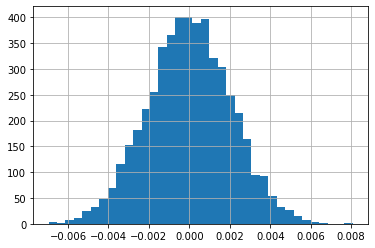

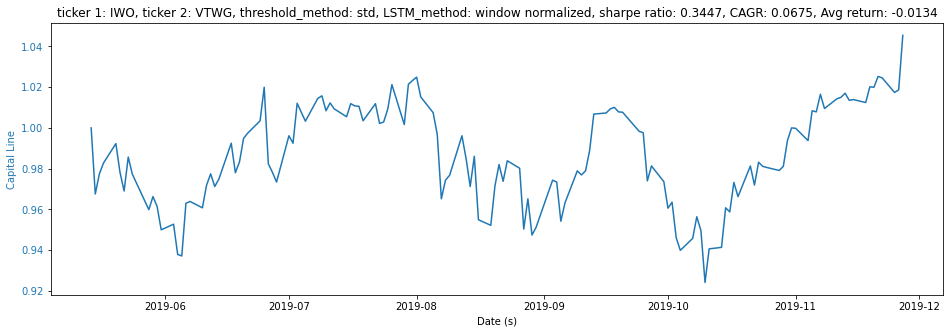

Annual return (std) :  0.06747921192270456
Sharpe ratio (std) : 0.34473556169928615
CAGR (std) :  0.06747921192270456
Avg_return (std) :  -0.013430733152962686
-------------------------------------
threshold:  0.7781699945051657
average return -0.020883
[-0.00555407  0.00558502]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


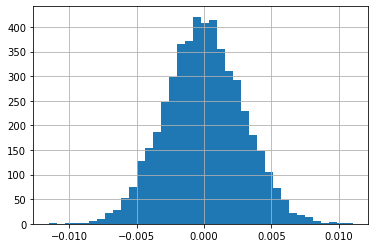

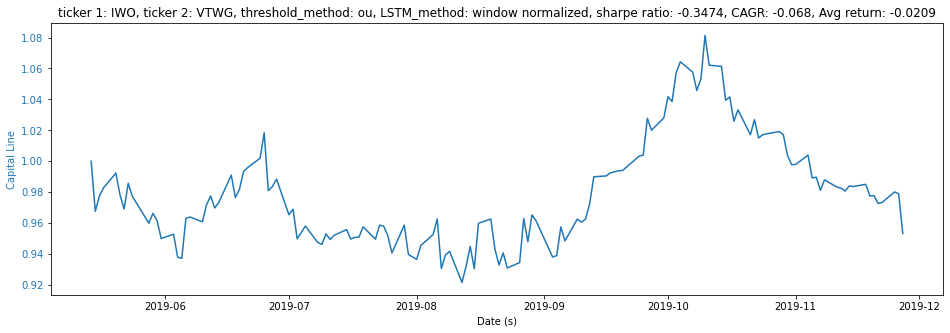

Annual return (ou) :  -0.06801025997574073
Sharpe ratio (ou) : -0.3474485623944104
CAGR (ou) :  -0.06801025997574073
Avg_return (ou) :  -0.02088310097742223
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1032
Epoch 2/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0168
Epoch 3/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0096
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0074
Epoch 5/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0065
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0060
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 10/20
313/31

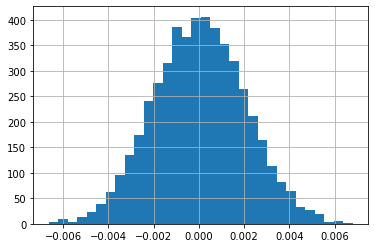

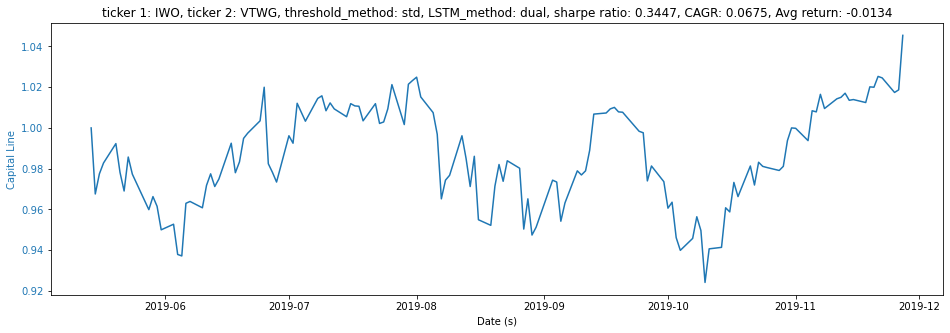

Annual return (dual+std) :  0.06747833867292585
Sharpe ratio (dual+std) : 0.34473077734821994
CAGR (dual+std) :  0.06747833867292585
Avg_return (dual+std) :  -0.013430866439544276
-------------------------------------
threshold:  0.8002341267473237
average return -0.030481
[-0.00497629  0.00482219]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


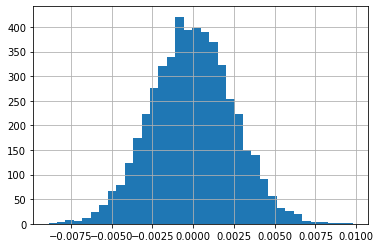

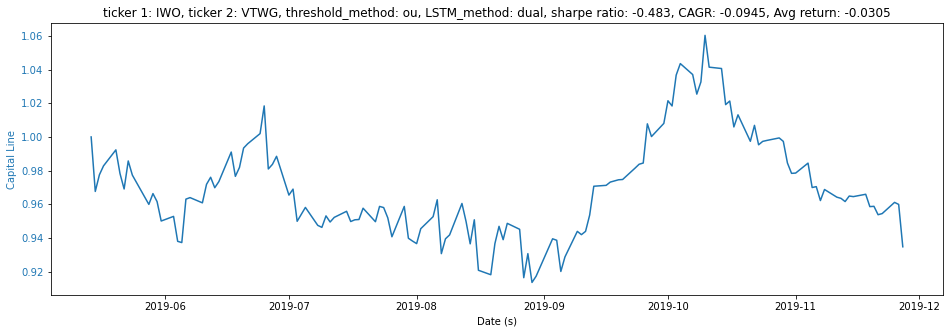

Annual return (dual+ou) :  -0.09454745635706374
Sharpe ratio (dual+ou) : -0.48302045911727304
CAGR (dual+ou) :  -0.09454745635706374
Avg_return (dual+ou) :  -0.030481222647667616
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0354
Epoch 2/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0131
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0087
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0070
Epoch 5/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0064
Epoch 6/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0051
Epoch 7/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0043
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0038
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0032
Epoch 10/20
31

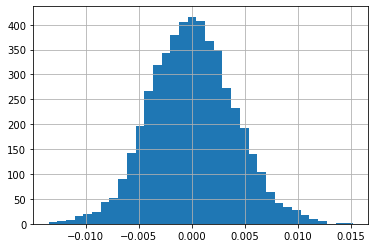

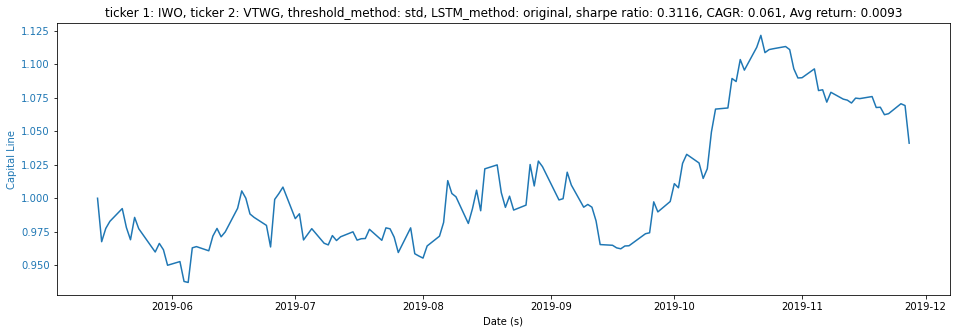

Annual return (std) :  0.0609952056131593
Sharpe ratio (std) : 0.31161011492747515
CAGR (std) :  0.0609952056131593
Avg_return (std) :  0.009309136885514904
-------------------------------------
threshold:  0.48968544141975795
average return -0.029638
[-0.00606199  0.00648674]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


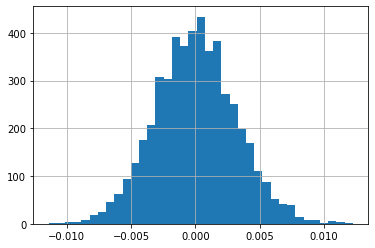

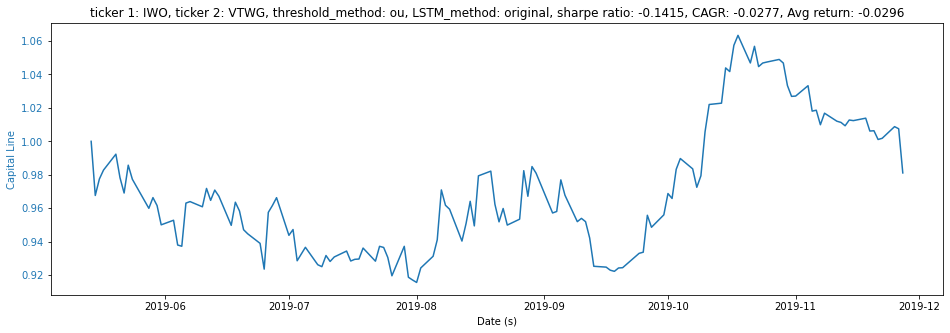

Annual return (ou) :  -0.027691284808374683
Sharpe ratio (ou) : -0.1414682409032729
CAGR (ou) :  -0.027691284808374683
Avg_return (ou) :  -0.029637643193185334
['NUSC', 'SMLF']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1153
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0197
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0109
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0078
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 11/20


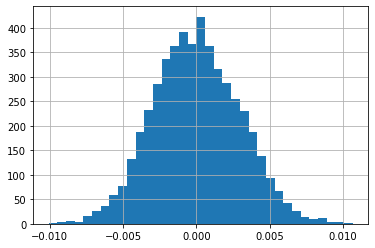

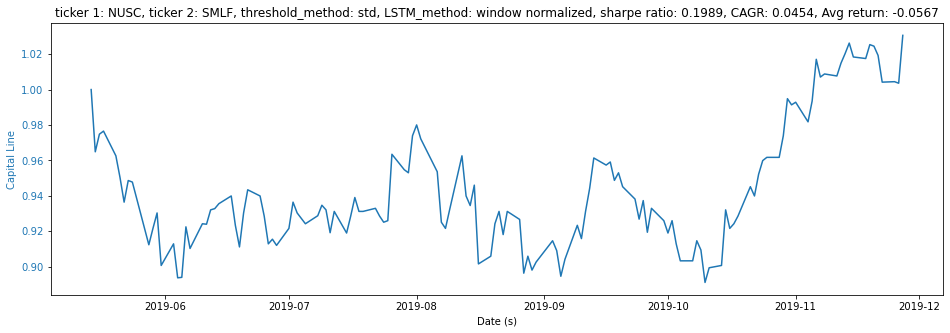

Annual return (std) :  0.04536857234554792
Sharpe ratio (std) : 0.19889284796245726
CAGR (std) :  0.04536857234554792
Avg_return (std) :  -0.05669030015539324
-------------------------------------
threshold:  0.1929069853240318
average return 0.005853
[-0.00645993  0.00661615]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.04239999999999999


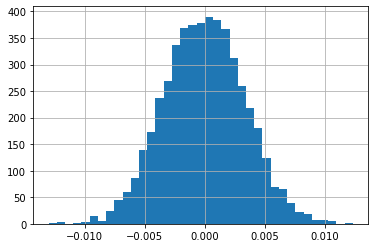

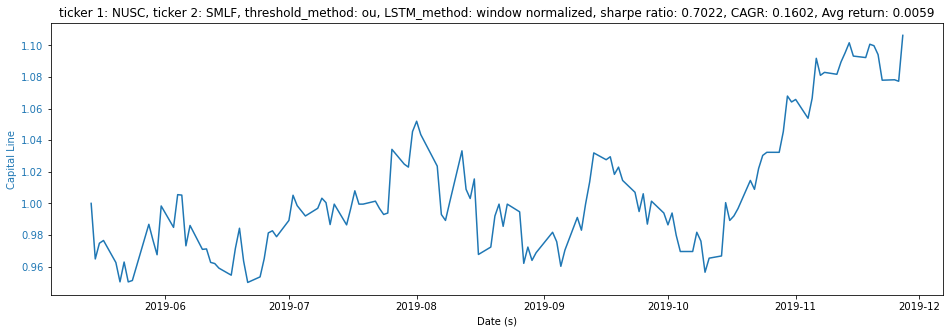

Annual return (ou) :  0.16018333871807733
Sharpe ratio (ou) : 0.702233259427211
CAGR (ou) :  0.16018333871807733
Avg_return (ou) :  0.005853429977456968
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 2ms/step - loss: 0.1019
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0105
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0048
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0043
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 10/20
313/313 [=

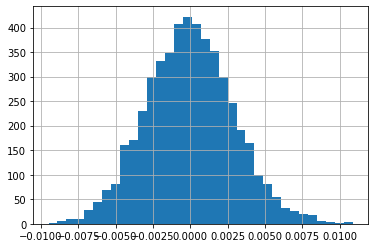

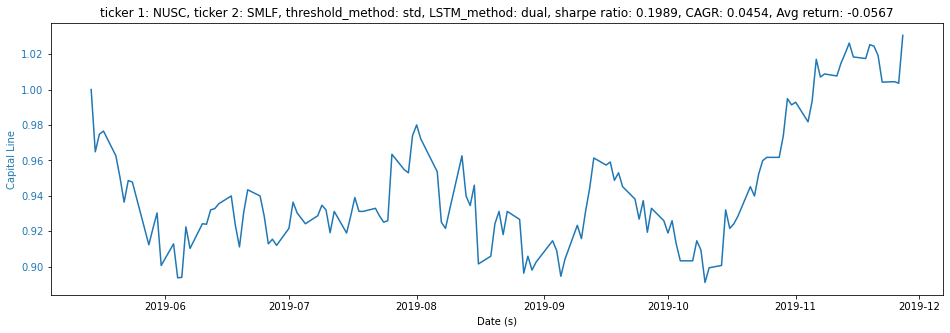

Annual return (dual+std) :  0.04536908847600141
Sharpe ratio (dual+std) : 0.19889537146138908
CAGR (dual+std) :  0.04536908847600141
Avg_return (dual+std) :  -0.05669008501597773
-------------------------------------
threshold:  0.1946945719037521
average return -0.032722
[-0.00541905  0.00580588]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


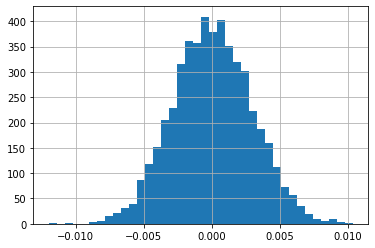

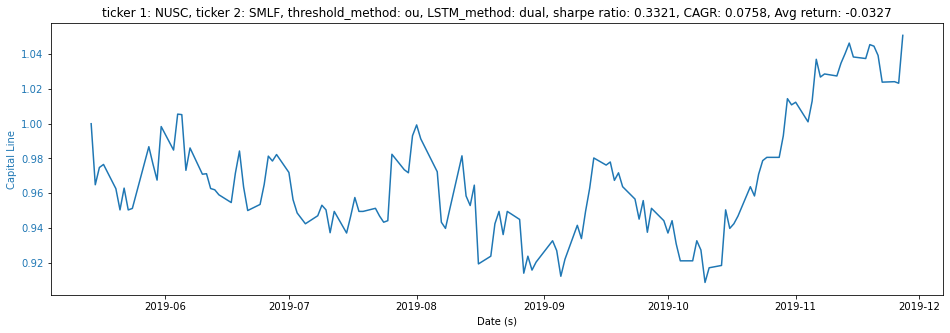

Annual return (dual+ou) :  0.07575574176653843
Sharpe ratio (dual+ou) : 0.3321086428033234
CAGR (dual+ou) :  0.07575574176653843
Avg_return (dual+ou) :  -0.03272226653680016
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0343
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0167
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0095
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0068
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0043
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0036
Epoch 10/20
313/313

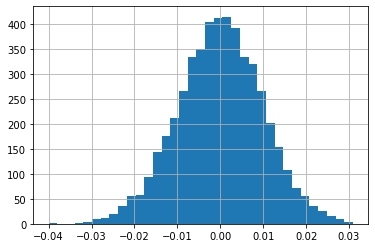

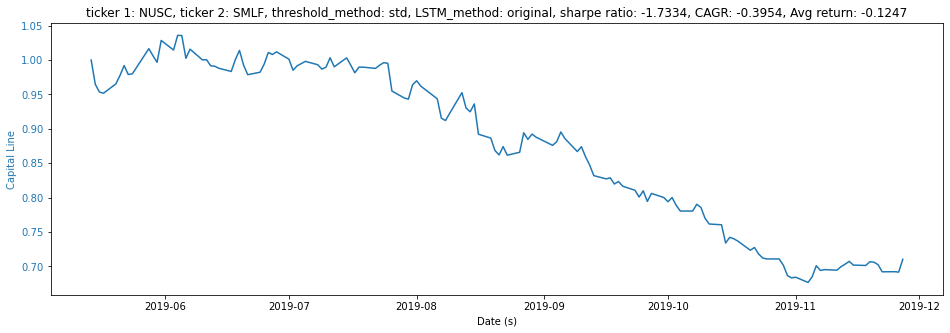

Annual return (std) :  -0.3953962280580382
Sharpe ratio (std) : -1.7333916980890924
CAGR (std) :  -0.3953962280580382
Avg_return (std) :  -0.1247414746355428
-------------------------------------
threshold:  0.11673563608651749
average return -0.111909
[-0.01625424  0.01621746]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


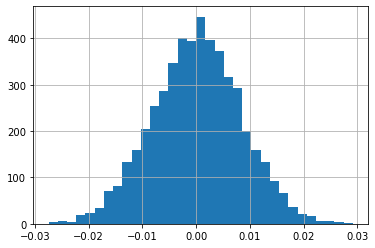

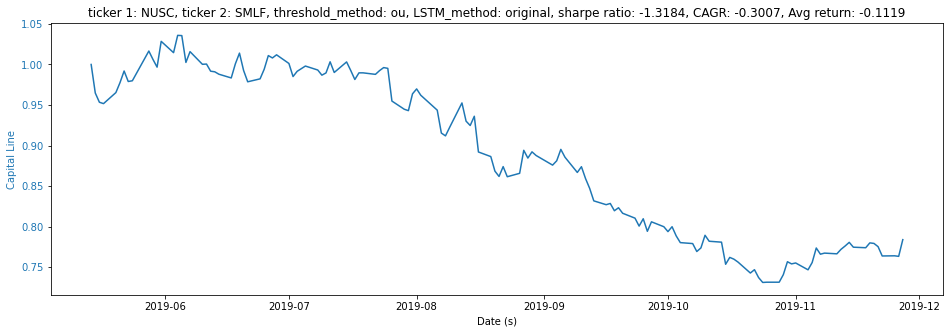

Annual return (ou) :  -0.3007360884978074
Sharpe ratio (ou) : -1.3184077189562062
CAGR (ou) :  -0.3007360884978074
Avg_return (ou) :  -0.11190893266916901
['OUSM', 'SMLV']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1252
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0191
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0097
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0036
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0033
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0031
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0030
Epoch 11/20
313/3

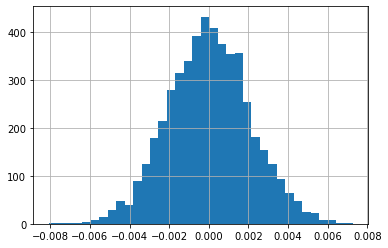

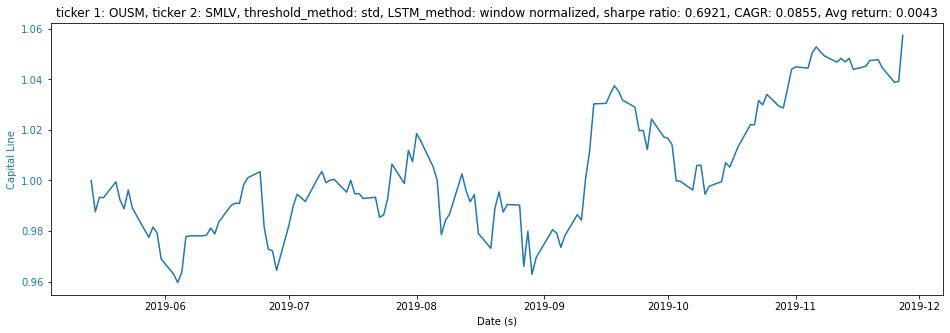

Annual return (std) :  0.08549992516832572
Sharpe ratio (std) : 0.692085388808339
CAGR (std) :  0.08549992516832572
Avg_return (std) :  0.004250144551271498
-------------------------------------
threshold:  0.6336226525884521
average return -0.041571
[-0.00383387  0.00395179]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


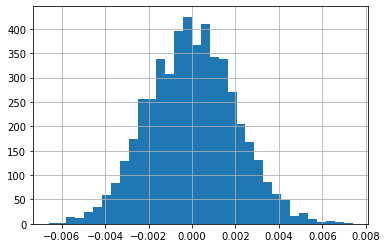

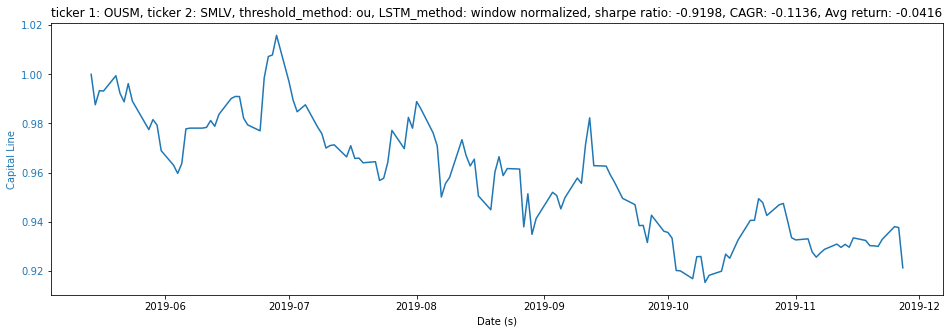

Annual return (ou) :  -0.11363357043846711
Sharpe ratio (ou) : -0.9198152352035132
CAGR (ou) :  -0.11363357043846711
Avg_return (ou) :  -0.041571113323178276
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1154
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0172
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0091
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 7/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0039
Epoch 8/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0037
Epoch 9/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0036
Epoch 10/20
313/3

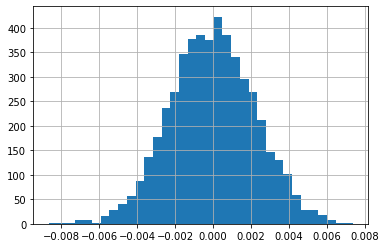

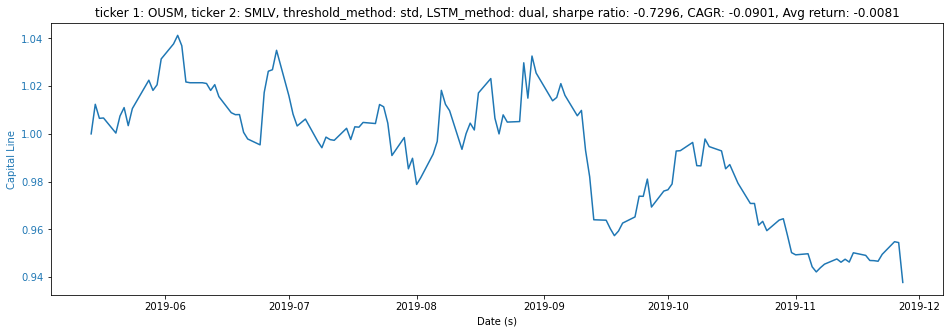

Annual return (dual+std) :  -0.09013188731302191
Sharpe ratio (dual+std) : -0.7295788272793338
CAGR (dual+std) :  -0.09013188731302191
Avg_return (dual+std) :  -0.008111189856401866
-------------------------------------
threshold:  0.6384696671821302
average return -0.008111
[-0.0044738   0.00419546]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


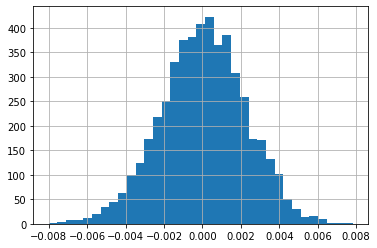

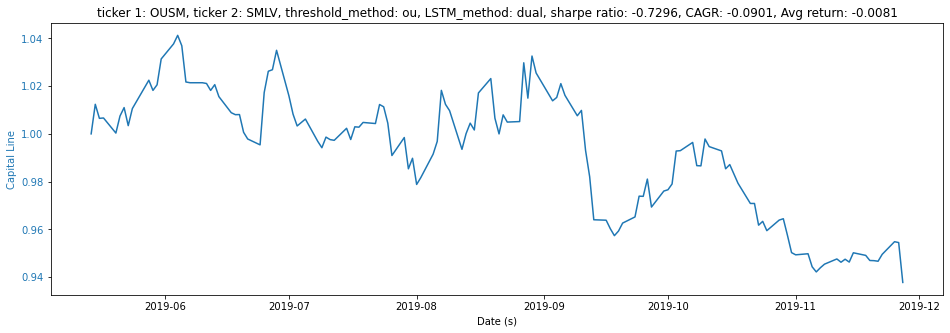

Annual return (dual+ou) :  -0.09013188731302191
Sharpe ratio (dual+ou) : -0.7295788272793338
CAGR (dual+ou) :  -0.09013188731302191
Avg_return (dual+ou) :  -0.008111189856401866
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0300
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0147
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0088
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0034
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0029
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0025
Epoch 10/20
313

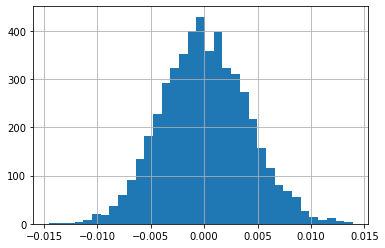

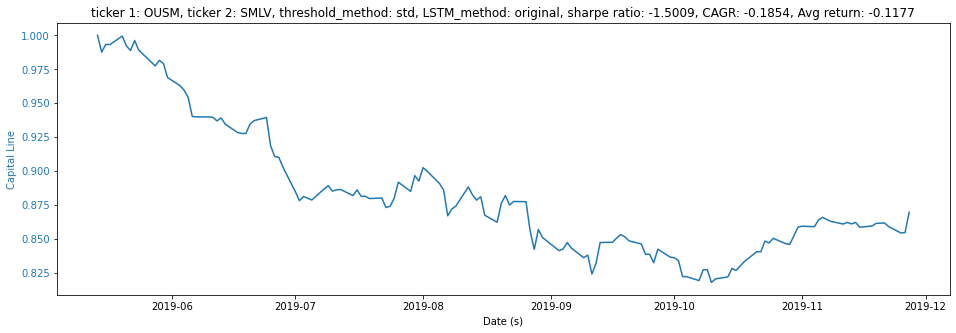

Annual return (std) :  -0.18541752381499976
Sharpe ratio (std) : -1.5008764327128155
CAGR (std) :  -0.18541752381499976
Avg_return (std) :  -0.11769421068654741
-------------------------------------
threshold:  0.38228851558042376
average return -0.102093
[-0.00656442  0.00688711]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


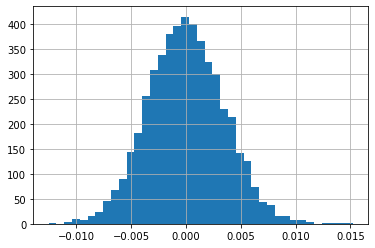

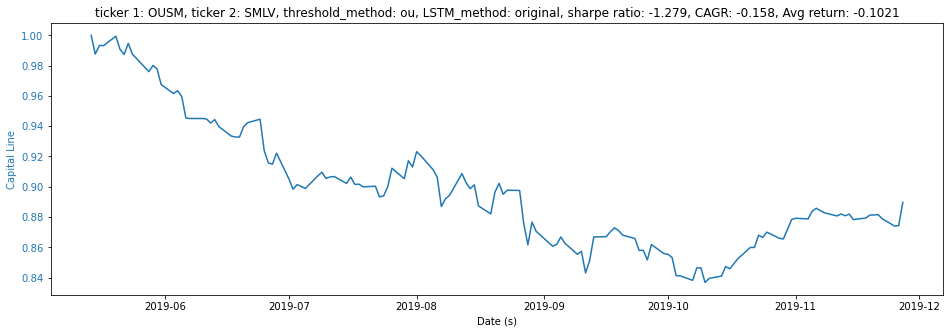

Annual return (ou) :  -0.15801003415523485
Sharpe ratio (ou) : -1.2790243959484586
CAGR (ou) :  -0.15801003415523485
Avg_return (ou) :  -0.10209341479909899
['IJT', 'SLYG']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0847
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0159
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0087
Epoch 4/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0068
Epoch 5/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0060
Epoch 6/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0056
Epoch 7/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0054
Epoch 8/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0053
Epoch 9/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0052
Epoch 10/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0052
Epoch 11/20
313/

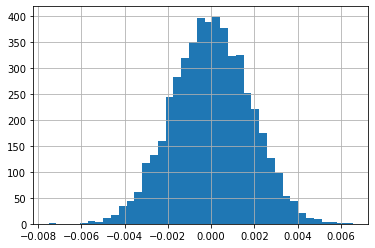

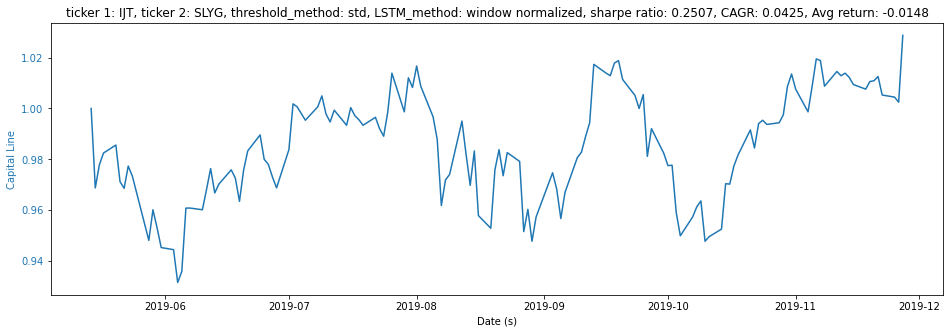

Annual return (std) :  0.04254461426004319
Sharpe ratio (std) : 0.2507044347068783
CAGR (std) :  0.04254461426004319
Avg_return (std) :  -0.01484221348251359
-------------------------------------
threshold:  0.4785687956866232
average return -0.018924
[-0.00404167  0.00404604]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


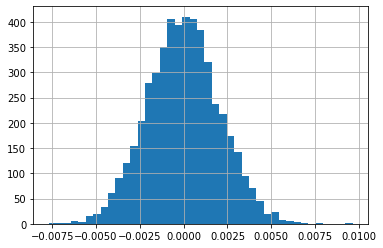

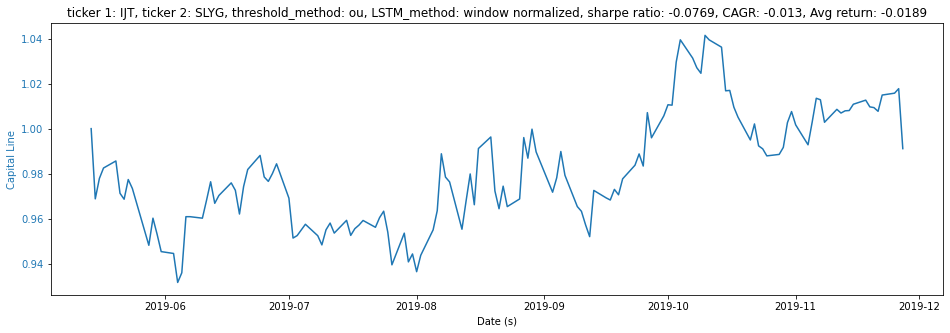

Annual return (ou) :  -0.013049809118254818
Sharpe ratio (ou) : -0.07689915809384563
CAGR (ou) :  -0.013049809118254818
Avg_return (ou) :  -0.01892418492556817
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0953
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0149
Epoch 3/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0086
Epoch 4/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0067
Epoch 5/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0057
Epoch 6/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0051
Epoch 7/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0049
Epoch 8/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0048
Epoch 9/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0046
Epoch 10/20
313

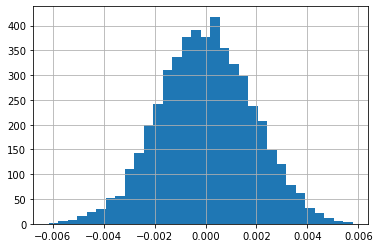

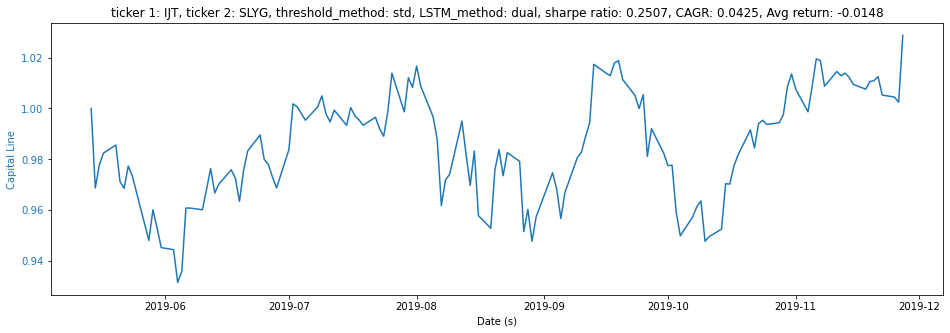

Annual return (dual+std) :  0.04254421878090642
Sharpe ratio (dual+std) : 0.25070179237012225
CAGR (dual+std) :  0.04254421878090642
Avg_return (dual+std) :  -0.014842370277726575
-------------------------------------
threshold:  0.4788608114963865
average return 0.022812
[-0.00658633  0.00640007]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


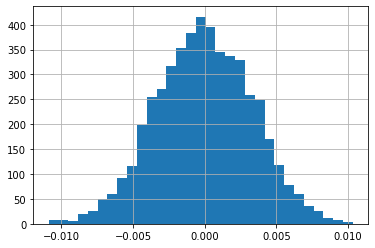

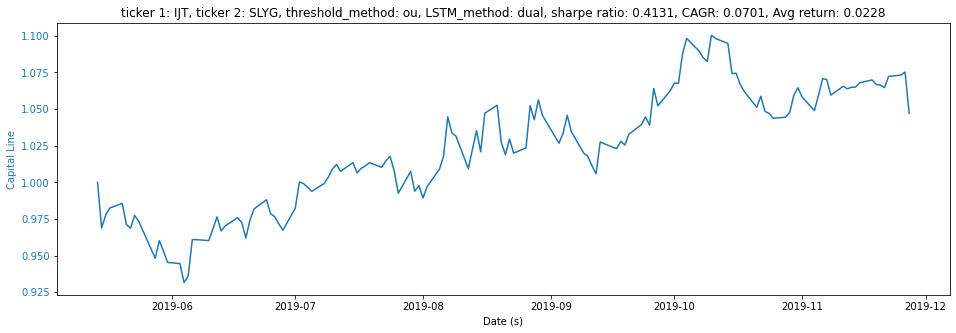

Annual return (dual+ou) :  0.07010085807729172
Sharpe ratio (dual+ou) : 0.4130857557207721
CAGR (dual+ou) :  0.07010085807729172
Avg_return (dual+ou) :  0.022812013122791637
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0320
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0118
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0086
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0078
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 9/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0040
Epoch 10/20
313/313

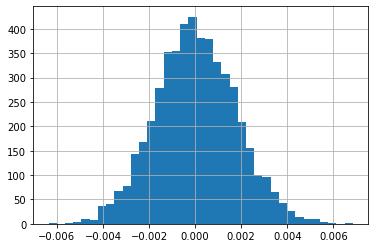

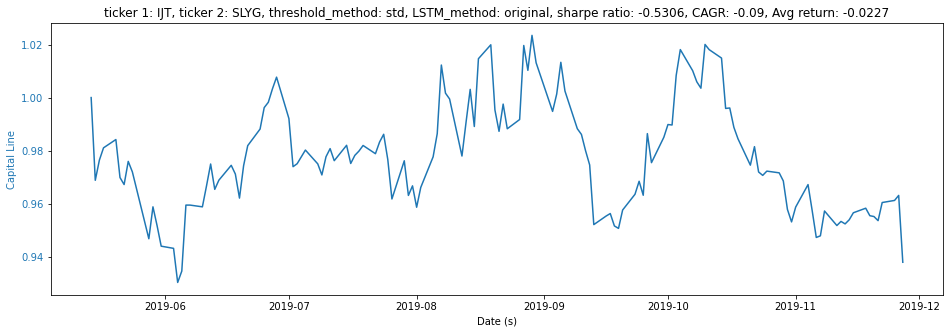

Annual return (std) :  -0.09003678689535799
Sharpe ratio (std) : -0.5305635463195377
CAGR (std) :  -0.09003678689535799
Avg_return (std) :  -0.022659842205470196
-------------------------------------
threshold:  0.24463840708543633
average return -0.023591
[-0.00396745  0.00403549]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


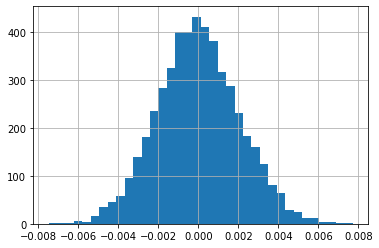

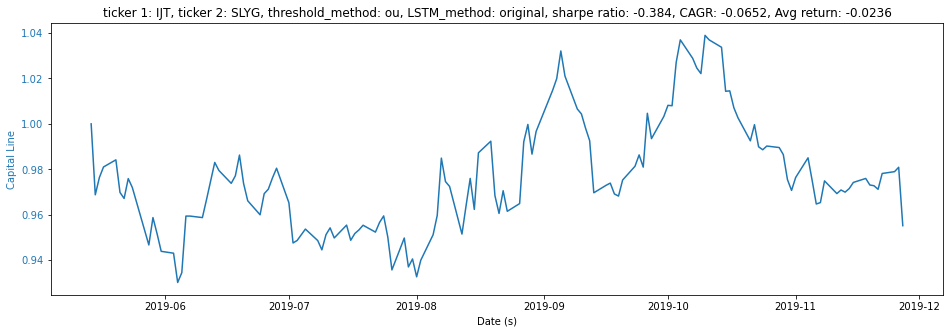

Annual return (ou) :  -0.06516804730457282
Sharpe ratio (ou) : -0.38401848263219357
CAGR (ou) :  -0.06516804730457282
Avg_return (ou) :  -0.02359095253537476
['IWM', 'VTWO']
Epoch 1/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0933
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0136
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0081
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0063
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0048
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0043
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 11/20
313

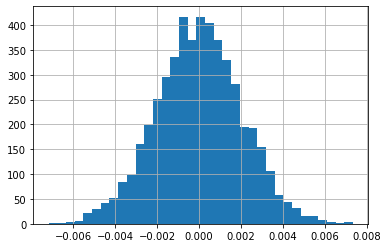

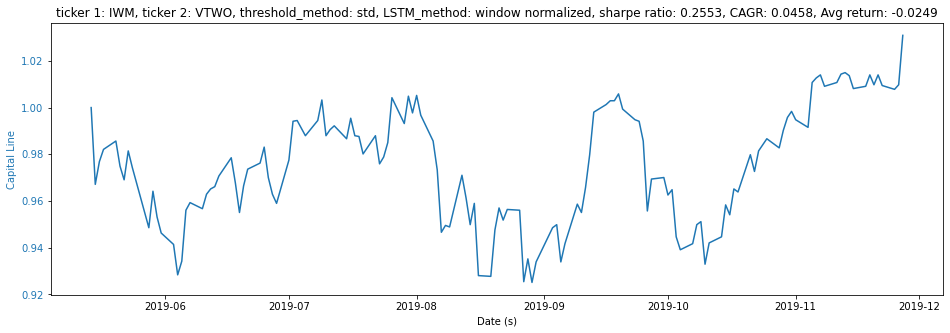

Annual return (std) :  0.045805464716959454
Sharpe ratio (std) : 0.25525987310435083
CAGR (std) :  0.045805464716959454
Avg_return (std) :  -0.02491321898989927
-------------------------------------
threshold:  0.3646447858464738
average return -0.044295
[-0.00413842  0.00401453]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


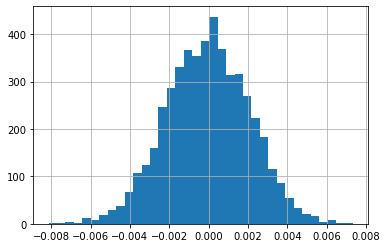

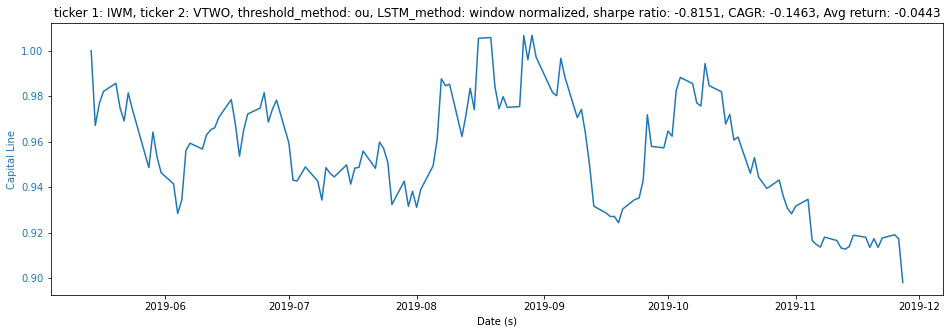

Annual return (ou) :  -0.14626995328438308
Sharpe ratio (ou) : -0.8151178018837345
CAGR (ou) :  -0.14626995328438308
Avg_return (ou) :  -0.04429453049408351
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 2ms/step - loss: 0.1364
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0208
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0104
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0076
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0056
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 10/20
313/31

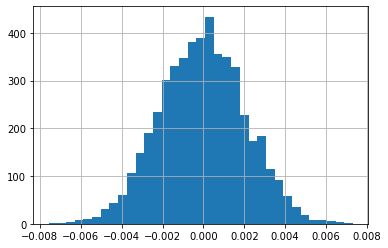

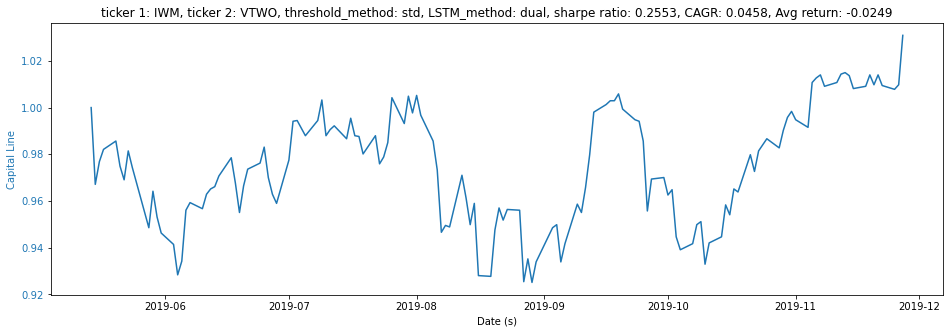

Annual return (dual+std) :  0.045805240961712235
Sharpe ratio (dual+std) : 0.2552582443999494
CAGR (dual+std) :  0.045805240961712235
Avg_return (dual+std) :  -0.024913360417028862
-------------------------------------
threshold:  0.4063375309486899
average return -0.044295
[-0.00414768  0.00416946]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


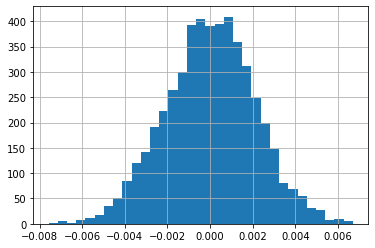

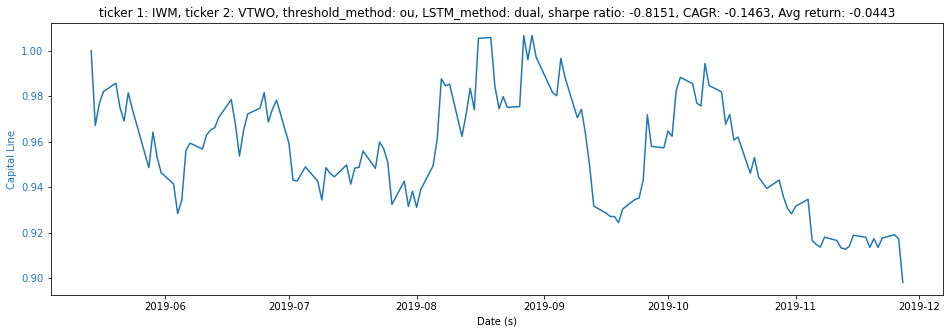

Annual return (dual+ou) :  -0.14627103377789974
Sharpe ratio (dual+ou) : -0.8151226039815314
CAGR (dual+ou) :  -0.14627103377789974
Avg_return (dual+ou) :  -0.04429522700614676
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0387
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0153
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0125
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0094
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0076
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0068
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 10/20
313/

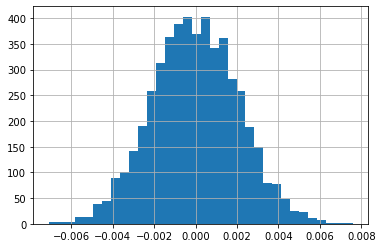

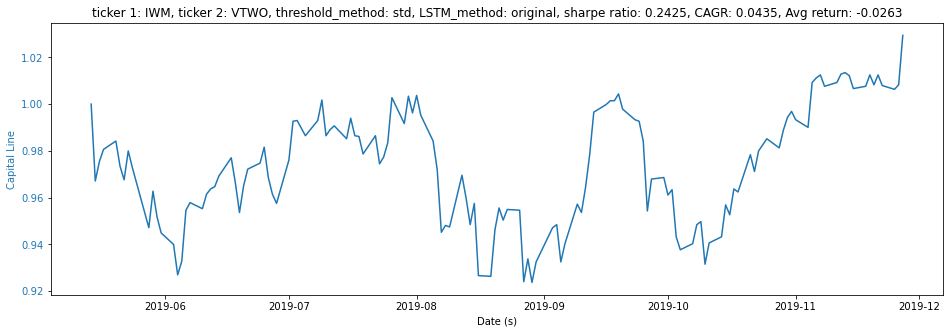

Annual return (std) :  0.04352258277891652
Sharpe ratio (std) : 0.24253807060073762
CAGR (std) :  0.04352258277891652
Avg_return (std) :  -0.02634007433595431
-------------------------------------
threshold:  0.2557432698176331
average return -0.027213
[-0.00386025  0.00392507]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


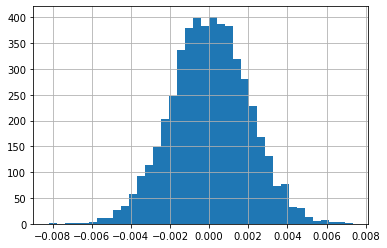

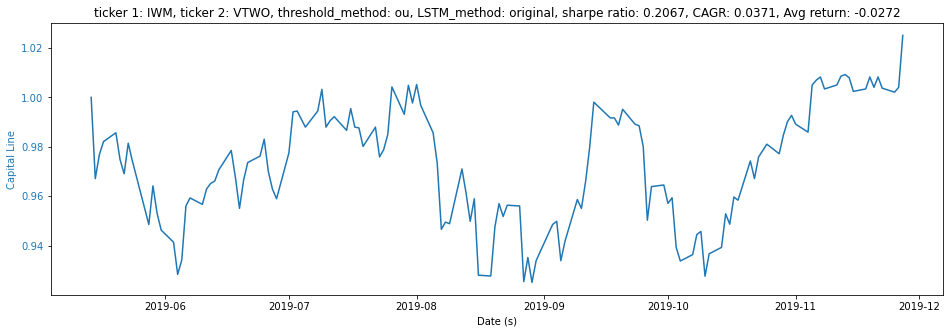

Annual return (ou) :  0.03709879996216725
Sharpe ratio (ou) : 0.2067402895212728
CAGR (ou) :  0.03709879996216725
Avg_return (ou) :  -0.0272126315603135
['IJS', 'SLYV']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1190
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0186
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0117
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0105
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0101
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0099
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0097
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0096A: 0s - lo
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0095
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0094
Epoch 11/2

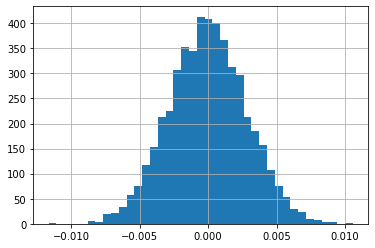

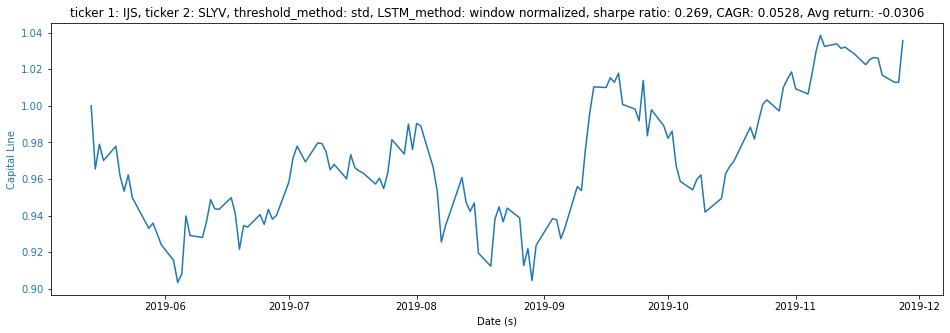

Annual return (std) :  0.05284528314402004
Sharpe ratio (std) : 0.2690390090049246
CAGR (std) :  0.05284528314402004
Avg_return (std) :  -0.030556484550210285
-------------------------------------
threshold:  0.30517438114056294
average return -0.030556
[-0.00557907  0.00565129]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


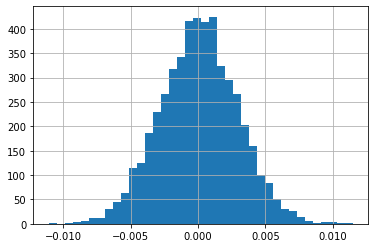

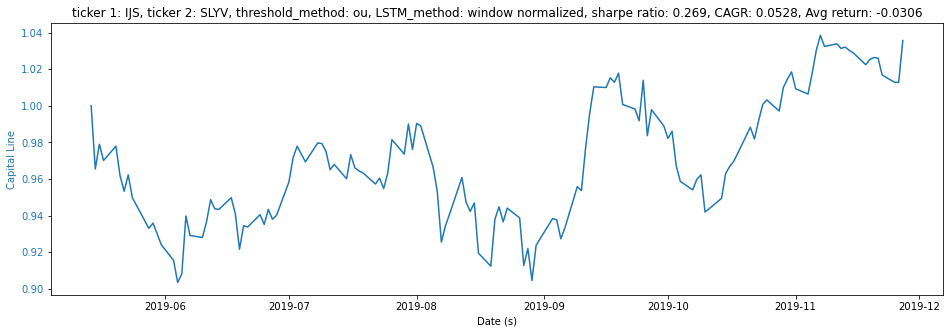

Annual return (ou) :  0.05284528314402004
Sharpe ratio (ou) : 0.2690390090049246
CAGR (ou) :  0.05284528314402004
Avg_return (ou) :  -0.030556484550210285
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0809
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0115
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0056
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 10/20
313/313 

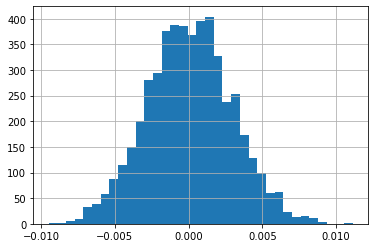

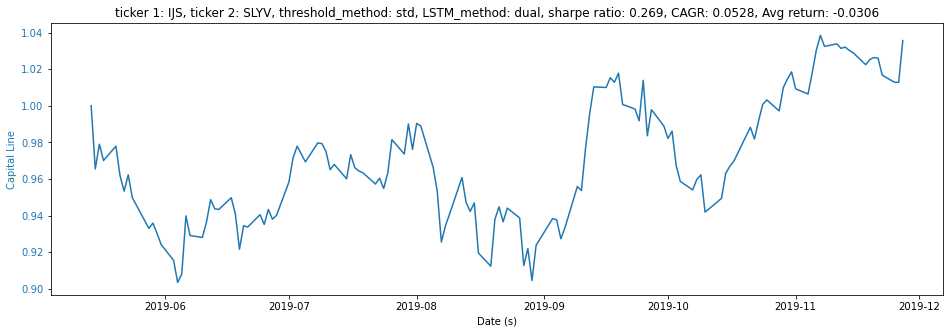

Annual return (dual+std) :  0.05284585159195676
Sharpe ratio (dual+std) : 0.2690420250693045
CAGR (dual+std) :  0.05284585159195676
Avg_return (dual+std) :  -0.030556287647195472
-------------------------------------
threshold:  0.2980156231411846
average return 0.020738
[-0.00645889  0.00664789]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


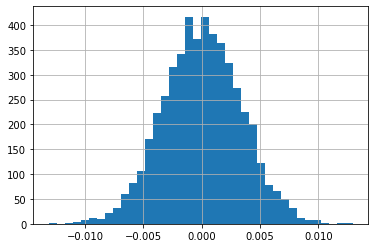

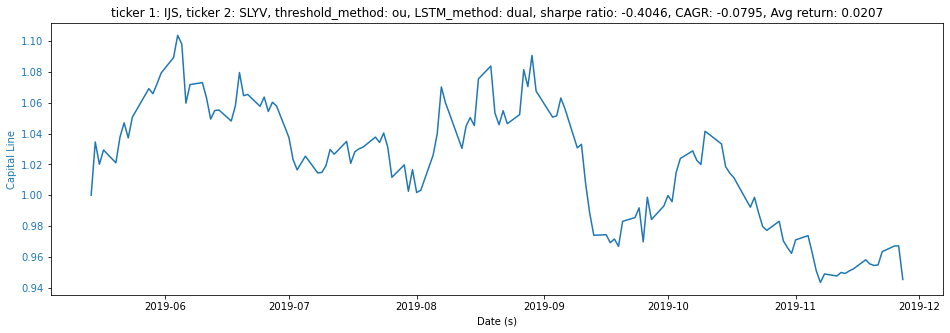

Annual return (dual+ou) :  -0.07946548985480728
Sharpe ratio (dual+ou) : -0.40456451489780954
CAGR (dual+ou) :  -0.07946548985480728
Avg_return (dual+ou) :  0.020738347674437947
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0328
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0159
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0104
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0084
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0060
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 10/20
313

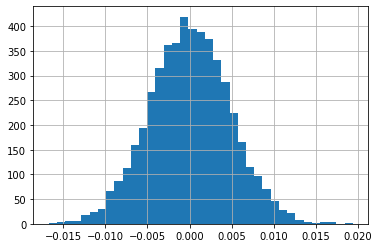

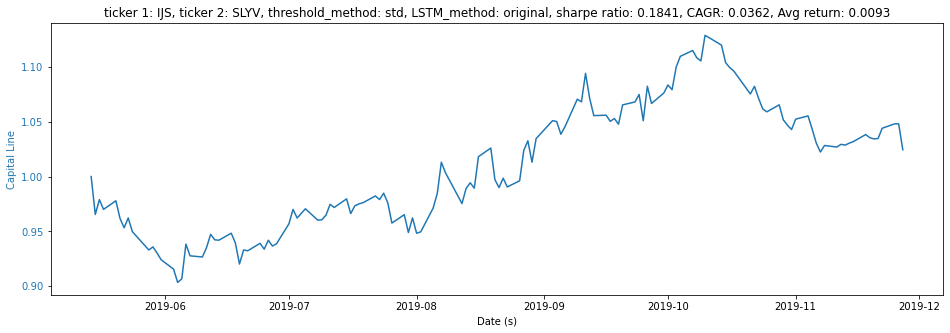

Annual return (std) :  0.036154890002343176
Sharpe ratio (std) : 0.1840670769473888
CAGR (std) :  0.036154890002343176
Avg_return (std) :  0.009274296642616484
-------------------------------------
threshold:  0.13909818342228397
average return 0.188966
[-0.01426686  0.01352806]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


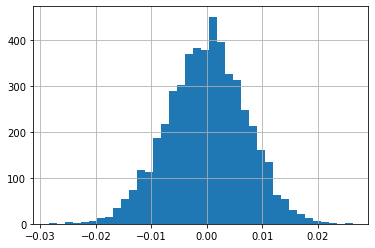

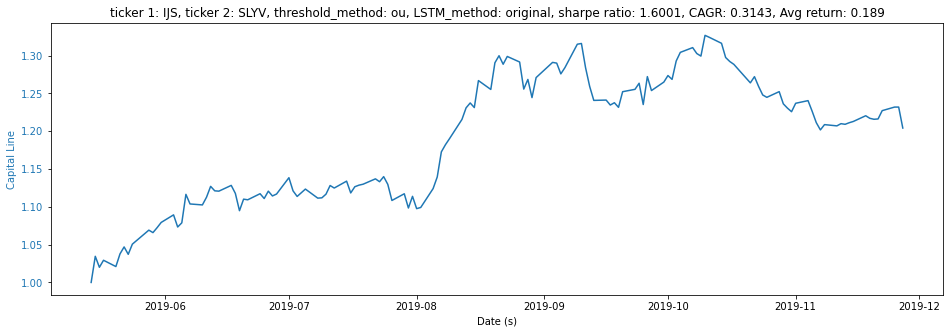

Annual return (ou) :  0.3142990224046569
Sharpe ratio (ou) : 1.6001183335835816
CAGR (ou) :  0.3142990224046567
Avg_return (ou) :  0.18896560450307157
['IWN', 'SLYV']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1109
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0185
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0101
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0073
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0036
Epoch 11/20
313/313 [=

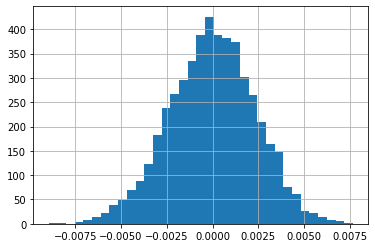

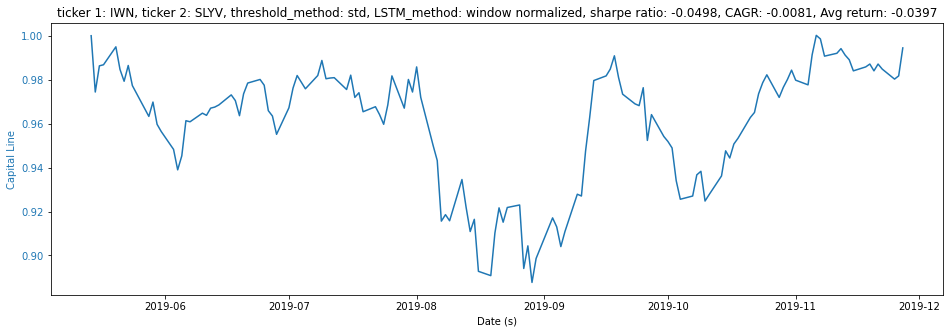

Annual return (std) :  -0.008147895855193488
Sharpe ratio (std) : -0.04980933168188631
CAGR (std) :  -0.008147895855193488
Avg_return (std) :  -0.03971118326198776
-------------------------------------
threshold:  0.6117718795430976
average return 0.024598
[-0.00500259  0.00507855]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


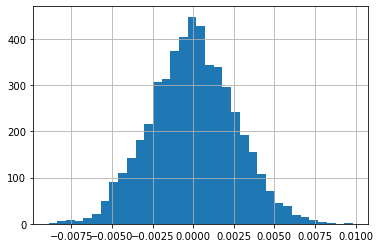

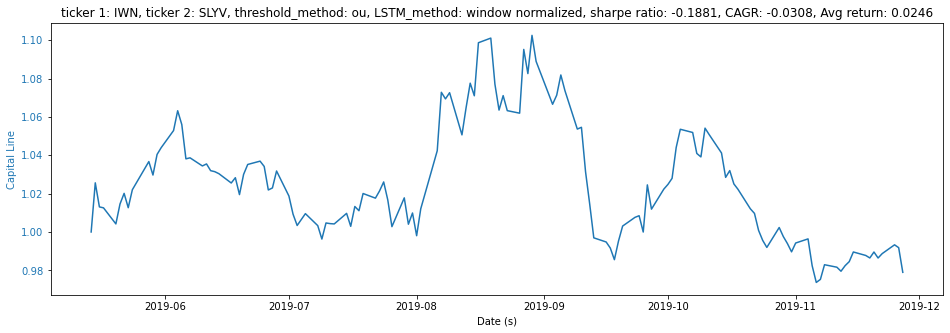

Annual return (ou) :  -0.030777420536709843
Sharpe ratio (ou) : -0.1881470719644435
CAGR (ou) :  -0.030777420536709843
Avg_return (ou) :  0.02459750586325966
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1044
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0125
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 8/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0038
Epoch 9/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0037
Epoch 10/20
313/3

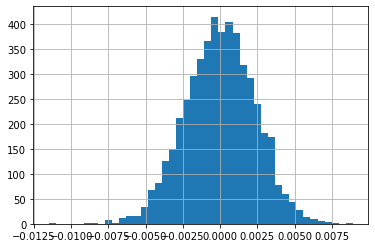

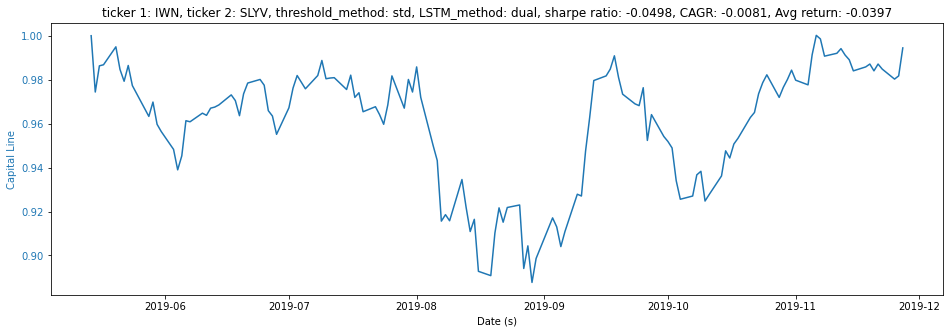

Annual return (dual+std) :  -0.00814817457253092
Sharpe ratio (dual+std) : -0.049810994154285484
CAGR (dual+std) :  -0.00814817457253092
Avg_return (dual+std) :  -0.03971130722479077
-------------------------------------
threshold:  0.6153967527287597
average return 0.024598
[-0.00484399  0.0050544 ]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


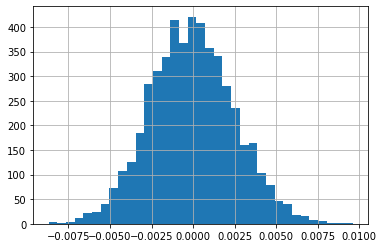

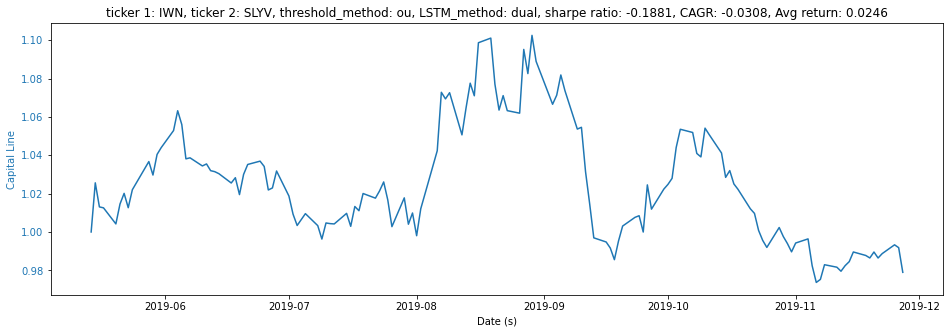

Annual return (dual+ou) :  -0.03077718314980349
Sharpe ratio (dual+ou) : -0.18814546452262057
CAGR (dual+ou) :  -0.03077718314980349
Avg_return (dual+ou) :  0.024597630269840017
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0427
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0253
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0162
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0123
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0099
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0083
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0077
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 10/20
313

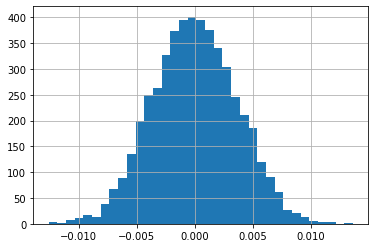

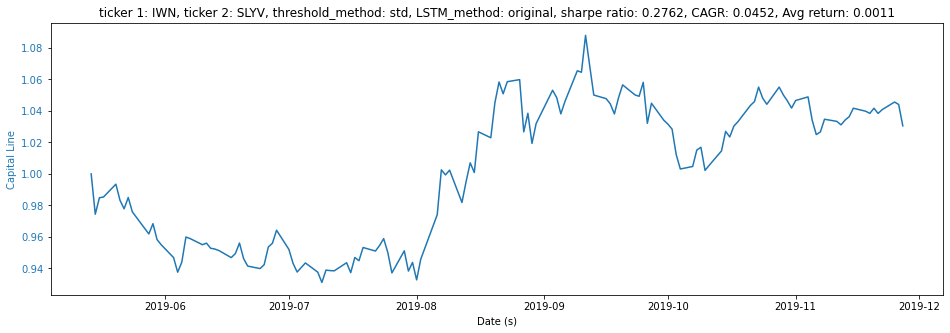

Annual return (std) :  0.04517416183870071
Sharpe ratio (std) : 0.27615646998742244
CAGR (std) :  0.04517416183870071
Avg_return (std) :  0.0010666883382816894
-------------------------------------
threshold:  0.4146603846513461
average return -0.035148
[-0.00439166  0.00432664]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


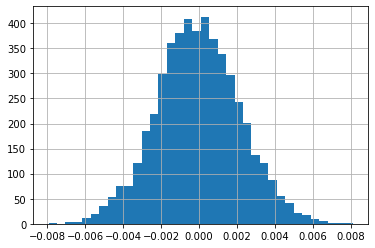

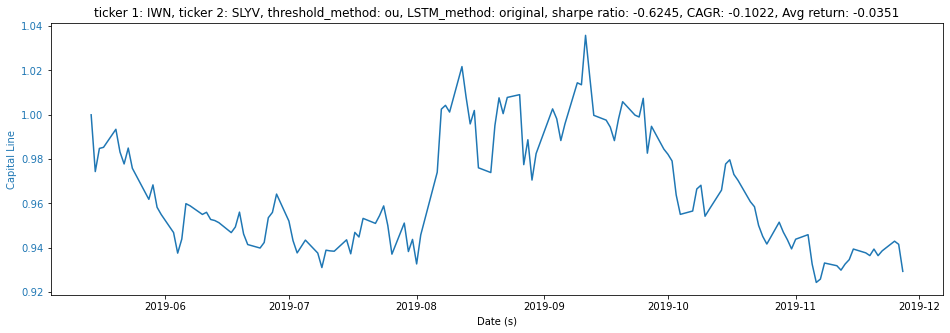

Annual return (ou) :  -0.10215012498318154
Sharpe ratio (ou) : -0.6244591327417262
CAGR (ou) :  -0.10215012498318154
Avg_return (ou) :  -0.03514757790751587
['IWN', 'VTWV']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1080
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0126
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050A: 0s - loss
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0038
Epoc

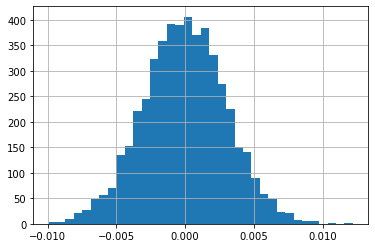

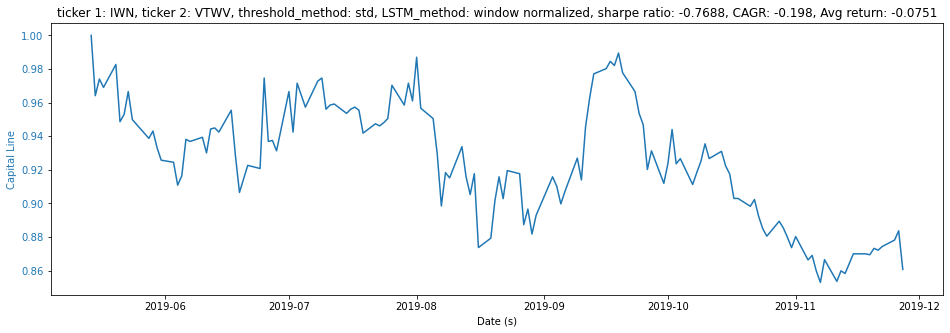

Annual return (std) :  -0.1979801177619187
Sharpe ratio (std) : -0.7688425827276402
CAGR (std) :  -0.1979801177619187
Avg_return (std) :  -0.07510649085793904
-------------------------------------
threshold:  0.3533372979064866
average return 0.031485
[-0.0062449   0.00636824]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


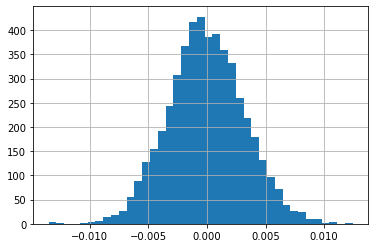

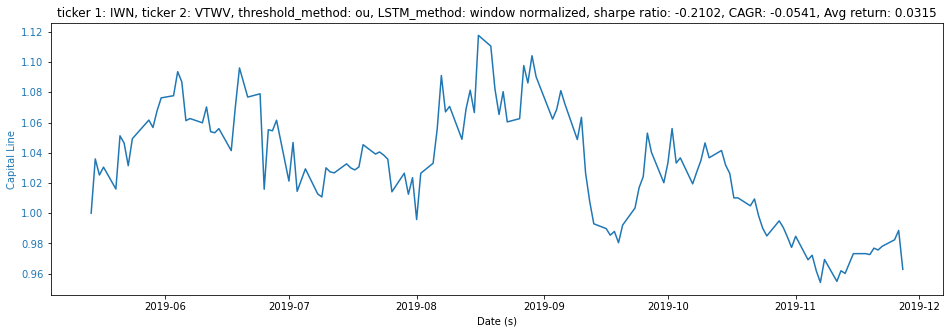

Annual return (ou) :  -0.05412879896692713
Sharpe ratio (ou) : -0.21020558058119498
CAGR (ou) :  -0.05412879896692713
Avg_return (ou) :  0.03148473813371394
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1095
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0197
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0115
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0072
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 10/20
313/31

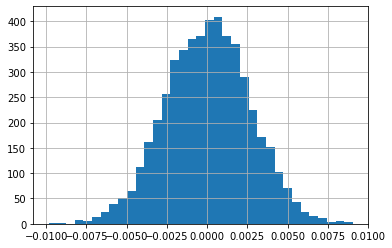

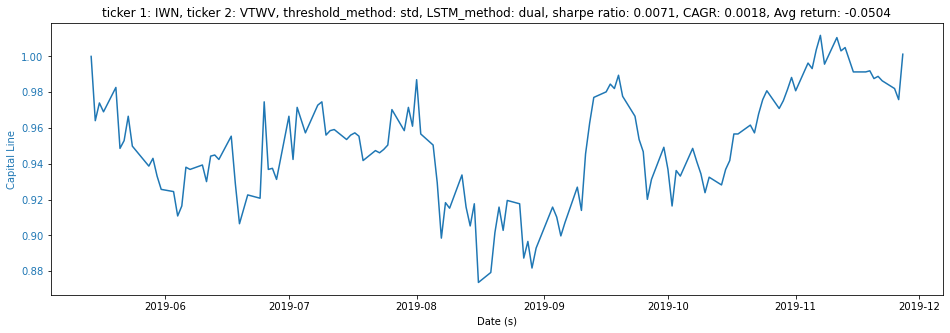

Annual return (dual+std) :  0.0018218600488406622
Sharpe ratio (dual+std) : 0.007075063982739002
CAGR (dual+std) :  0.0018218600488406622
Avg_return (dual+std) :  -0.050395598549537374
-------------------------------------
threshold:  0.3706160253801913
average return 0.031485
[-0.00638564  0.00642246]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


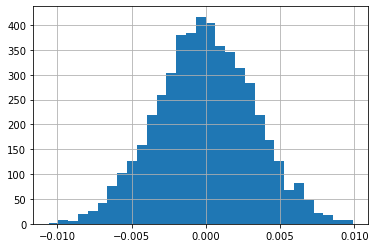

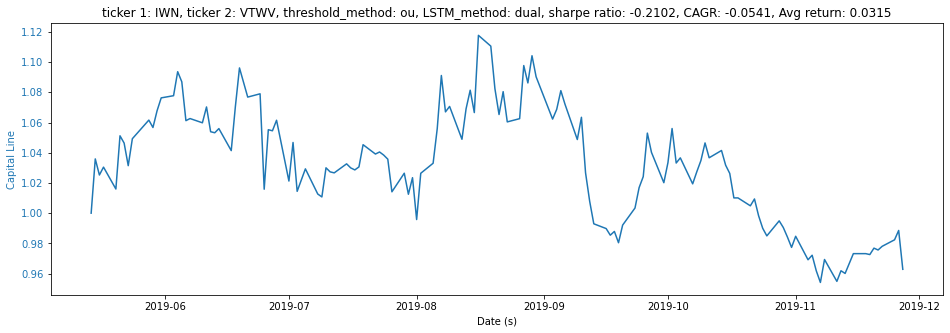

Annual return (dual+ou) :  -0.05412902028002875
Sharpe ratio (dual+ou) : -0.21020620219861585
CAGR (dual+ou) :  -0.05412902028002875
Avg_return (dual+ou) :  0.03148491960867693
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0319
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0181
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0120A: 0s - loss: 0.
Epoch 4/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0108
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0096
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0083
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0078
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0072
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0065


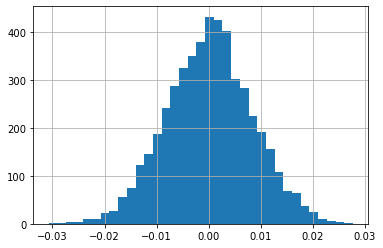

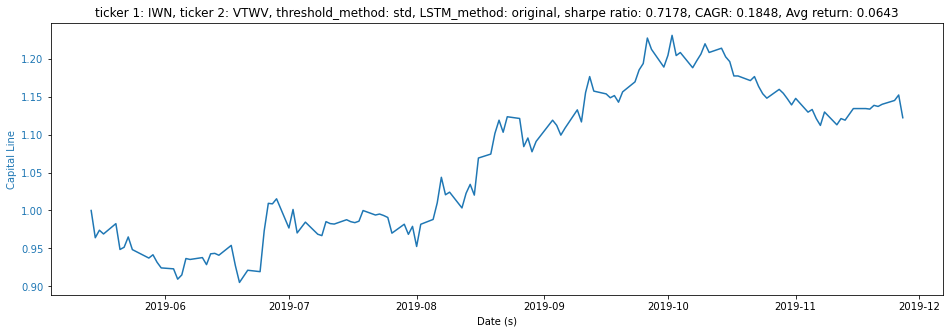

Annual return (std) :  0.184827779195343
Sharpe ratio (std) : 0.7177666077946028
CAGR (std) :  0.18482777919534277
Avg_return (std) :  0.06433163209024352
-------------------------------------
threshold:  0.24407024490960055
average return 0.064332
[-0.0158489   0.01653661]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


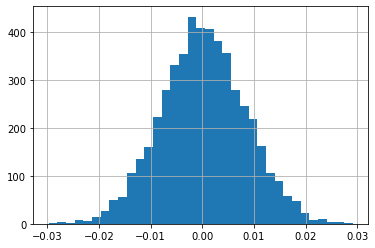

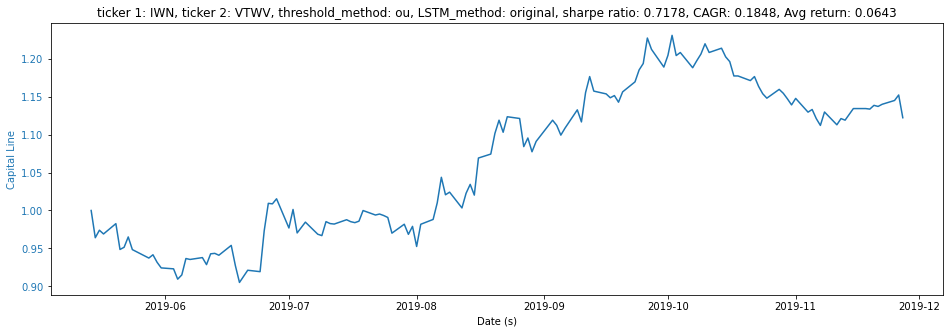

Annual return (ou) :  0.184827779195343
Sharpe ratio (ou) : 0.7177666077946028
CAGR (ou) :  0.18482777919534277
Avg_return (ou) :  0.06433163209024352
['SLYV', 'VTWV']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0895
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0131
Epoch 3/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0076
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 5/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0045
Epoch 6/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0041
Epoch 7/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0037
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0035
Epoch 9/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0034
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0033
Epoch 11/20
313/313 [

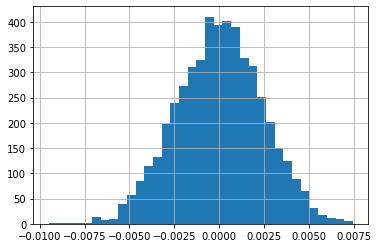

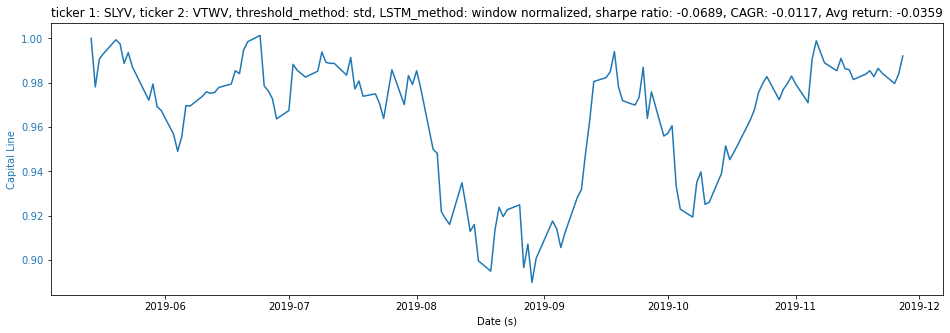

Annual return (std) :  -0.011709332566982478
Sharpe ratio (std) : -0.06890253765429166
CAGR (std) :  -0.011709332566982478
Avg_return (std) :  -0.035888491558040456
-------------------------------------
threshold:  0.5318403111717367
average return -0.025107
[-0.0045292   0.00449317]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


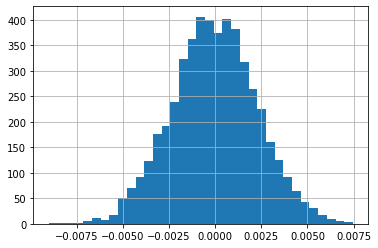

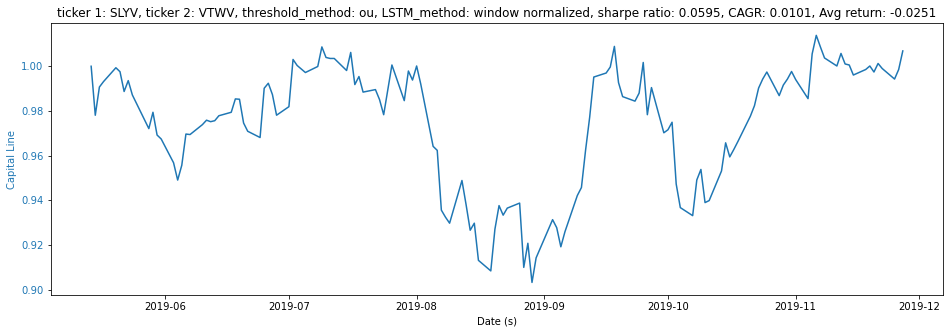

Annual return (ou) :  0.010115416784188147
Sharpe ratio (ou) : 0.05952328041537473
CAGR (ou) :  0.010115416784188147
Avg_return (ou) :  -0.025107372193052285
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0760
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0121
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0073
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0048
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 10/20
313/3

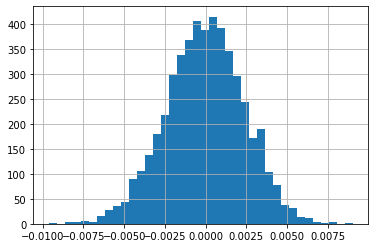

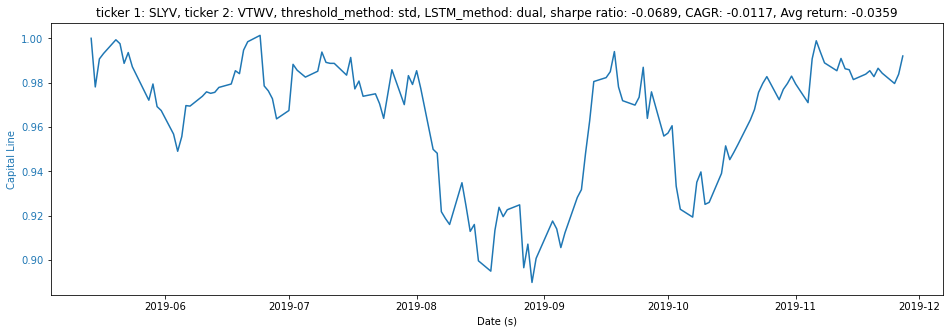

Annual return (dual+std) :  -0.011708921822441432
Sharpe ratio (dual+std) : -0.06890005467073473
CAGR (dual+std) :  -0.011708921822441432
Avg_return (dual+std) :  -0.03588839305148519
-------------------------------------
threshold:  0.5367539325049723
average return 0.028833
[-0.00553572  0.0056948 ]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


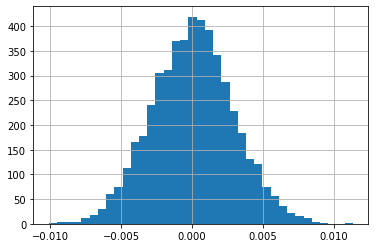

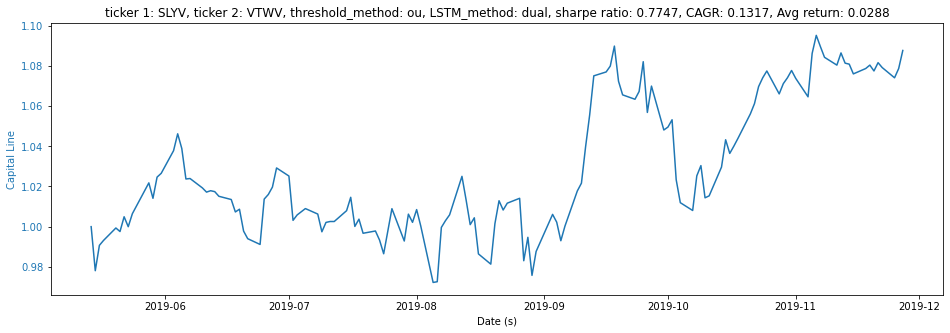

Annual return (dual+ou) :  0.13165492415528135
Sharpe ratio (dual+ou) : 0.7747110801085625
CAGR (dual+ou) :  0.13165492415528135
Avg_return (dual+ou) :  0.028832896406959657
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 4ms/step - loss: 0.0402
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0134
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0099
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0070
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058A: 0s - 
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 10/20

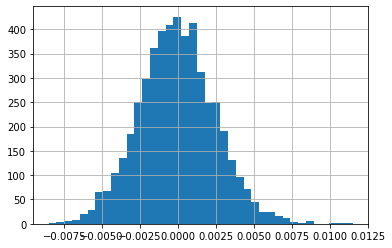

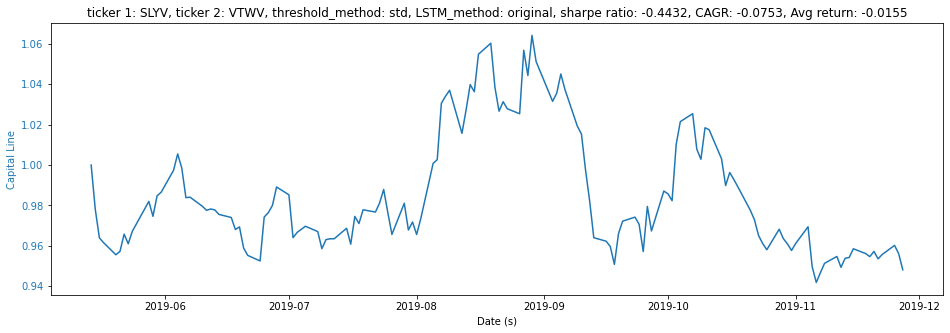

Annual return (std) :  -0.07531996916669481
Sharpe ratio (std) : -0.44321388295439296
CAGR (std) :  -0.07531996916669481
Avg_return (std) :  -0.015546925509843448
-------------------------------------
threshold:  0.3430985343197811
average return -0.034836
[-0.00470775  0.00510282]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


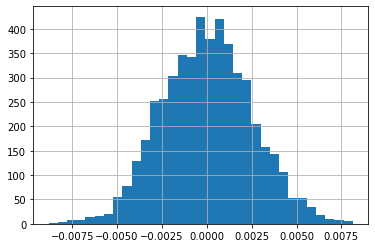

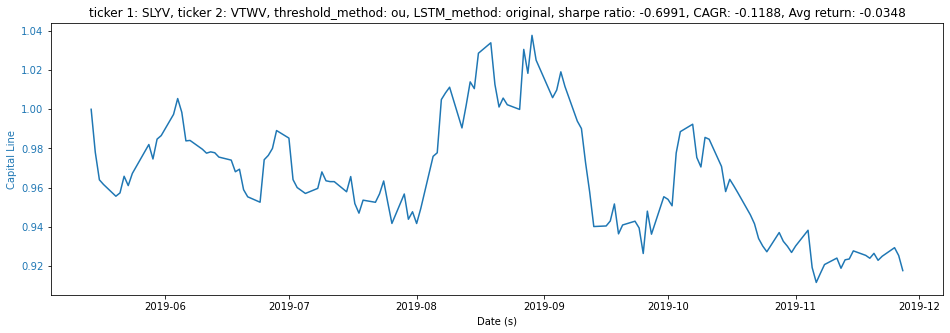

Annual return (ou) :  -0.11880125923832152
Sharpe ratio (ou) : -0.6990757960927416
CAGR (ou) :  -0.11880125923832141
Avg_return (ou) :  -0.034836258707107


In [16]:
## Get data
# interval: 1m,2m,5m,15m,30m,60m,90m,1h,1d,5d,1wk,1mo,3mo
# The 1m data is only retrievable for the last 7 days, and anything interval <1d only for the last 60 days.
INTERVAL = '1d'
TEST_RATIO = 0.33
BATCH_SIZE = 5
# start and end date of the data
START = "2017-11-10"
END = "2019-11-29"
# look back window size
# LOOK_BACK = 30
LOOK_BACK = 5


for TICKER_PAIR in TICKER_PAIRS:
    # Run all methods of LSTM separately for each ticker pair
    print(TICKER_PAIR)
    run_window_normalize_training_workflow(TICKER_PAIR, INTERVAL, TEST_RATIO, BATCH_SIZE, LOOK_BACK, START, END)
    print("========================↑ single(window normalised), ↓ dual====================================")
    run_dual_training_workflow(TICKER_PAIR, INTERVAL, TEST_RATIO, BATCH_SIZE, LOOK_BACK, START, END)
    print("========================↑ dual, ↓ single ====================================")
    run_training_workflow(TICKER_PAIR, INTERVAL, TEST_RATIO, BATCH_SIZE, LOOK_BACK, START, END)

ticker_file.close()


In [22]:
'''
Small Capitcal section (kmeans)
'''
TICKER_PAIRS = []
# change the file name here to get the ticker pairs outputted by co-integration from either kmeans or DBSCAN. 
ticker_file = open("Small Cap_kmeans.csv", "r")
lines = ticker_file.readlines()
count = 0
# Strips the newline character 
for line in lines: 
    if count > 0:
        new_pair = []
        new_pair = [line.split(",")[2].strip(), line.split(",")[3].strip()]
        TICKER_PAIRS.append(new_pair)
    count += 1
print(TICKER_PAIRS)

[['PSC', 'RNSC'], ['PSC', 'XSHQ'], ['RNSC', 'SMCP'], ['RNSC', 'XSHQ'], ['DGS', 'FYC'], ['DGS', 'IJT'], ['DGS', 'IWO'], ['DGS', 'SLYG'], ['GSSC', 'SMLF'], ['GSSC', 'USVM'], ['IJT', 'SLYG'], ['IWM', 'VTWO'], ['IWO', 'VTWG'], ['JHSC', 'NUSC'], ['JHSC', 'SCHA'], ['NUSC', 'SCHA'], ['NUSC', 'SMLF'], ['CALF', 'EES'], ['CALF', 'EWSC'], ['CALF', 'FYT'], ['CSA', 'CSB'], ['CSA', 'DGRS'], ['CSA', 'FNDA'], ['CSA', 'OMFS'], ['CSA', 'SLYV'], ['CSB', 'DGRS'], ['CSB', 'OMFS'], ['CSB', 'SMLV'], ['DES', 'FYT'], ['DGRS', 'OMFS'], ['EES', 'EWSC'], ['EWSC', 'SLYV'], ['EWSC', 'XSHD'], ['FNDA', 'OMFS'], ['FYT', 'IWN'], ['IJS', 'SLYV'], ['IWN', 'SLYV'], ['IWN', 'VTWV'], ['JKJ', 'OMFS'], ['JKL', 'RZV'], ['OMFS', 'OUSM'], ['OMFS', 'SMLV'], ['OMFS', 'XSLV'], ['OUSM', 'SMLV'], ['RWJ', 'RZV'], ['SLYV', 'VTWV'], ['SMLV', 'XSLV']]


In [23]:
print(len(TICKER_PAIRS))

47


['PSC', 'RNSC']
Epoch 1/20
214/214 [==============================] - 1s 3ms/step - loss: 0.1342
Epoch 2/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0337
Epoch 3/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 4/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0148
Epoch 5/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0129
Epoch 6/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0121
Epoch 7/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0114
Epoch 8/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0107
Epoch 9/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0105
Epoch 10/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0102
Epoch 11/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0100
Epoch 12/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0099
Epoch 13/

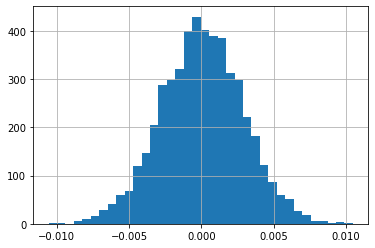

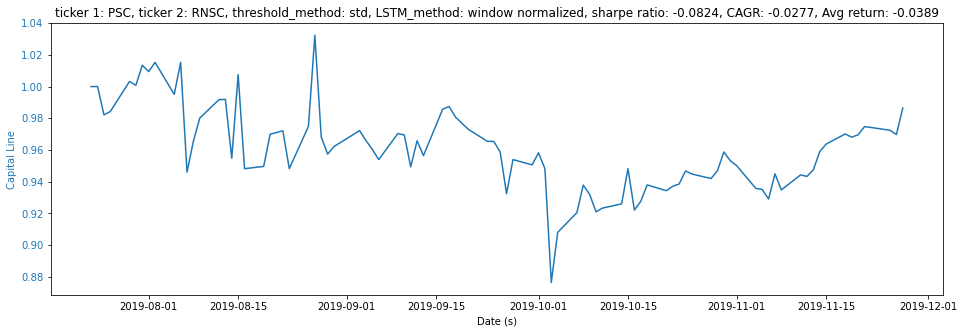

Annual return (std) :  -0.027699790804916913
Sharpe ratio (std) : -0.08236244718920521
CAGR (std) :  -0.027699790804916913
Avg_return (std) :  -0.038926384619437905
-------------------------------------
threshold:  0.33115906498998204
average return -0.044800
[-0.00595149  0.00585893]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


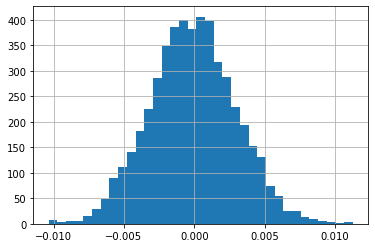

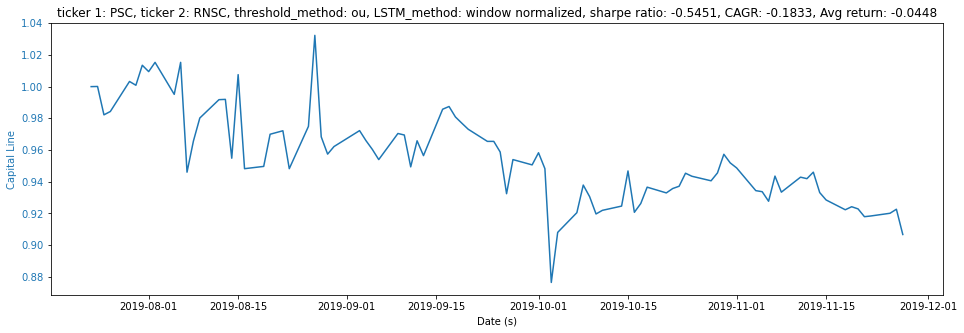

Annual return (ou) :  -0.1833353813412848
Sharpe ratio (ou) : -0.5451286895984073
CAGR (ou) :  -0.1833353813412849
Avg_return (ou) :  -0.04480032251023962
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
214/214 [==============================] - 1s 3ms/step - loss: 0.1731
Epoch 2/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0573
Epoch 3/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0276
Epoch 4/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0177
Epoch 5/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0132
Epoch 6/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0116
Epoch 7/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0105
Epoch 8/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0091
Epoch 9/20
214/214 [==============================] - 0s 1ms/step - loss: 0.0086
Epoch 10/20
214/214 

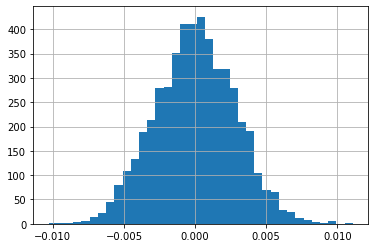

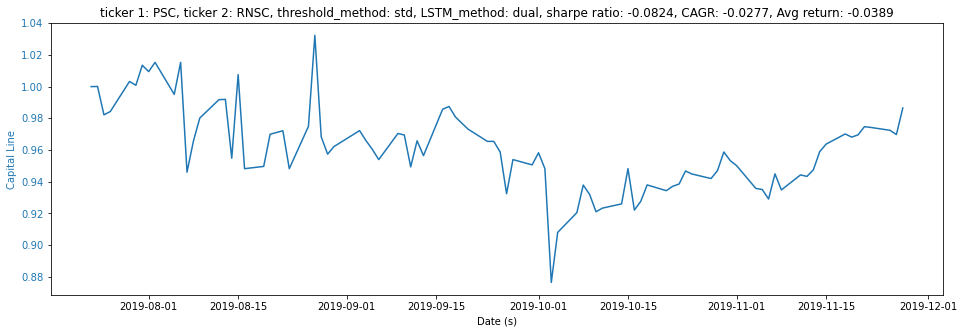

Annual return (dual+std) :  -0.027701319969547056
Sharpe ratio (dual+std) : -0.0823670239871238
CAGR (dual+std) :  -0.027701319969547056
Avg_return (dual+std) :  -0.03892656154184148
-------------------------------------
threshold:  0.3436001203258603
average return -0.049865
[-0.0073753   0.00724094]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


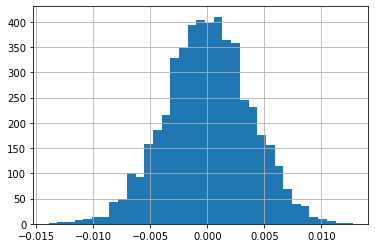

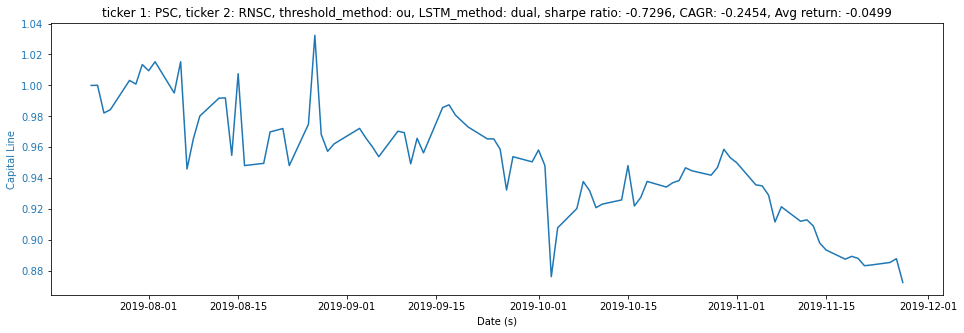

Annual return (dual+ou) :  -0.2453594325668491
Sharpe ratio (dual+ou) : -0.7295510210314066
CAGR (dual+ou) :  -0.2453594325668491
Avg_return (dual+ou) :  -0.049865291327041136
========================↑ dual, ↓ single ====================================
Epoch 1/20
214/214 [==============================] - 1s 3ms/step - loss: 0.0324
Epoch 2/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0263
Epoch 3/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0224
Epoch 4/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0186
Epoch 5/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0148
Epoch 6/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0131
Epoch 7/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0114
Epoch 8/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0097
Epoch 9/20
214/214 [==============================] - 0s 2ms/step - loss: 0.0086
Epoch 10/20
214/2

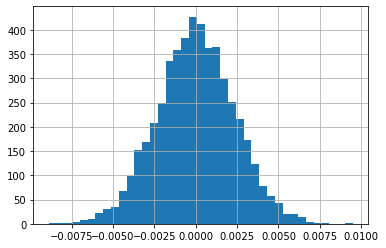

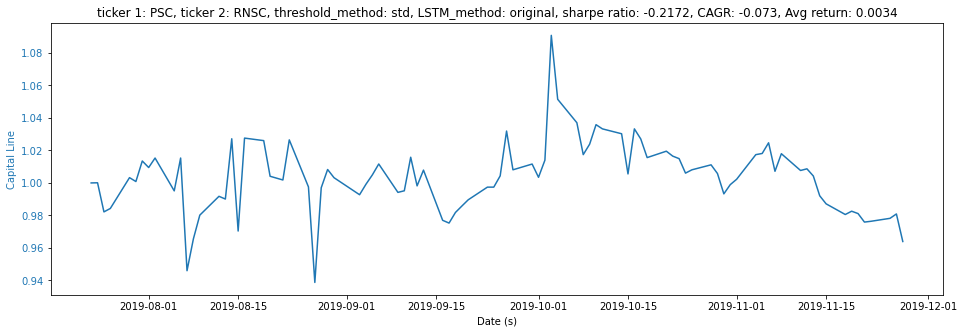

Annual return (std) :  -0.07304062832545022
Sharpe ratio (std) : -0.21717873998469447
CAGR (std) :  -0.07304062832545022
Avg_return (std) :  0.0033547580051913163
-------------------------------------
threshold:  0.2204510069046891
average return 0.064944
[-0.01574851  0.01585702]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


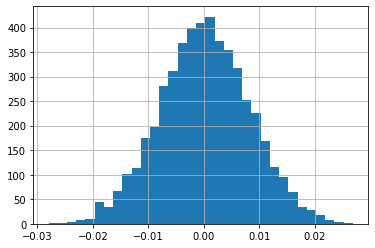

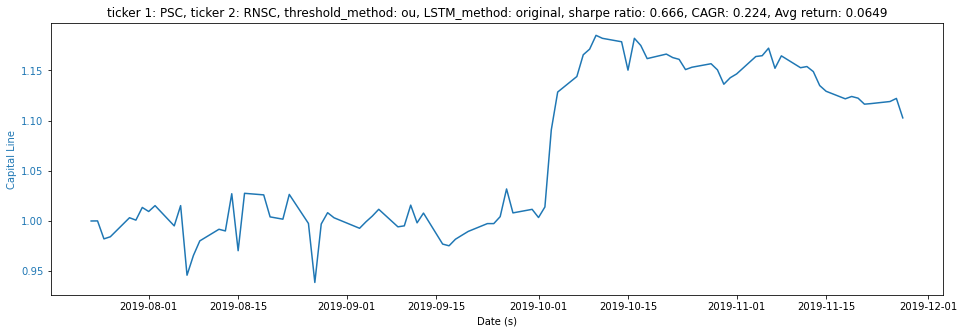

Annual return (ou) :  0.2239858710857776
Sharpe ratio (ou) : 0.665998778652806
CAGR (ou) :  0.2239858710857776
Avg_return (ou) :  0.0649444343324034
['PSC', 'XSHQ']
Epoch 1/20
210/210 [==============================] - 1s 3ms/step - loss: 0.2206
Epoch 2/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0992
Epoch 3/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0646
Epoch 4/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0514
Epoch 5/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0457
Epoch 6/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0437
Epoch 7/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0426
Epoch 8/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0415
Epoch 9/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0397
Epoch 10/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0363
Epoch 11/20
210/210 [===

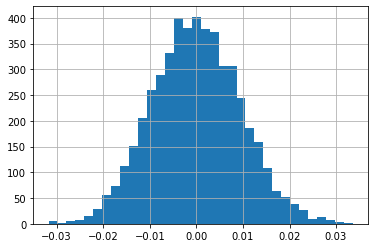

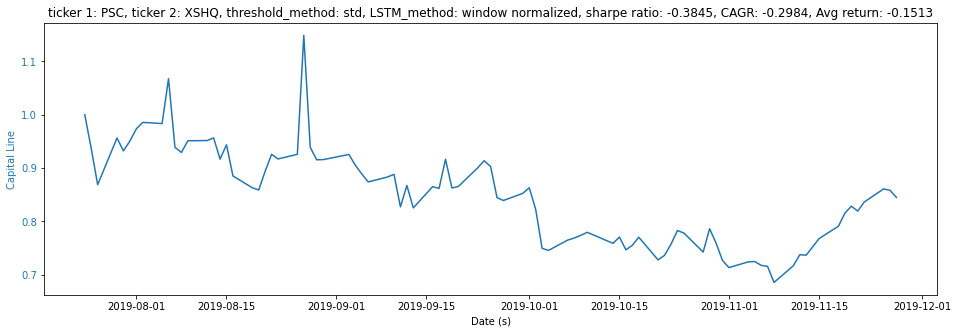

Annual return (std) :  -0.29839019593095384
Sharpe ratio (std) : -0.3845319457586379
CAGR (std) :  -0.29839019593095384
Avg_return (std) :  -0.15125523408497205
-------------------------------------
threshold:  0.3688926423399301
average return -0.160442
[-0.02025002  0.0207884 ]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


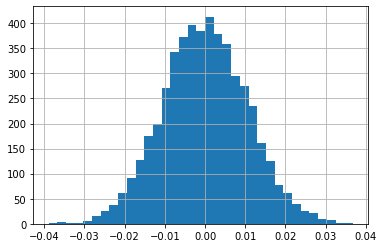

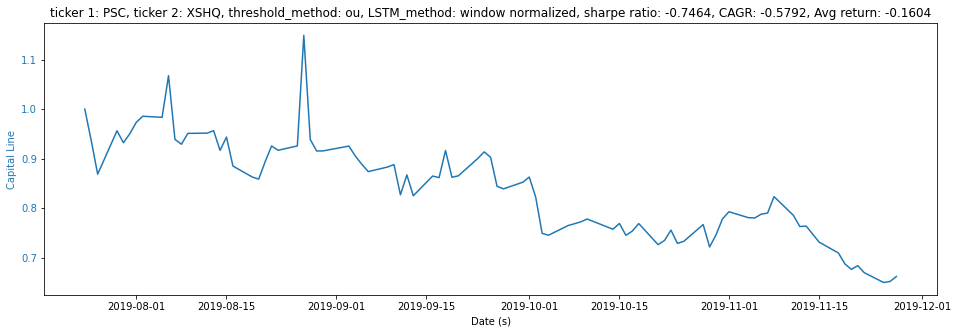

Annual return (ou) :  -0.5791643775002194
Sharpe ratio (ou) : -0.7463623404228171
CAGR (ou) :  -0.5791643775002194
Avg_return (ou) :  -0.1604418177923508
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
210/210 [==============================] - 1s 3ms/step - loss: 0.1009
Epoch 2/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0263
Epoch 3/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0133
Epoch 4/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0099
Epoch 5/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0087
Epoch 6/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0079
Epoch 7/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0075
Epoch 8/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0072
Epoch 9/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0072
Epoch 10/20
210/210 [

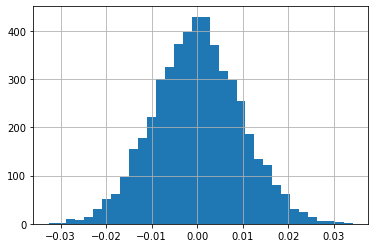

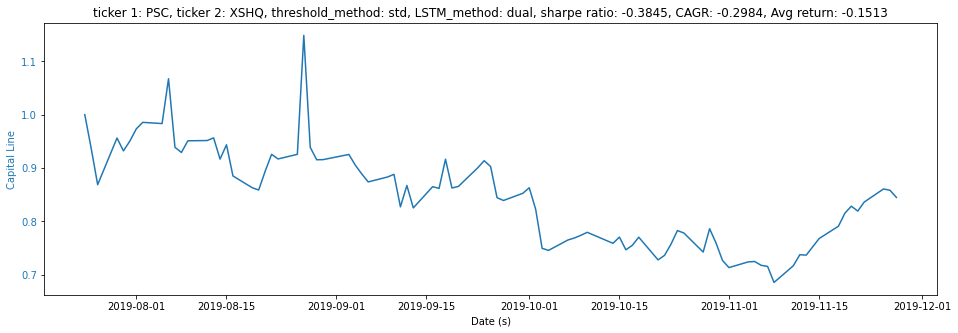

Annual return (dual+std) :  -0.29839100556691467
Sharpe ratio (dual+std) : -0.3845334979859563
CAGR (dual+std) :  -0.29839100556691467
Avg_return (dual+std) :  -0.15125567519826155
-------------------------------------
threshold:  0.35796839120535284
average return -0.160442
[-0.02034742  0.02158105]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


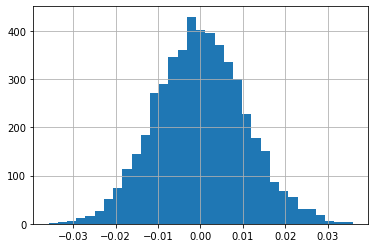

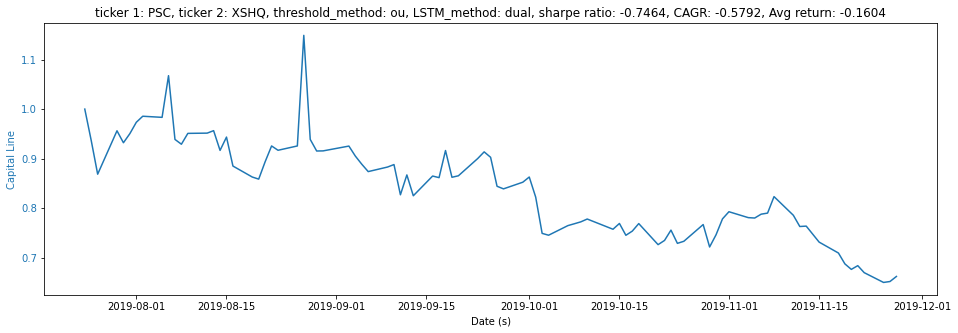

Annual return (dual+ou) :  -0.5791648607020019
Sharpe ratio (dual+ou) : -0.7463639507939097
CAGR (dual+ou) :  -0.5791648607020019
Avg_return (dual+ou) :  -0.16044225526318184
========================↑ dual, ↓ single ====================================
Epoch 1/20
210/210 [==============================] - 1s 3ms/step - loss: 0.0299
Epoch 2/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0214
Epoch 3/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0180
Epoch 4/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0155
Epoch 5/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0147
Epoch 6/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0137
Epoch 7/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0136
Epoch 8/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0114
Epoch 9/20
210/210 [==============================] - 0s 2ms/step - loss: 0.0105
Epoch 10/20
210/21

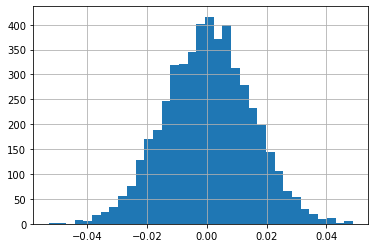

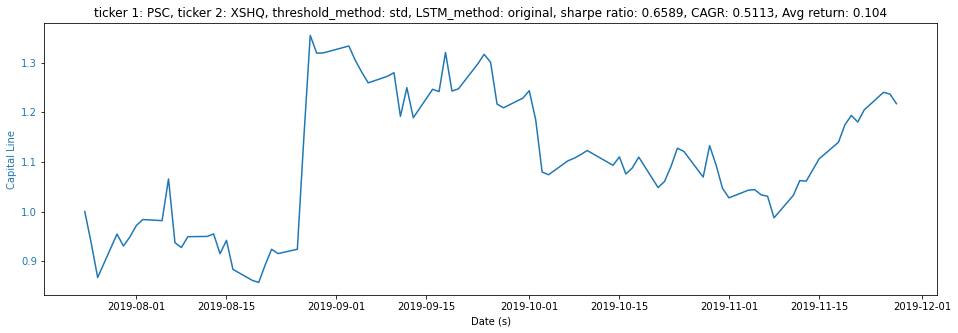

Annual return (std) :  0.5112840151633389
Sharpe ratio (std) : 0.6588856955352901
CAGR (std) :  0.5112840151633389
Avg_return (std) :  0.10403501130890933
-------------------------------------
threshold:  0.19935767005062224
average return 0.104035
[-0.02795931  0.02724029]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


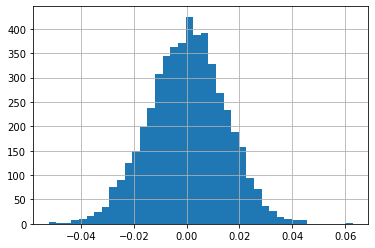

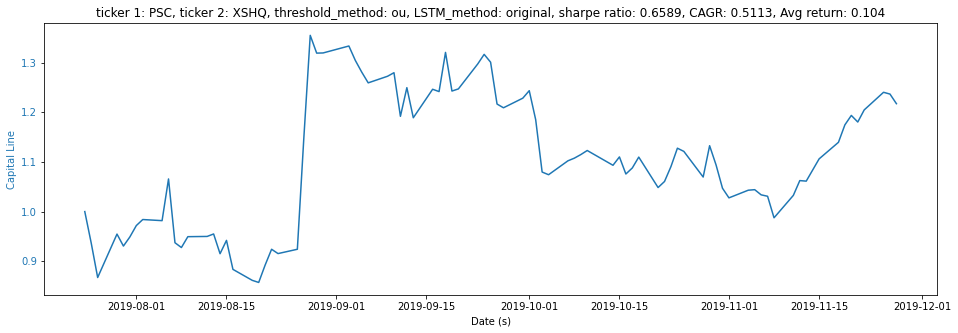

Annual return (ou) :  0.5112840151633389
Sharpe ratio (ou) : 0.6588856955352901
CAGR (ou) :  0.5112840151633389
Avg_return (ou) :  0.10403501130890933
['RNSC', 'SMCP']
Epoch 1/20
215/215 [==============================] - 1s 3ms/step - loss: 0.2602
Epoch 2/20
215/215 [==============================] - 0s 2ms/step - loss: 0.1279
Epoch 3/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0849
Epoch 4/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0697
Epoch 5/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0616A: 0s - loss: 0
Epoch 6/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0590
Epoch 7/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0574
Epoch 8/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0562
Epoch 9/20
215/215 [==============================] - 1s 3ms/step - loss: 0.0553
Epoch 10/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0544
Epoch 

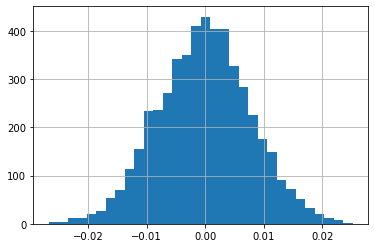

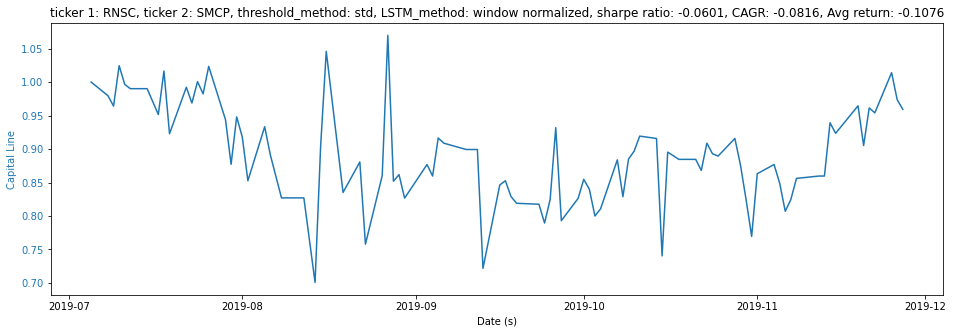

Annual return (std) :  -0.08162529571080446
Sharpe ratio (std) : -0.060089337160337916
CAGR (std) :  -0.08162529571080446
Avg_return (std) :  -0.10762307838553505
-------------------------------------
threshold:  0.2773041543967937
average return -0.107623
[-0.01510332  0.01475704]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


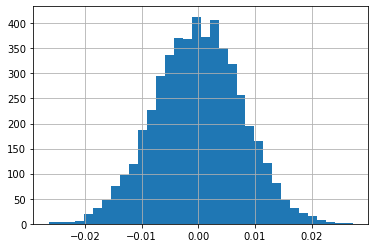

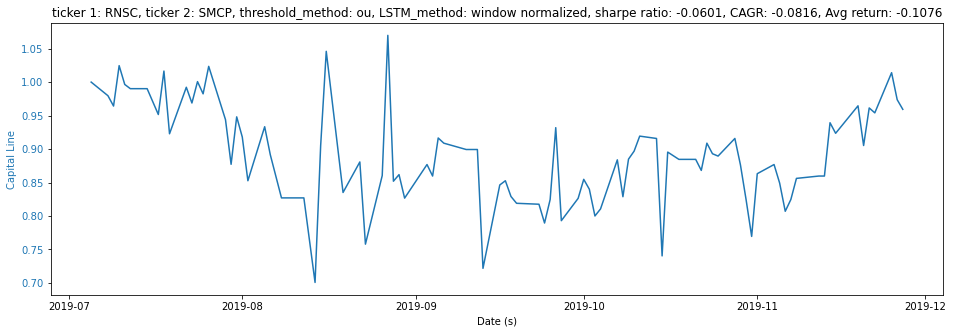

Annual return (ou) :  -0.08162529571080446
Sharpe ratio (ou) : -0.060089337160337916
CAGR (ou) :  -0.08162529571080446
Avg_return (ou) :  -0.10762307838553505
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
215/215 [==============================] - 1s 3ms/step - loss: 0.1410
Epoch 2/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0435
Epoch 3/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0213
Epoch 4/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0149
Epoch 5/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0105
Epoch 6/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0082
Epoch 7/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0074
Epoch 8/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0070
Epoch 9/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0066
Epoch 10/20
215/

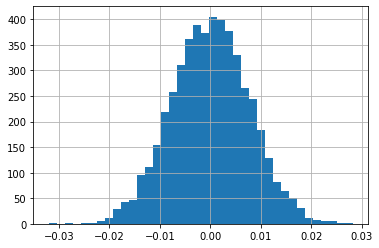

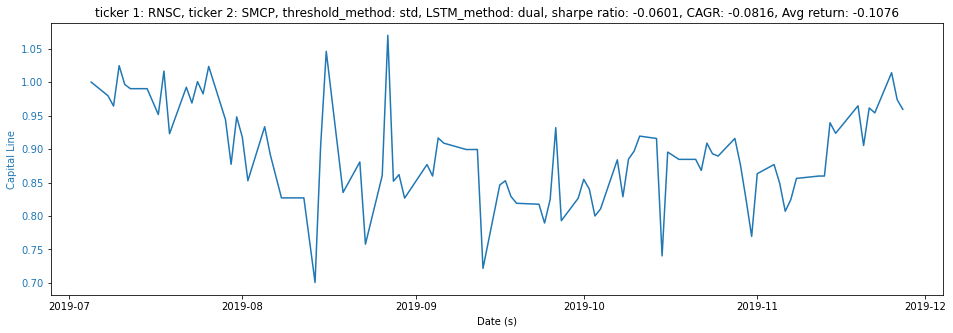

Annual return (dual+std) :  -0.08162426293146885
Sharpe ratio (dual+std) : -0.06008854108390926
CAGR (dual+std) :  -0.08162426293146885
Avg_return (dual+std) :  -0.10762251419987334
-------------------------------------
threshold:  0.2889731109276571
average return -0.107623
[-0.0148101   0.01545059]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


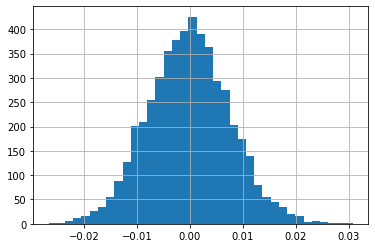

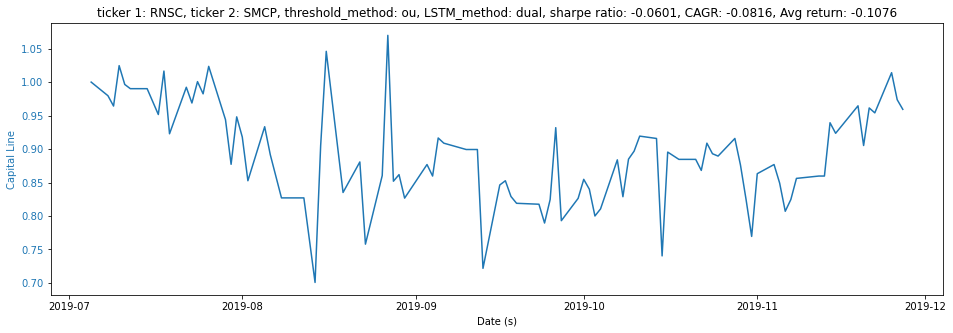

Annual return (dual+ou) :  -0.08162426293146885
Sharpe ratio (dual+ou) : -0.06008854108390926
CAGR (dual+ou) :  -0.08162426293146885
Avg_return (dual+ou) :  -0.10762251419987334
========================↑ dual, ↓ single ====================================
Epoch 1/20
215/215 [==============================] - 1s 3ms/step - loss: 0.0643
Epoch 2/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0272
Epoch 3/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0123
Epoch 4/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0099
Epoch 5/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0089
Epoch 6/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0098
Epoch 7/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0088
Epoch 8/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0079
Epoch 9/20
215/215 [==============================] - 0s 2ms/step - loss: 0.0073
Epoch 10/20
215

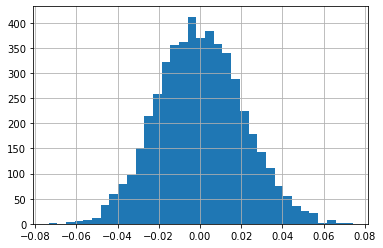

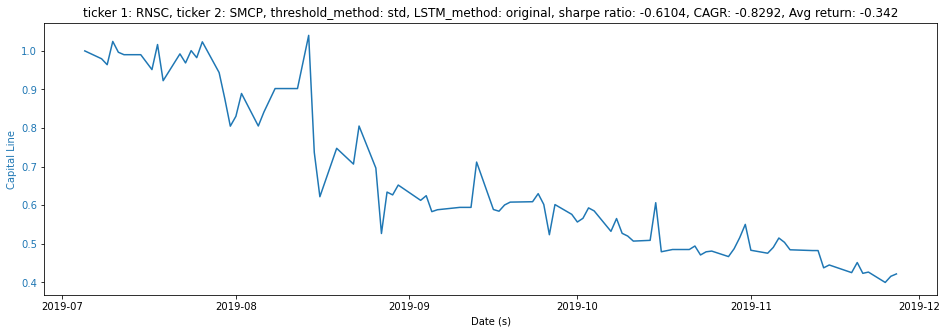

Annual return (std) :  -0.8291619724631558
Sharpe ratio (std) : -0.6103964719328555
CAGR (std) :  -0.8291619724631558
Avg_return (std) :  -0.34204022219305985
-------------------------------------
threshold:  0.24081045967439785
average return -0.342040
[-0.03901122  0.04193658]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


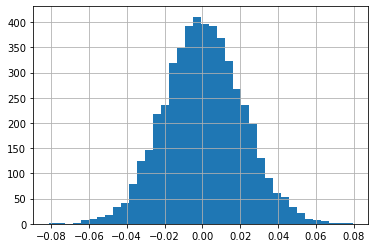

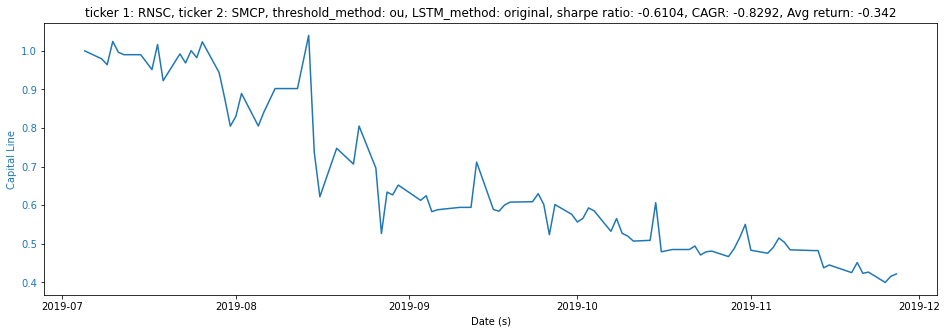

Annual return (ou) :  -0.8291619724631558
Sharpe ratio (ou) : -0.6103964719328555
CAGR (ou) :  -0.8291619724631558
Avg_return (ou) :  -0.34204022219305985
['RNSC', 'XSHQ']
Epoch 1/20
240/240 [==============================] - 1s 3ms/step - loss: 0.1229
Epoch 2/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0286
Epoch 3/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0163
Epoch 4/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0142
Epoch 5/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0134
Epoch 6/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0129
Epoch 7/20
240/240 [==============================] - 1s 2ms/step - loss: 0.0127
Epoch 8/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0125
Epoch 9/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0123
Epoch 10/20
240/240 [==============================] - 1s 2ms/step - loss: 0.0122
Epoch 11/20
240/2

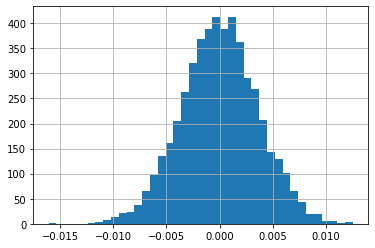

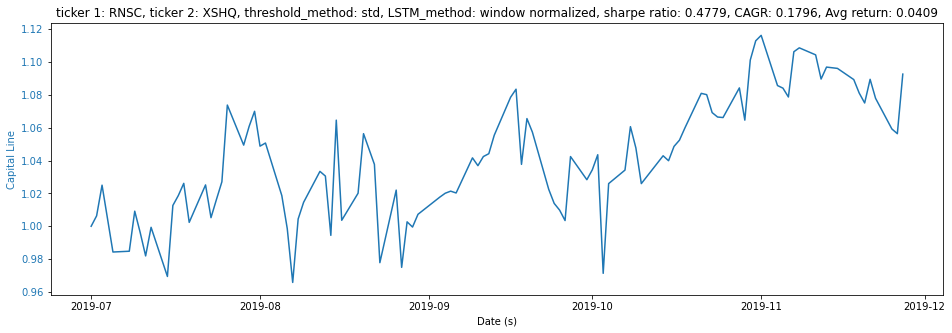

Annual return (std) :  0.17961372541082454
Sharpe ratio (std) : 0.47787033126996936
CAGR (std) :  0.17961372541082454
Avg_return (std) :  0.04089692820788005
-------------------------------------
threshold:  0.2736768101875042
average return 0.011679
[-0.00576281  0.00620392]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


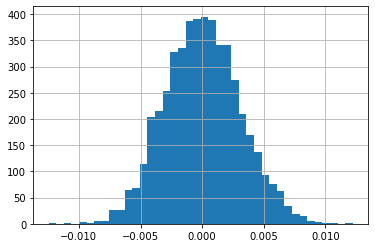

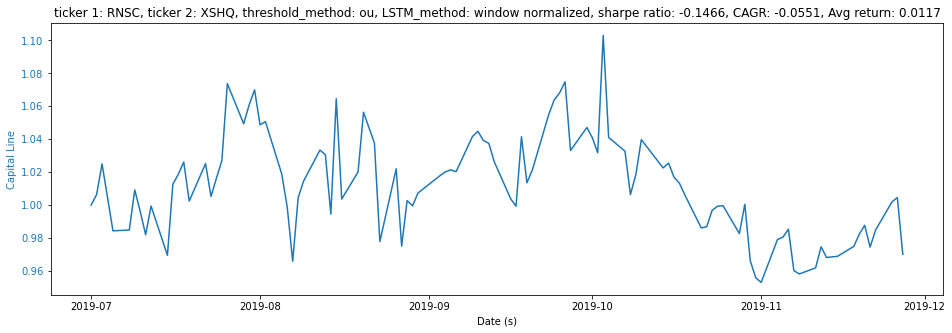

Annual return (ou) :  -0.05510996556504877
Sharpe ratio (ou) : -0.1466225225305601
CAGR (ou) :  -0.05510996556504877
Avg_return (ou) :  0.011678726375765874
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
240/240 [==============================] - 1s 3ms/step - loss: 0.1273
Epoch 2/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0240
Epoch 3/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0128
Epoch 4/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0094
Epoch 5/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0077
Epoch 6/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0067
Epoch 7/20
240/240 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 8/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0059
Epoch 9/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0055
Epoch 10/20
240/24

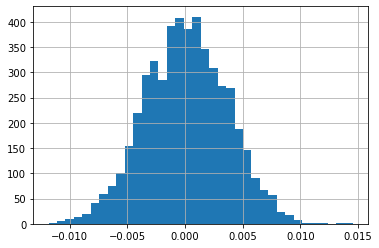

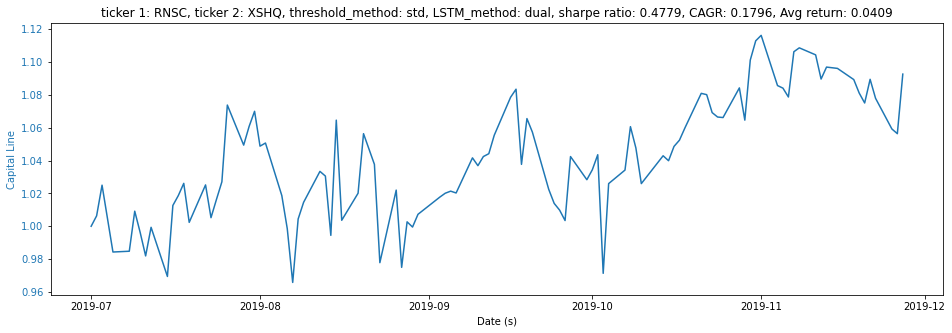

Annual return (dual+std) :  0.17961472181230276
Sharpe ratio (dual+std) : 0.47787327585858735
CAGR (dual+std) :  0.17961472181230276
Avg_return (dual+std) :  0.04089713877971503
-------------------------------------
threshold:  0.2755030181973965
average return 0.010250
[-0.00576442  0.0057546 ]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.00019999999999997797


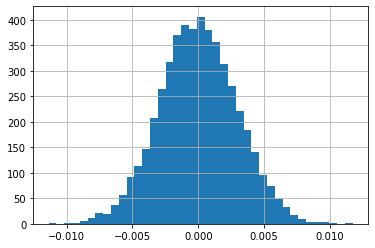

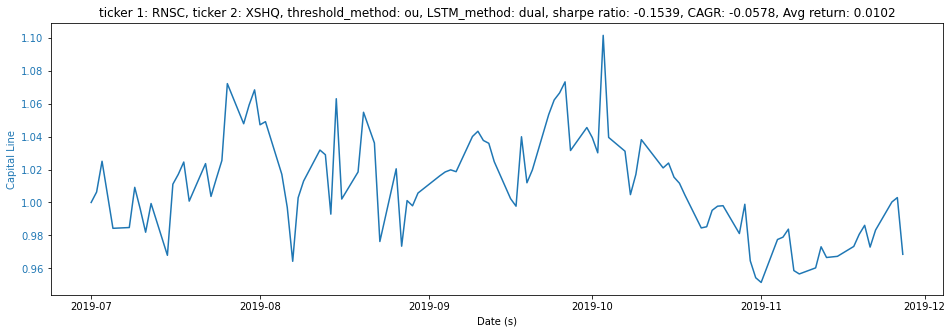

Annual return (dual+ou) :  -0.05783383138672182
Sharpe ratio (dual+ou) : -0.15386958363639502
CAGR (dual+ou) :  -0.05783383138672182
Avg_return (dual+ou) :  0.010249548193341706
========================↑ dual, ↓ single ====================================
Epoch 1/20
240/240 [==============================] - 1s 3ms/step - loss: 0.0330
Epoch 2/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0188
Epoch 3/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0163
Epoch 4/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0143
Epoch 5/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0125
Epoch 6/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0112
Epoch 7/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0108
Epoch 8/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0113
Epoch 9/20
240/240 [==============================] - 0s 2ms/step - loss: 0.0095
Epoch 10/20
240

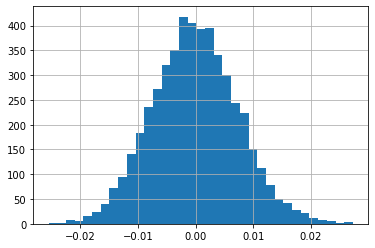

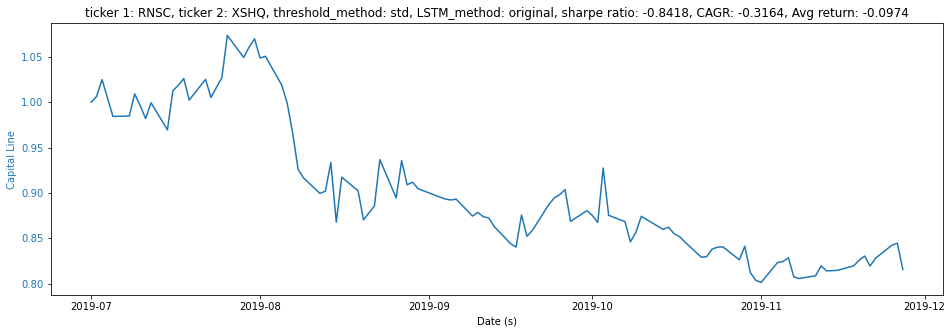

Annual return (std) :  -0.3163886674534697
Sharpe ratio (std) : -0.8417668499938333
CAGR (std) :  -0.3163886674534696
Avg_return (std) :  -0.09735596010100743
-------------------------------------
threshold:  0.20299085837525607
average return -0.097356
[-0.014377    0.01487599]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


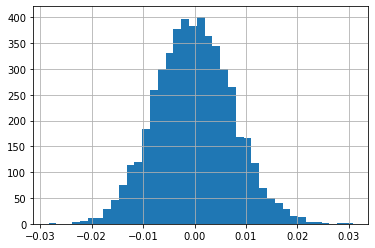

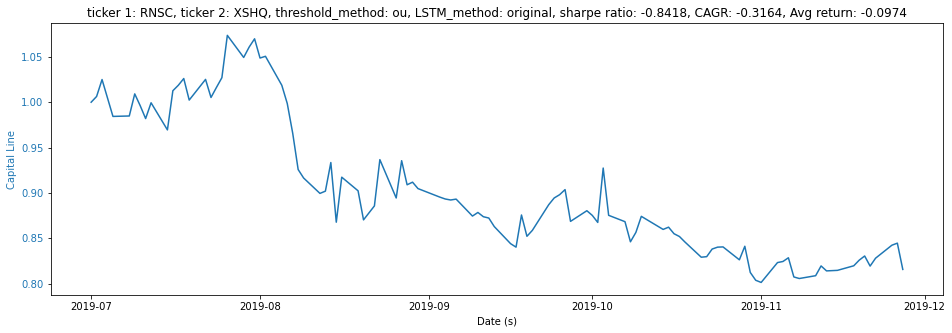

Annual return (ou) :  -0.3163886674534697
Sharpe ratio (ou) : -0.8417668499938333
CAGR (ou) :  -0.3163886674534696
Avg_return (ou) :  -0.09735596010100743
['DGS', 'FYC']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 477.1352
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 476.8674
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 476.7335
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 476.6385
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 476.5496
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 476.5043
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 476.4627
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 476.4235
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 476.4038
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 476.3628

D:\Programs\anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:79: RuntimeWarning: invalid value encountered in log
D:\Programs\anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: invalid value encountered in double_scalars
D:\Programs\anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in double_scalars


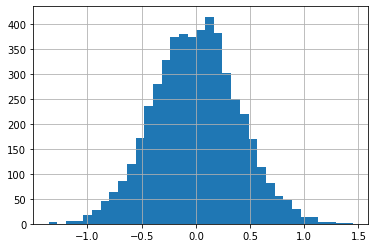

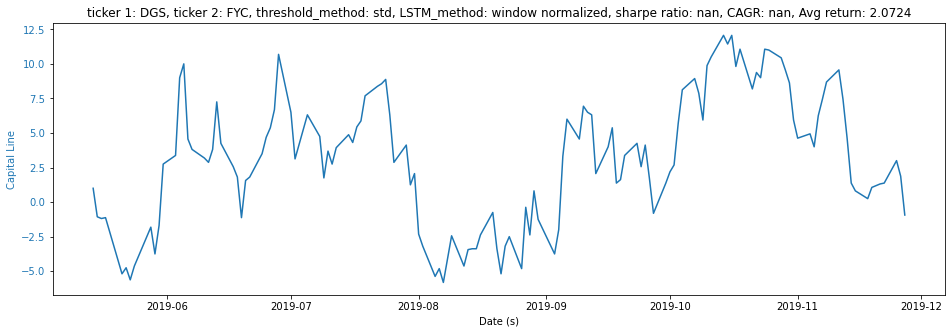

Annual return (std) :  nan
Sharpe ratio (std) : nan
CAGR (std) :  nan
Avg_return (std) :  2.072394691099756
-------------------------------------
threshold:  0.804325028384085
average return 2.068271
[-0.77099622  0.76425148]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


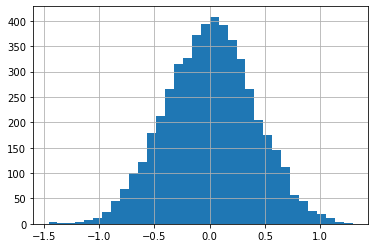

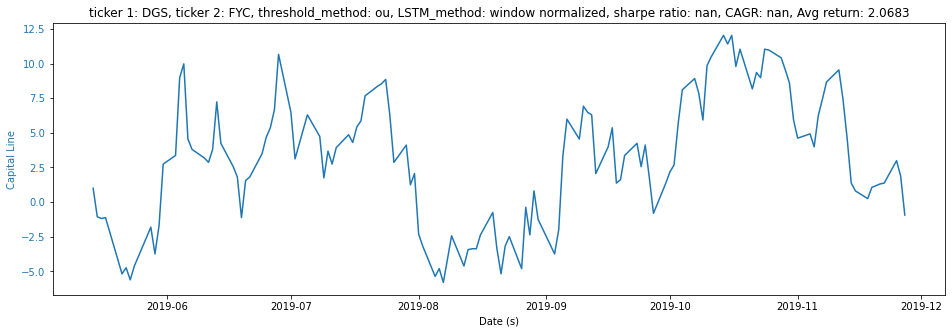

Annual return (ou) :  nan
Sharpe ratio (ou) : nan
CAGR (ou) :  nan
Avg_return (ou) :  2.0682706134740942
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1494
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0184
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0088
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0060
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - l

D:\Programs\anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:79: RuntimeWarning: invalid value encountered in log
D:\Programs\anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: invalid value encountered in double_scalars
D:\Programs\anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in double_scalars


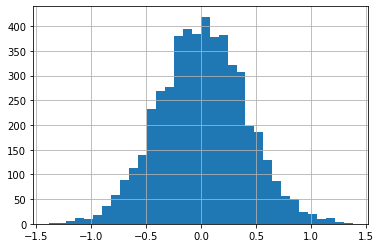

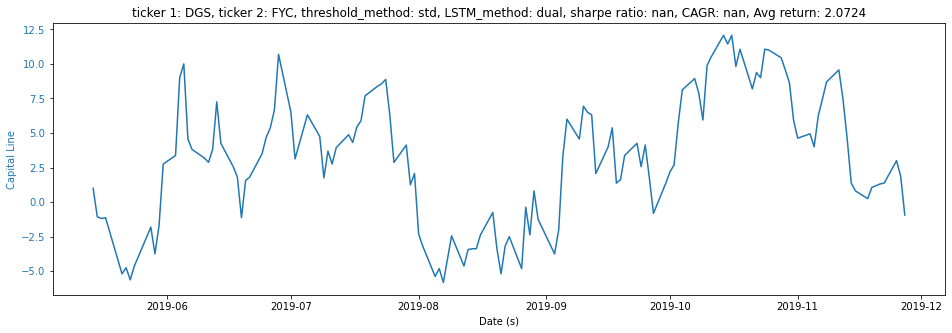

Annual return (dual+std) :  nan
Sharpe ratio (dual+std) : nan
CAGR (dual+std) :  nan
Avg_return (dual+std) :  2.072395870160508
-------------------------------------
threshold:  0.6714951118477178
average return 2.072396
[-0.77069204  0.79228015]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


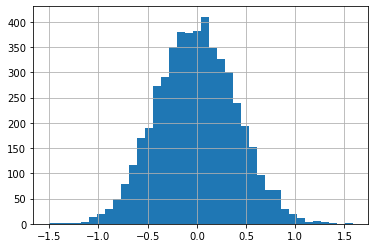

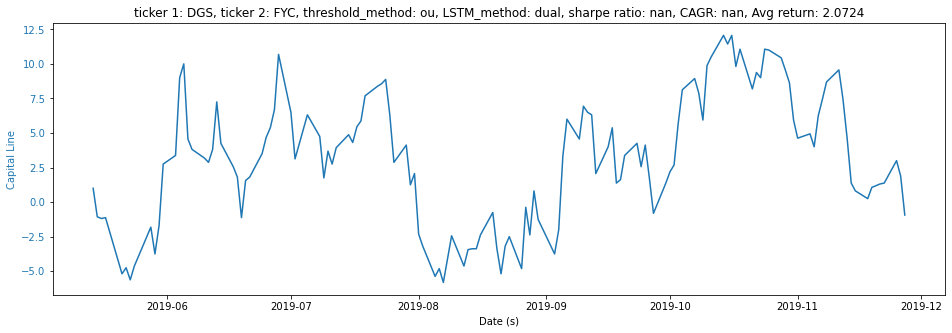

Annual return (dual+ou) :  nan
Sharpe ratio (dual+ou) : nan
CAGR (dual+ou) :  nan
Avg_return (dual+ou) :  2.072395870160508
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0601
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0121
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0082
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0056
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0037
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0030
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0027
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - 

D:\Programs\anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:79: RuntimeWarning: invalid value encountered in log
D:\Programs\anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: invalid value encountered in double_scalars
D:\Programs\anaconda3\envs\py36\lib\site-packages\ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in double_scalars


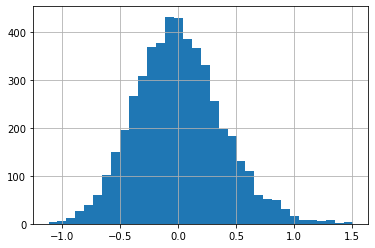

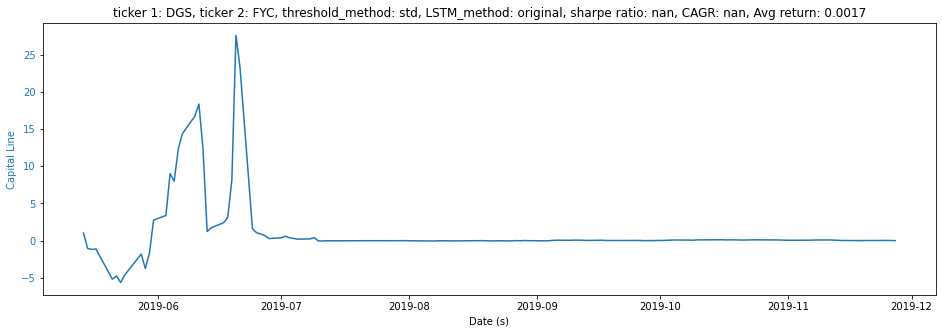

Annual return (std) :  nan
Sharpe ratio (std) : nan
CAGR (std) :  nan
Avg_return (std) :  0.0016965477026837975
-------------------------------------
threshold:  0.43798421607998483
average return -12.740487
[-3.72085827  3.61125488]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


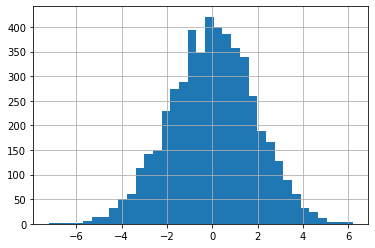

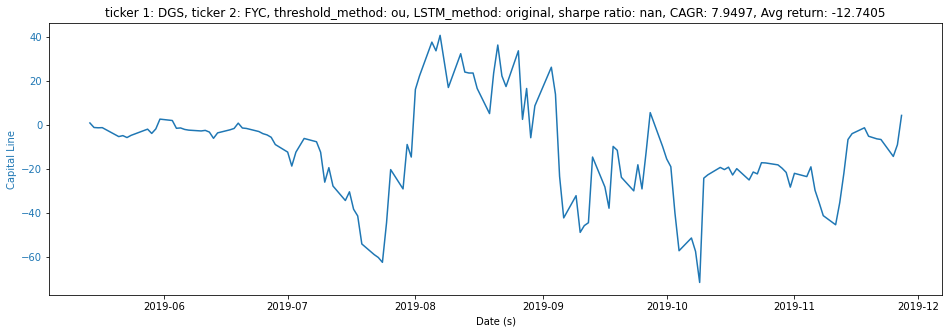

Annual return (ou) :  7.949694920136652
Sharpe ratio (ou) : nan
CAGR (ou) :  7.949694920136649
Avg_return (ou) :  -12.740487147254475
['DGS', 'IJT']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0898
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0203
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0178
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0169
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0163
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0159
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0155
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0153
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0152
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0150
Epoch 11/20
313/313 [===================

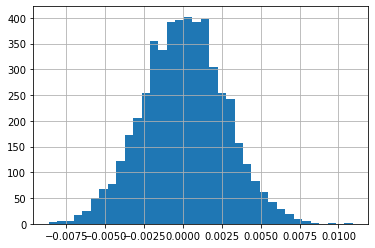

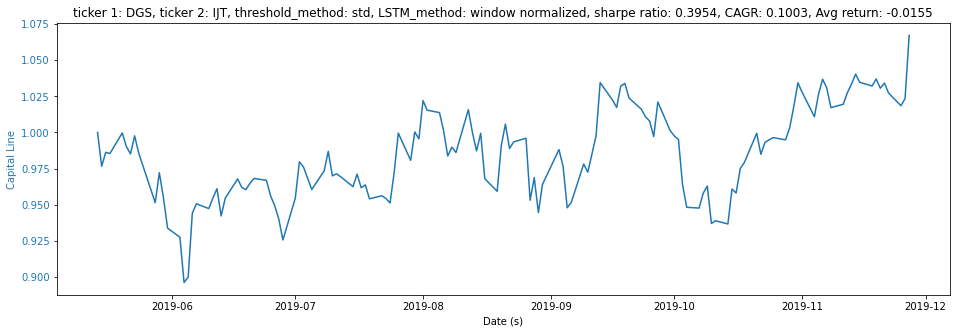

Annual return (std) :  0.10033271748496486
Sharpe ratio (std) : 0.39535954210890434
CAGR (std) :  0.10033271748496486
Avg_return (std) :  -0.015528733893468408
-------------------------------------
threshold:  1.0787008203573627
average return -0.066863
[-0.00736465  0.00755091]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


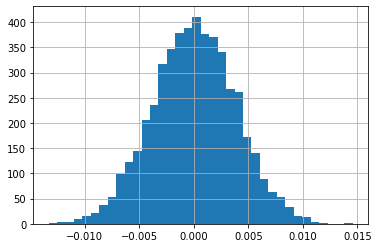

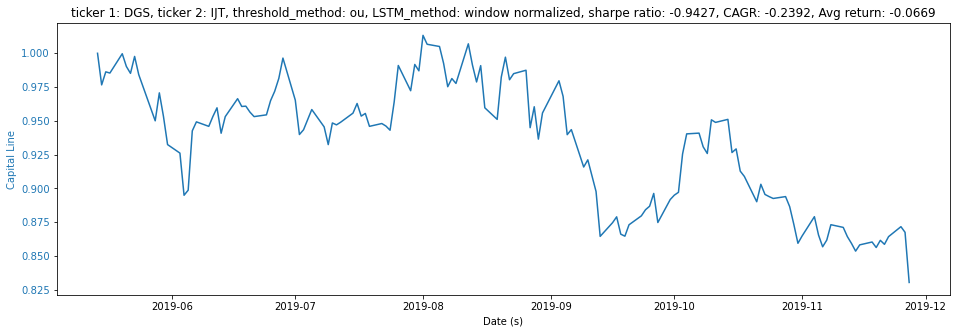

Annual return (ou) :  -0.2392242439365232
Sharpe ratio (ou) : -0.9426594825189067
CAGR (ou) :  -0.2392242439365232
Avg_return (ou) :  -0.06686278031777303
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0791
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0134
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0079
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0059
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0043
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 10/20
313/313 

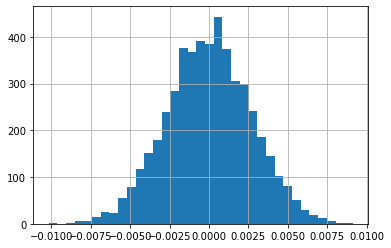

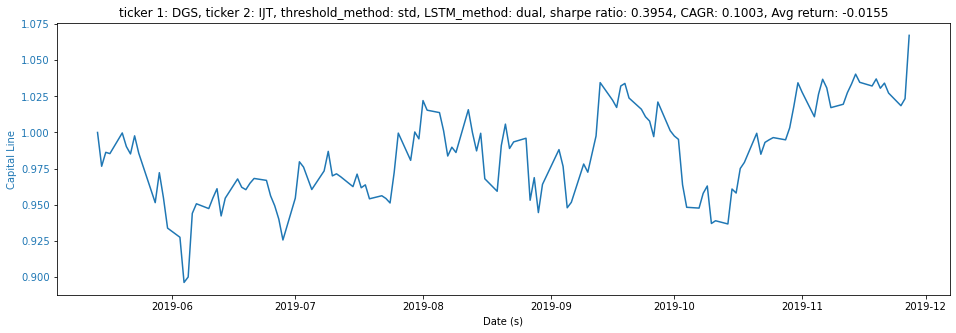

Annual return (dual+std) :  0.10033311613066442
Sharpe ratio (dual+std) : 0.39536120263931696
CAGR (dual+std) :  0.10033311613066442
Avg_return (dual+std) :  -0.015528772105527285
-------------------------------------
threshold:  1.0350279133989202
average return -0.015529
[-0.0051855   0.00546692]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


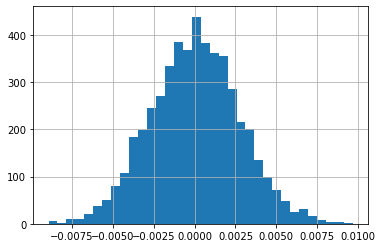

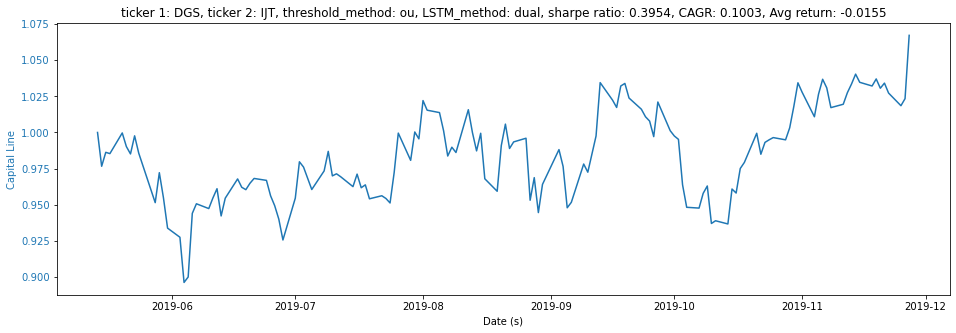

Annual return (dual+ou) :  0.10033311613066442
Sharpe ratio (dual+ou) : 0.39536120263931696
CAGR (dual+ou) :  0.10033311613066442
Avg_return (dual+ou) :  -0.015528772105527285
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0746
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0216
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0118
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0073
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0059
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0036
Epoch 10/20
313/3

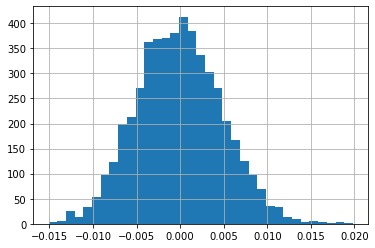

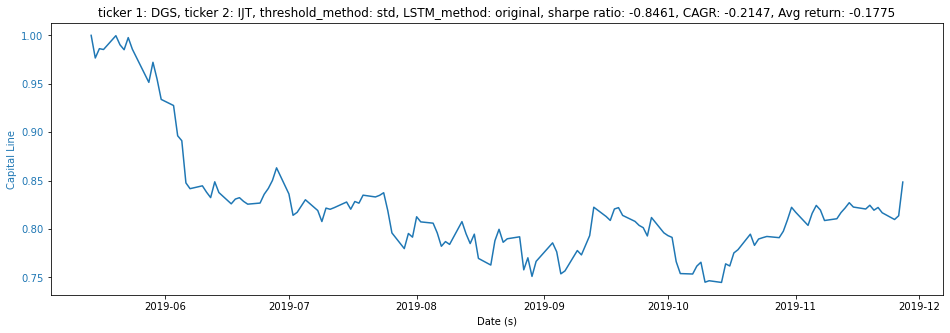

Annual return (std) :  -0.21472261274668691
Sharpe ratio (std) : -0.846111240367564
CAGR (std) :  -0.21472261274668691
Avg_return (std) :  -0.1774561900842938
-------------------------------------
threshold:  0.7115158742975994
average return -0.082495
[-0.00752048  0.00791569]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


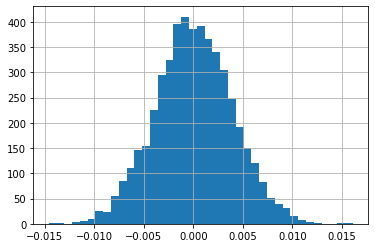

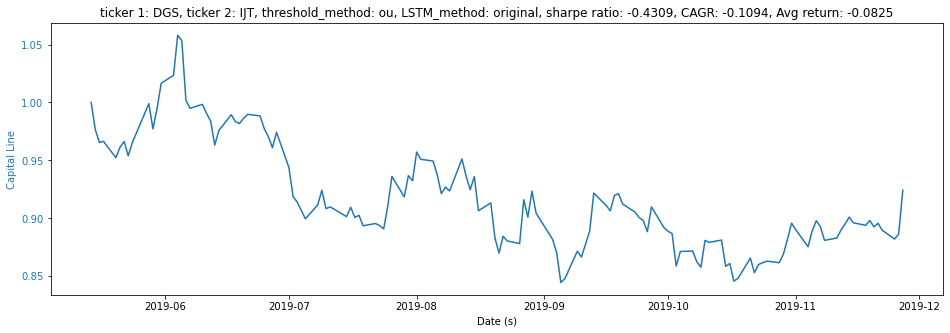

Annual return (ou) :  -0.10935346151537961
Sharpe ratio (ou) : -0.4309056776913318
CAGR (ou) :  -0.10935346151537961
Avg_return (ou) :  -0.08249478013097465
['DGS', 'IWO']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0969
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0155
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0098
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0082
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0075
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0072
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0070
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0068
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0067
Epoch 11/20
313/3

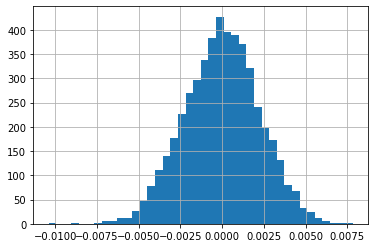

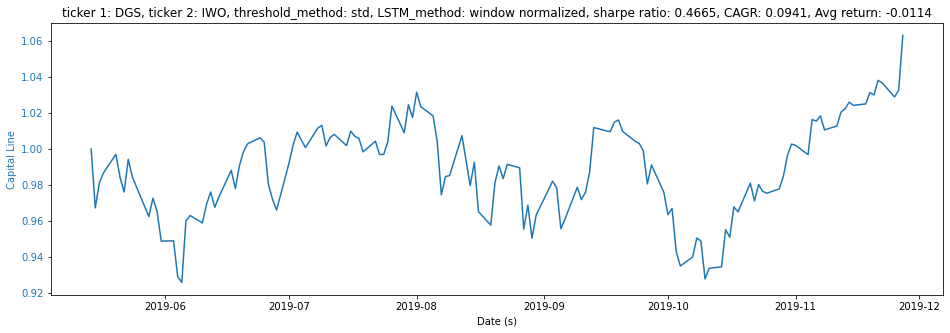

Annual return (std) :  0.09409961440226478
Sharpe ratio (std) : 0.4664572165943215
CAGR (std) :  0.09409961440226478
Avg_return (std) :  -0.01135090273055607
-------------------------------------
threshold:  2.3167829877825183
average return -0.051016
[-0.00665463  0.00653081]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


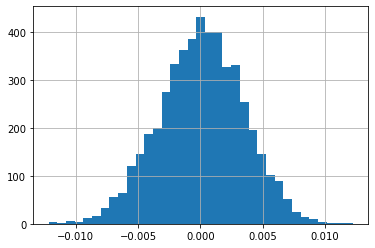

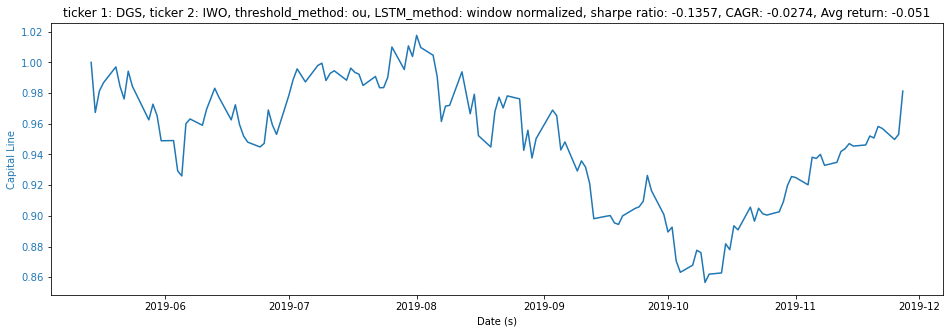

Annual return (ou) :  -0.02737202435790398
Sharpe ratio (ou) : -0.13568470365838783
CAGR (ou) :  -0.02737202435790398
Avg_return (ou) :  -0.05101575852727738
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1042
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0117
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0043
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 10/20
313/3

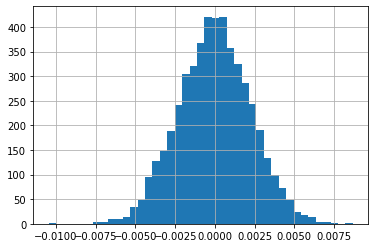

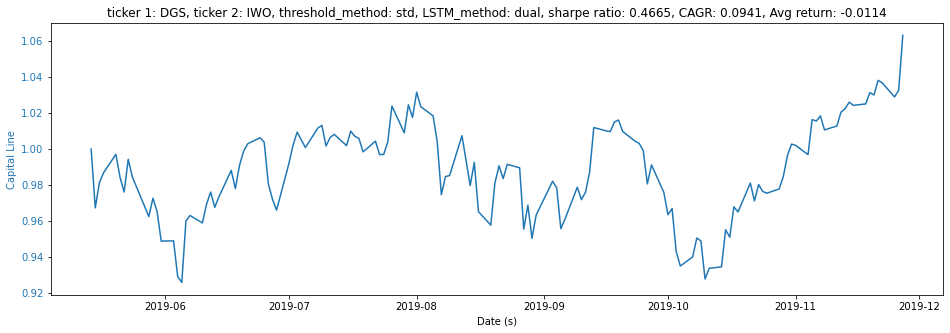

Annual return (dual+std) :  0.0940994138286535
Sharpe ratio (dual+std) : 0.4664561097484052
CAGR (dual+std) :  0.0940994138286535
Avg_return (dual+std) :  -0.011350839585358773
-------------------------------------
threshold:  2.335132547838492
average return -0.011351
[-0.00451319  0.00444456]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


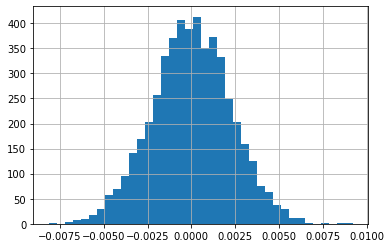

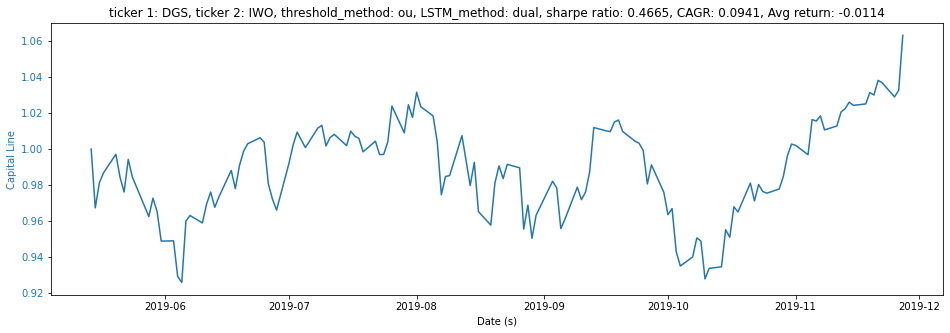

Annual return (dual+ou) :  0.0940994138286535
Sharpe ratio (dual+ou) : 0.4664561097484052
CAGR (dual+ou) :  0.0940994138286535
Avg_return (dual+ou) :  -0.011350839585358773
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0303
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0110
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0079
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0032
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0029
Epoch 10/20
313/313 

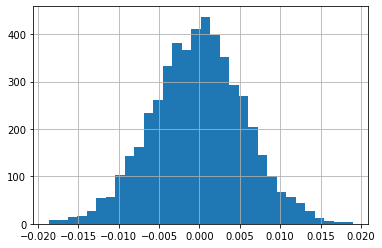

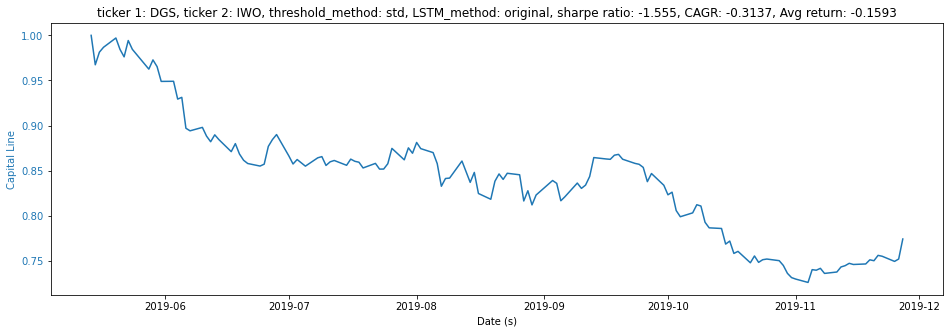

Annual return (std) :  -0.31369140267829576
Sharpe ratio (std) : -1.5549861751657605
CAGR (std) :  -0.31369140267829576
Avg_return (std) :  -0.15932684988205983
-------------------------------------
threshold:  1.4061212370415772
average return -0.134558
[-0.00861014  0.00854311]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


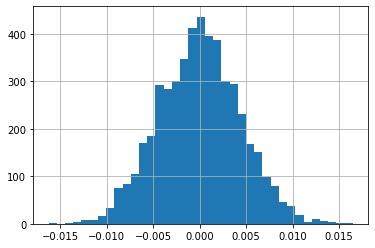

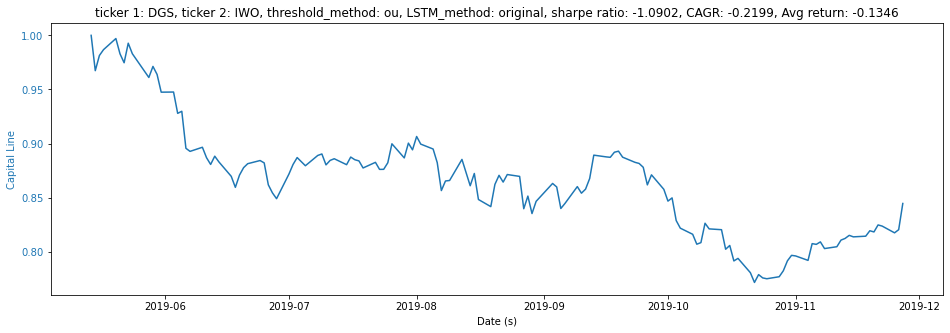

Annual return (ou) :  -0.21991992242997138
Sharpe ratio (ou) : -1.0901555991091014
CAGR (ou) :  -0.21991992242997138
Avg_return (ou) :  -0.13455790649463228
['DGS', 'SLYG']
Epoch 1/20
313/313 [==============================] - 1s 2ms/step - loss: 0.2290
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.1485
Epoch 3/20
313/313 [==============================] - 0s 2ms/step - loss: 0.1118
Epoch 4/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0995
Epoch 5/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0876
Epoch 6/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0794
Epoch 7/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0737
Epoch 8/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0708
Epoch 9/20
313/313 [==============================] - 0s 1ms/step - loss: 0.0668
Epoch 10/20
313/313 [==============================] - 0s 2ms/step - loss: 0.0648
Epoch 11/20
313/

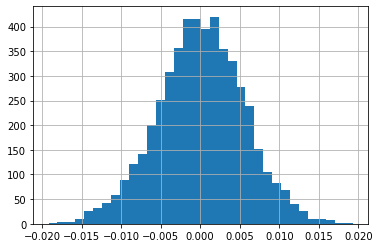

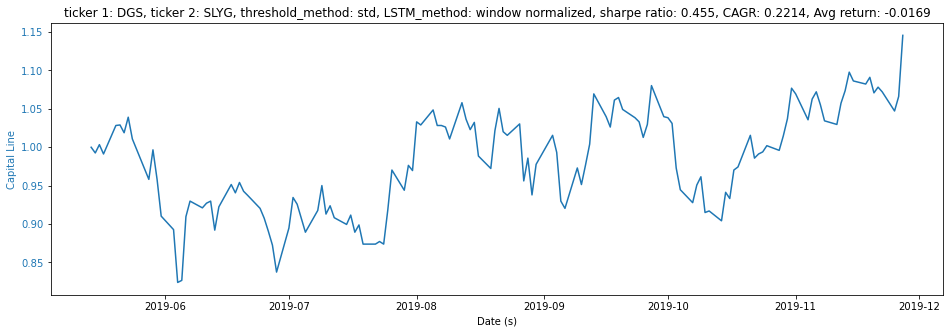

Annual return (std) :  0.2213532353695058
Sharpe ratio (std) : 0.4550044032851073
CAGR (std) :  0.2213532353695058
Avg_return (std) :  -0.01693057884852956
-------------------------------------
threshold:  0.8306579582797565
average return 0.018016
[-0.0113303   0.01091876]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.00019999999999997797


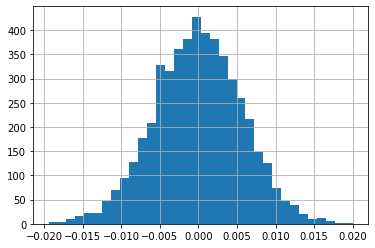

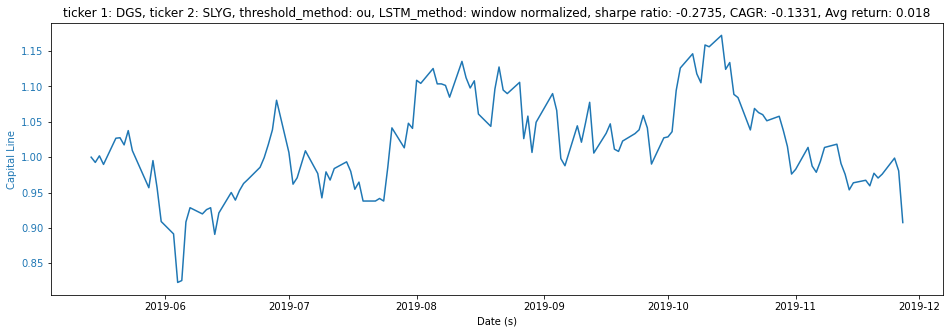

Annual return (ou) :  -0.13305000858796134
Sharpe ratio (ou) : -0.2734920032390169
CAGR (ou) :  -0.13305000858796134
Avg_return (ou) :  0.01801563756697343
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1142
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0104
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0038
Epoch 10/20
313/313

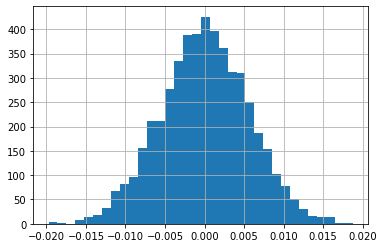

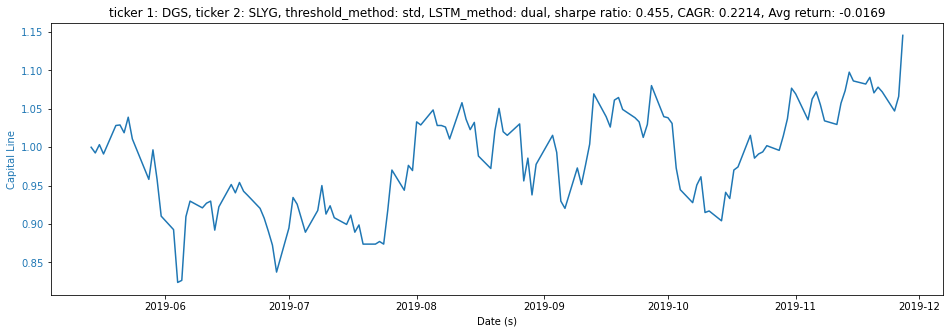

Annual return (dual+std) :  0.2213524393938262
Sharpe ratio (dual+std) : 0.45500287531580746
CAGR (dual+std) :  0.2213524393938262
Avg_return (dual+std) :  -0.016930662408522548
-------------------------------------
threshold:  0.6619032837289621
average return -0.016931
[-0.01053749  0.01076465]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.999


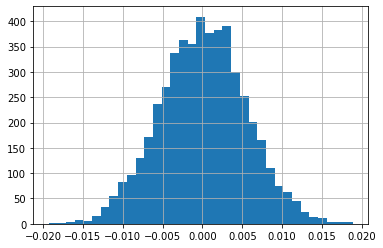

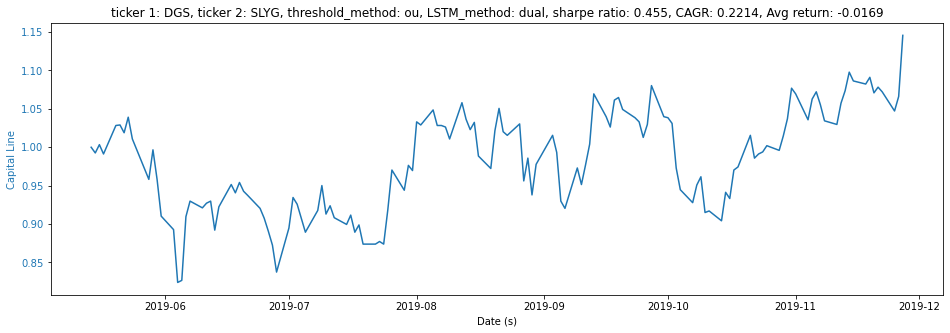

Annual return (dual+ou) :  0.2213524393938262
Sharpe ratio (dual+ou) : 0.45500287531580746
CAGR (dual+ou) :  0.2213524393938262
Avg_return (dual+ou) :  -0.016930662408522548
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0698
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0154
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0093
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0035
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0031
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0026
Epoch 10/20
313/313

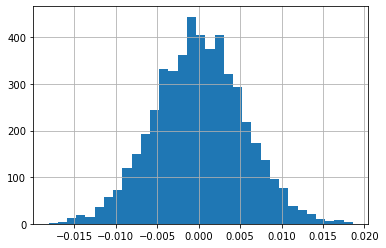

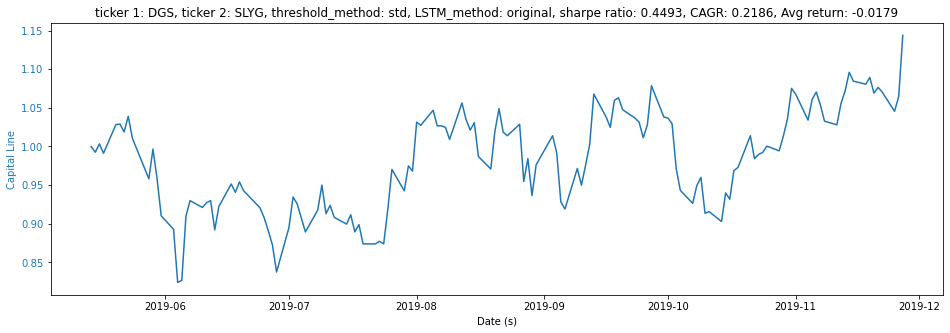

Annual return (std) :  0.21858533697544202
Sharpe ratio (std) : 0.4493148065494287
CAGR (std) :  0.21858533697544202
Avg_return (std) :  -0.01791040943726078
-------------------------------------
threshold:  0.4761804780677223
average return -0.076270
[-0.01376961  0.01364793]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


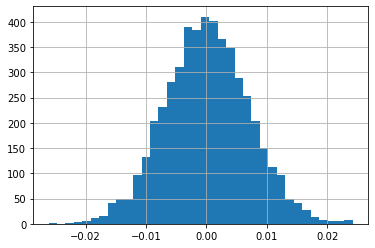

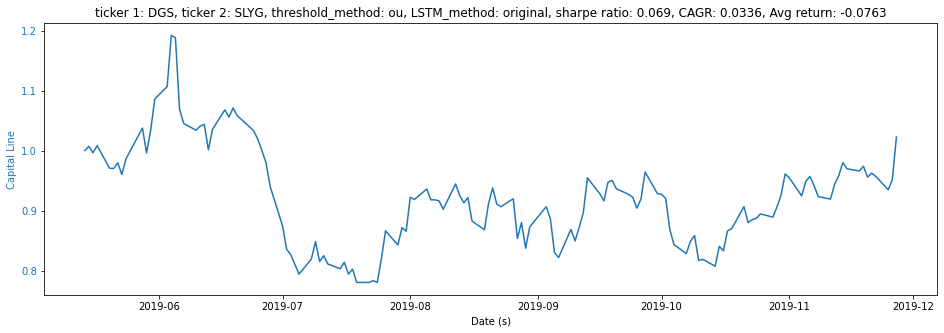

Annual return (ou) :  0.03359048887776295
Sharpe ratio (ou) : 0.06904719328775678
CAGR (ou) :  0.03359048887776295
Avg_return (ou) :  -0.07627024294625784
['GSSC', 'SMLF']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1010
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0221
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0134
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0119
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0113
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0109
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0107
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0106
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0105
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0104
Epoch 11/20
313/3

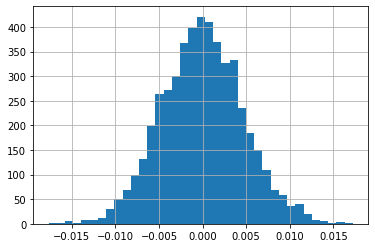

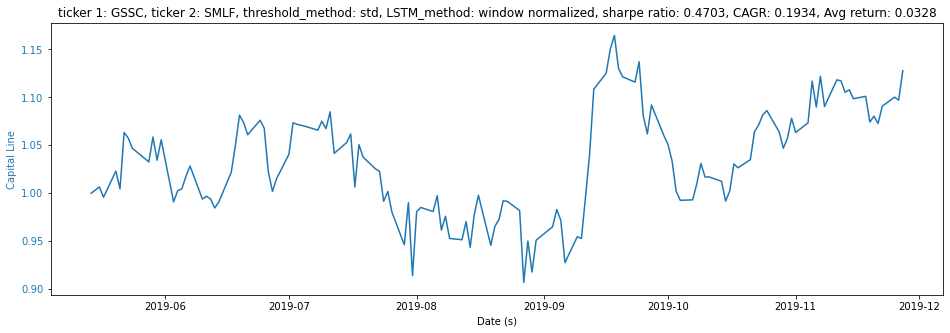

Annual return (std) :  0.19339136386168332
Sharpe ratio (std) : 0.47032986968841783
CAGR (std) :  0.19339136386168332
Avg_return (std) :  0.03281751043168083
-------------------------------------
threshold:  0.17130754424971983
average return 0.029959
[-0.01190517  0.01124748]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


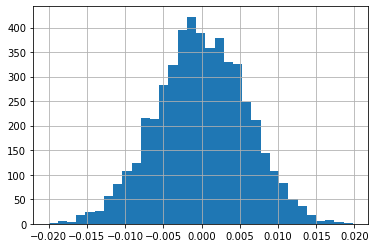

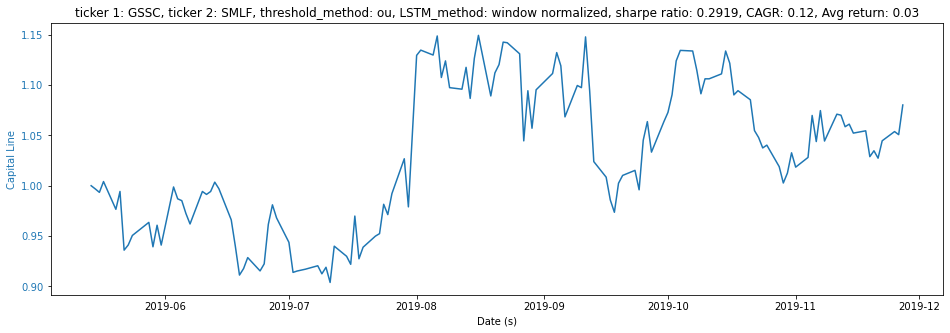

Annual return (ou) :  0.12000518921616554
Sharpe ratio (ou) : 0.29185390639439995
CAGR (ou) :  0.12000518921616532
Avg_return (ou) :  0.029958745143816457
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1383
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0179
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0077
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 10/20
313/313 

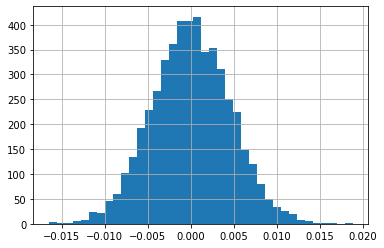

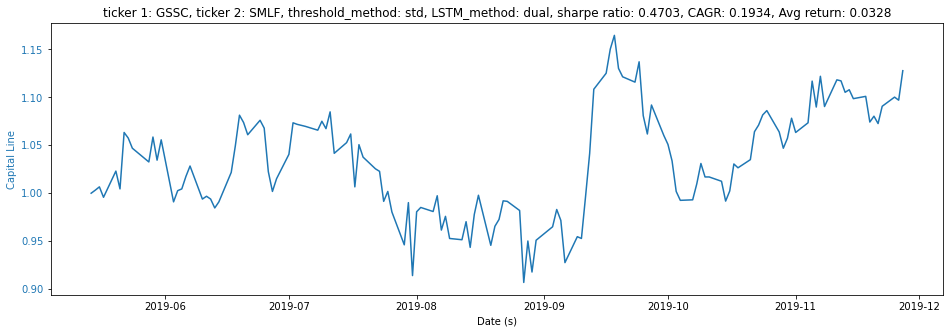

Annual return (dual+std) :  0.19339180841028725
Sharpe ratio (dual+std) : 0.4703319523875416
CAGR (dual+std) :  0.19339180841028725
Avg_return (dual+std) :  0.03281766168455937
-------------------------------------
threshold:  0.1828551739452717
average return -0.066839
[-0.0087643   0.00902576]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


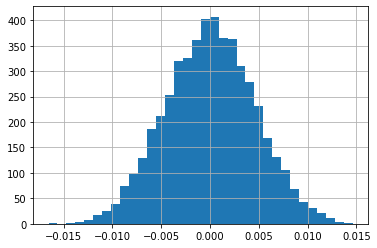

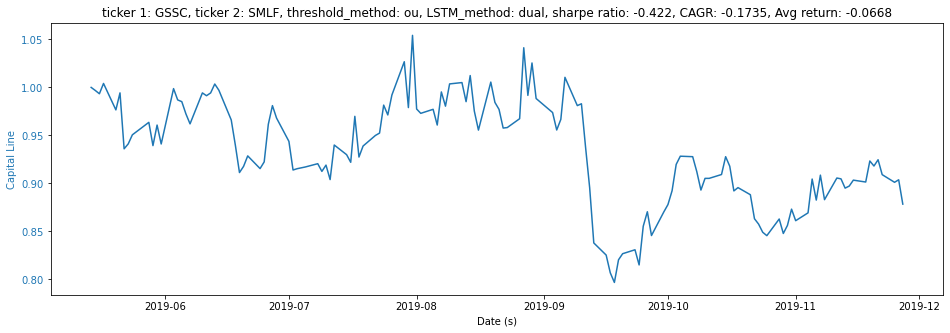

Annual return (dual+ou) :  -0.1735029370900557
Sharpe ratio (dual+ou) : -0.4219619011649817
CAGR (dual+ou) :  -0.1735029370900557
Avg_return (dual+ou) :  -0.0668389319853323
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0307
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0113
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0093
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0077
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 10/20
313/313

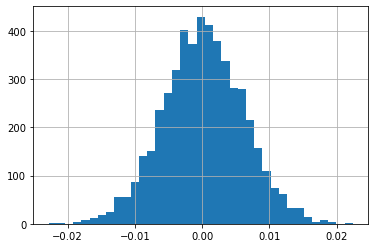

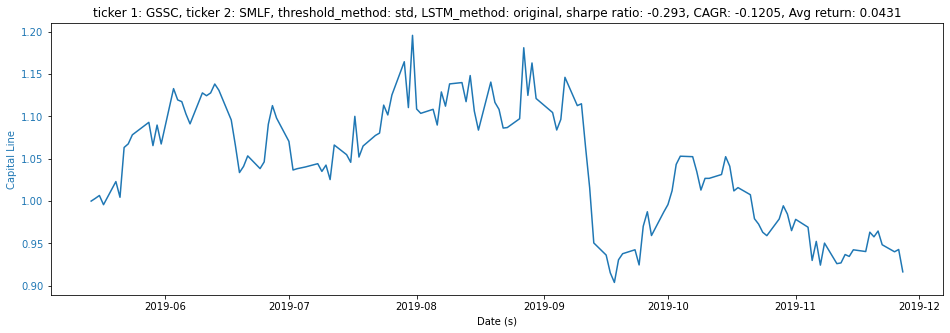

Annual return (std) :  -0.120465833577302
Sharpe ratio (std) : -0.2929741997944481
CAGR (std) :  -0.120465833577302
Avg_return (std) :  0.04311583264014183
-------------------------------------
threshold:  0.1235341432360957
average return 0.180219
[-0.01841908  0.01902309]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


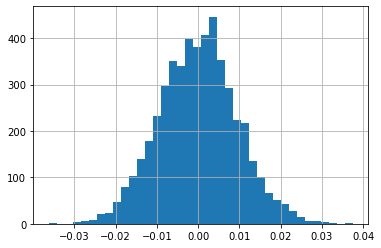

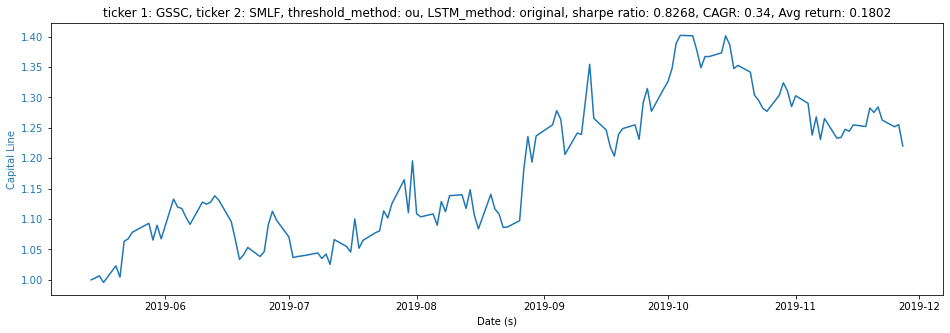

Annual return (ou) :  0.33997178437100817
Sharpe ratio (ou) : 0.8268150273070772
CAGR (ou) :  0.33997178437100817
Avg_return (ou) :  0.18021870164523696
['GSSC', 'USVM']
Epoch 1/20
313/313 [==============================] - 1s 4ms/step - loss: 0.1440
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0228
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0109
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0085
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0073
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0067
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0059
Epoch 10/20
313/313 [==============================] - ETA: 0s - loss: 0.005 - 1s 2ms/step - loss: 0.

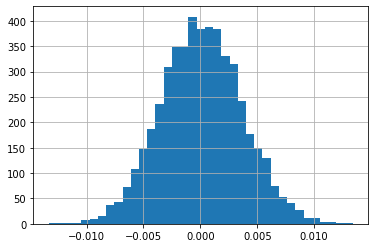

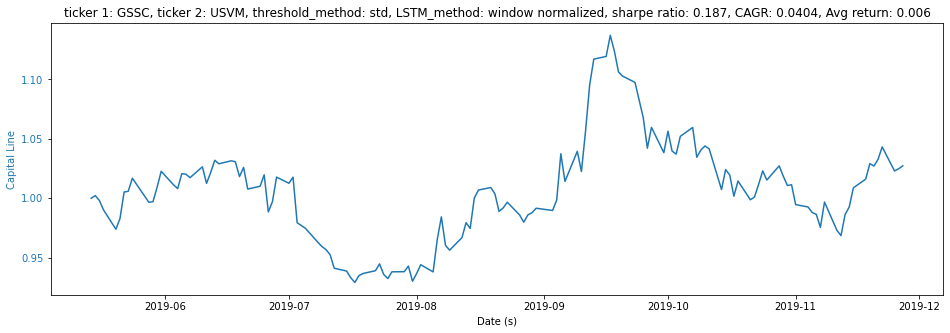

Annual return (std) :  0.04035195093620336
Sharpe ratio (std) : 0.18699293560880484
CAGR (std) :  0.04035195093620336
Avg_return (std) :  0.006021304330288991
-------------------------------------
threshold:  0.21683807159391635
average return -0.002317
[-0.00698486  0.00721458]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.7368


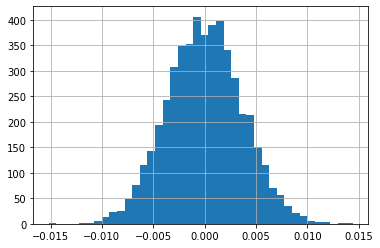

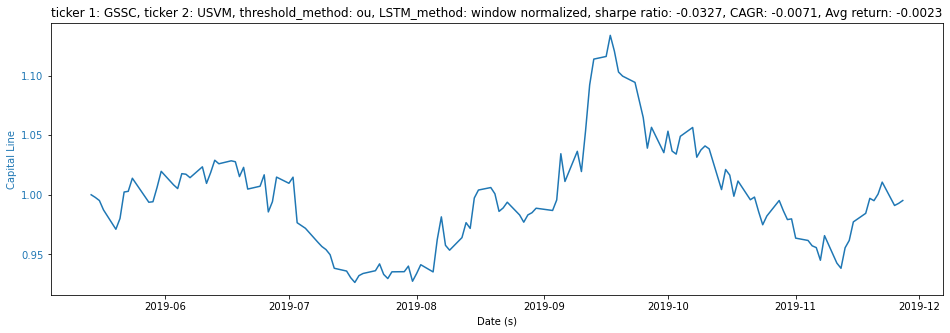

Annual return (ou) :  -0.007058906386581021
Sharpe ratio (ou) : -0.03271132118249743
CAGR (ou) :  -0.007058906386581021
Avg_return (ou) :  -0.002317414583653051
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1165
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0147
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 10/20
31

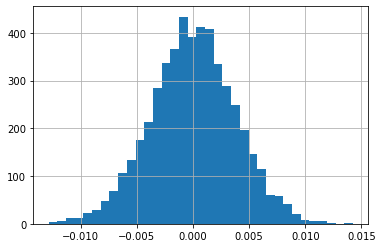

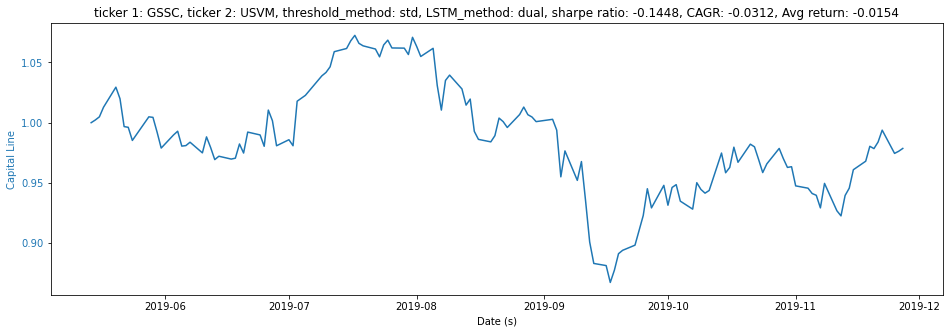

Annual return (dual+std) :  -0.03124572758568045
Sharpe ratio (dual+std) : -0.14479480622494276
CAGR (dual+std) :  -0.03124572758568045
Avg_return (dual+std) :  -0.015417823259600196
-------------------------------------
threshold:  0.2303669718745206
average return -0.002318
[-0.00717687  0.0075553 ]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.726


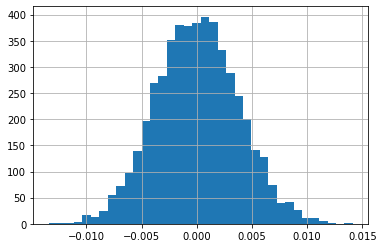

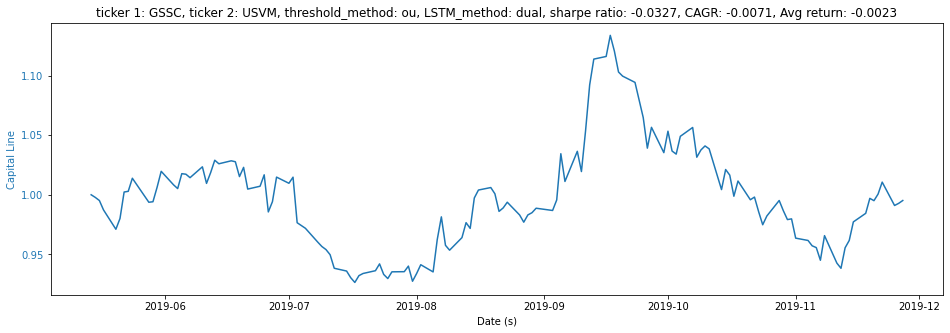

Annual return (dual+ou) :  -0.007062237439374508
Sharpe ratio (dual+ou) : -0.032726883979408504
CAGR (dual+ou) :  -0.007062237439374508
Avg_return (dual+ou) :  -0.002318226340737596
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0205
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0159
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0127
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0105
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0088
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0086
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0076
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0068
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 10/20

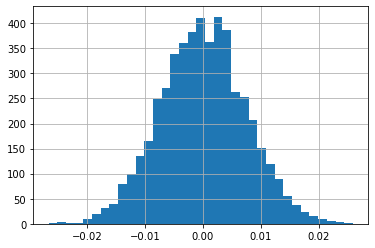

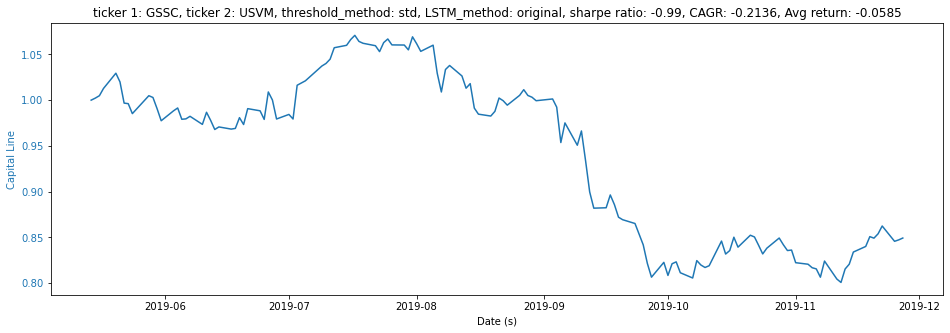

Annual return (std) :  -0.2136340583840305
Sharpe ratio (std) : -0.9899907046709413
CAGR (std) :  -0.2136340583840305
Avg_return (std) :  -0.05847245889230494
-------------------------------------
threshold:  0.11455449716563164
average return -0.058472
[-0.01517622  0.01474951]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


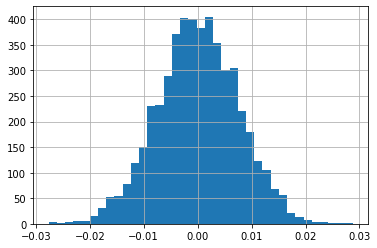

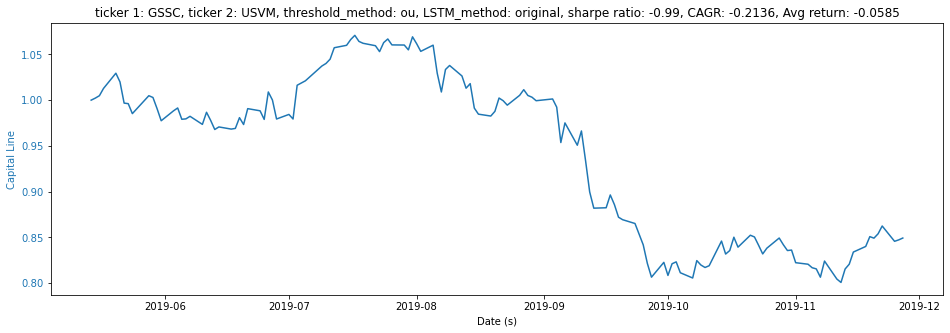

Annual return (ou) :  -0.2136340583840305
Sharpe ratio (ou) : -0.9899907046709413
CAGR (ou) :  -0.2136340583840305
Avg_return (ou) :  -0.05847245889230494
['IJT', 'SLYG']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1277
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0127
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0078
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0056
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 11/20
313/31

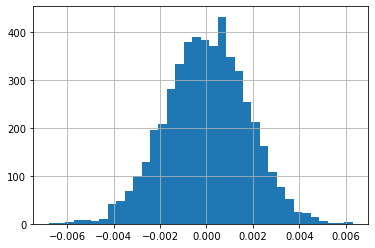

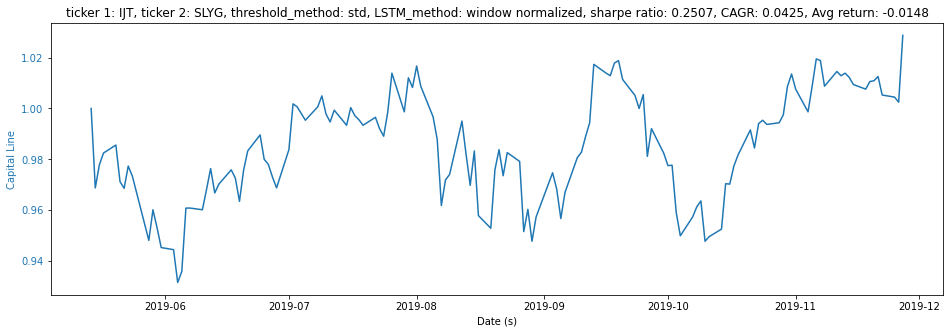

Annual return (std) :  0.04254461426004319
Sharpe ratio (std) : 0.2507044347068783
CAGR (std) :  0.04254461426004319
Avg_return (std) :  -0.01484221348251359
-------------------------------------
threshold:  0.477413503702823
average return -0.039481
[-0.0030572   0.00295767]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


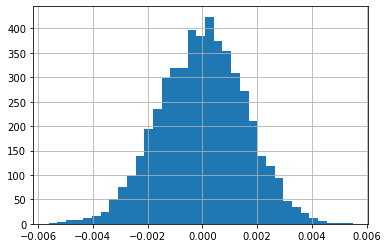

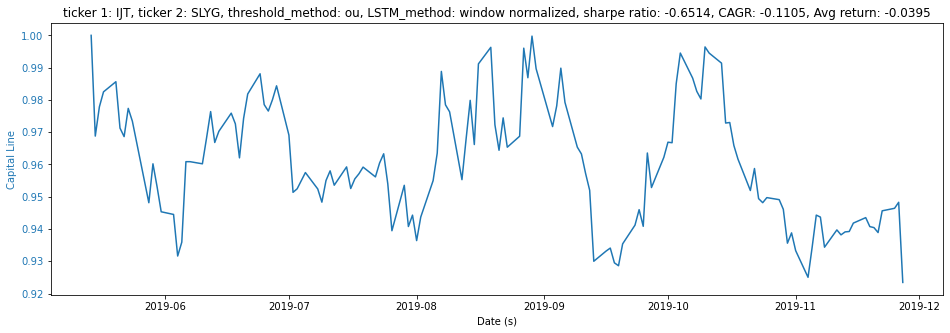

Annual return (ou) :  -0.11053435075539442
Sharpe ratio (ou) : -0.6513504095358281
CAGR (ou) :  -0.11053435075539442
Avg_return (ou) :  -0.039480567044533975
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0938
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0160
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0096
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 5/20
313/313 [==============================] - 1s 4ms/step - loss: 0.0062
Epoch 6/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0057
Epoch 7/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0053
Epoch 8/20
313/313 [==============================] - 1s 4ms/step - loss: 0.0051
Epoch 9/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0049
Epoch 10/20
313/3

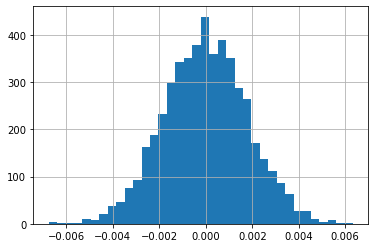

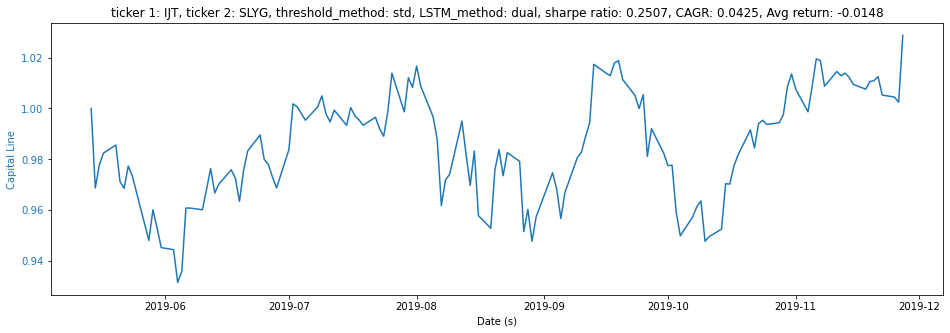

Annual return (dual+std) :  0.04254421878090642
Sharpe ratio (dual+std) : 0.25070179237012225
CAGR (dual+std) :  0.04254421878090642
Avg_return (dual+std) :  -0.014842370277726575
-------------------------------------
threshold:  0.4826209938056081
average return -0.040348
[-0.00318044  0.00317519]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


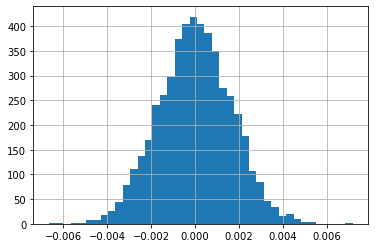

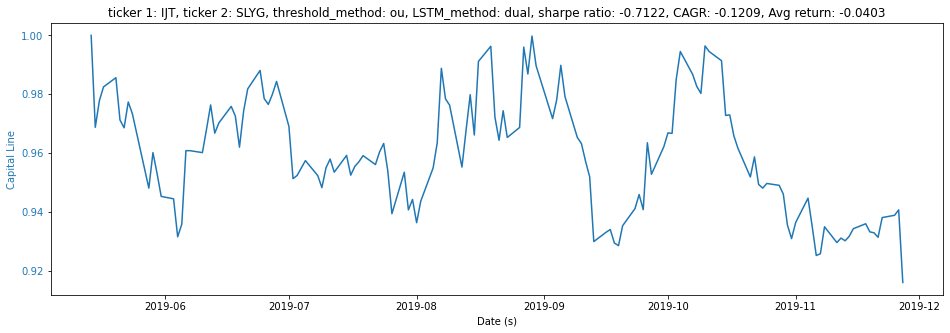

Annual return (dual+ou) :  -0.12086882615050276
Sharpe ratio (dual+ou) : -0.7122479205377513
CAGR (dual+ou) :  -0.12086882615050276
Avg_return (dual+ou) :  -0.04034787450784917
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0296
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0123
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0091
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0076
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0067
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0060
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0038
Epoch 10/20
313/

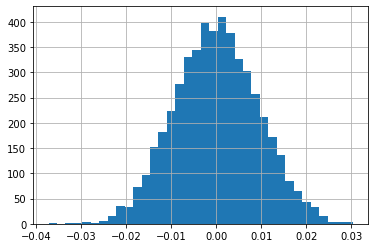

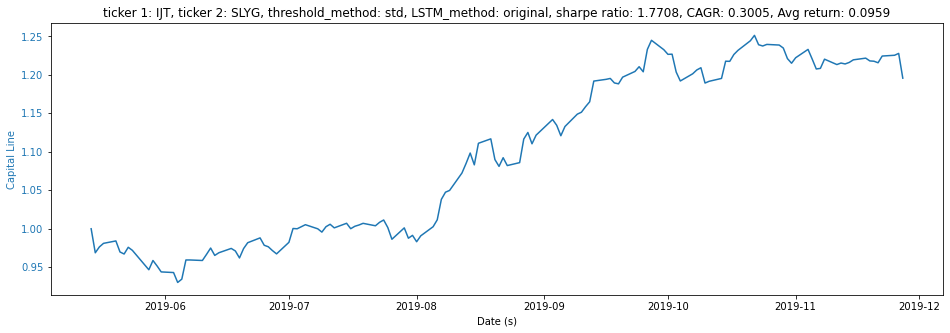

Annual return (std) :  0.30050545015019625
Sharpe ratio (std) : 1.7708010560765275
CAGR (std) :  0.30050545015019625
Avg_return (std) :  0.09594621932827435
-------------------------------------
threshold:  0.23789103895291655
average return 0.015756
[-0.0086846   0.00853326]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


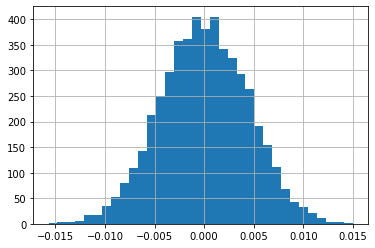

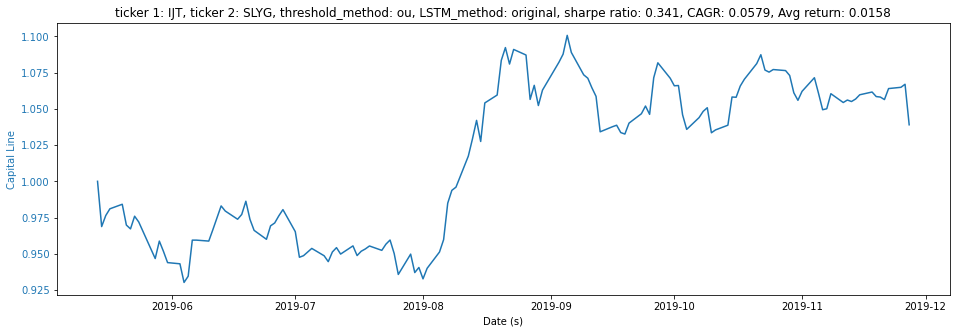

Annual return (ou) :  0.05786536969071321
Sharpe ratio (ou) : 0.34098568830401865
CAGR (ou) :  0.05786536969071321
Avg_return (ou) :  0.01575597445890368
['IWM', 'VTWO']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0984
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0128
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0086
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 11/20
313/313

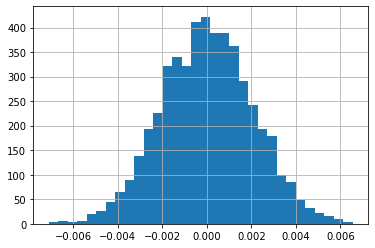

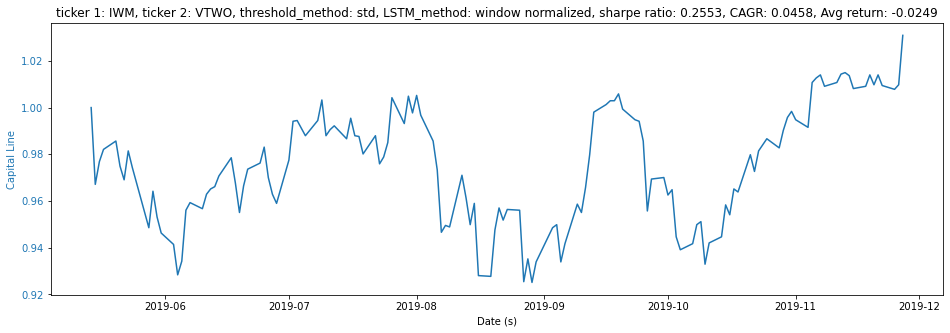

Annual return (std) :  0.045805464716959454
Sharpe ratio (std) : 0.25525987310435083
CAGR (std) :  0.045805464716959454
Avg_return (std) :  -0.02491321898989927
-------------------------------------
threshold:  0.36592558277844434
average return 0.018095
[-0.00470293  0.00442766]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


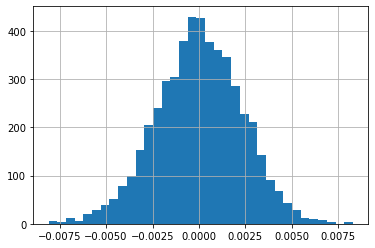

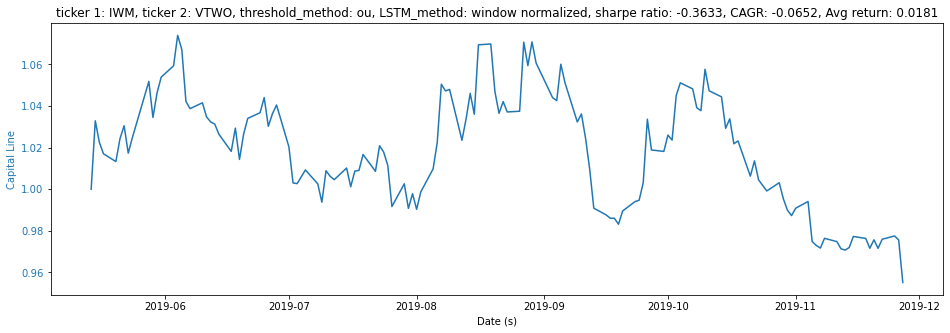

Annual return (ou) :  -0.0651977710026278
Sharpe ratio (ou) : -0.36332727668311293
CAGR (ou) :  -0.0651977710026278
Avg_return (ou) :  0.018095408098602835
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 4ms/step - loss: 0.0806
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0131
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0086
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0063
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 10/20
313/313

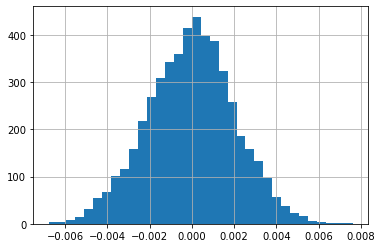

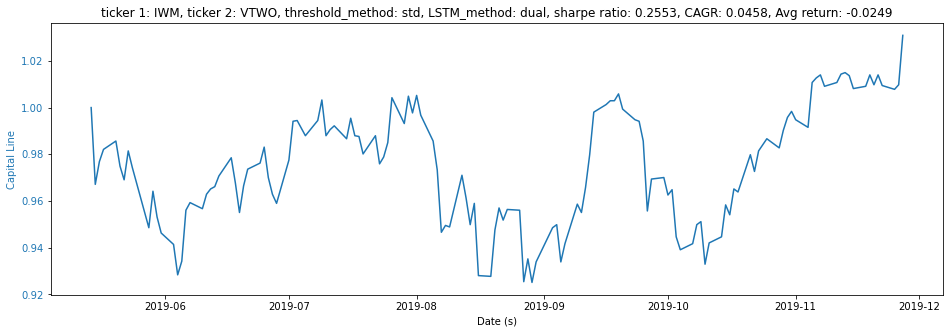

Annual return (dual+std) :  0.045805240961712235
Sharpe ratio (dual+std) : 0.2552582443999494
CAGR (dual+std) :  0.045805240961712235
Avg_return (dual+std) :  -0.024913360417028862
-------------------------------------
threshold:  0.3895277035190568
average return -0.044295
[-0.00409665  0.00412912]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


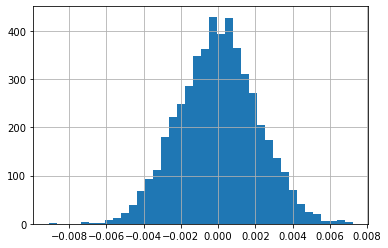

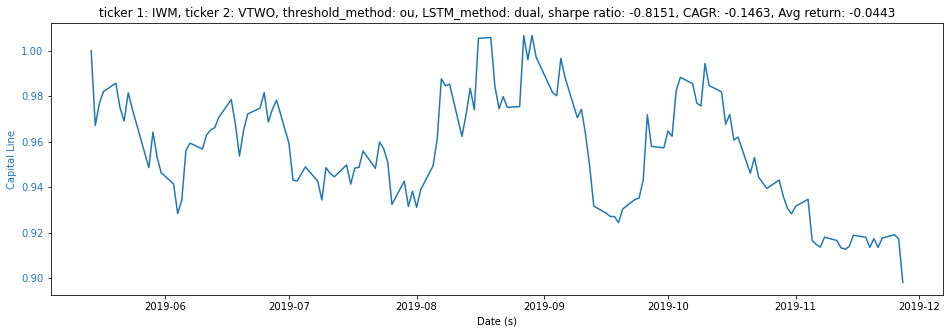

Annual return (dual+ou) :  -0.14627103377789974
Sharpe ratio (dual+ou) : -0.8151226039815314
CAGR (dual+ou) :  -0.14627103377789974
Avg_return (dual+ou) :  -0.04429522700614676
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0397
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0221
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0137
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0102
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0078
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0076
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 10/20
313/

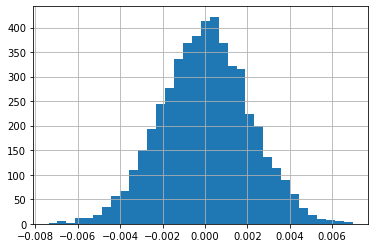

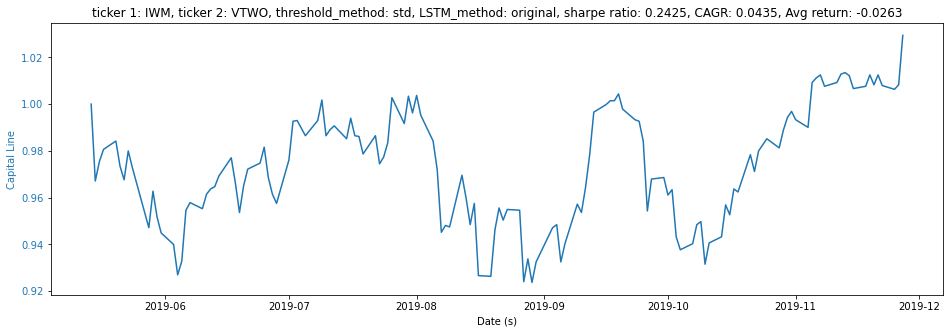

Annual return (std) :  0.04352258277891652
Sharpe ratio (std) : 0.24253807060073762
CAGR (std) :  0.04352258277891652
Avg_return (std) :  -0.02634007433595431
-------------------------------------
threshold:  0.2690479087684764
average return -0.024913
[-0.00415213  0.00390643]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


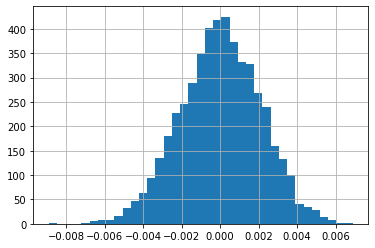

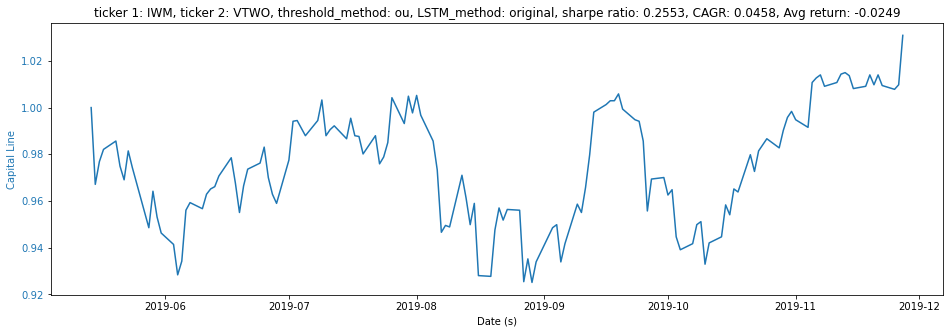

Annual return (ou) :  0.045805648276415534
Sharpe ratio (ou) : 0.2552608978196858
CAGR (ou) :  0.045805648276415534
Avg_return (ou) :  -0.024913080465959955
['IWO', 'VTWG']
Epoch 1/20
313/313 [==============================] - 1s 4ms/step - loss: 0.0814
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0152
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0093
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0073
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 11/20
313/

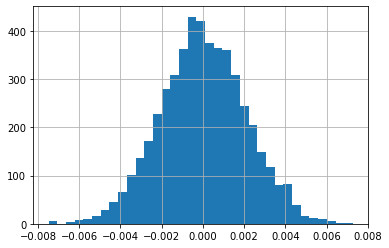

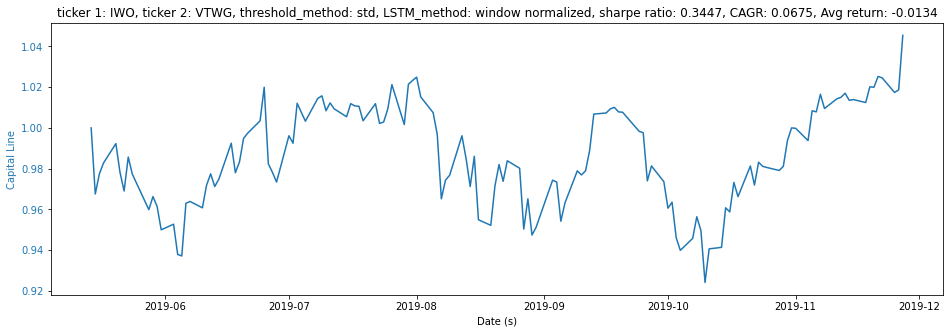

Annual return (std) :  0.06747921192270456
Sharpe ratio (std) : 0.34473556169928615
CAGR (std) :  0.06747921192270456
Avg_return (std) :  -0.013430733152962686
-------------------------------------
threshold:  0.7766631194706869
average return -0.020883
[-0.0056967   0.00591767]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


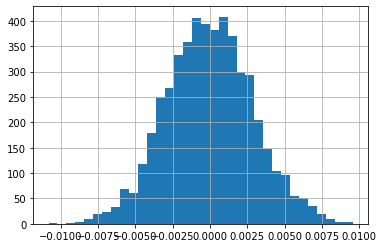

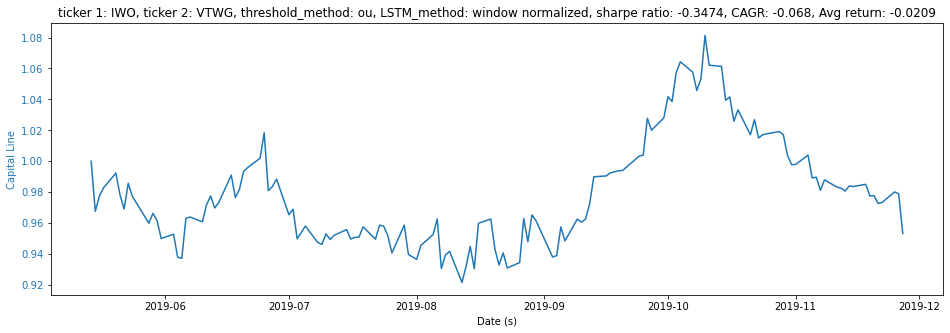

Annual return (ou) :  -0.06801025997574073
Sharpe ratio (ou) : -0.3474485623944104
CAGR (ou) :  -0.06801025997574073
Avg_return (ou) :  -0.02088310097742223
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 4ms/step - loss: 0.0906
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0147
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0087
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 10/20
313/31

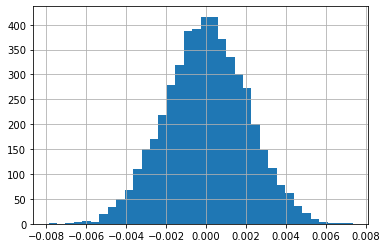

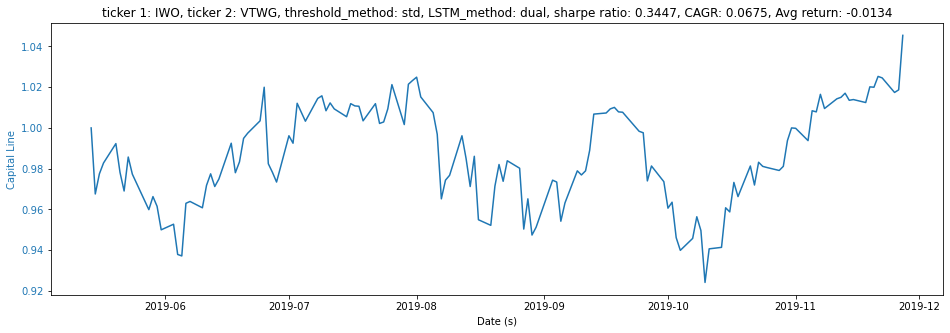

Annual return (dual+std) :  0.06747833867292585
Sharpe ratio (dual+std) : 0.34473077734821994
CAGR (dual+std) :  0.06747833867292585
Avg_return (dual+std) :  -0.013430866439544276
-------------------------------------
threshold:  0.7928446538902976
average return 0.010054
[-0.00424808  0.00425382]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


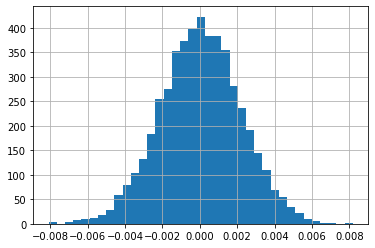

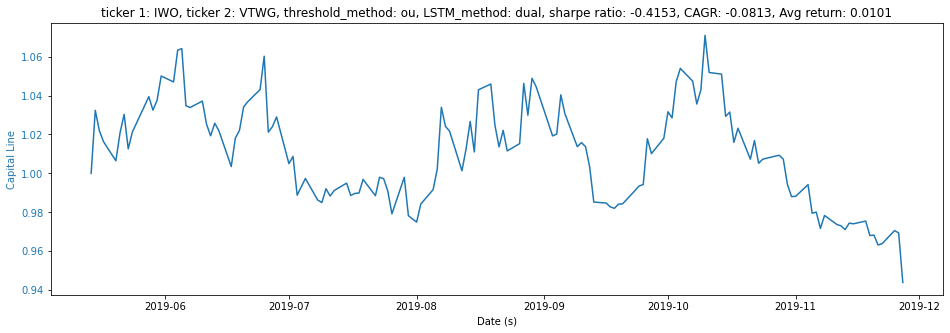

Annual return (dual+ou) :  -0.0812955706599664
Sharpe ratio (dual+ou) : -0.4153197280747783
CAGR (dual+ou) :  -0.0812955706599664
Avg_return (dual+ou) :  0.010053578902810166
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0402
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0172
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0113
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0092
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0095
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0056
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 10/20
313/31

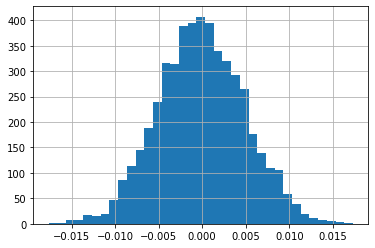

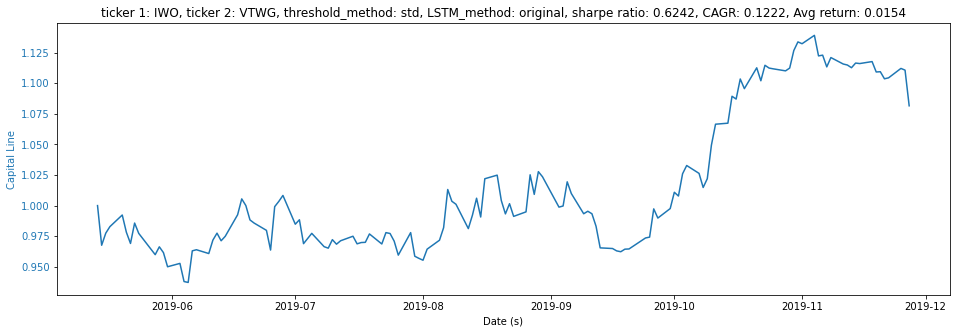

Annual return (std) :  0.12218344214542842
Sharpe ratio (std) : 0.6242063792790519
CAGR (std) :  0.12218344214542842
Avg_return (std) :  0.015445959180494018
-------------------------------------
threshold:  0.5618725906993632
average return -0.021281
[-0.00632429  0.00644373]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


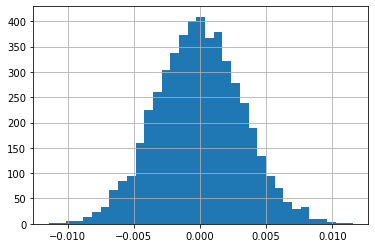

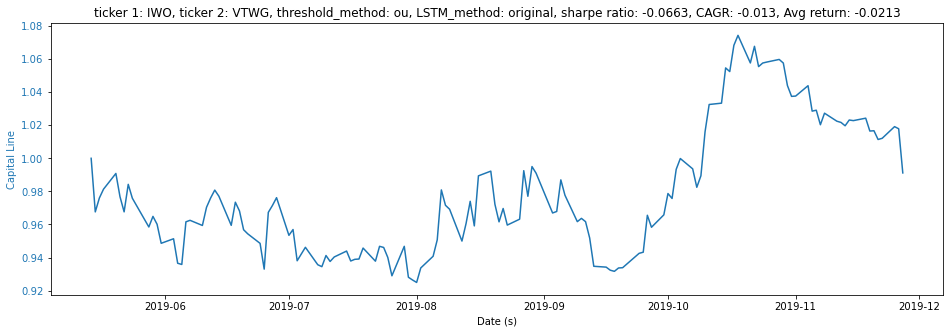

Annual return (ou) :  -0.012978001039732234
Sharpe ratio (ou) : -0.06630154542256961
CAGR (ou) :  -0.012978001039732234
Avg_return (ou) :  -0.021281363404721865
['JHSC', 'NUSC']
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.1653
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0412
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0243
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0212
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0197
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0191
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0188
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0187
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0184
Epoch 10/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0182
Epoch 11/20

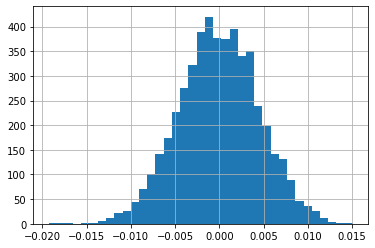

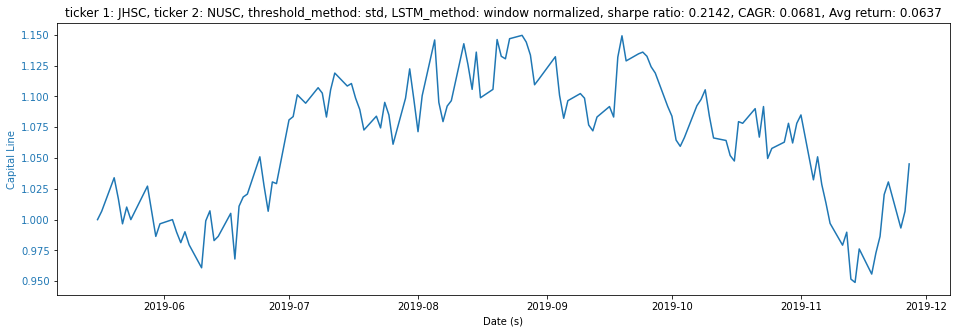

Annual return (std) :  0.06805652515149263
Sharpe ratio (std) : 0.21420574429662498
CAGR (std) :  0.06805652515149263
Avg_return (std) :  0.0636724960905701
-------------------------------------
threshold:  0.14586144169222579
average return -0.082520
[-0.00839242  0.00888085]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


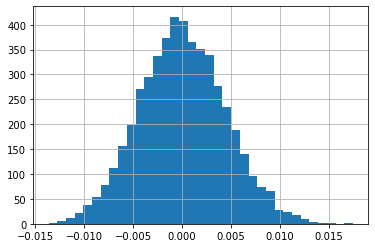

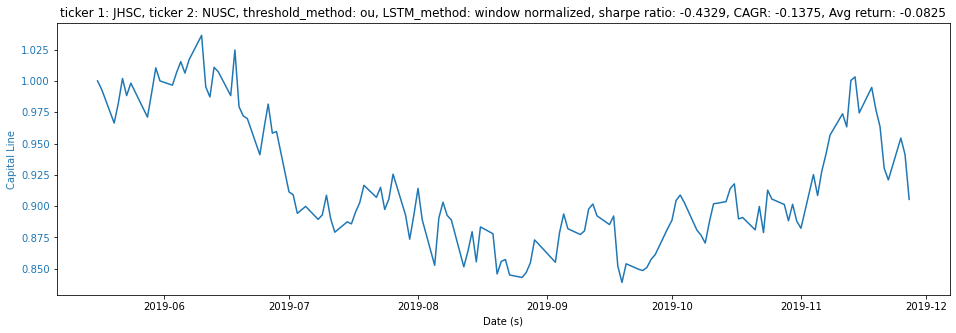

Annual return (ou) :  -0.13753148720388053
Sharpe ratio (ou) : -0.4328759735403984
CAGR (ou) :  -0.13753148720388053
Avg_return (ou) :  -0.08252030958012052
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.1329
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0189
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0094
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0063
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0048
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 10/20
308/30

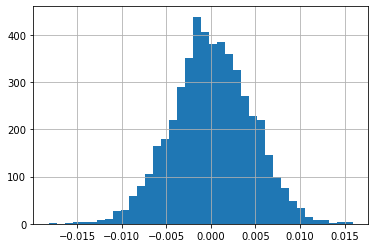

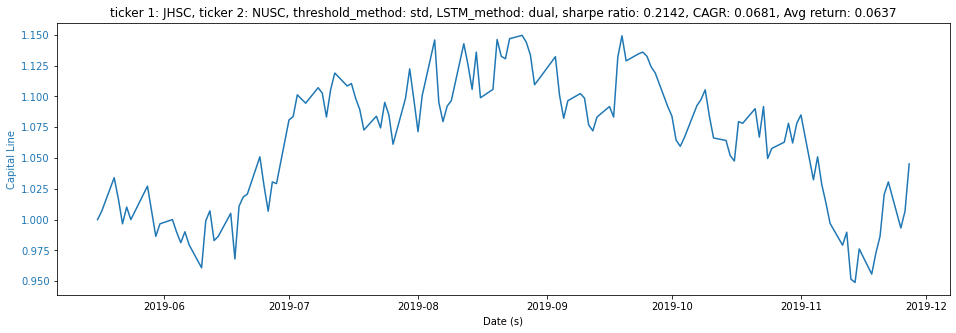

Annual return (dual+std) :  0.06805411407095052
Sharpe ratio (dual+std) : 0.21419804291807143
CAGR (dual+std) :  0.06805411407095052
Avg_return (dual+std) :  0.0636721673188892
-------------------------------------
threshold:  0.14647022876378205
average return 0.063672
[-0.00890081  0.00884173]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


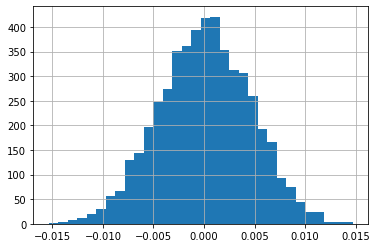

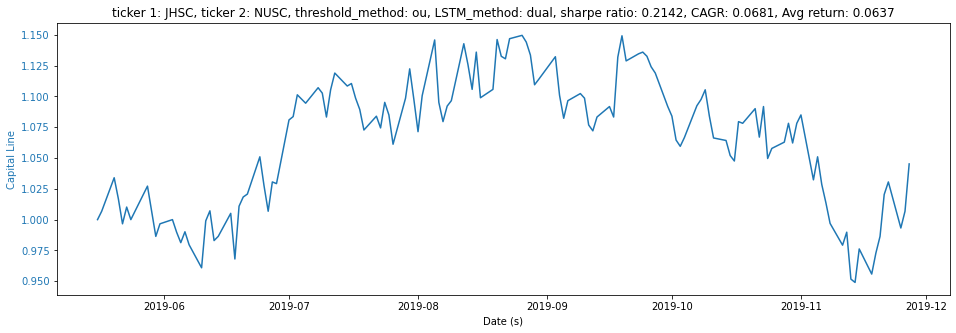

Annual return (dual+ou) :  0.06805411407095052
Sharpe ratio (dual+ou) : 0.21419804291807143
CAGR (dual+ou) :  0.06805411407095052
Avg_return (dual+ou) :  0.0636721673188892
========================↑ dual, ↓ single ====================================
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.0395
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0159
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0133
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0114
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0095
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0073
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0068
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 10/20
308/308 

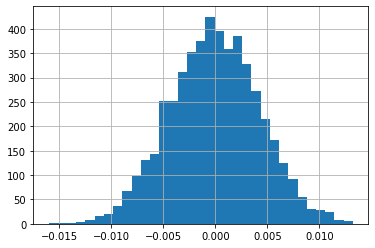

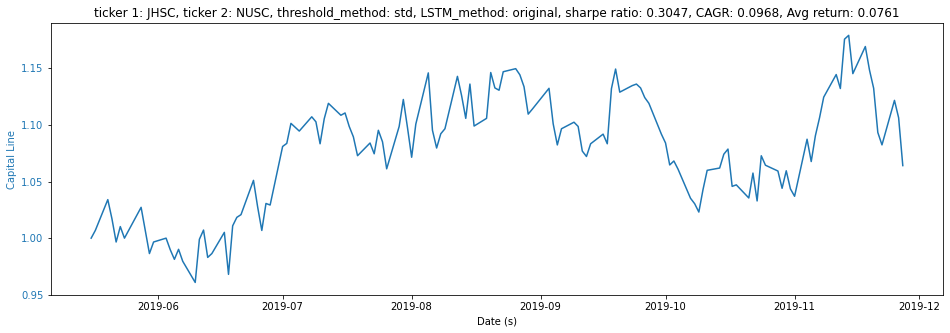

Annual return (std) :  0.0967953021828789
Sharpe ratio (std) : 0.3046601487198144
CAGR (std) :  0.0967953021828789
Avg_return (std) :  0.07614033686259541
-------------------------------------
threshold:  0.09667984896239487
average return 0.075553
[-0.00882155  0.00811233]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


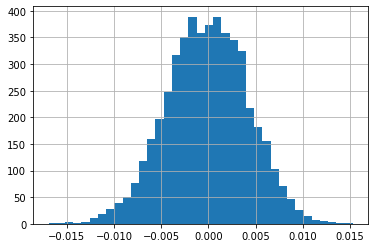

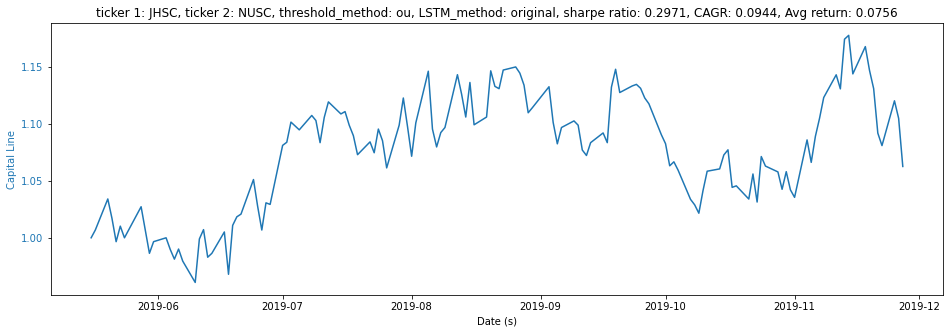

Annual return (ou) :  0.09438491971316387
Sharpe ratio (ou) : 0.29707354621809806
CAGR (ou) :  0.09438491971316387
Avg_return (ou) :  0.07555295145401471
['JHSC', 'SCHA']
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.1371
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0177
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0092
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0066
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 6/20
308/308 [==============================] - 1s 3ms/step - loss: 0.0054
Epoch 7/20
308/308 [==============================] - 1s 3ms/step - loss: 0.0052
Epoch 8/20
308/308 [==============================] - 1s 3ms/step - loss: 0.0050
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 10/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0048
Epoch 11/20
308/30

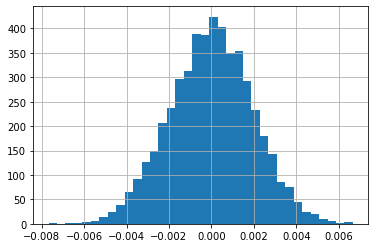

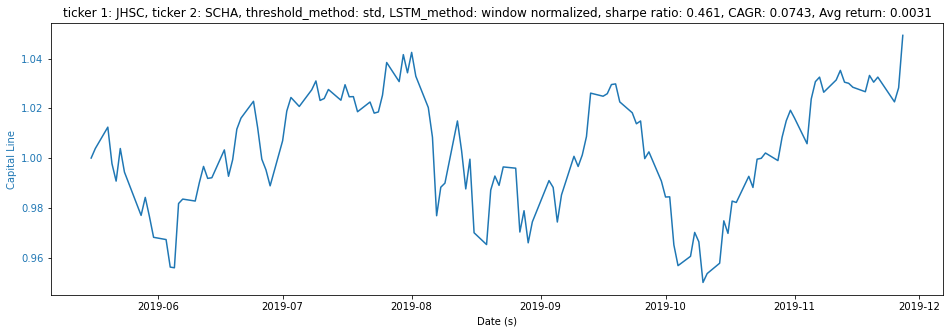

Annual return (std) :  0.07425584608410207
Sharpe ratio (std) : 0.4610391116833202
CAGR (std) :  0.07425584608410207
Avg_return (std) :  0.0030862958163800987
-------------------------------------
threshold:  0.5375805213073447
average return -0.009918
[-0.00382253  0.00392217]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


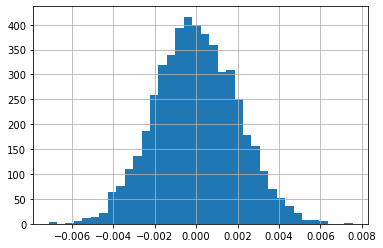

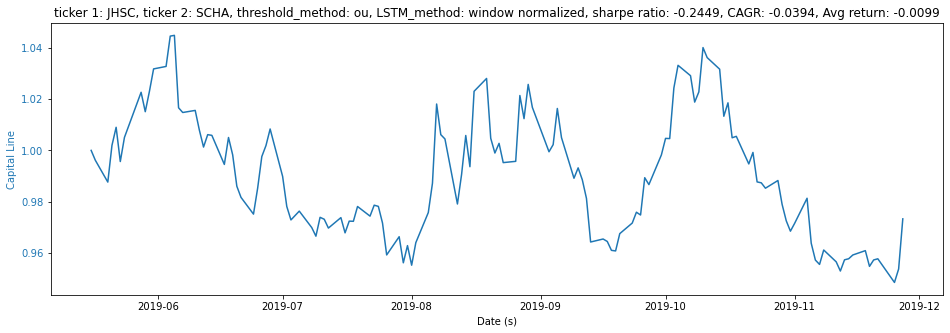

Annual return (ou) :  -0.039449164019054295
Sharpe ratio (ou) : -0.24493165851743345
CAGR (ou) :  -0.039449164019054295
Avg_return (ou) :  -0.009917836900376563
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.1465
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0262
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0108
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0072
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0056
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 10/20
30

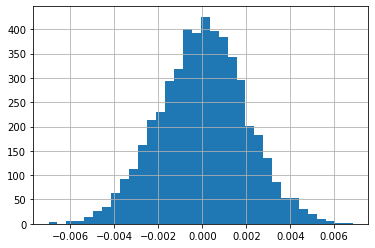

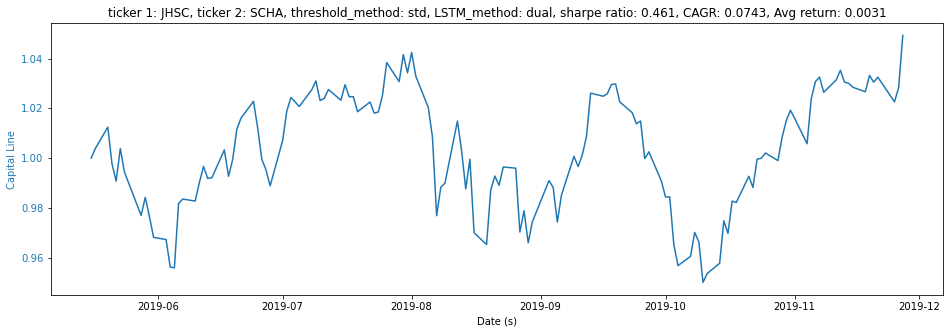

Annual return (dual+std) :  0.0742566187212772
Sharpe ratio (dual+std) : 0.4610441282506594
CAGR (dual+std) :  0.0742566187212772
Avg_return (dual+std) :  0.0030864269024434773
-------------------------------------
threshold:  0.538046818939481
average return -0.010799
[-0.00406143  0.00404285]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


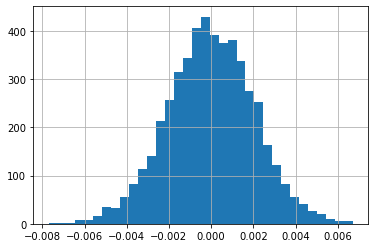

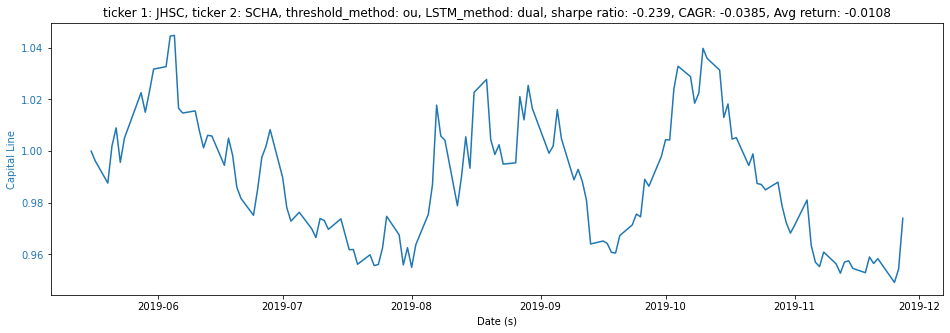

Annual return (dual+ou) :  -0.03849772720650324
Sharpe ratio (dual+ou) : -0.23902449889585678
CAGR (dual+ou) :  -0.03849772720650313
Avg_return (dual+ou) :  -0.010799260729151642
========================↑ dual, ↓ single ====================================
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.0434
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0175
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0136
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0109
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0088
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0076
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 10/20
30

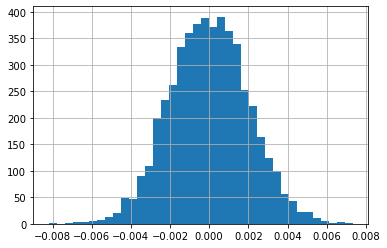

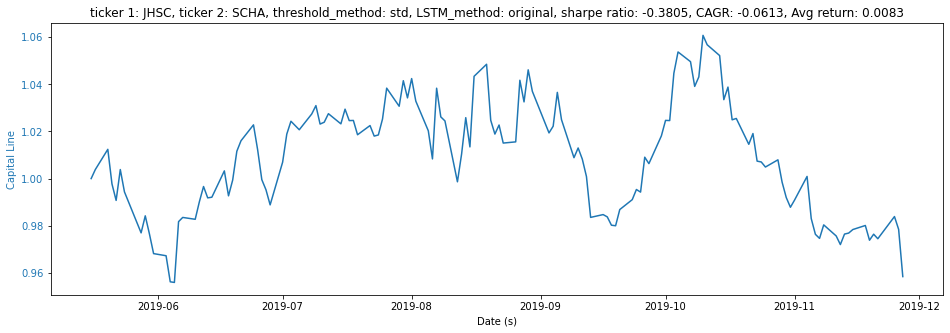

Annual return (std) :  -0.06128456129778892
Sharpe ratio (std) : -0.3805030440756639
CAGR (std) :  -0.06128456129778892
Avg_return (std) :  0.008305201157104229
-------------------------------------
threshold:  0.4298944343994388
average return -0.127277
[-0.01478751  0.01448481]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


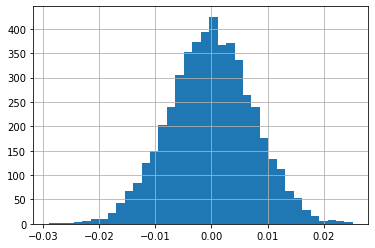

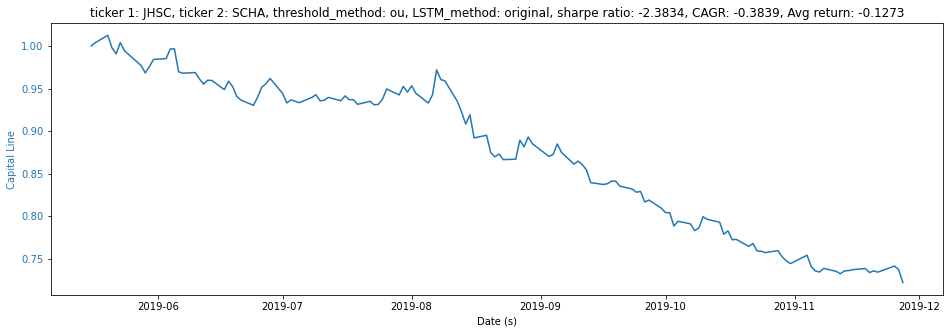

Annual return (ou) :  -0.38386927123982173
Sharpe ratio (ou) : -2.3833641481762338
CAGR (ou) :  -0.3838692712398216
Avg_return (ou) :  -0.12727680800486396
['NUSC', 'SCHA']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0960
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0129
Epoch 3/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0073
Epoch 4/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0059
Epoch 5/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0053
Epoch 6/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0048
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 11/20
313/

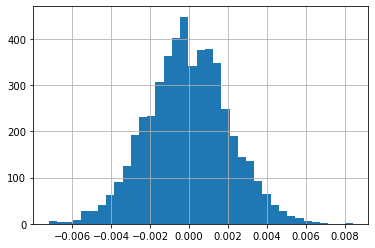

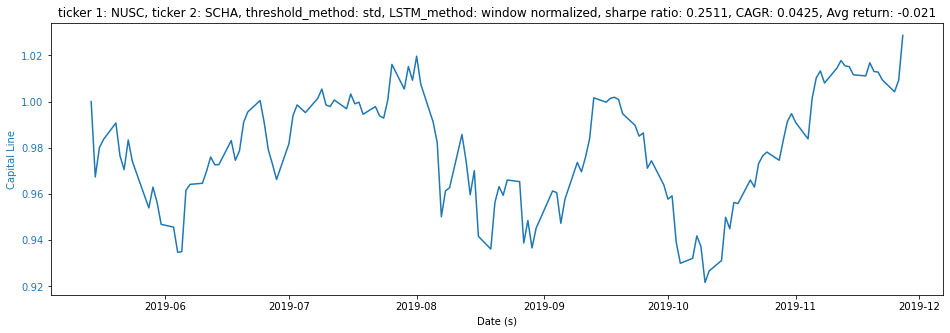

Annual return (std) :  0.04247879384033815
Sharpe ratio (std) : 0.2511066485152671
CAGR (std) :  0.042478793840337925
Avg_return (std) :  -0.02104944234641172
-------------------------------------
threshold:  0.4854517004248183
average return -0.064676
[-0.00767508  0.00781884]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


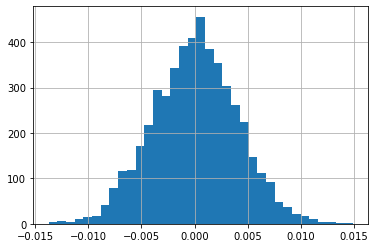

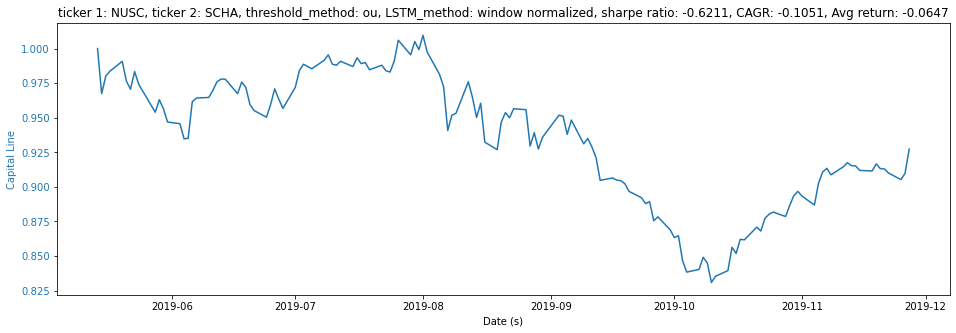

Annual return (ou) :  -0.10506578104249131
Sharpe ratio (ou) : -0.6210796909719615
CAGR (ou) :  -0.10506578104249131
Avg_return (ou) :  -0.06467643310405778
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.2266
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0314
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0147
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0089
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0068
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049A: 0s - los
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 1

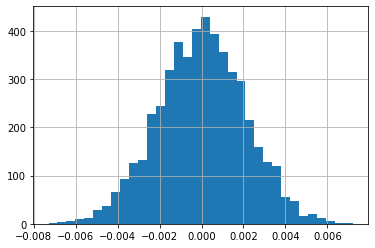

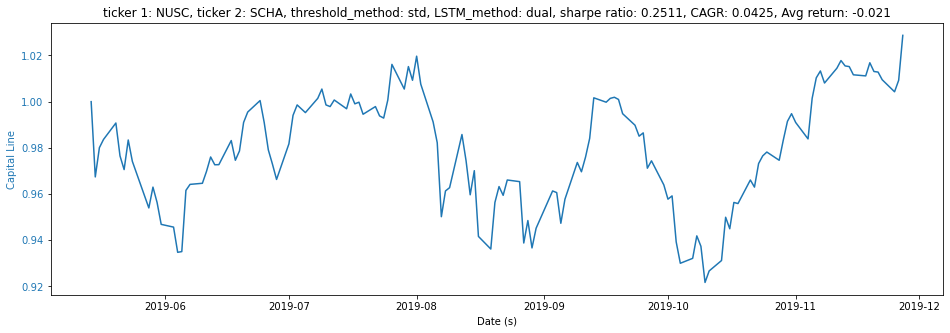

Annual return (dual+std) :  0.042479177667169576
Sharpe ratio (dual+std) : 0.25110910905595657
CAGR (dual+std) :  0.042479177667169576
Avg_return (dual+std) :  -0.021049423035376012
-------------------------------------
threshold:  0.48515411524825586
average return -0.066720
[-0.00783571  0.0075785 ]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


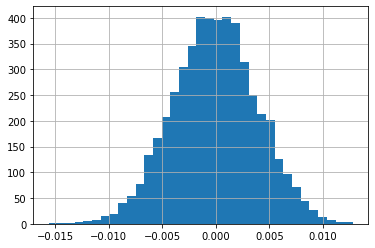

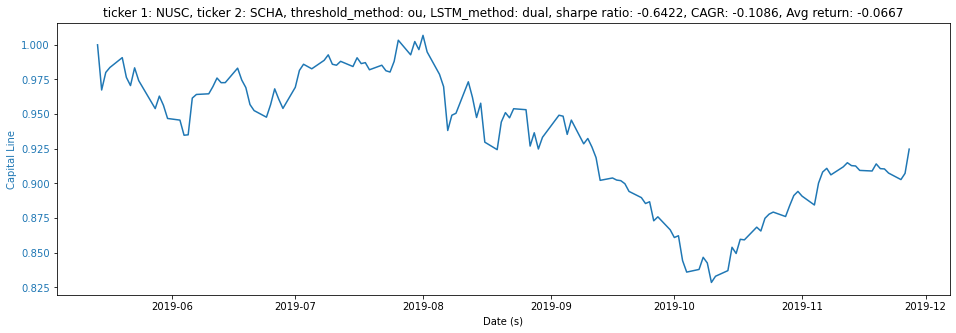

Annual return (dual+ou) :  -0.10864689063451394
Sharpe ratio (dual+ou) : -0.6422493420822047
CAGR (dual+ou) :  -0.10864689063451394
Avg_return (dual+ou) :  -0.06671965681696047
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0457
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0230
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0132
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0104
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0083
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0070
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 10/20
313/

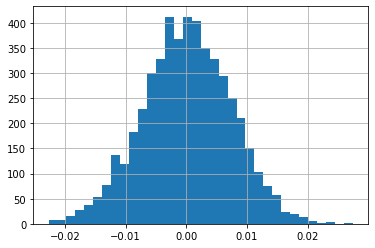

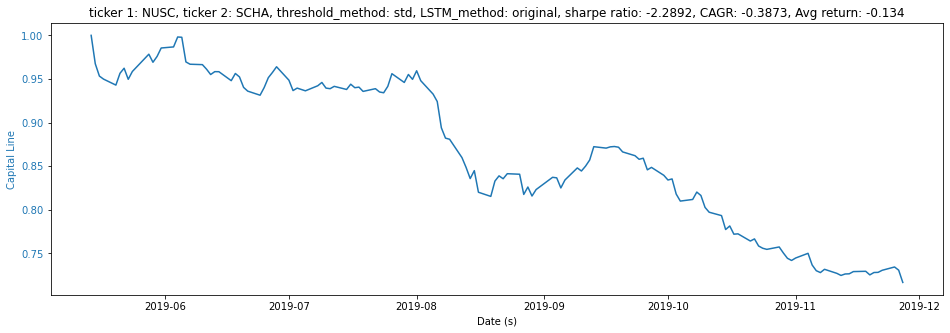

Annual return (std) :  -0.3872571395695079
Sharpe ratio (std) : -2.2892099555510557
CAGR (std) :  -0.3872571395695079
Avg_return (std) :  -0.13398133357633474
-------------------------------------
threshold:  0.34329156249387094
average return -0.090559
[-0.0128311   0.01241106]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


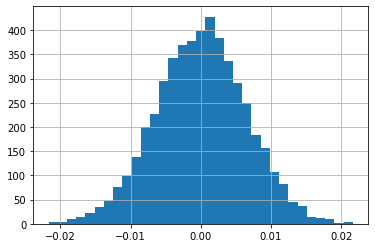

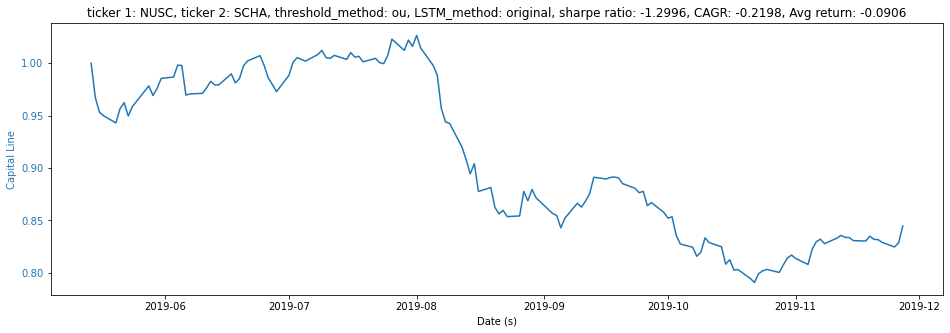

Annual return (ou) :  -0.2198434059397858
Sharpe ratio (ou) : -1.299569877779566
CAGR (ou) :  -0.21984340593978569
Avg_return (ou) :  -0.09055868219775348
['NUSC', 'SMLF']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0973
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0117
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0060
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0048
Epoch 11/20
313/3

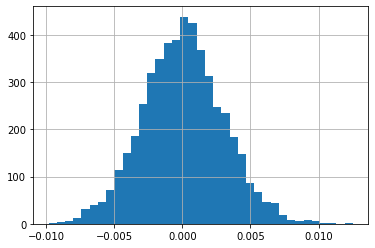

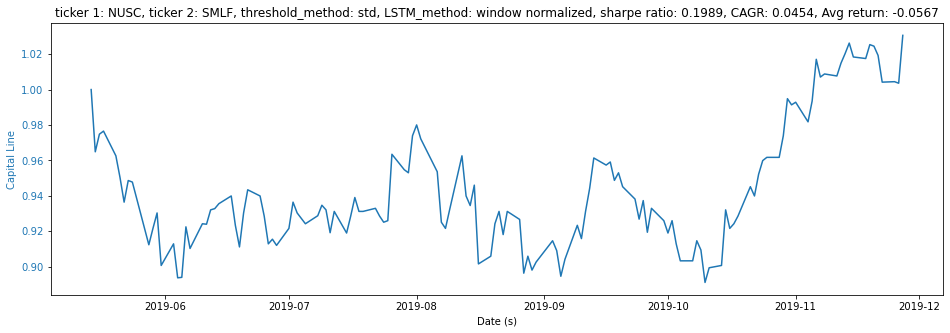

Annual return (std) :  0.04536857234554792
Sharpe ratio (std) : 0.19889284796245726
CAGR (std) :  0.04536857234554792
Avg_return (std) :  -0.05669030015539324
-------------------------------------
threshold:  0.19291389186260016
average return 0.005853
[-0.00654878  0.00695161]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.049799999999999955


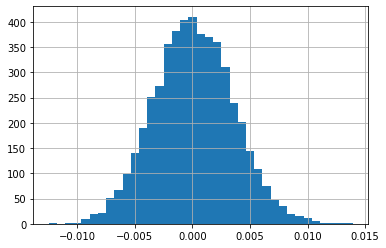

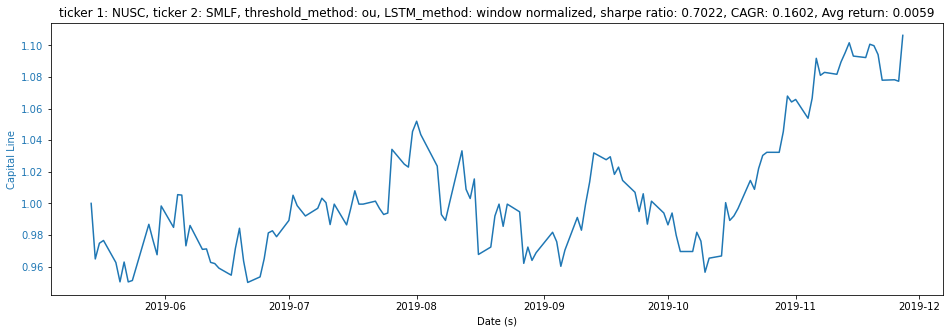

Annual return (ou) :  0.16018333871807733
Sharpe ratio (ou) : 0.702233259427211
CAGR (ou) :  0.16018333871807733
Avg_return (ou) :  0.005853429977456968
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1330
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0137
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0043
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 10/20
313/313 [=

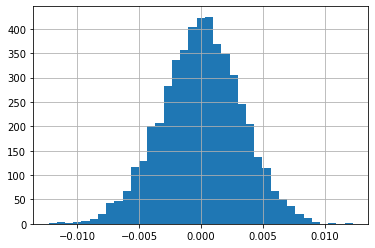

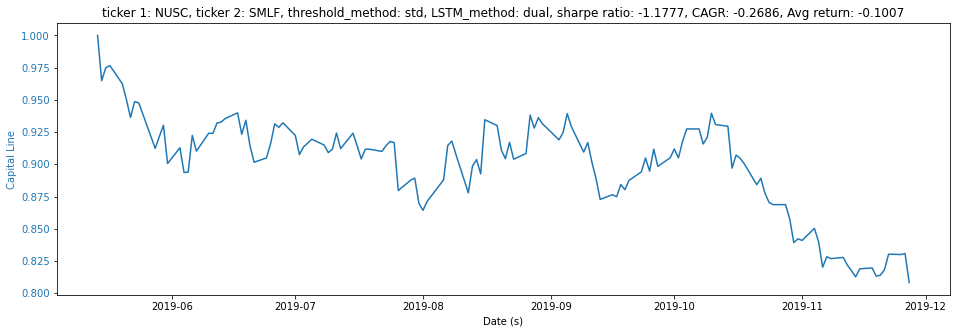

Annual return (dual+std) :  -0.268646623165664
Sharpe ratio (dual+std) : -1.1777307347633057
CAGR (dual+std) :  -0.2686466231656639
Avg_return (dual+std) :  -0.100720319822564
-------------------------------------
threshold:  0.19230270100334146
average return 0.029070
[-0.00846158  0.00789728]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


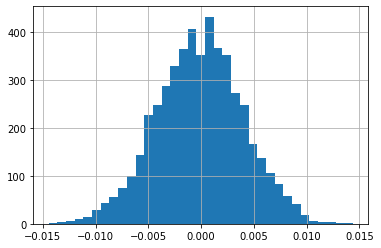

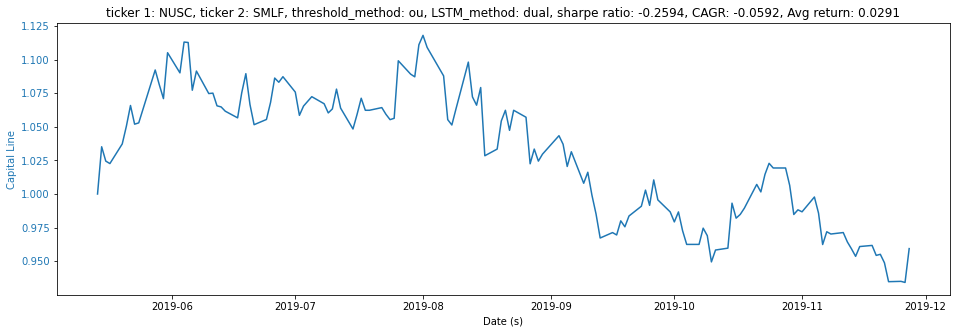

Annual return (dual+ou) :  -0.05916342318343926
Sharpe ratio (dual+ou) : -0.25936891011645513
CAGR (dual+ou) :  -0.05916342318343926
Avg_return (dual+ou) :  0.029069582690717185
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0367
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0177
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0116
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0086
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0066
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0059
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0036
Epoch 10/20
313

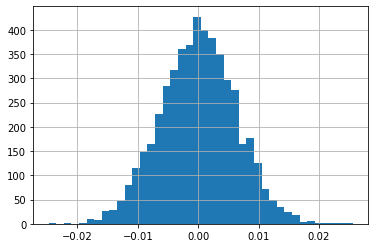

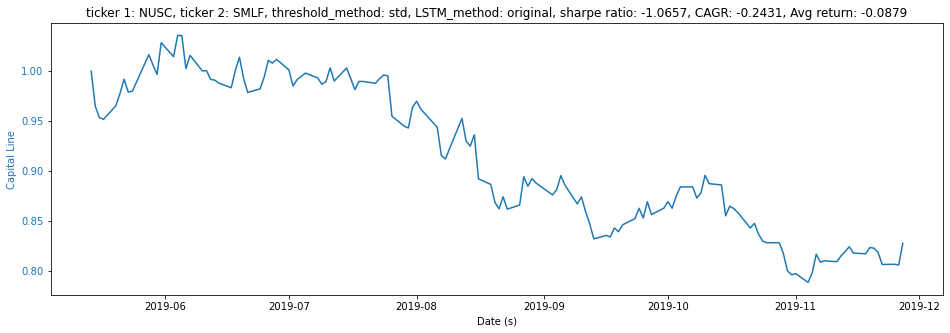

Annual return (std) :  -0.2430957052973689
Sharpe ratio (std) : -1.065715976789034
CAGR (std) :  -0.2430957052973689
Avg_return (std) :  -0.08788012501182607
-------------------------------------
threshold:  0.1150688690626743
average return -0.104958
[-0.01598663  0.01586237]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


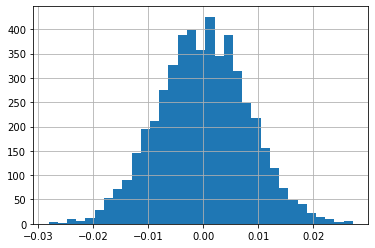

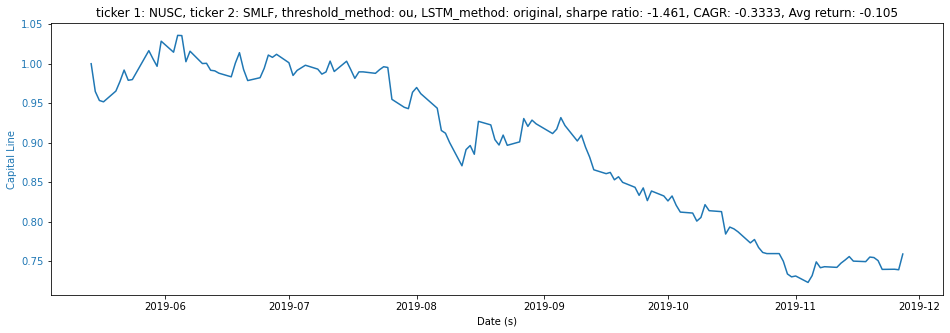

Annual return (ou) :  -0.33325540392773556
Sharpe ratio (ou) : -1.4609703116006254
CAGR (ou) :  -0.33325540392773556
Avg_return (ou) :  -0.10495794273143505
['CALF', 'EES']
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.1333
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0183
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0099
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0078
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0072
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0068
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0066
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 10/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0063
Epoch 11/20
308/

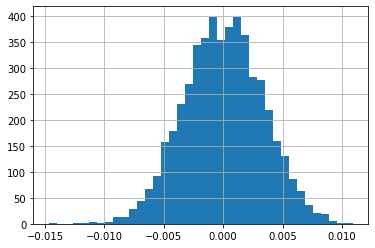

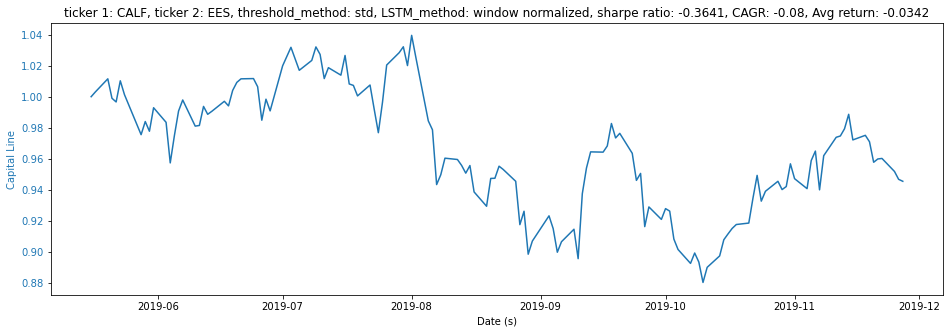

Annual return (std) :  -0.07996261595380671
Sharpe ratio (std) : -0.36405839750480024
CAGR (std) :  -0.07996261595380671
Avg_return (std) :  -0.03422297033399939
-------------------------------------
threshold:  0.2281280397582238
average return 0.038749
[-0.00861819  0.00879764]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


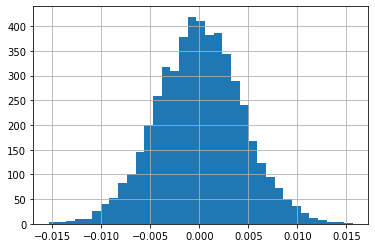

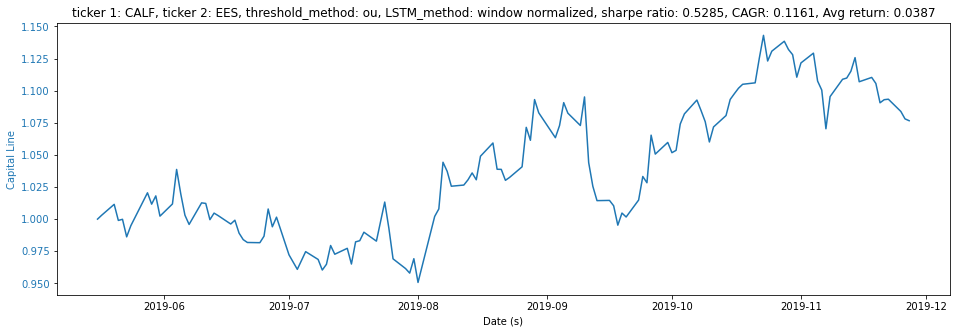

Annual return (ou) :  0.1160770929911148
Sharpe ratio (ou) : 0.5284824659284943
CAGR (ou) :  0.1160770929911148
Avg_return (ou) :  0.03874919948336369
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.0968
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0194
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0125
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0099
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0081
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0068
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 10/20
308/308 [===

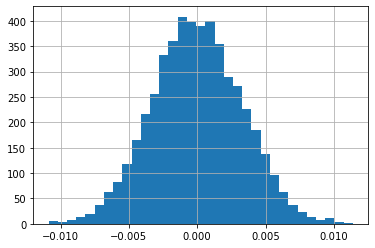

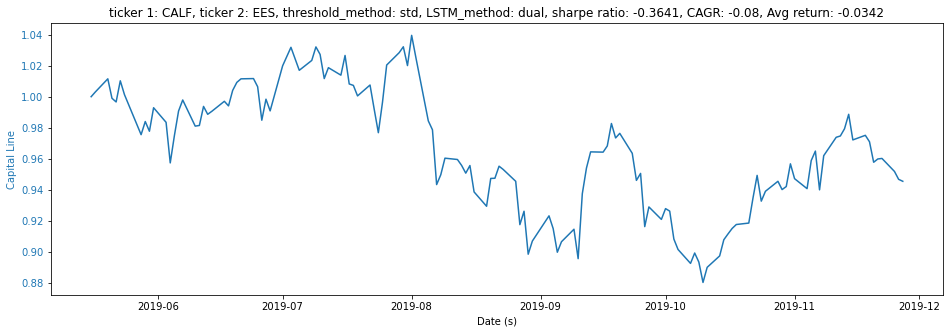

Annual return (dual+std) :  -0.07996257993866396
Sharpe ratio (dual+std) : -0.3640586013498178
CAGR (dual+std) :  -0.07996257993866396
Avg_return (dual+std) :  -0.03422286713149386
-------------------------------------
threshold:  0.22936513660340266
average return -0.034223
[-0.00668252  0.00628942]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


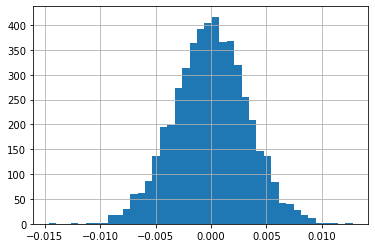

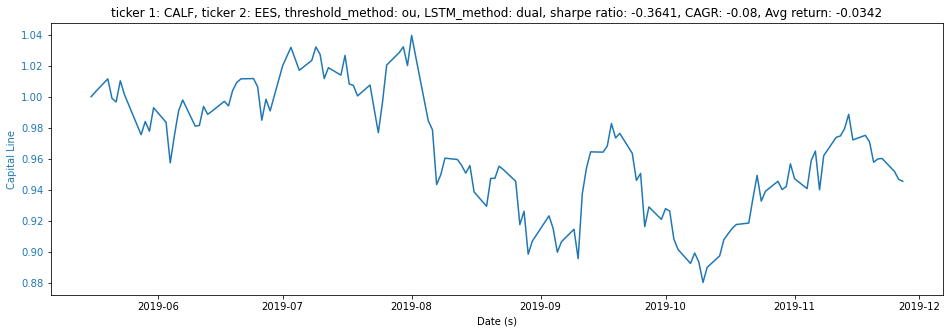

Annual return (dual+ou) :  -0.07996257993866396
Sharpe ratio (dual+ou) : -0.3640586013498178
CAGR (dual+ou) :  -0.07996257993866396
Avg_return (dual+ou) :  -0.03422286713149386
========================↑ dual, ↓ single ====================================
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.0314
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0202
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0138
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0104
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0077
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0075
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 10/20
308/

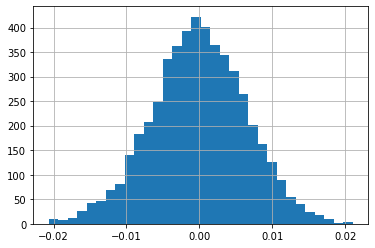

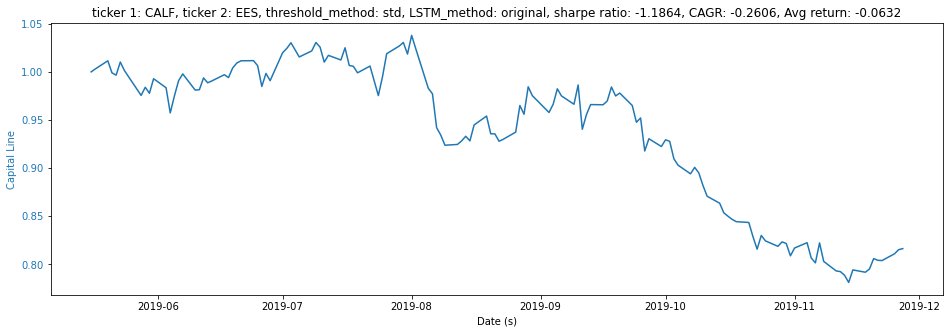

Annual return (std) :  -0.2605939796906229
Sharpe ratio (std) : -1.186447740634169
CAGR (std) :  -0.2605939796906229
Avg_return (std) :  -0.063162910582856
-------------------------------------
threshold:  0.13733681985795868
average return -0.045409
[-0.00862658  0.00854608]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


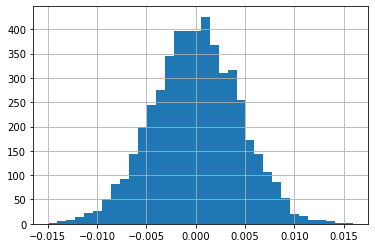

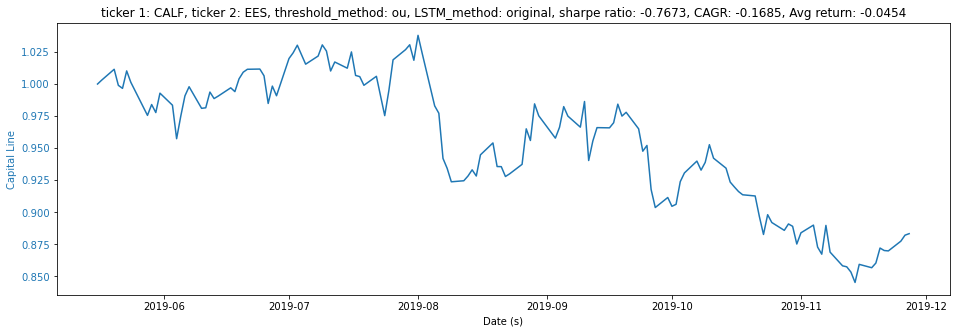

Annual return (ou) :  -0.16853454746624807
Sharpe ratio (ou) : -0.7673140925877164
CAGR (ou) :  -0.16853454746624807
Avg_return (ou) :  -0.04540862432023265
['CALF', 'EWSC']
Epoch 1/20
299/299 [==============================] - 1s 3ms/step - loss: 0.1385
Epoch 2/20
299/299 [==============================] - 1s 3ms/step - loss: 0.0249
Epoch 3/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0115
Epoch 4/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0087
Epoch 5/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0076
Epoch 6/20
299/299 [==============================] - 1s 3ms/step - loss: 0.0072
Epoch 7/20
299/299 [==============================] - 1s 3ms/step - loss: 0.0069
Epoch 8/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0067
Epoch 9/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 10/20
299/299 [==============================] - 1s 3ms/step - loss: 0.0064
Epoch 11/20
299

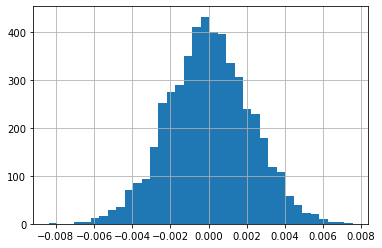

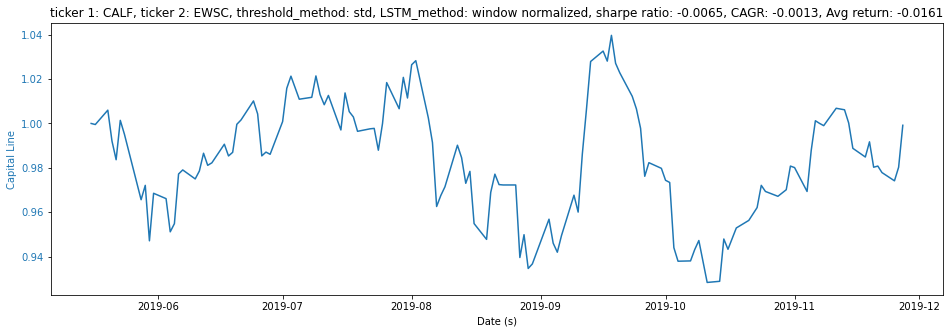

Annual return (std) :  -0.0012526859387848033
Sharpe ratio (std) : -0.006467563439639765
CAGR (std) :  -0.0012526859387848033
Avg_return (std) :  -0.016127605987671864
-------------------------------------
threshold:  0.43582571332527364
average return 0.006481
[-0.0043361   0.00424537]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0011999999999999789


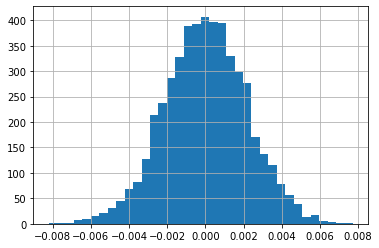

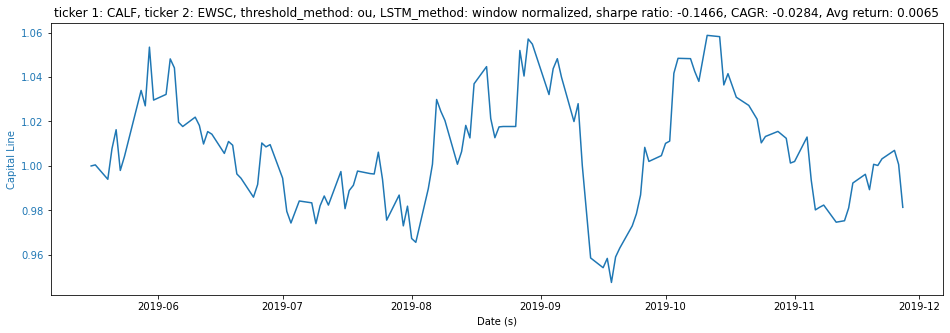

Annual return (ou) :  -0.028397829619878245
Sharpe ratio (ou) : -0.1466167687591448
CAGR (ou) :  -0.028397829619878245
Avg_return (ou) :  0.006480604356230786
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
299/299 [==============================] - 1s 3ms/step - loss: 0.1113
Epoch 2/20
299/299 [==============================] - 1s 3ms/step - loss: 0.0195
Epoch 3/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0116
Epoch 4/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0091
Epoch 5/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0081
Epoch 6/20
299/299 [==============================] - 1s 3ms/step - loss: 0.0073
Epoch 7/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0063
Epoch 8/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 9/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0056
Epoch 10/20
299/

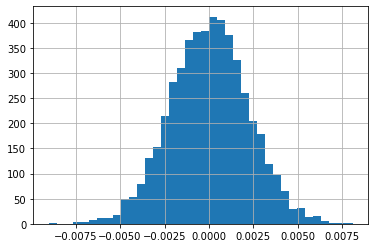

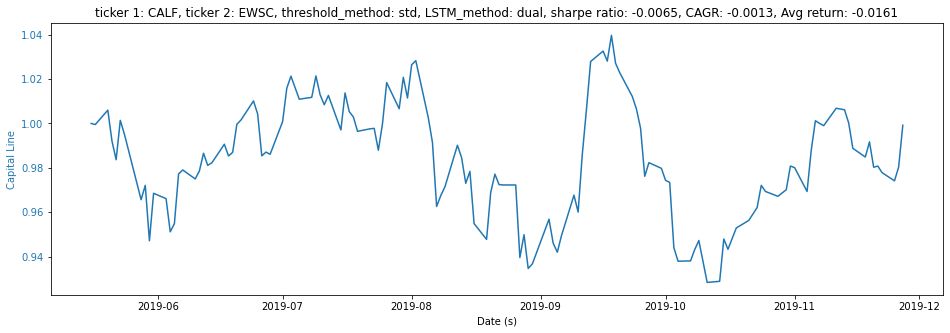

Annual return (dual+std) :  -0.0012535138766049947
Sharpe ratio (dual+std) : -0.006471836735289001
CAGR (dual+std) :  -0.0012535138766049947
Avg_return (dual+std) :  -0.016127784661796724
-------------------------------------
threshold:  0.4432079863505166
average return 0.006481
[-0.00423139  0.00425435]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0011999999999999789


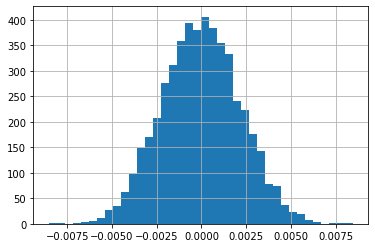

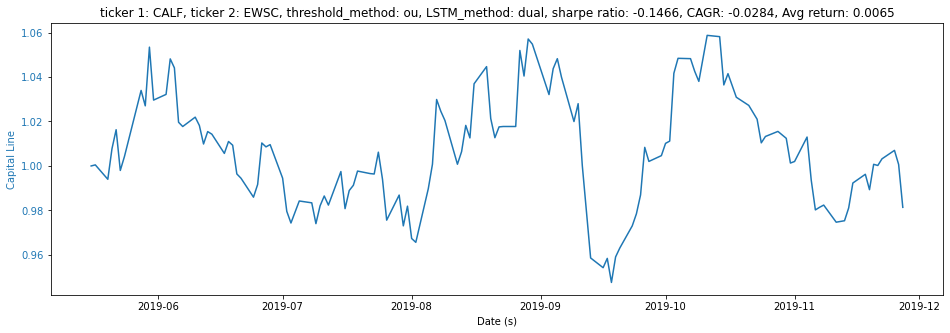

Annual return (dual+ou) :  -0.028397036644607687
Sharpe ratio (dual+ou) : -0.14661264494946846
CAGR (dual+ou) :  -0.028397036644607687
Avg_return (dual+ou) :  0.00648077924825143
========================↑ dual, ↓ single ====================================
Epoch 1/20
299/299 [==============================] - 1s 3ms/step - loss: 0.0445A: 1s - lo
Epoch 2/20
299/299 [==============================] - 1s 3ms/step - loss: 0.0199
Epoch 3/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0127
Epoch 4/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0091
Epoch 5/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0073
Epoch 6/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 7/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 8/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0036
Epoch 9/20
299/299 [==============================] - 1s 2ms/step - loss: 0.0033
Epoc

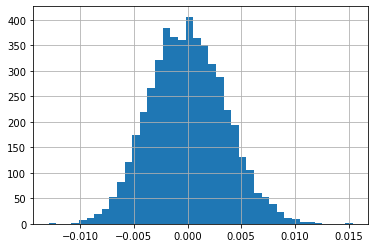

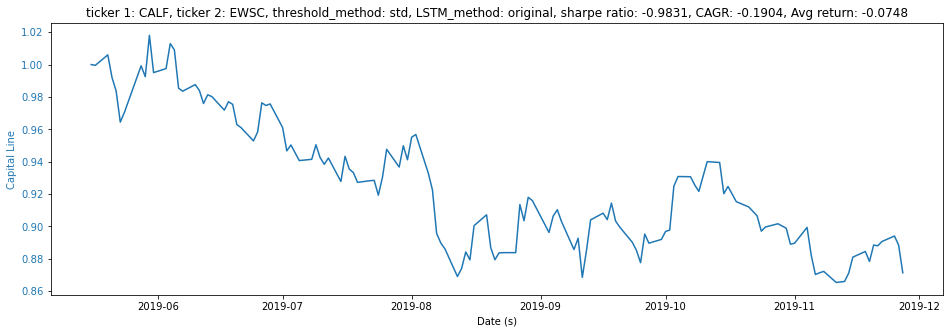

Annual return (std) :  -0.19040836307196274
Sharpe ratio (std) : -0.9830707528563021
CAGR (std) :  -0.19040836307196274
Avg_return (std) :  -0.07478724429731204
-------------------------------------
threshold:  0.30183691465414875
average return -0.009648
[-0.00380773  0.00373356]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


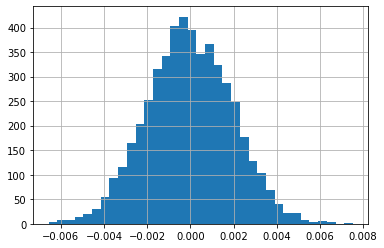

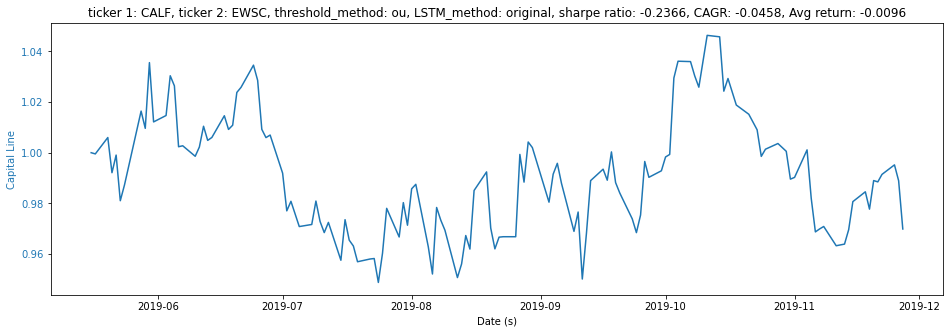

Annual return (ou) :  -0.04581891691564688
Sharpe ratio (ou) : -0.23656123302893864
CAGR (ou) :  -0.04581891691564688
Avg_return (ou) :  -0.009647731140589528
['CALF', 'FYT']
Epoch 1/20
308/308 [==============================] - 1s 4ms/step - loss: 0.2162
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0513
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0189
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0133
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0114
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0104
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0098
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0094
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0091
Epoch 10/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0089
Epoch 11/20
30

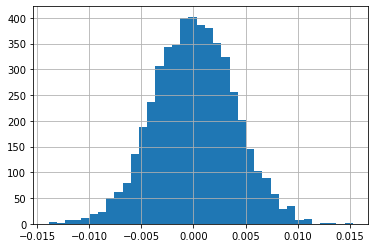

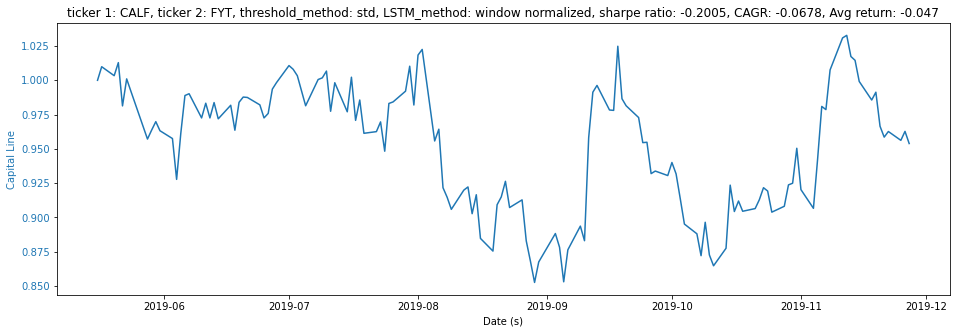

Annual return (std) :  -0.06783479395232439
Sharpe ratio (std) : -0.20050234513760593
CAGR (std) :  -0.06783479395232439
Avg_return (std) :  -0.04701343720884399
-------------------------------------
threshold:  0.24210376229909952
average return -0.124944
[-0.02444695  0.02418954]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


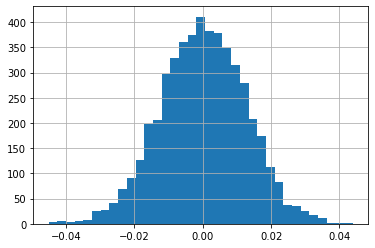

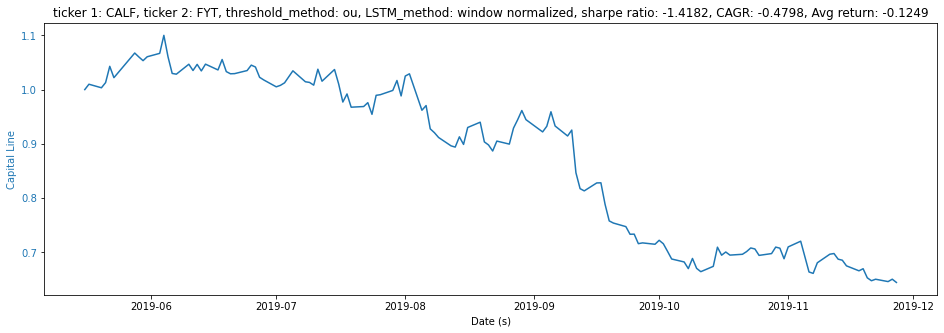

Annual return (ou) :  -0.47981044943565654
Sharpe ratio (ou) : -1.418197280896751
CAGR (ou) :  -0.47981044943565654
Avg_return (ou) :  -0.124944274317028
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.1007
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0192
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0115
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0092
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0080
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0072
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0056
Epoch 10/20
308/308 [

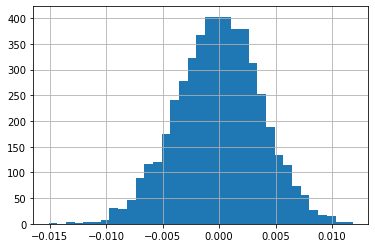

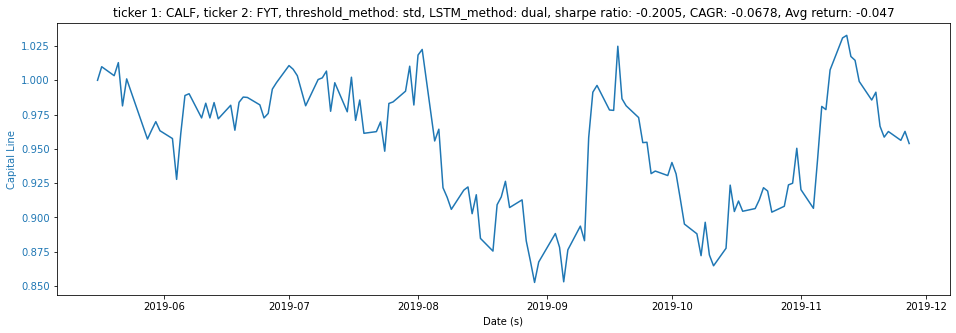

Annual return (dual+std) :  -0.06783462551038477
Sharpe ratio (dual+std) : -0.2005018554318343
CAGR (dual+std) :  -0.06783462551038477
Avg_return (dual+std) :  -0.04701333923771275
-------------------------------------
threshold:  0.2486989176263563
average return -0.008308
[-0.01594755  0.01531506]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.85


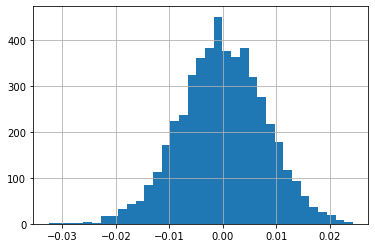

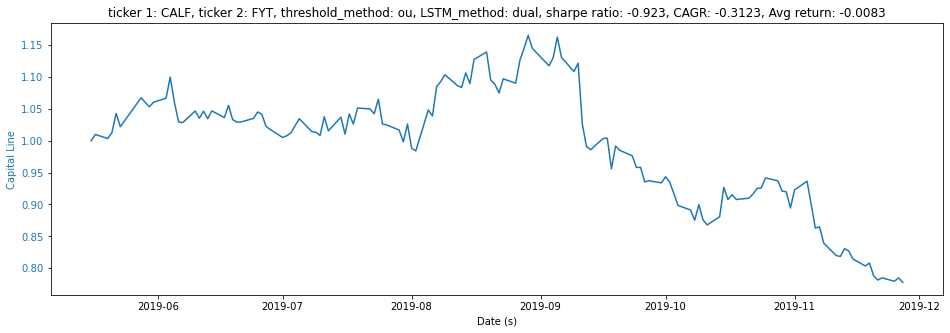

Annual return (dual+ou) :  -0.31227989446380056
Sharpe ratio (dual+ou) : -0.9230197378249558
CAGR (dual+ou) :  -0.31227989446380056
Avg_return (dual+ou) :  -0.008307606796779209
========================↑ dual, ↓ single ====================================
Epoch 1/20
308/308 [==============================] - 1s 3ms/step - loss: 0.0243
Epoch 2/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0149
Epoch 3/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0109
Epoch 4/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0080
Epoch 5/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 6/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 7/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 8/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0048
Epoch 9/20
308/308 [==============================] - 1s 2ms/step - loss: 0.0048
Epoch 10/20
308

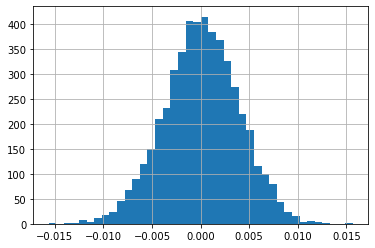

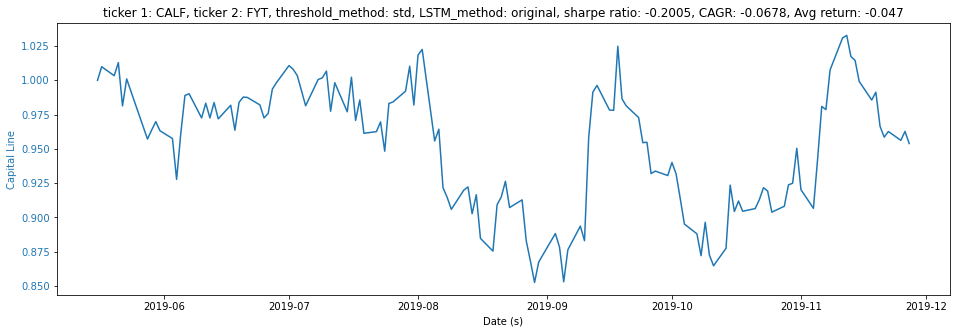

Annual return (std) :  -0.06783494884351216
Sharpe ratio (std) : -0.20050282753384524
CAGR (std) :  -0.06783494884351216
Avg_return (std) :  -0.0470133496398045
-------------------------------------
threshold:  0.15255296838754398
average return -0.047013
[-0.00760055  0.00740097]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


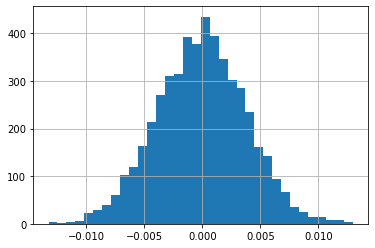

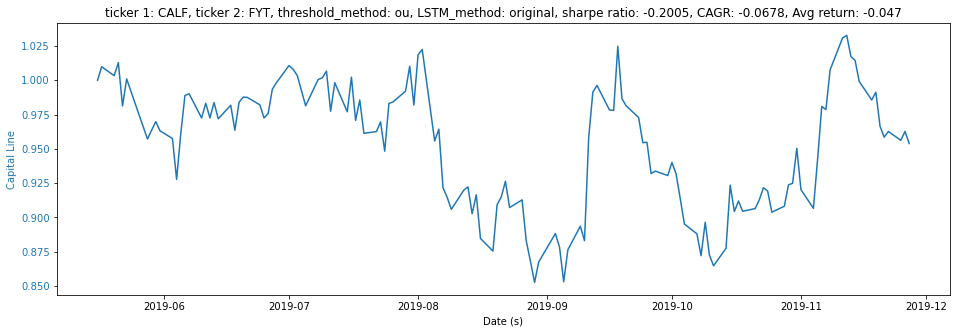

Annual return (ou) :  -0.06783494884351216
Sharpe ratio (ou) : -0.20050282753384524
CAGR (ou) :  -0.06783494884351216
Avg_return (ou) :  -0.0470133496398045
['CSA', 'CSB']
Epoch 1/20
306/306 [==============================] - 1s 3ms/step - loss: 7.8589
Epoch 2/20
306/306 [==============================] - 1s 2ms/step - loss: 7.7264
Epoch 3/20
306/306 [==============================] - 1s 2ms/step - loss: 7.6581
Epoch 4/20
306/306 [==============================] - 1s 2ms/step - loss: 7.6325
Epoch 5/20
306/306 [==============================] - 1s 2ms/step - loss: 7.6171
Epoch 6/20
306/306 [==============================] - 1s 2ms/step - loss: 7.5751
Epoch 7/20
306/306 [==============================] - 1s 2ms/step - loss: 7.5216
Epoch 8/20
306/306 [==============================] - 1s 2ms/step - loss: 7.5089
Epoch 9/20
306/306 [==============================] - 1s 2ms/step - loss: 7.5383
Epoch 10/20
306/306 [==============================] - 1s 2ms/step - loss: 7.5264
Epoch 11/20
306/3

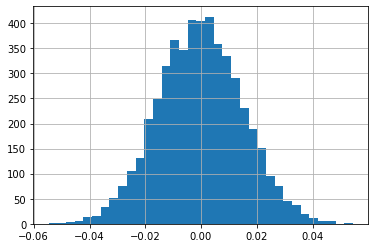

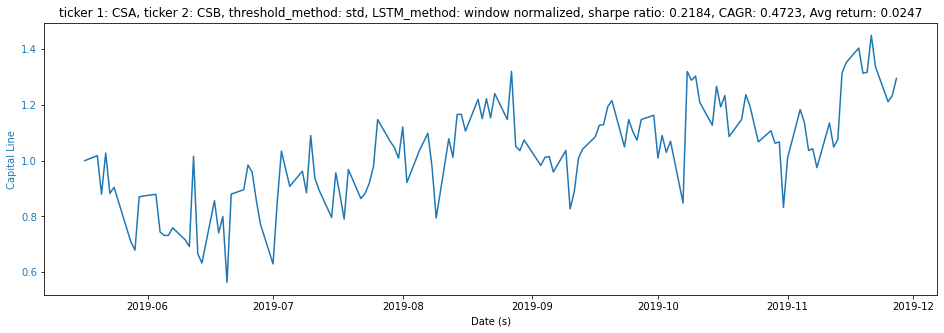

Annual return (std) :  0.47233574523861654
Sharpe ratio (std) : 0.21840171293143662
CAGR (std) :  0.47233574523861654
Avg_return (std) :  0.02473808226553534
-------------------------------------
threshold:  0.32835332098412745
average return 0.023291
[-0.02944579  0.03012702]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.06159999999999999


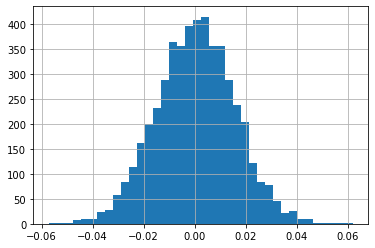

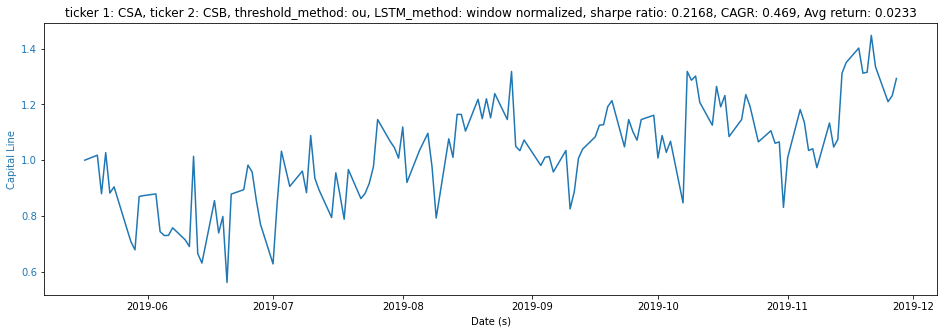

Annual return (ou) :  0.4689722893142454
Sharpe ratio (ou) : 0.21684649602766207
CAGR (ou) :  0.46897228931424517
Avg_return (ou) :  0.023291198220717915
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
306/306 [==============================] - 1s 3ms/step - loss: 0.1241
Epoch 2/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0180
Epoch 3/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0085
Epoch 4/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0066
Epoch 5/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 6/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 7/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 8/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 9/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 10/20
306/306 [

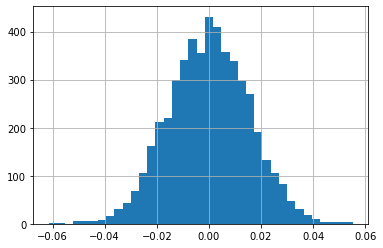

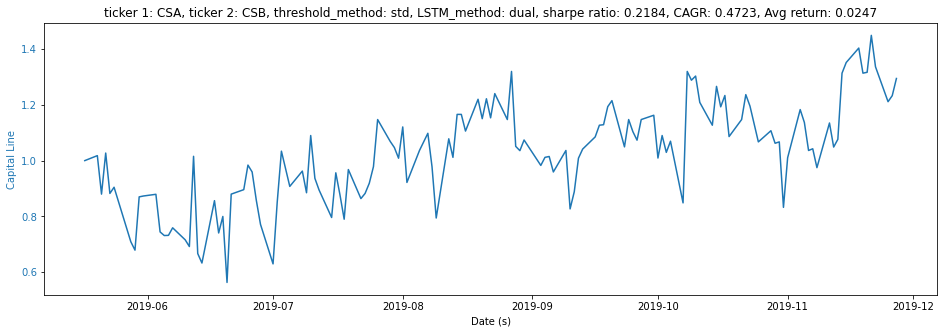

Annual return (dual+std) :  0.4723314323710981
Sharpe ratio (dual+std) : 0.21839971430059354
CAGR (dual+std) :  0.47233143237109787
Avg_return (dual+std) :  0.024737582768856604
-------------------------------------
threshold:  0.2864408397813069
average return -0.513883
[-0.04661719  0.04792269]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


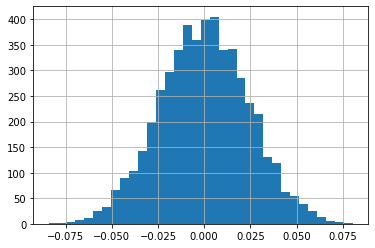

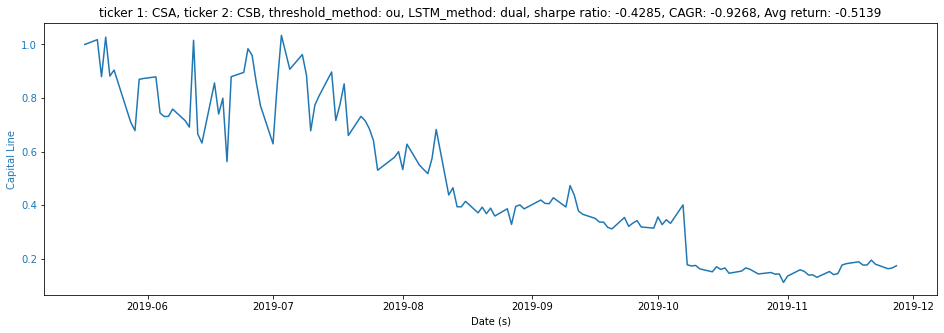

Annual return (dual+ou) :  -0.9268017828450386
Sharpe ratio (dual+ou) : -0.42854070407833145
CAGR (dual+ou) :  -0.9268017828450386
Avg_return (dual+ou) :  -0.5138828116304056
========================↑ dual, ↓ single ====================================
Epoch 1/20
306/306 [==============================] - 1s 4ms/step - loss: 0.0331
Epoch 2/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0091
Epoch 3/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 4/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0061
Epoch 5/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0063
Epoch 6/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 7/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 8/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 9/20
306/306 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 10/20
306/30

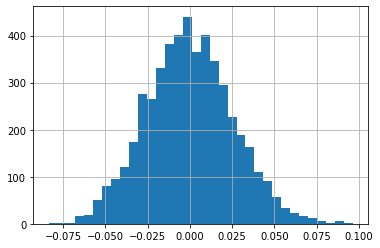

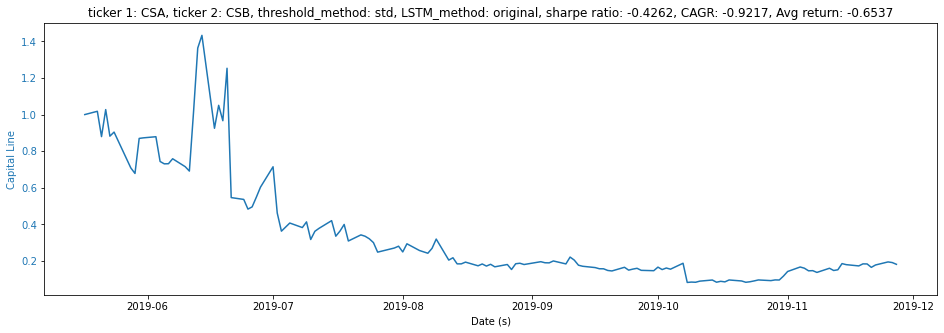

Annual return (std) :  -0.9216502105677562
Sharpe ratio (std) : -0.4261587053129693
CAGR (std) :  -0.9216502105677562
Avg_return (std) :  -0.6537016863419879
-------------------------------------
threshold:  0.20438579022308725
average return -0.653702
[-0.0498575   0.05068172]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


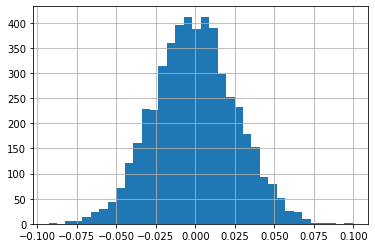

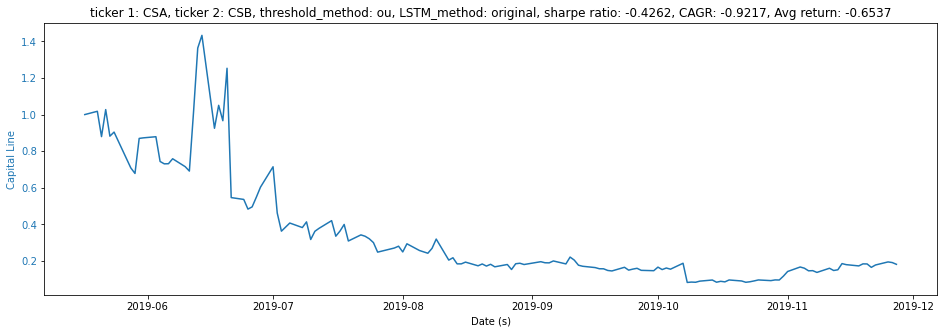

Annual return (ou) :  -0.9216502105677562
Sharpe ratio (ou) : -0.4261587053129693
CAGR (ou) :  -0.9216502105677562
Avg_return (ou) :  -0.6537016863419879
['CSA', 'DGRS']
Epoch 1/20
307/307 [==============================] - 1s 3ms/step - loss: 0.1302
Epoch 2/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0250
Epoch 3/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0125
Epoch 4/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0094
Epoch 5/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0082
Epoch 6/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0074
Epoch 7/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 8/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0066
Epoch 9/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 10/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 11/20
307/307

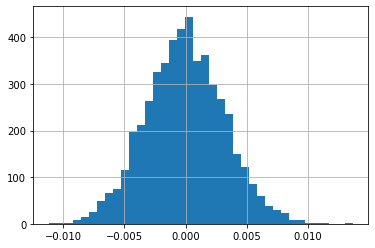

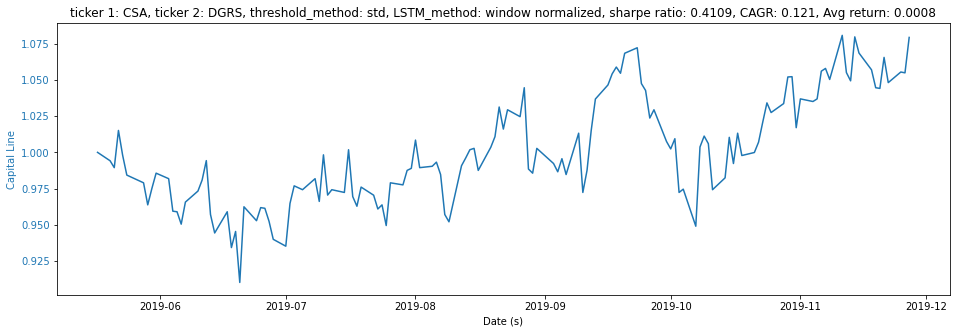

Annual return (std) :  0.12097452568568245
Sharpe ratio (std) : 0.410935307696434
CAGR (std) :  0.12097452568568245
Avg_return (std) :  0.0008301042880281567
-------------------------------------
threshold:  0.2647418811210525
average return -0.053296
[-0.00553114  0.00527279]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


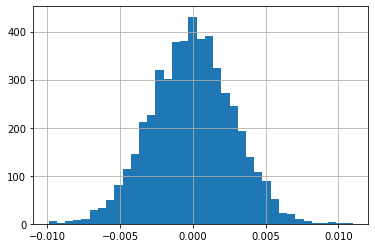

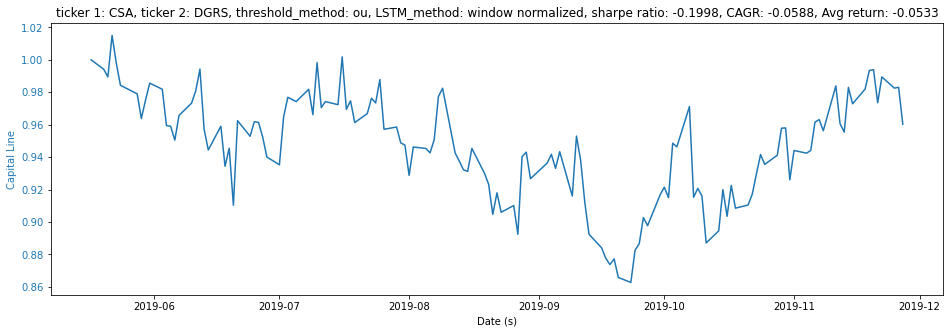

Annual return (ou) :  -0.058824857311893575
Sharpe ratio (ou) : -0.19982067053082692
CAGR (ou) :  -0.058824857311893575
Avg_return (ou) :  -0.053295540238919796
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
307/307 [==============================] - 1s 3ms/step - loss: 0.1103
Epoch 2/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0129
Epoch 3/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0073
Epoch 4/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 5/20
307/307 [==============================] - 1s 3ms/step - loss: 0.0048A: 0s - loss: 0
Epoch 6/20
307/307 [==============================] - 1s 3ms/step - loss: 0.0043
Epoch 7/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 8/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 9/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0037

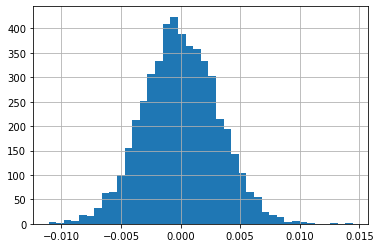

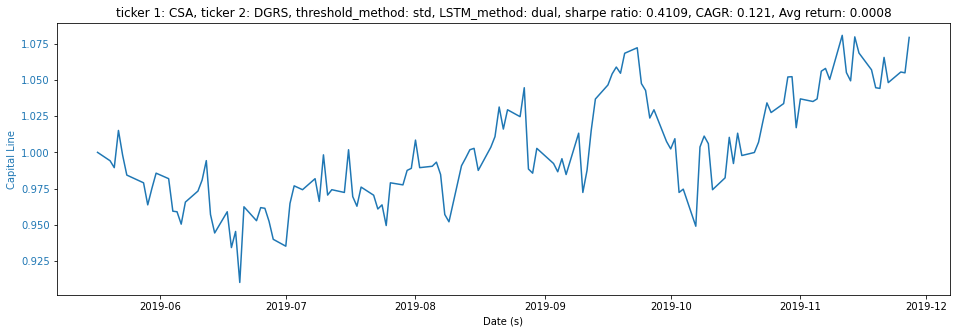

Annual return (dual+std) :  0.12097442593160834
Sharpe ratio (dual+std) : 0.41093496408069385
CAGR (dual+std) :  0.12097442593160834
Avg_return (dual+std) :  0.000830150653150599
-------------------------------------
threshold:  0.26605146482992
average return -0.062128
[-0.00577791  0.00592852]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


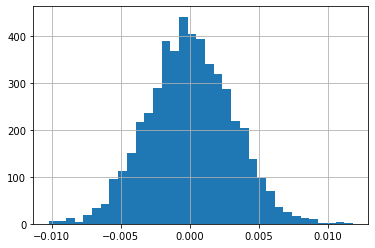

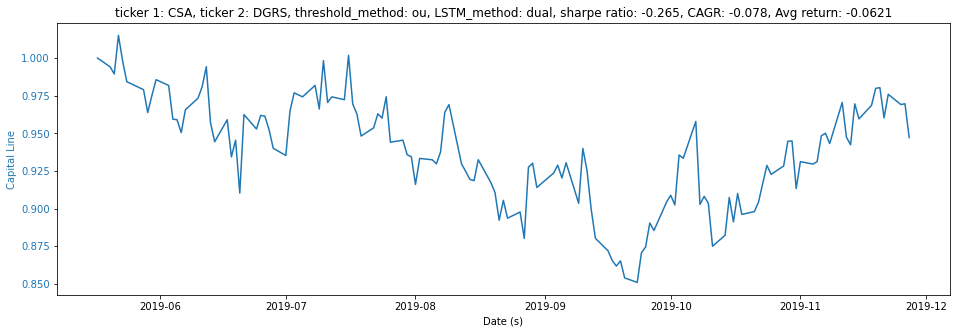

Annual return (dual+ou) :  -0.07800741816555146
Sharpe ratio (dual+ou) : -0.2649814234292054
CAGR (dual+ou) :  -0.07800741816555146
Avg_return (dual+ou) :  -0.06212814855039047
========================↑ dual, ↓ single ====================================
Epoch 1/20
307/307 [==============================] - 1s 3ms/step - loss: 0.0474
Epoch 2/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0192
Epoch 3/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0136
Epoch 4/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0104
Epoch 5/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0083
Epoch 6/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0067
Epoch 7/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0063
Epoch 8/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 9/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 10/20
307/

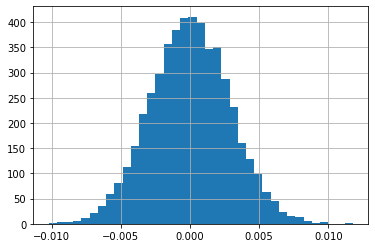

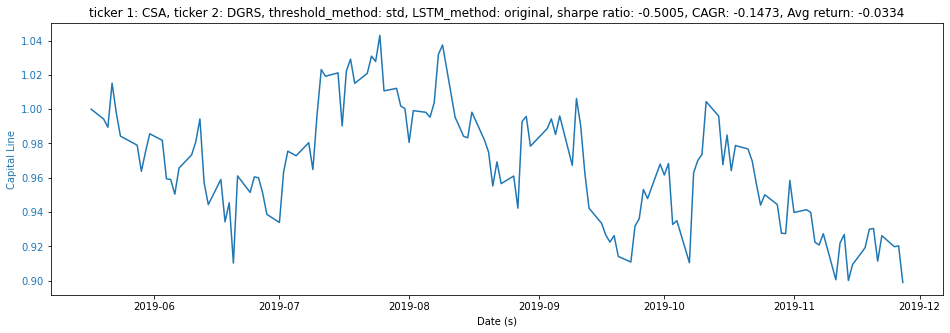

Annual return (std) :  -0.1473428468083996
Sharpe ratio (std) : -0.5005051206557918
CAGR (std) :  -0.1473428468083996
Avg_return (std) :  -0.03336023867035566
-------------------------------------
threshold:  0.20752651098670463
average return 0.115271
[-0.0119176   0.01181626]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


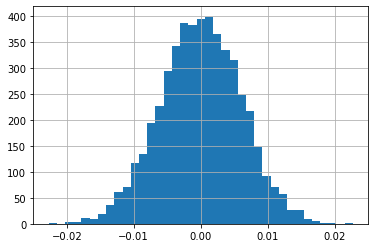

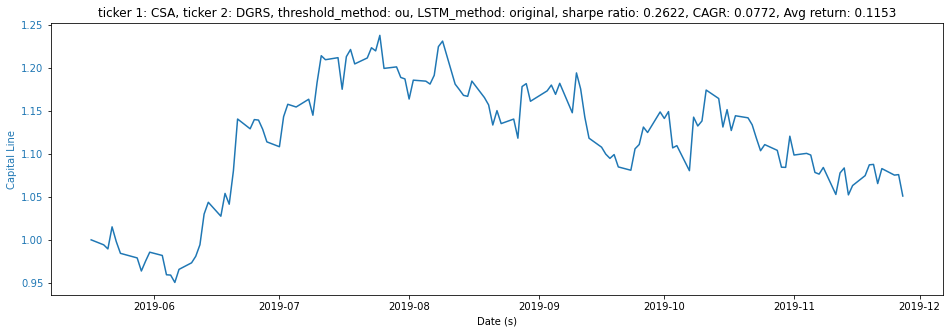

Annual return (ou) :  0.07718720820278868
Sharpe ratio (ou) : 0.26219523914083986
CAGR (ou) :  0.07718720820278868
Avg_return (ou) :  0.11527111134556722
['CSA', 'FNDA']
Epoch 1/20
307/307 [==============================] - 1s 3ms/step - loss: 0.1301
Epoch 2/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0233
Epoch 3/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0115
Epoch 4/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0091
Epoch 5/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0077
Epoch 6/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 7/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 8/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0067
Epoch 9/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 10/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0064
Epoch 11/20
307/307

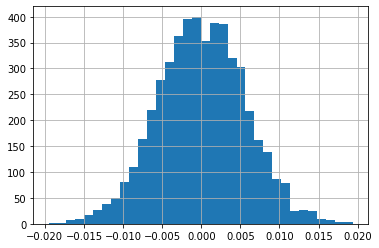

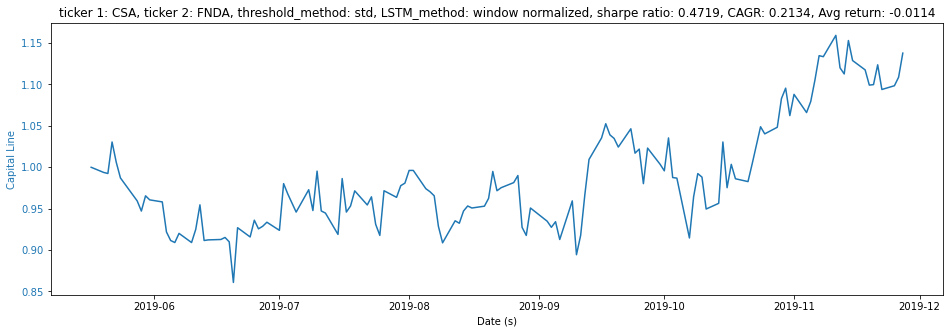

Annual return (std) :  0.2133504470287626
Sharpe ratio (std) : 0.4719344351989382
CAGR (std) :  0.2133504470287626
Avg_return (std) :  -0.011431615964905202
-------------------------------------
threshold:  0.26996495550221705
average return -0.018570
[-0.01037009  0.01020397]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


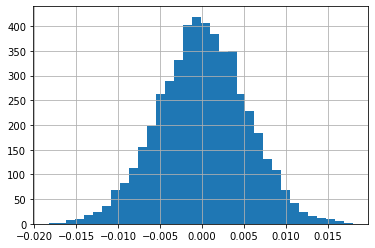

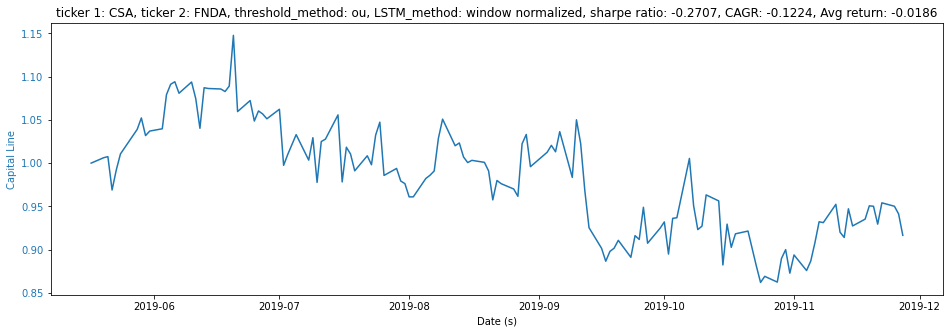

Annual return (ou) :  -0.12236839104393493
Sharpe ratio (ou) : -0.27068074296435274
CAGR (ou) :  -0.12236839104393493
Avg_return (ou) :  -0.018570072098679443
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
307/307 [==============================] - 1s 3ms/step - loss: 0.0847
Epoch 2/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0119
Epoch 3/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 4/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 5/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0043
Epoch 6/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0040
Epoch 7/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0038
Epoch 8/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0037
Epoch 9/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0037
Epoch 10/20
307/

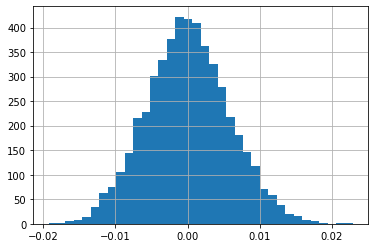

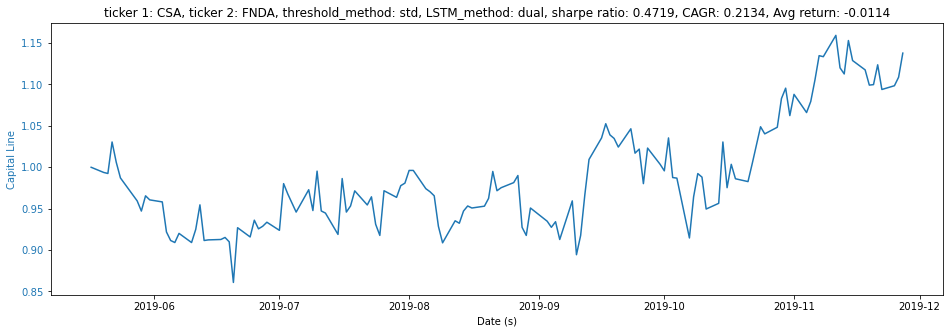

Annual return (dual+std) :  0.21335123533366285
Sharpe ratio (dual+std) : 0.4719362554859152
CAGR (dual+std) :  0.21335123533366285
Avg_return (dual+std) :  -0.011431151566626333
-------------------------------------
threshold:  0.27452880878672653
average return -0.036549
[-0.01508014  0.01489621]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


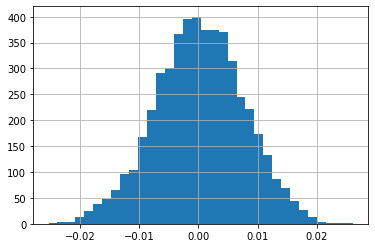

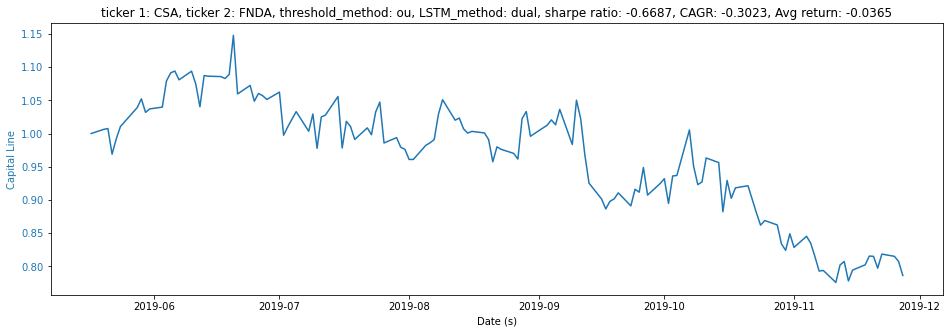

Annual return (dual+ou) :  -0.30228800718635707
Sharpe ratio (dual+ou) : -0.6686657800069442
CAGR (dual+ou) :  -0.30228800718635707
Avg_return (dual+ou) :  -0.03654945416342953
========================↑ dual, ↓ single ====================================
Epoch 1/20
307/307 [==============================] - 1s 3ms/step - loss: 0.0352A: 0s - loss: 0
Epoch 2/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0206
Epoch 3/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0145
Epoch 4/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0116
Epoch 5/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0097
Epoch 6/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0078
Epoch 7/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0072
Epoch 8/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0070
Epoch 9/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0065
E

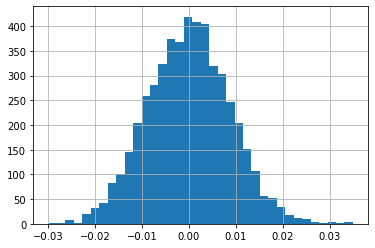

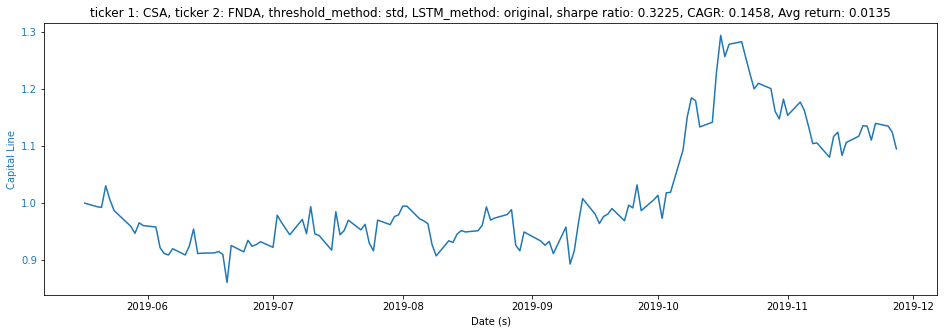

Annual return (std) :  0.14580384943653524
Sharpe ratio (std) : 0.3225203482453365
CAGR (std) :  0.14580384943653524
Avg_return (std) :  0.013453800716679964
-------------------------------------
threshold:  0.17481884322804378
average return 0.013454
[-0.01627824  0.01759826]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.06420000000000003


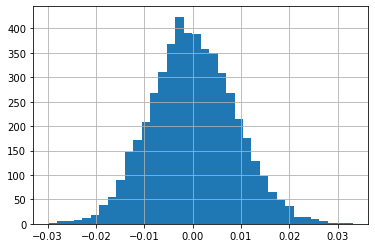

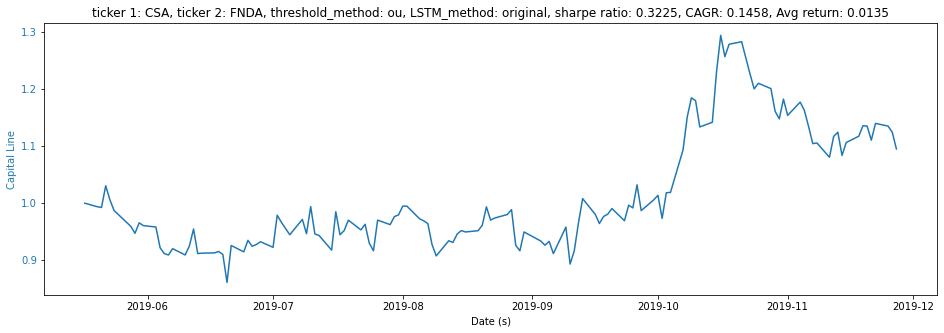

Annual return (ou) :  0.14580384943653524
Sharpe ratio (ou) : 0.3225203482453365
CAGR (ou) :  0.14580384943653524
Avg_return (ou) :  0.013453800716679964
['CSA', 'OMFS']
Epoch 1/20
164/164 [==============================] - 1s 4ms/step - loss: 0.2069
Epoch 2/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0875
Epoch 3/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0317
Epoch 4/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0218
Epoch 5/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0190
Epoch 6/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0167
Epoch 7/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0148
Epoch 8/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0134
Epoch 9/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0125
Epoch 10/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0120
Epoch 11/20
164/164

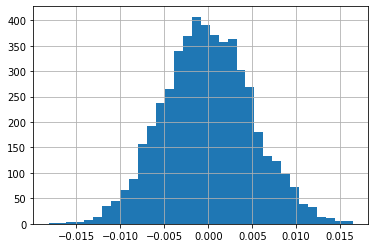

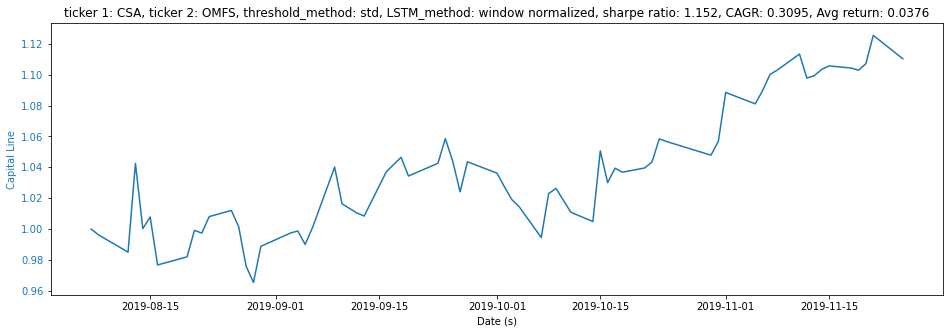

Annual return (std) :  0.30949452082018314
Sharpe ratio (std) : 1.1519507029452727
CAGR (std) :  0.30949452082018314
Avg_return (std) :  0.03758472366035392
-------------------------------------
threshold:  0.49926573575331795
average return 0.036153
[-0.00997228  0.0101104 ]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


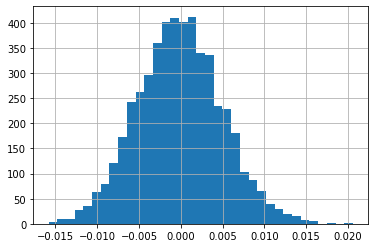

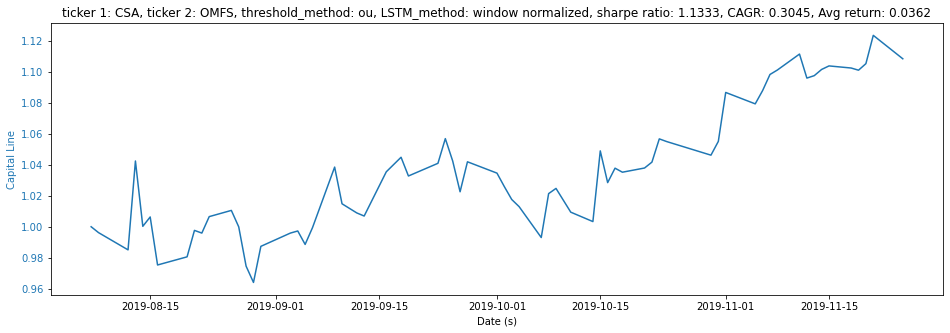

Annual return (ou) :  0.3044759112418929
Sharpe ratio (ou) : 1.133271241944804
CAGR (ou) :  0.3044759112418929
Avg_return (ou) :  0.03615334654926911
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
164/164 [==============================] - 1s 4ms/step - loss: 0.2093
Epoch 2/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0776
Epoch 3/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0292
Epoch 4/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0178
Epoch 5/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0129
Epoch 6/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0107
Epoch 7/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0096
Epoch 8/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0088
Epoch 9/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0081
Epoch 10/20
164/164 [====

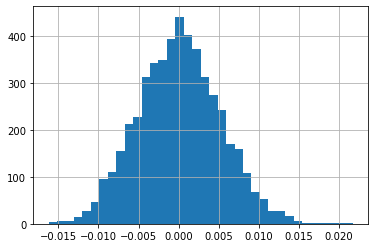

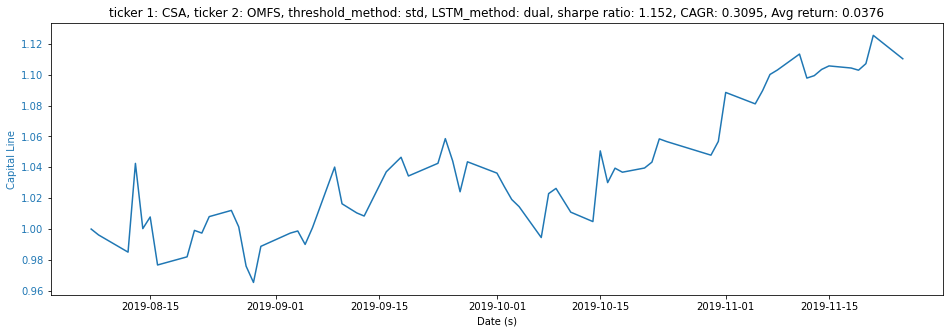

Annual return (dual+std) :  0.30949463052050086
Sharpe ratio (dual+std) : 1.1519531033786314
CAGR (dual+std) :  0.30949463052050064
Avg_return (dual+std) :  0.0375847413933172
-------------------------------------
threshold:  0.5153705364144816
average return 0.036178
[-0.00970136  0.01021883]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


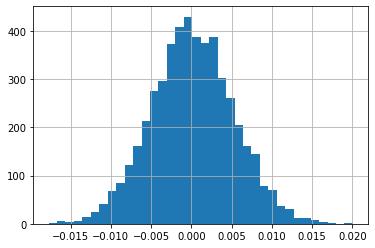

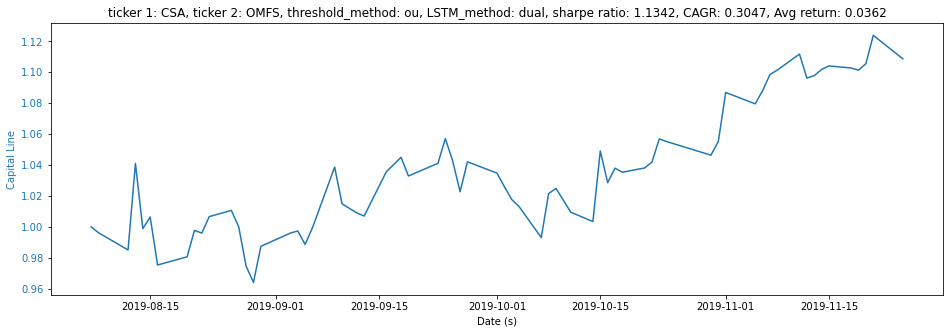

Annual return (dual+ou) :  0.3047166323275152
Sharpe ratio (dual+ou) : 1.134169176603906
CAGR (dual+ou) :  0.3047166323275152
Avg_return (dual+ou) :  0.03617819956971456
========================↑ dual, ↓ single ====================================
Epoch 1/20
164/164 [==============================] - 1s 4ms/step - loss: 0.0494
Epoch 2/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0362
Epoch 3/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0254
Epoch 4/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0183
Epoch 5/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0157
Epoch 6/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0158
Epoch 7/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0140
Epoch 8/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0139
Epoch 9/20
164/164 [==============================] - 0s 2ms/step - loss: 0.0125
Epoch 10/20
164/164 [==

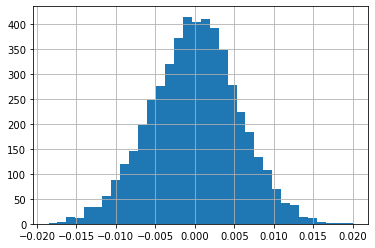

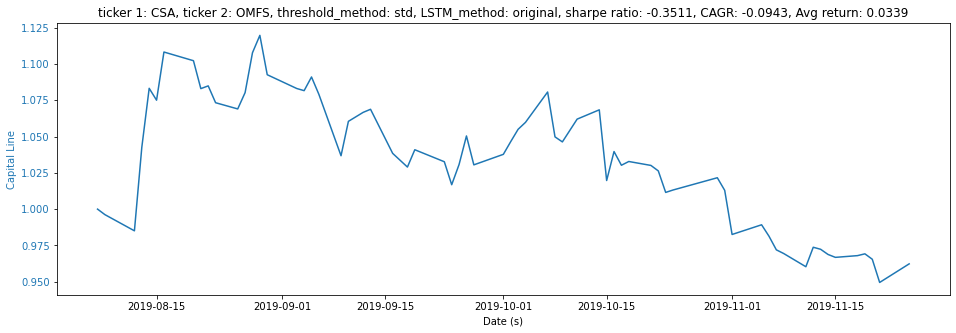

Annual return (std) :  -0.09434240803535598
Sharpe ratio (std) : -0.3511460015121931
CAGR (std) :  -0.09434240803535598
Avg_return (std) :  0.03385430535861358
-------------------------------------
threshold:  0.3664476198194283
average return 0.033854
[-0.0107587   0.01020807]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


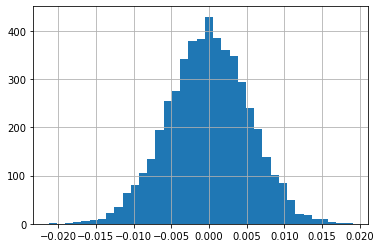

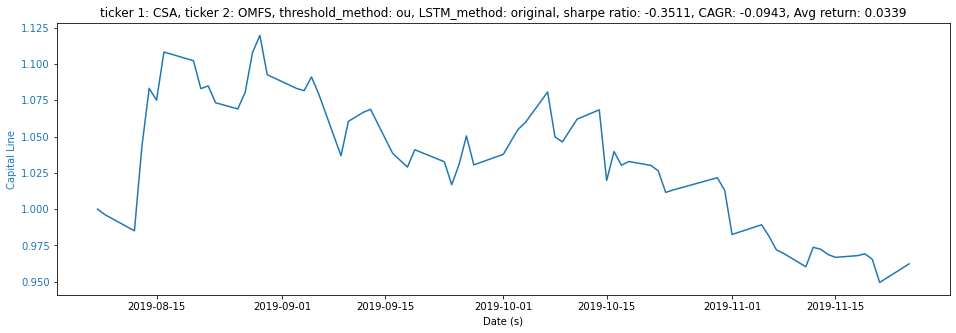

Annual return (ou) :  -0.09434240803535598
Sharpe ratio (ou) : -0.3511460015121931
CAGR (ou) :  -0.09434240803535598
Avg_return (ou) :  0.03385430535861358
['CSA', 'SLYV']
Epoch 1/20
307/307 [==============================] - 1s 3ms/step - loss: 0.1655
Epoch 2/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0332
Epoch 3/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0182
Epoch 4/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0142
Epoch 5/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0128
Epoch 6/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0120
Epoch 7/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0115
Epoch 8/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0110
Epoch 9/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0106
Epoch 10/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0105
Epoch 11/20
307/3

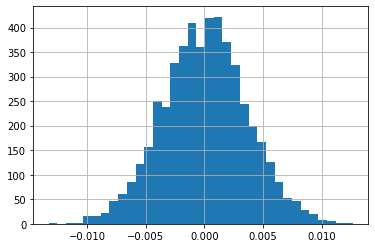

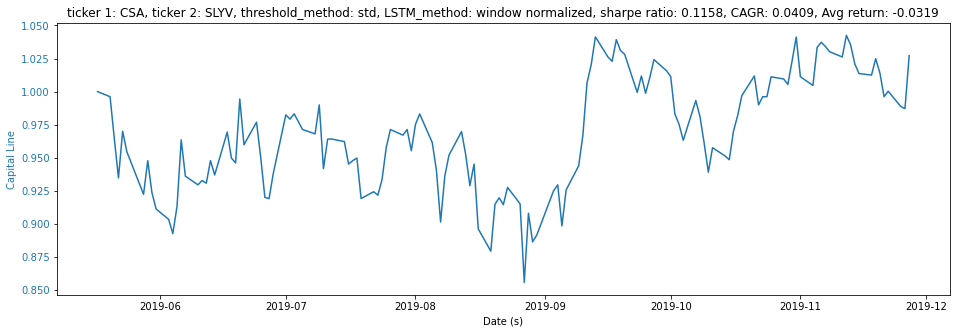

Annual return (std) :  0.04092588390571095
Sharpe ratio (std) : 0.11575158436954185
CAGR (std) :  0.04092588390571095
Avg_return (std) :  -0.03185561976367818
-------------------------------------
threshold:  0.4484290448682056
average return -0.132283
[-0.0074481   0.00738901]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


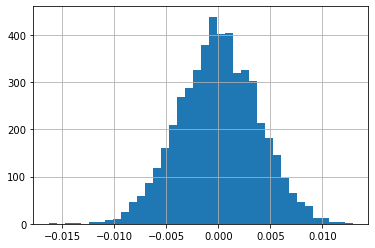

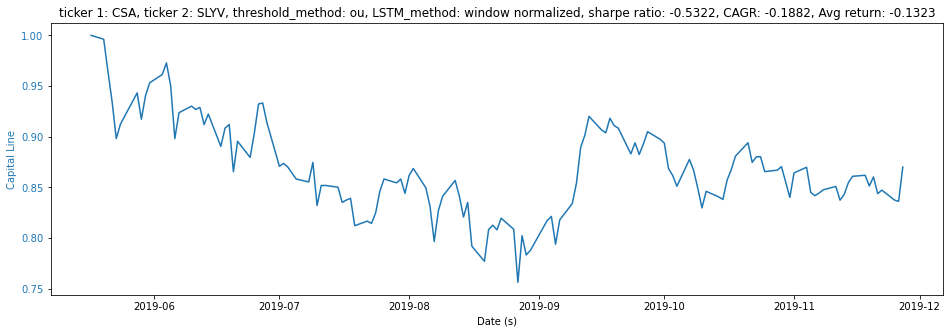

Annual return (ou) :  -0.18815109403145336
Sharpe ratio (ou) : -0.5321519086839878
CAGR (ou) :  -0.18815109403145336
Avg_return (ou) :  -0.13228308514038536
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
307/307 [==============================] - 1s 3ms/step - loss: 0.1065
Epoch 2/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0149
Epoch 3/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0075
Epoch 4/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 5/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0052
Epoch 6/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0047
Epoch 7/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 8/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 9/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 10/20
307/30

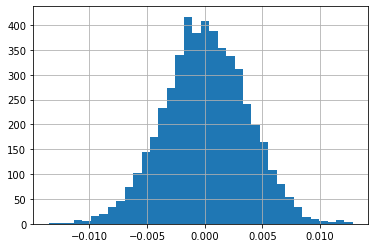

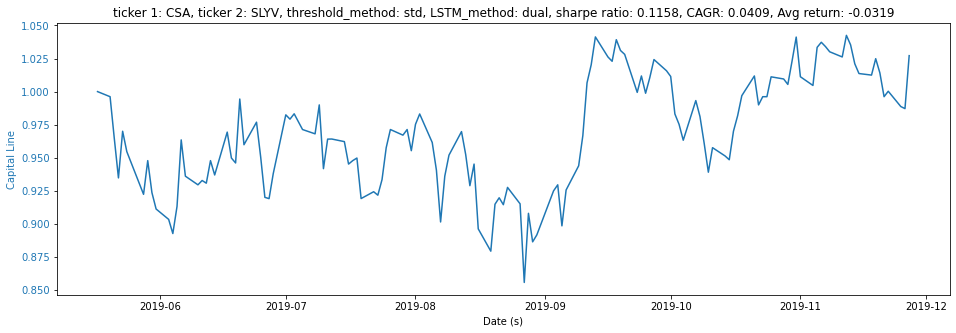

Annual return (dual+std) :  0.04092597908189699
Sharpe ratio (dual+std) : 0.11575195909681936
CAGR (dual+std) :  0.04092597908189699
Avg_return (dual+std) :  -0.03185568679527182
-------------------------------------
threshold:  0.44782984821403904
average return -0.160171
[-0.00837564  0.00845817]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


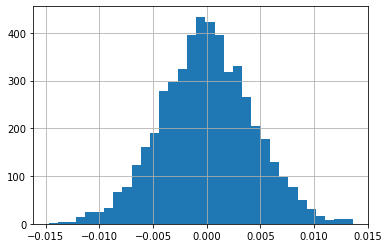

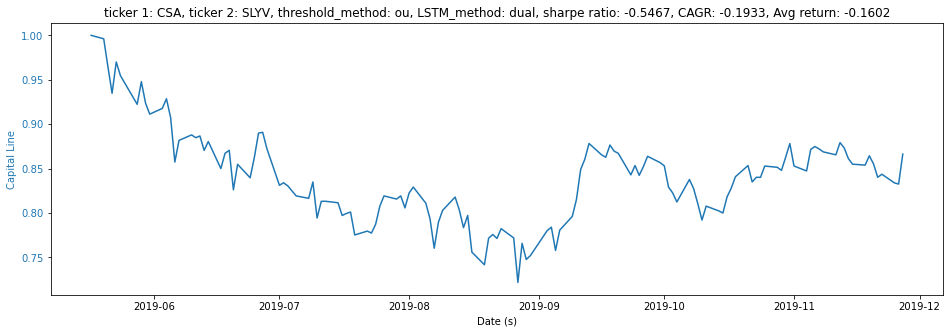

Annual return (dual+ou) :  -0.19329953804857003
Sharpe ratio (dual+ou) : -0.54671386546081
CAGR (dual+ou) :  -0.19329953804856992
Avg_return (dual+ou) :  -0.16017068083242592
========================↑ dual, ↓ single ====================================
Epoch 1/20
307/307 [==============================] - 1s 3ms/step - loss: 0.0513
Epoch 2/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0151
Epoch 3/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0105
Epoch 4/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0089
Epoch 5/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0076
Epoch 6/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 7/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 8/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 9/20
307/307 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 10/20
307/30

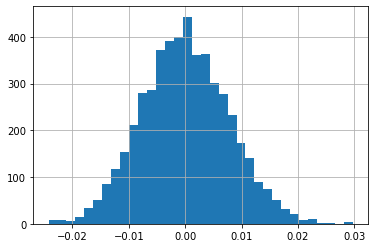

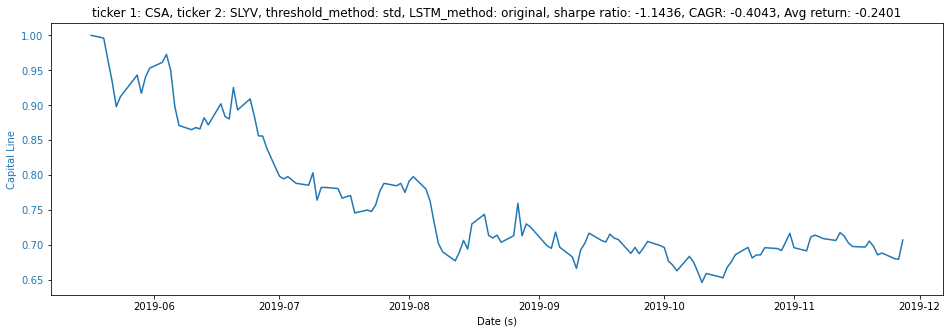

Annual return (std) :  -0.40432168395247947
Sharpe ratio (std) : -1.1435515378719778
CAGR (std) :  -0.40432168395247947
Avg_return (std) :  -0.24014441304240616
-------------------------------------
threshold:  0.3024858834793224
average return -0.240144
[-0.01437886  0.01540602]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


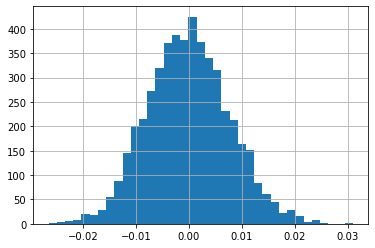

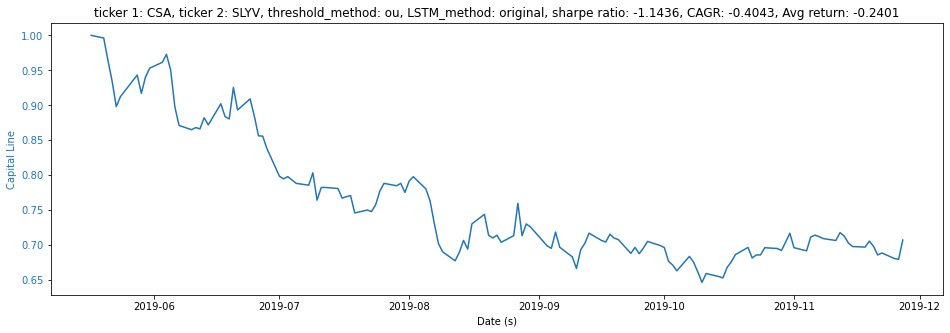

Annual return (ou) :  -0.40432168395247947
Sharpe ratio (ou) : -1.1435515378719778
CAGR (ou) :  -0.40432168395247947
Avg_return (ou) :  -0.24014441304240616
['CSB', 'DGRS']
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.1586
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0228
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0086
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0059
Epoch 5/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0050
Epoch 6/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0043
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 10/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 11/20
312/

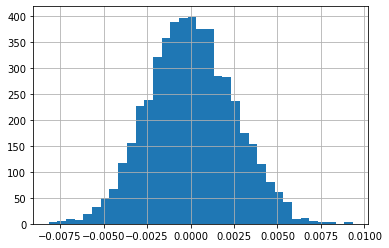

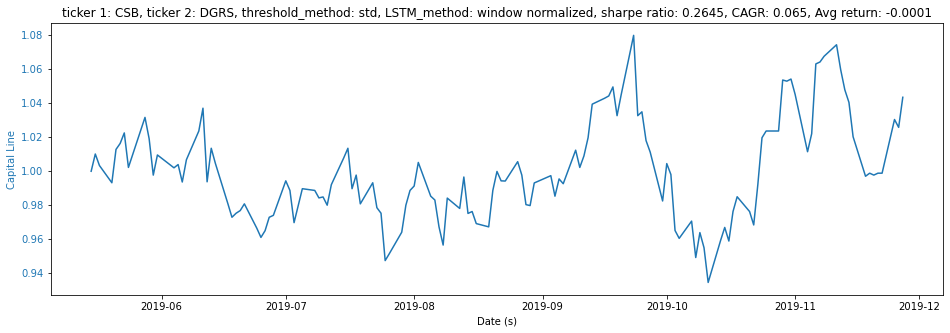

Annual return (std) :  0.06504216319735989
Sharpe ratio (std) : 0.264511280097087
CAGR (std) :  0.06504216319735989
Avg_return (std) :  -7.810856797637954e-05
-------------------------------------
threshold:  0.2107699755724478
average return -0.010756
[-0.00384218  0.00375054]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


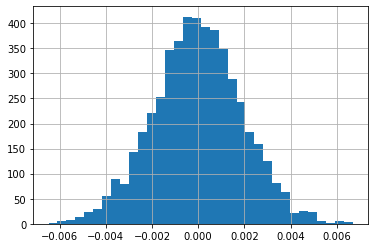

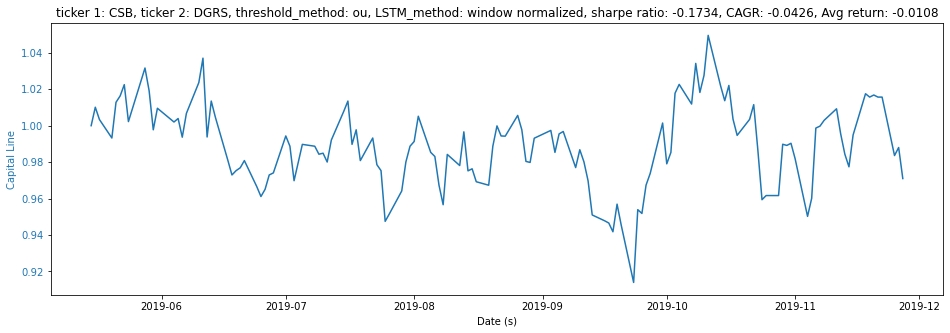

Annual return (ou) :  -0.04263912929630387
Sharpe ratio (ou) : -0.17340337587124321
CAGR (ou) :  -0.04263912929630387
Avg_return (ou) :  -0.010755740560619276
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.1176
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0124
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0062
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0048
Epoch 5/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 6/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0037
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0035
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0033
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0031A: 0s - loss: 0.0

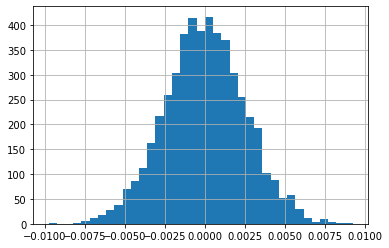

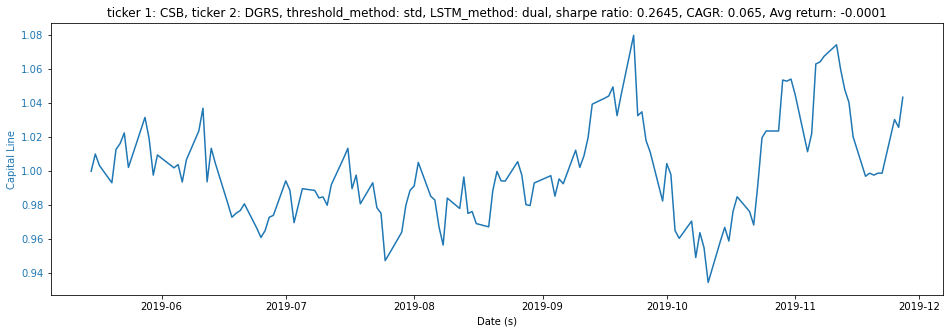

Annual return (dual+std) :  0.06504241656529053
Sharpe ratio (dual+std) : 0.2645121657137949
CAGR (dual+std) :  0.06504241656529053
Avg_return (dual+std) :  -7.801077698265086e-05
-------------------------------------
threshold:  0.21999446149487334
average return -0.006509
[-0.00512541  0.00503166]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9924


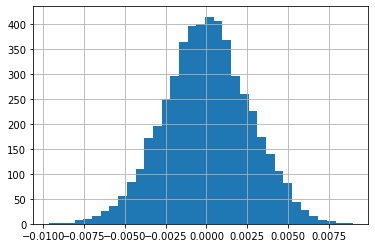

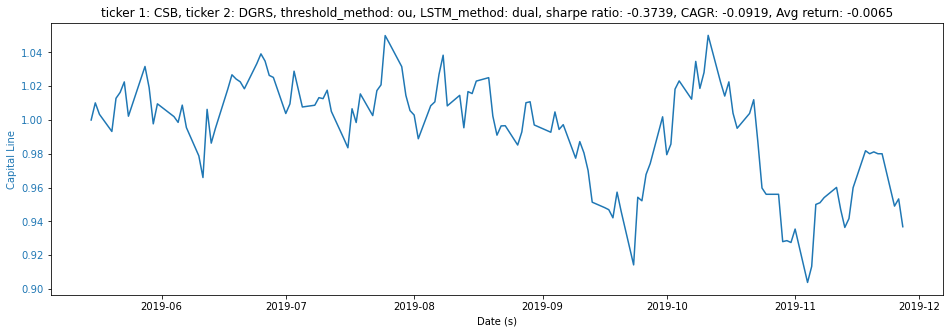

Annual return (dual+ou) :  -0.09193405743891603
Sharpe ratio (dual+ou) : -0.3738741258423825
CAGR (dual+ou) :  -0.09193405743891603
Avg_return (dual+ou) :  -0.006508679906655846
========================↑ dual, ↓ single ====================================
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0350
Epoch 2/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0157
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0125
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0098
Epoch 5/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0092
Epoch 6/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0084
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0074
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0063
Epoch 10/20
312

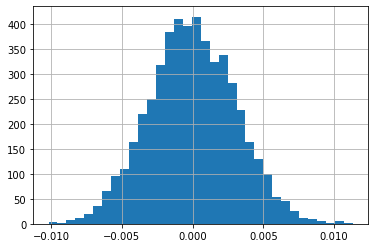

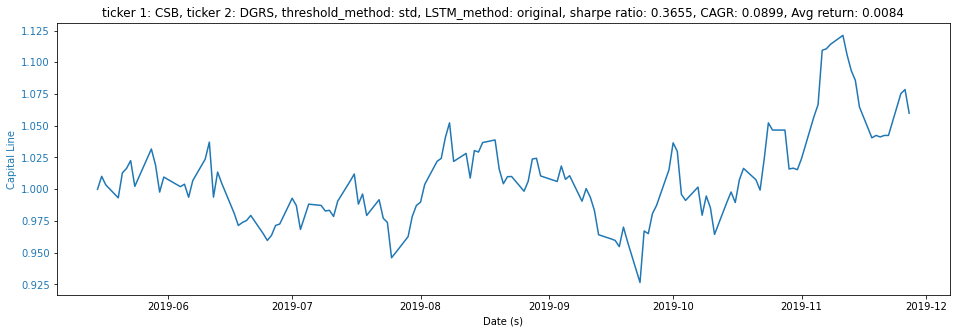

Annual return (std) :  0.08988139822070473
Sharpe ratio (std) : 0.36552661969503325
CAGR (std) :  0.08988139822070473
Avg_return (std) :  0.008375999805586797
-------------------------------------
threshold:  0.1428044345975406
average return 0.008376
[-0.00596177  0.00633429]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0038000000000000256


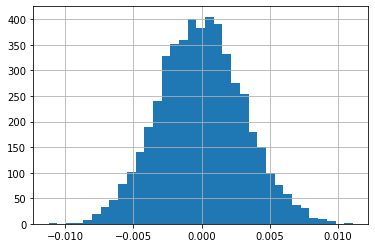

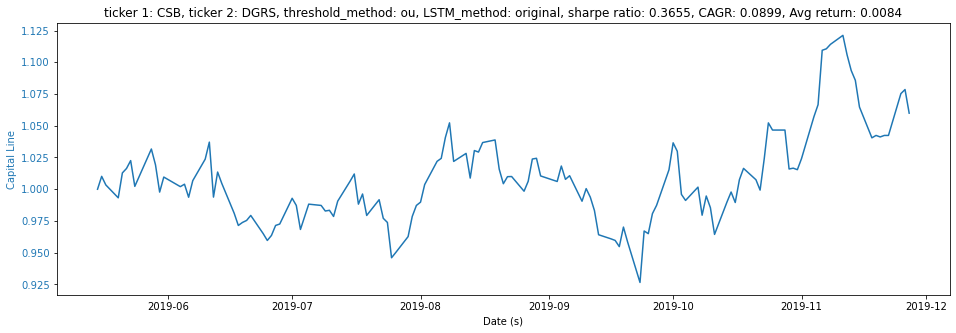

Annual return (ou) :  0.08988139822070473
Sharpe ratio (ou) : 0.36552661969503325
CAGR (ou) :  0.08988139822070473
Avg_return (ou) :  0.008375999805586797
['CSB', 'OMFS']
Epoch 1/20
165/165 [==============================] - 1s 4ms/step - loss: 0.1722
Epoch 2/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0564
Epoch 3/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0212
Epoch 4/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0131
Epoch 5/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0102
Epoch 6/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0087
Epoch 7/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0079
Epoch 8/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0074
Epoch 9/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0070
Epoch 10/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0067
Epoch 11/20
165/16

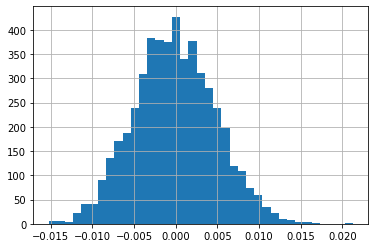

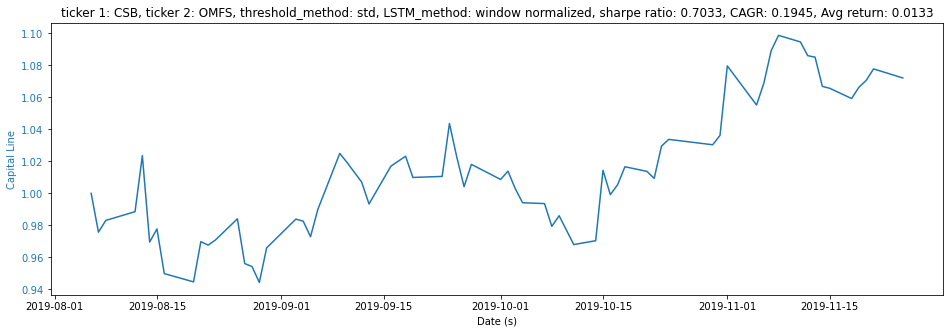

Annual return (std) :  0.19447831192092147
Sharpe ratio (std) : 0.7033150247131243
CAGR (std) :  0.19447831192092147
Avg_return (std) :  0.013296090838283883
-------------------------------------
threshold:  0.46409457470548693
average return 0.012021
[-0.00963284  0.00995667]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.008399999999999963


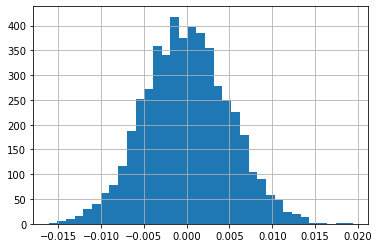

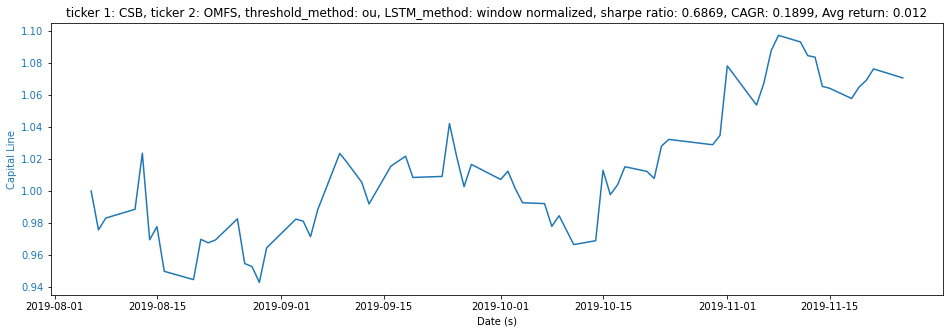

Annual return (ou) :  0.18992809638147667
Sharpe ratio (ou) : 0.6868595396620409
CAGR (ou) :  0.18992809638147667
Avg_return (ou) :  0.012021078966301313
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
165/165 [==============================] - 1s 4ms/step - loss: 0.1684
Epoch 2/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0576
Epoch 3/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0228
Epoch 4/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0142
Epoch 5/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0114
Epoch 6/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0097
Epoch 7/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0085
Epoch 8/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0077
Epoch 9/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0072
Epoch 10/20
165/165 [

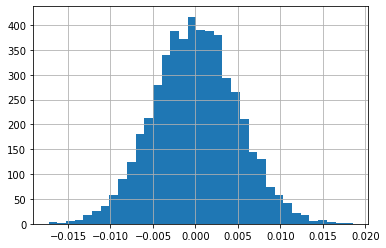

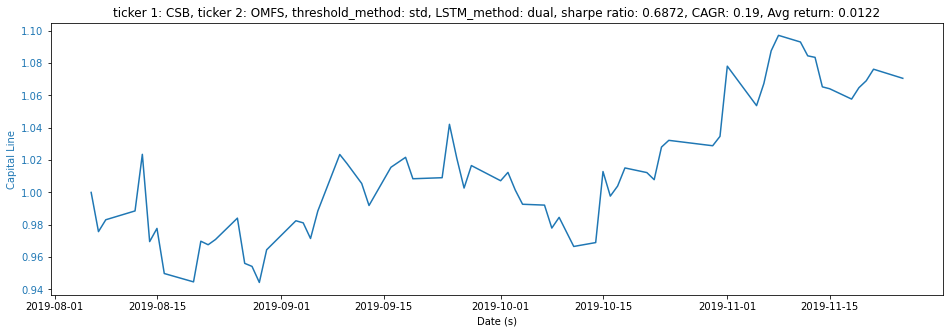

Annual return (dual+std) :  0.19001577918987111
Sharpe ratio (dual+std) : 0.6871773609613195
CAGR (dual+std) :  0.19001577918987111
Avg_return (dual+std) :  0.012150815576269325
-------------------------------------
threshold:  0.49335122708124957
average return 0.013296
[-0.00981162  0.00975481]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0038000000000000256


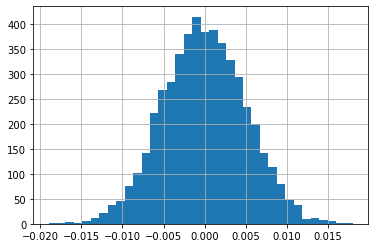

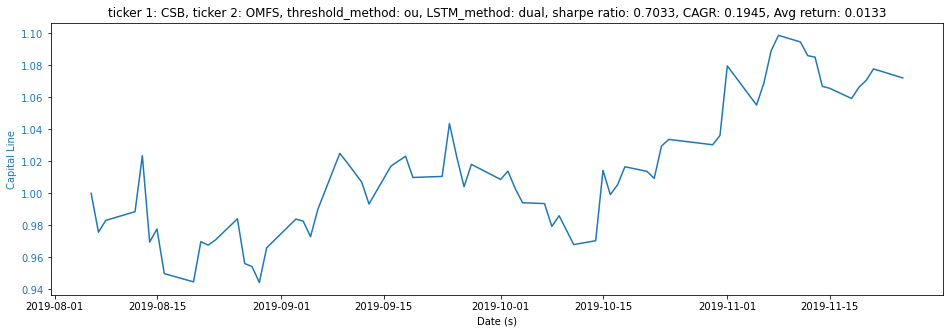

Annual return (dual+ou) :  0.19447910261662749
Sharpe ratio (dual+ou) : 0.7033186247373691
CAGR (dual+ou) :  0.19447910261662749
Avg_return (dual+ou) :  0.013296183869352638
========================↑ dual, ↓ single ====================================
Epoch 1/20
165/165 [==============================] - 1s 4ms/step - loss: 0.0385
Epoch 2/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0332
Epoch 3/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0249
Epoch 4/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0203
Epoch 5/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0169
Epoch 6/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0148
Epoch 7/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0146
Epoch 8/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0143
Epoch 9/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0127
Epoch 10/20
165/165

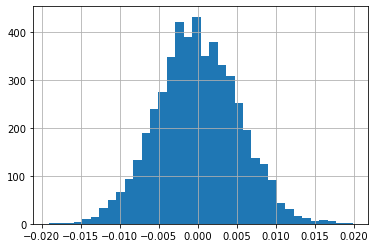

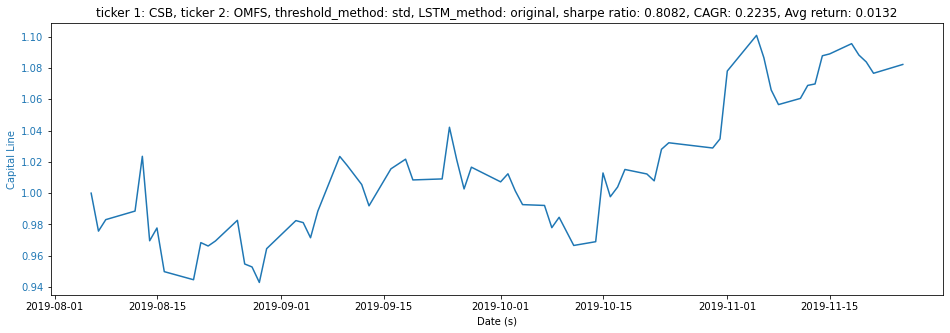

Annual return (std) :  0.22347385790686602
Sharpe ratio (std) : 0.8081750625252959
CAGR (std) :  0.22347385790686602
Avg_return (std) :  0.013174941261345758
-------------------------------------
threshold:  0.32983242421884745
average return -0.000713
[-0.00883524  0.00872185]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.5640000000000001


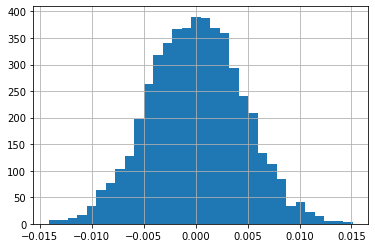

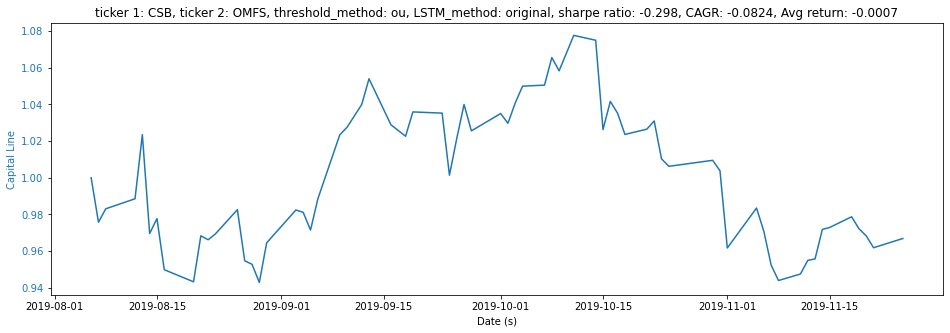

Annual return (ou) :  -0.08239603346080371
Sharpe ratio (ou) : -0.2979785649996401
CAGR (ou) :  -0.08239603346080371
Avg_return (ou) :  -0.0007125975490966493
['CSB', 'SMLV']
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.1175
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0119
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0066
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 5/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 6/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0043
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0041
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0038
Epoch 10/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0037
Epoch 11/20
31

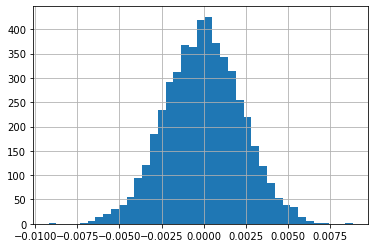

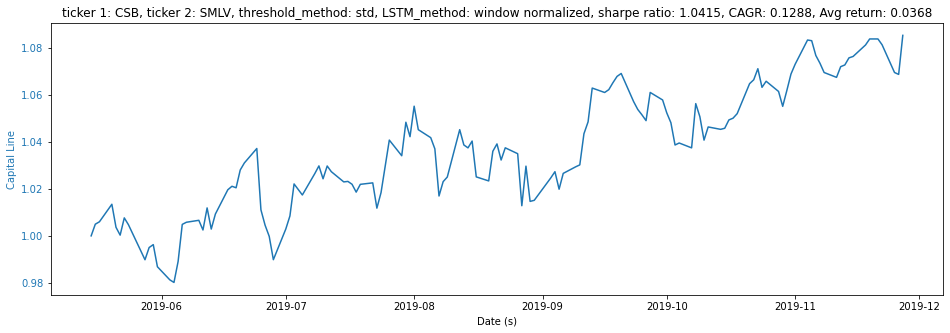

Annual return (std) :  0.12882668890491122
Sharpe ratio (std) : 1.0415237606794856
CAGR (std) :  0.12882668890491122
Avg_return (std) :  0.0368164324722984
-------------------------------------
threshold:  0.6013748414060401
average return -0.005210
[-0.00348325  0.0035431 ]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9964


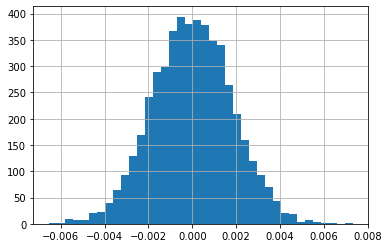

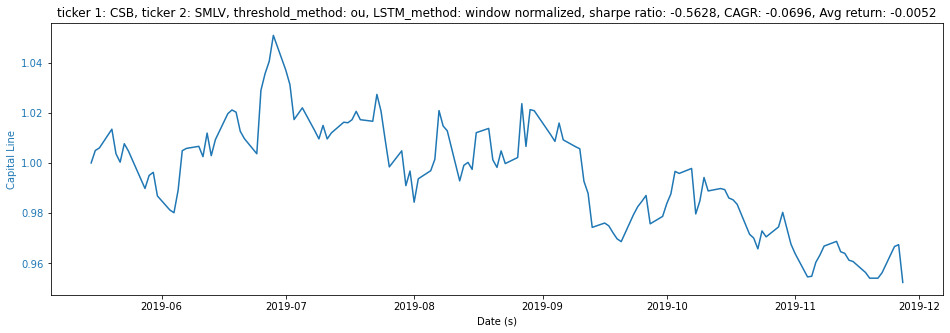

Annual return (ou) :  -0.06960750490800416
Sharpe ratio (ou) : -0.56275505409296
CAGR (ou) :  -0.06960750490800416
Avg_return (ou) :  -0.0052099196673456504
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.1245
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0182
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0088
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 5/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0045
Epoch 6/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0038
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0036
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0034
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0033
Epoch 10/20
312/31

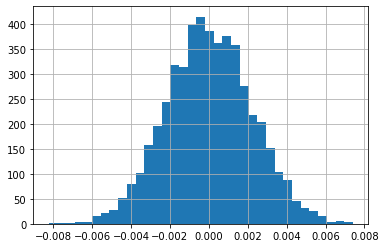

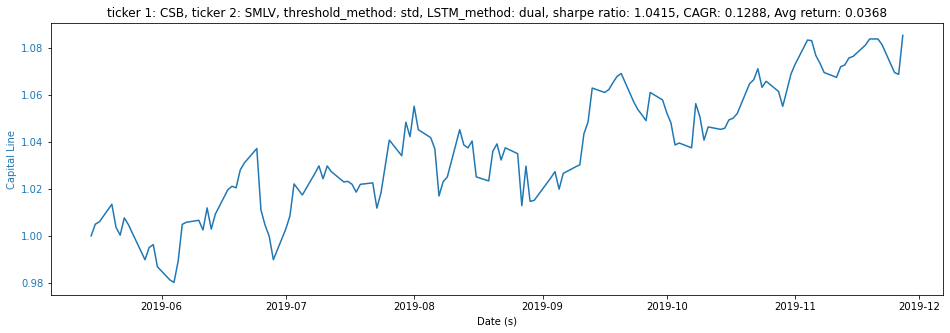

Annual return (dual+std) :  0.12882537337230948
Sharpe ratio (dual+std) : 1.0415114424720813
CAGR (dual+std) :  0.12882537337230948
Avg_return (dual+std) :  0.03681599262209912
-------------------------------------
threshold:  0.6194013206575021
average return -0.005210
[-0.00341283  0.00351955]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9976


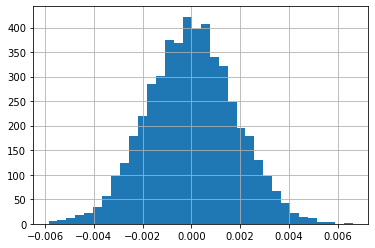

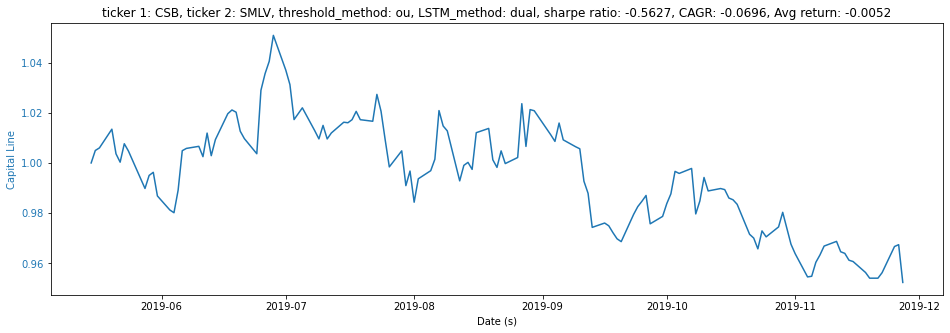

Annual return (dual+ou) :  -0.06960661949314595
Sharpe ratio (dual+ou) : -0.5627469866855785
CAGR (dual+ou) :  -0.06960661949314595
Avg_return (dual+ou) :  -0.005209656722157619
========================↑ dual, ↓ single ====================================
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0151
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0093
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0067
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 5/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0036
Epoch 6/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0030
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0022
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0019
Epoch 10/20
312

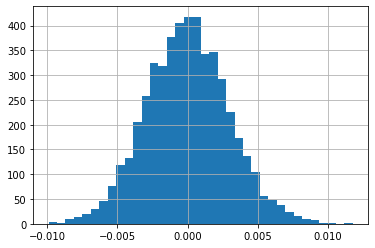

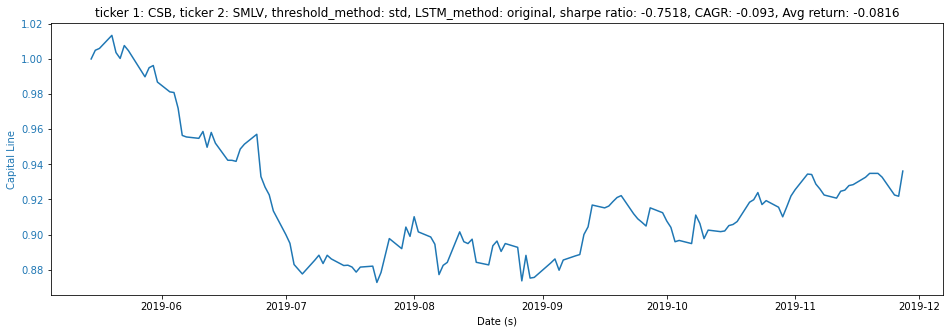

Annual return (std) :  -0.09298812352089603
Sharpe ratio (std) : -0.751780312044908
CAGR (std) :  -0.09298812352089603
Avg_return (std) :  -0.08162602895795631
-------------------------------------
threshold:  0.31883871836657124
average return -0.033884
[-0.00335439  0.00332273]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


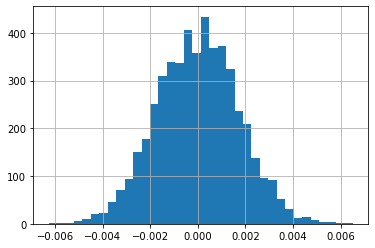

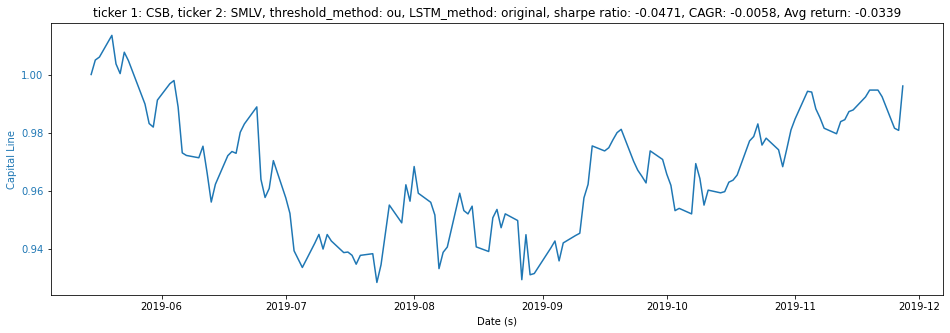

Annual return (ou) :  -0.005830649903672658
Sharpe ratio (ou) : -0.047139006983215714
CAGR (ou) :  -0.005830649903672658
Avg_return (ou) :  -0.033884188076045485
['DES', 'FYT']
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1052
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0229
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0135
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0115
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0107
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0101
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0097
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0096
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0094
Epoch 10/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0093
Epoch 11/20


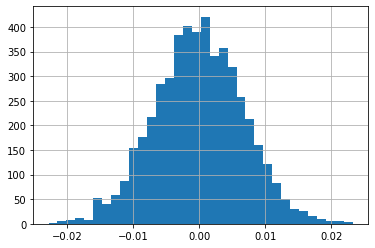

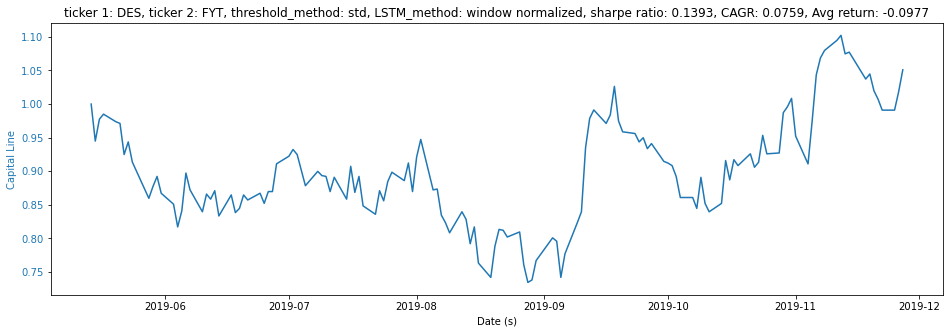

Annual return (std) :  0.07590631754430444
Sharpe ratio (std) : 0.1392873757792862
CAGR (std) :  0.07590631754430444
Avg_return (std) :  -0.09767228134828285
-------------------------------------
threshold:  0.19110128794398373
average return 0.005423
[-0.01239637  0.01152861]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.19399999999999995


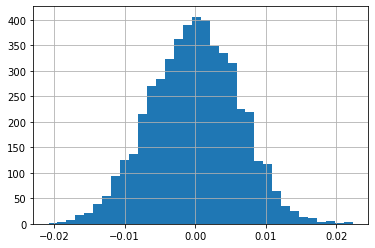

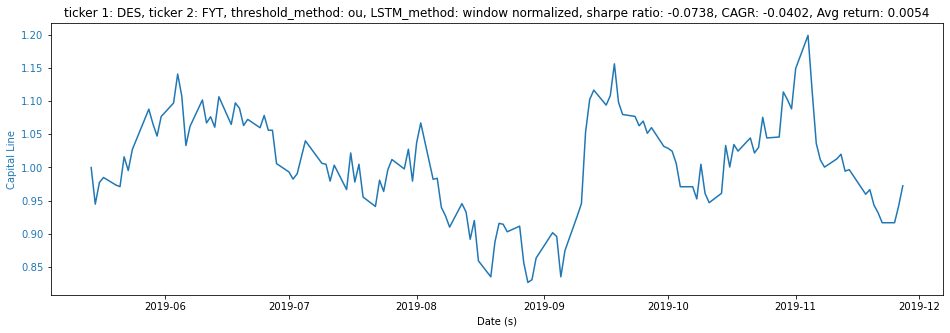

Annual return (ou) :  -0.0402074871087692
Sharpe ratio (ou) : -0.07378035909581761
CAGR (ou) :  -0.0402074871087692
Avg_return (ou) :  0.005423057056138248
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.1109
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0135
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0073
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0053
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0044
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0037
Epoch 8/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0035
Epoch 9/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0034
Epoch 10/20
313/313

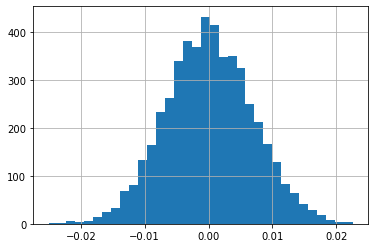

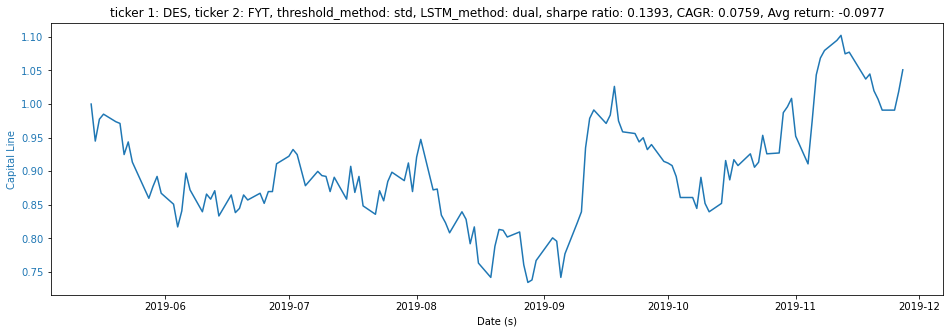

Annual return (dual+std) :  0.07593068511296464
Sharpe ratio (dual+std) : 0.1393320695451422
CAGR (dual+std) :  0.07593068511296464
Avg_return (dual+std) :  -0.09768811707276871
-------------------------------------
threshold:  0.19006530843583372
average return -0.113180
[-0.01267667  0.01321039]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


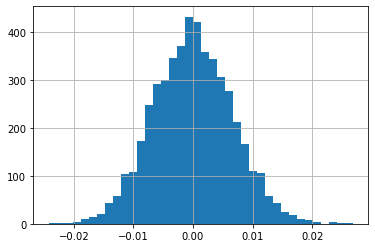

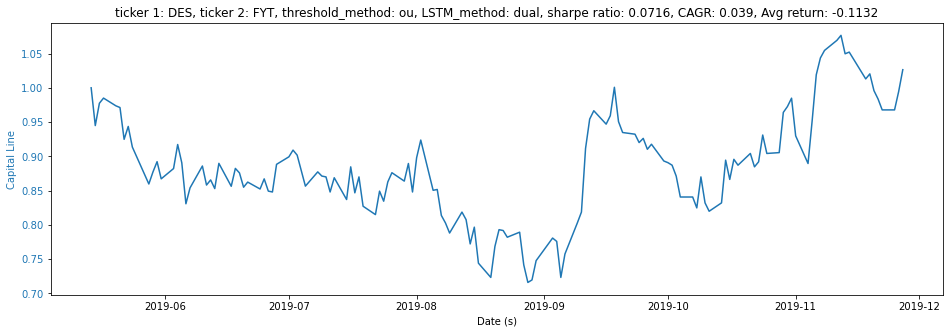

Annual return (dual+ou) :  0.03904219871440806
Sharpe ratio (dual+ou) : 0.07164205536112506
CAGR (dual+ou) :  0.03904219871440806
Avg_return (dual+ou) :  -0.11318025640027579
========================↑ dual, ↓ single ====================================
Epoch 1/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0461
Epoch 2/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0166
Epoch 3/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0108
Epoch 4/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0082
Epoch 5/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0071
Epoch 6/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0055
Epoch 7/20
313/313 [==============================] - 1s 2ms/step - loss: 0.0049
Epoch 8/20
313/313 [==============================] - 1s 3ms/step - loss: 0.0049
Epoch 9/20
313/313 [==============================] - 1s 4ms/step - loss: 0.0039
Epoch 10/20
313/31

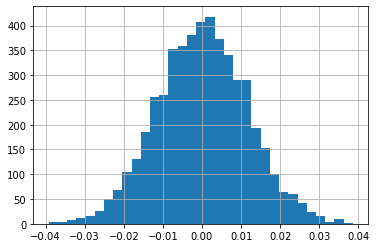

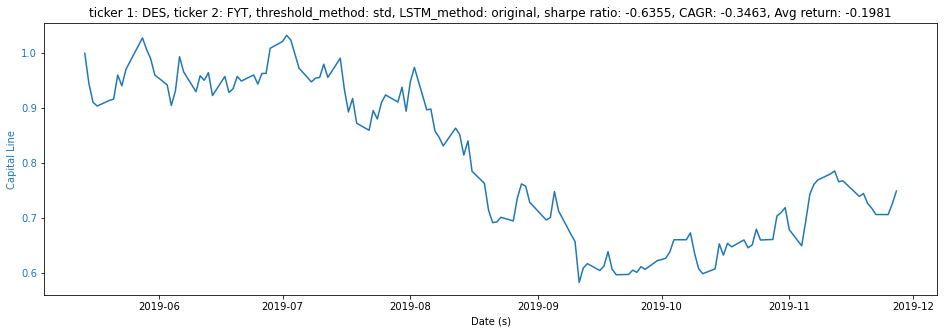

Annual return (std) :  -0.3463150711208667
Sharpe ratio (std) : -0.6354850663510732
CAGR (std) :  -0.3463150711208667
Avg_return (std) :  -0.19806197539752557
-------------------------------------
threshold:  0.12606020151816144
average return -0.279246
[-0.02395641  0.0242114 ]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


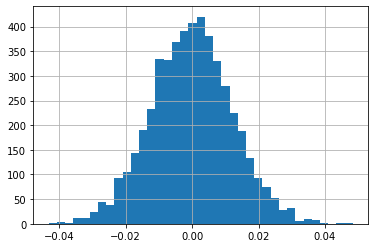

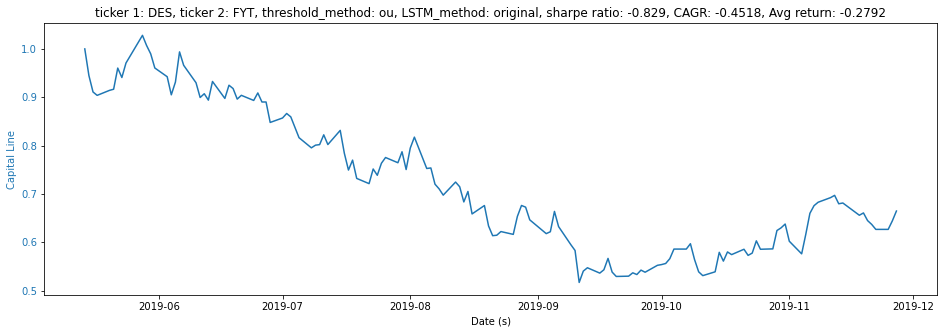

Annual return (ou) :  -0.4517786807261366
Sharpe ratio (ou) : -0.8290098492336464
CAGR (ou) :  -0.4517786807261366
Avg_return (ou) :  -0.279246067527521
['DGRS', 'OMFS']
Epoch 1/20
165/165 [==============================] - 1s 4ms/step - loss: 0.1403
Epoch 2/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0391
Epoch 3/20
165/165 [==============================] - 1s 4ms/step - loss: 0.0230
Epoch 4/20
165/165 [==============================] - 1s 5ms/step - loss: 0.0197
Epoch 5/20
165/165 [==============================] - 1s 4ms/step - loss: 0.0181
Epoch 6/20
165/165 [==============================] - 1s 3ms/step - loss: 0.0170
Epoch 7/20
165/165 [==============================] - 1s 3ms/step - loss: 0.0162A: 0s - loss
Epoch 8/20
165/165 [==============================] - 0s 3ms/step - loss: 0.0157
Epoch 9/20
165/165 [==============================] - 0s 3ms/step - loss: 0.0153
Epoch 10/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0151
Epoch 1

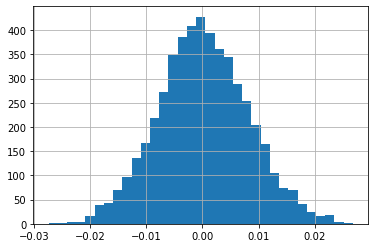

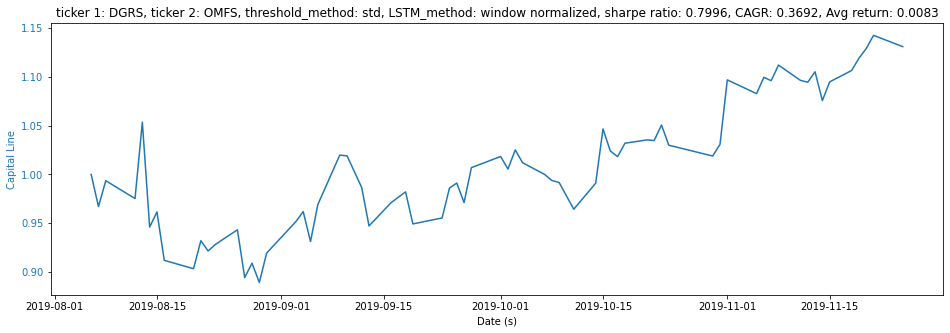

Annual return (std) :  0.3691503204482558
Sharpe ratio (std) : 0.799627303875324
CAGR (std) :  0.3691503204482558
Avg_return (std) :  0.008322956518857743
-------------------------------------
threshold:  0.3764641415862796
average return -0.039081
[-0.01068454  0.01057391]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


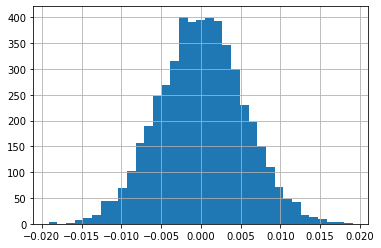

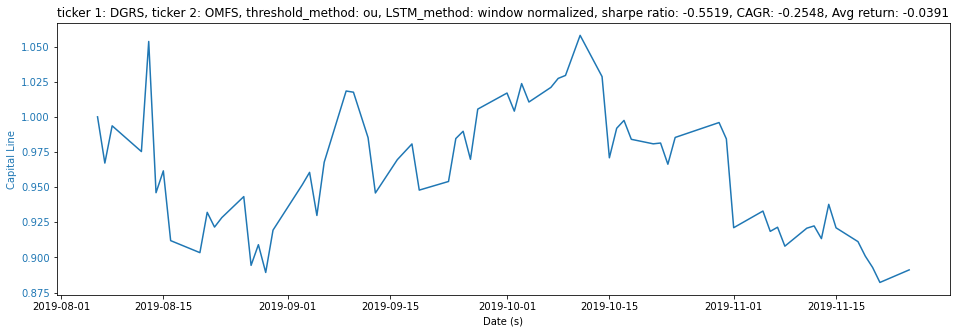

Annual return (ou) :  -0.2547804877962615
Sharpe ratio (ou) : -0.5518874649470105
CAGR (ou) :  -0.2547804877962615
Avg_return (ou) :  -0.039081080758034986
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
165/165 [==============================] - 1s 5ms/step - loss: 0.1243
Epoch 2/20
165/165 [==============================] - 1s 4ms/step - loss: 0.0362
Epoch 3/20
165/165 [==============================] - 1s 4ms/step - loss: 0.0179
Epoch 4/20
165/165 [==============================] - 1s 4ms/step - loss: 0.0131
Epoch 5/20
165/165 [==============================] - 1s 4ms/step - loss: 0.0103
Epoch 6/20
165/165 [==============================] - 0s 3ms/step - loss: 0.0092
Epoch 7/20
165/165 [==============================] - 1s 4ms/step - loss: 0.0086
Epoch 8/20
165/165 [==============================] - 0s 3ms/step - loss: 0.0082
Epoch 9/20
165/165 [==============================] - 1s 3ms/step - loss: 0.0079
Epoch 10/20
165/165

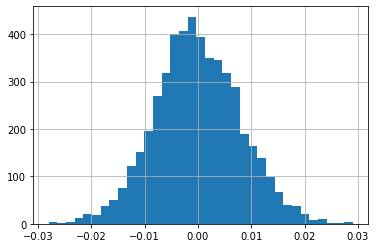

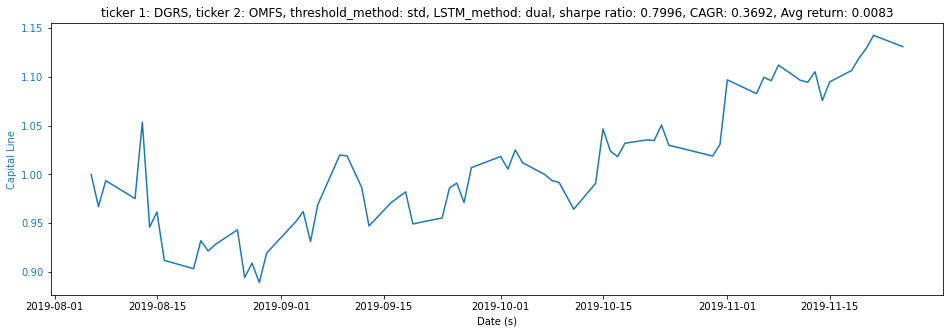

Annual return (dual+std) :  0.3691508374611112
Sharpe ratio (dual+std) : 0.7996288402414302
CAGR (dual+std) :  0.3691508374611112
Avg_return (dual+std) :  0.008323006552708878
-------------------------------------
threshold:  0.3937278217994884
average return -0.038999
[-0.01058349  0.01080694]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


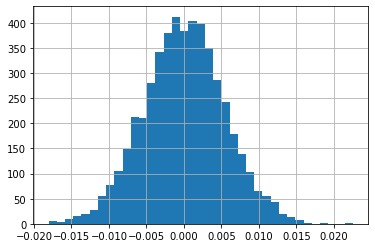

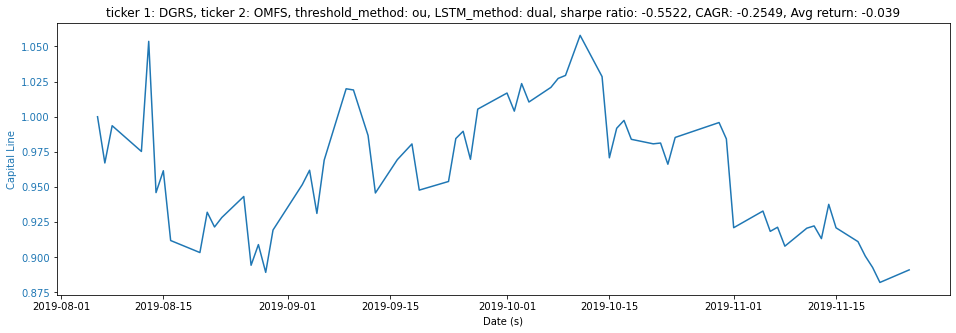

Annual return (dual+ou) :  -0.254929592001087
Sharpe ratio (dual+ou) : -0.5522107315184541
CAGR (dual+ou) :  -0.254929592001087
Avg_return (dual+ou) :  -0.0389992295651627
========================↑ dual, ↓ single ====================================
Epoch 1/20
165/165 [==============================] - 1s 4ms/step - loss: 0.0463
Epoch 2/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0401
Epoch 3/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0333
Epoch 4/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0257
Epoch 5/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0192
Epoch 6/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0163
Epoch 7/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0164
Epoch 8/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0151
Epoch 9/20
165/165 [==============================] - 0s 2ms/step - loss: 0.0140
Epoch 10/20
165/165 [

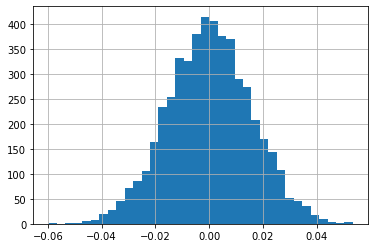

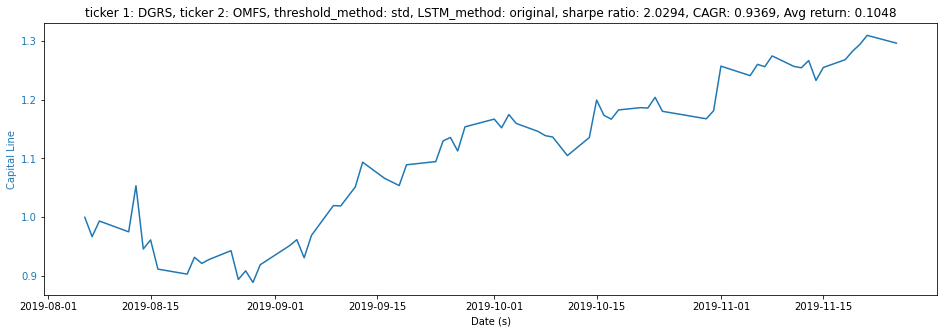

Annual return (std) :  0.9368699945373162
Sharpe ratio (std) : 2.0293815909924042
CAGR (std) :  0.9368699945373162
Avg_return (std) :  0.10479784664032685
-------------------------------------
threshold:  0.2594231817662928
average return 0.104798
[-0.03048646  0.0304148 ]
Reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is small enough)
p_value:
0.0


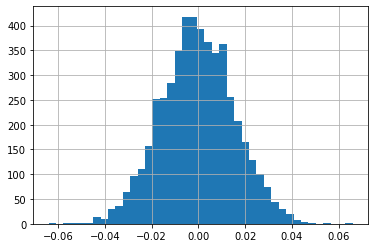

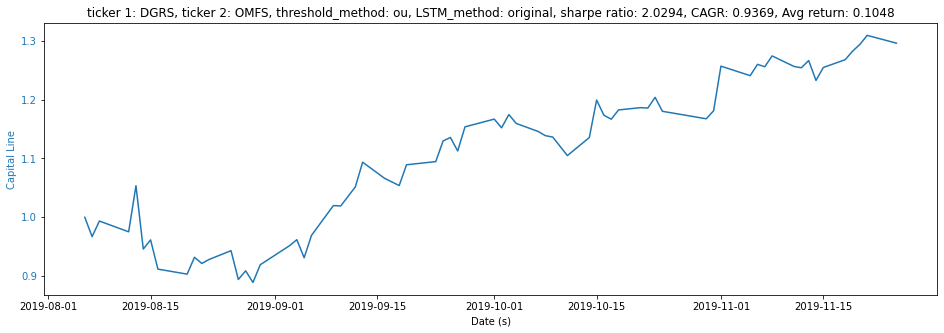

Annual return (ou) :  0.9368699945373162
Sharpe ratio (ou) : 2.0293815909924042
CAGR (ou) :  0.9368699945373162
Avg_return (ou) :  0.10479784664032685
['EES', 'EWSC']
Epoch 1/20
304/304 [==============================] - 1s 4ms/step - loss: 0.1233
Epoch 2/20
304/304 [==============================] - 1s 2ms/step - loss: 0.0227
Epoch 3/20
304/304 [==============================] - 1s 2ms/step - loss: 0.0123
Epoch 4/20
304/304 [==============================] - 1s 2ms/step - loss: 0.0100
Epoch 5/20
304/304 [==============================] - 1s 2ms/step - loss: 0.0090
Epoch 6/20
304/304 [==============================] - 1s 2ms/step - loss: 0.0085
Epoch 7/20
304/304 [==============================] - 1s 2ms/step - loss: 0.0081
Epoch 8/20
304/304 [==============================] - 1s 2ms/step - loss: 0.0079
Epoch 9/20
304/304 [==============================] - 1s 2ms/step - loss: 0.0077
Epoch 10/20
304/304 [==============================] - 1s 2ms/step - loss: 0.0076
Epoch 11/20
304/304 [=

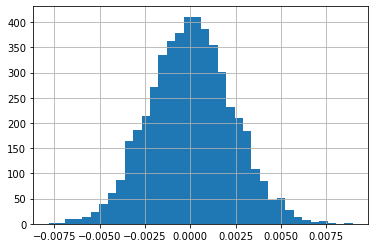

ValueError: x and y must have same first dimension, but have shapes (135,) and (134,)

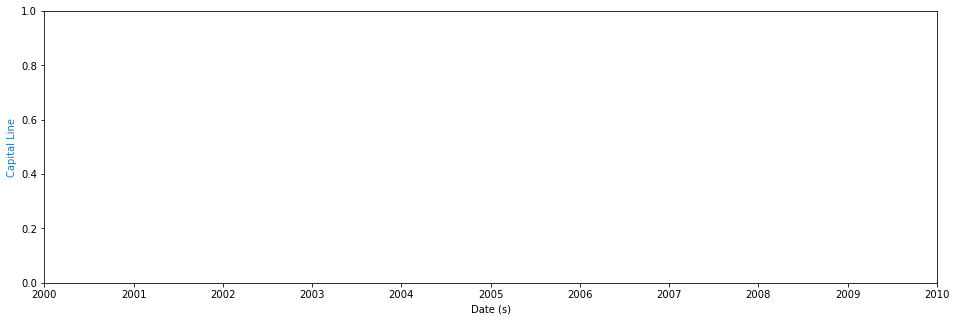

In [24]:
'''
Technology section (DBSCAN and Kmeans have same pairs)
'''
## Get data
# interval: 1m,2m,5m,15m,30m,60m,90m,1h,1d,5d,1wk,1mo,3mo
# The 1m data is only retrievable for the last 7 days, and anything interval <1d only for the last 60 days.
INTERVAL = '1d'
TEST_RATIO = 0.33
BATCH_SIZE = 5
# start and end date of the data
START = "2017-11-10"
END = "2019-11-29"
# look back window size
# LOOK_BACK = 30
LOOK_BACK = 5

for TICKER_PAIR in TICKER_PAIRS:
    # Run all methods of LSTM separately for each ticker pair
    print(TICKER_PAIR)
    run_window_normalize_training_workflow(TICKER_PAIR, INTERVAL, TEST_RATIO, BATCH_SIZE, LOOK_BACK, START, END)
    print("========================↑ single(window normalised), ↓ dual====================================")
    run_dual_training_workflow(TICKER_PAIR, INTERVAL, TEST_RATIO, BATCH_SIZE, LOOK_BACK, START, END)
    print("========================↑ dual, ↓ single ====================================")
    run_training_workflow(TICKER_PAIR, INTERVAL, TEST_RATIO, BATCH_SIZE, LOOK_BACK, START, END)

ticker_file.close()

In [20]:
TICKER_PAIRS = []
# change the file name here to get the ticker pairs outputted by co-integration from either kmeans or DBSCAN. 
ticker_file = open("Technology_DBSCAN.csv", "r")
lines = ticker_file.readlines()
count = 0
# Strips the newline character 
for line in lines: 
    if count > 0:
        new_pair = []
        new_pair = [line.split(",")[2].strip(), line.split(",")[3].strip()]
        TICKER_PAIRS.append(new_pair)
    count += 1
print(TICKER_PAIRS)

[['CIBR', 'XITK'], ['SKYY', 'XITK']]


['CIBR', 'XITK']
Epoch 1/20
312/312 [==============================] - 1s 2ms/step - loss: 0.1237
Epoch 2/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0168
Epoch 3/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0117
Epoch 4/20
312/312 [==============================] - 0s 2ms/step - loss: 0.0102
Epoch 5/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0094
Epoch 6/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0089
Epoch 7/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0085
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0082
Epoch 9/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0078
Epoch 10/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0075
Epoch 11/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0069
Epoch 12/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0062
Epoch 13

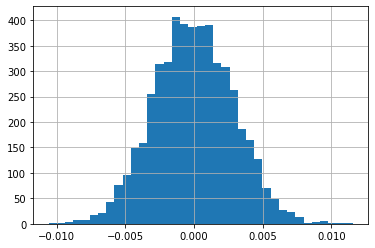

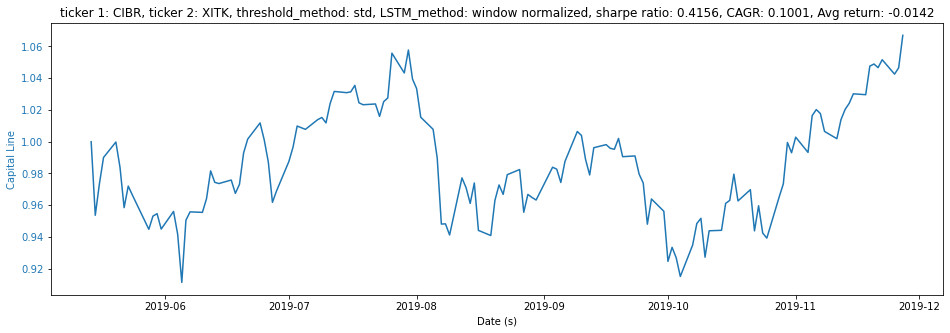

Annual return (std) :  0.1000585762523214
Sharpe ratio (std) : 0.4156014325325916
CAGR (std) :  0.1000585762523214
Avg_return (std) :  -0.014187441886904616
-------------------------------------
threshold:  1.4941903999152917
average return -0.011610
[-0.00566838  0.00538237]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


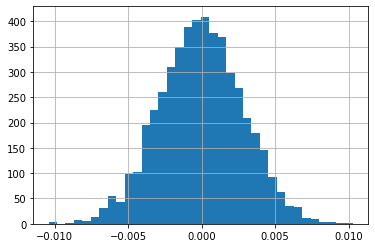

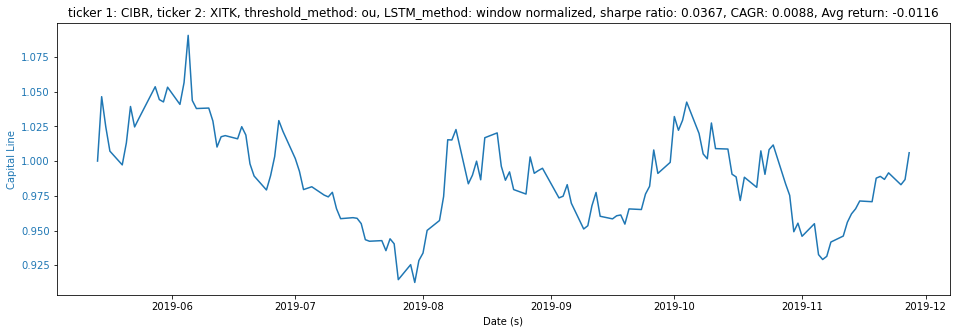

Annual return (ou) :  0.00883124273110747
Sharpe ratio (ou) : 0.036681284778986134
CAGR (ou) :  0.00883124273110747
Avg_return (ou) :  -0.0116102315042287
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.1463
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0188
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0105
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0082
Epoch 5/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0072
Epoch 6/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0066
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0058
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0054
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0051
Epoch 10/20
312/312 

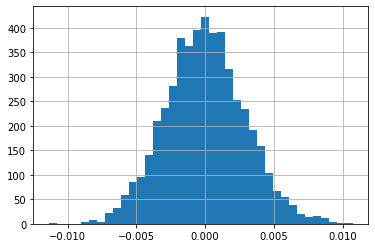

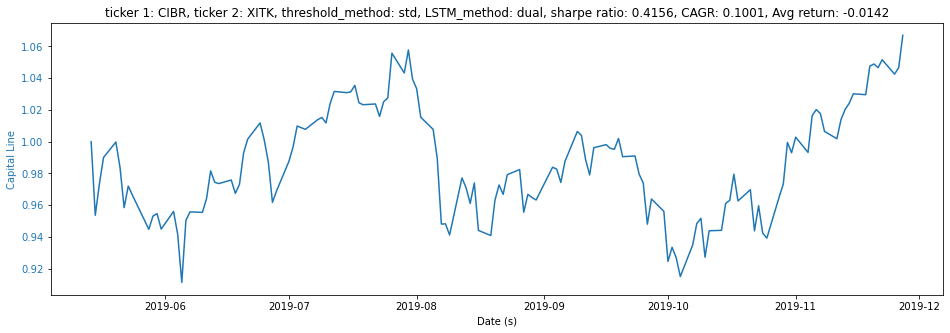

Annual return (dual+std) :  0.10005845063079
Sharpe ratio (dual+std) : 0.41560067458963734
CAGR (dual+std) :  0.10005845063078977
Avg_return (dual+std) :  -0.01418744199929291
-------------------------------------
threshold:  1.4811428636877861
average return -0.015059
[-0.00609592  0.00585199]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


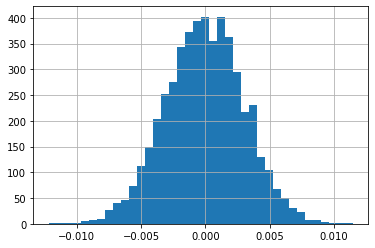

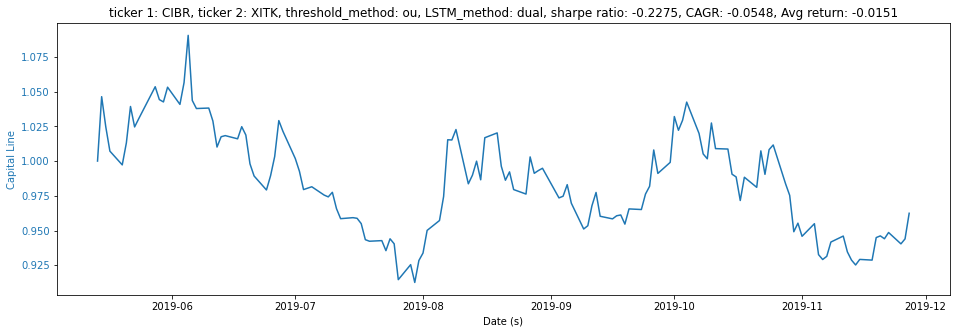

Annual return (dual+ou) :  -0.054771795285911584
Sharpe ratio (dual+ou) : -0.2274989761065287
CAGR (dual+ou) :  -0.054771795285911584
Avg_return (dual+ou) :  -0.01505895521947796
========================↑ dual, ↓ single ====================================
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0415
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0218
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0166
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0127
Epoch 5/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0113
Epoch 6/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0093
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0075
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0065
Epoch 10/20
31

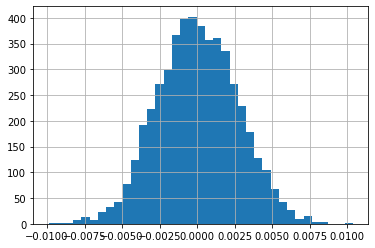

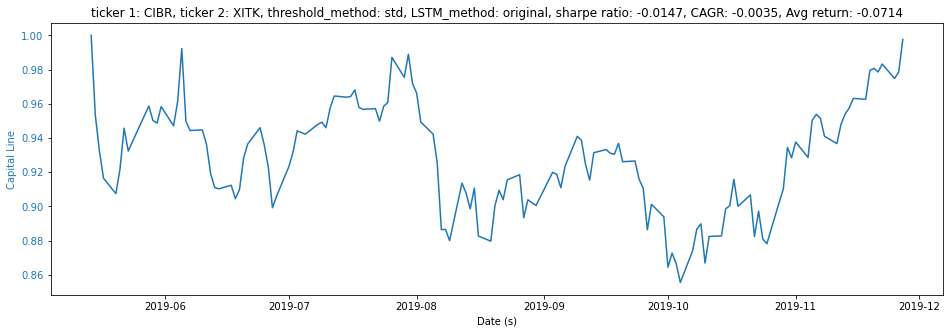

Annual return (std) :  -0.00353326548873123
Sharpe ratio (std) : -0.014675703919227637
CAGR (std) :  -0.00353326548873123
Avg_return (std) :  -0.071387472353264
-------------------------------------
threshold:  0.8108427783953791
average return -0.223494
[-0.01050772  0.01006617]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


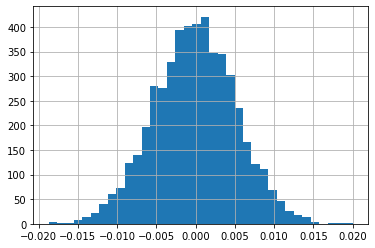

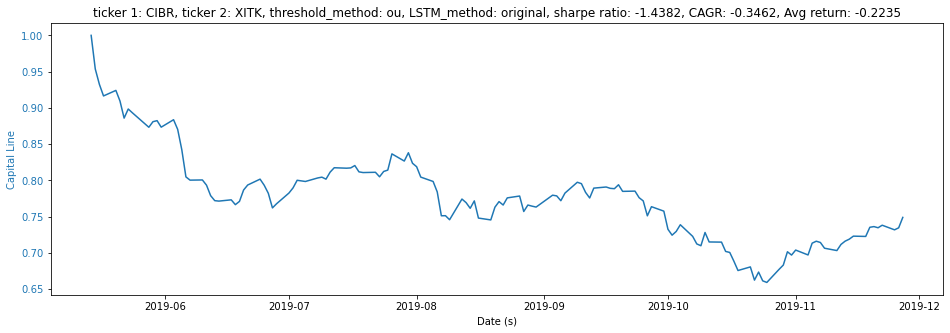

Annual return (ou) :  -0.3462454853583524
Sharpe ratio (ou) : -1.4381586220154492
CAGR (ou) :  -0.3462454853583523
Avg_return (ou) :  -0.22349440668942722
['SKYY', 'XITK']
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0940
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0344
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0245
Epoch 4/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0184
Epoch 5/20
312/312 [==============================] - 0s 2ms/step - loss: 0.0158
Epoch 6/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0152
Epoch 7/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0149
Epoch 8/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0146
Epoch 9/20
312/312 [==============================] - 0s 2ms/step - loss: 0.0144
Epoch 10/20
312/312 [==============================] - 0s 1ms/step - loss: 0.0140
Epoch 11/20
312/3

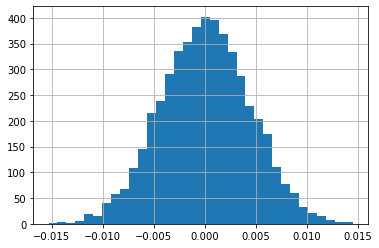

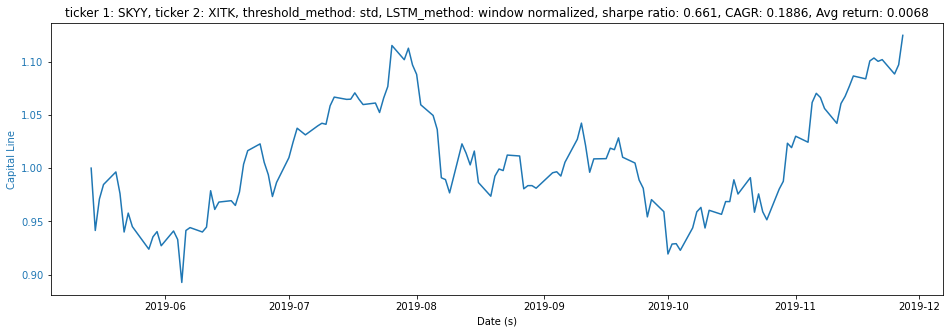

Annual return (std) :  0.18864261587667164
Sharpe ratio (std) : 0.6610163588684675
CAGR (std) :  0.18864261587667164
Avg_return (std) :  0.006827970780487839
-------------------------------------
threshold:  1.1248696397930382
average return -0.040509
[-0.00726358  0.00693693]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


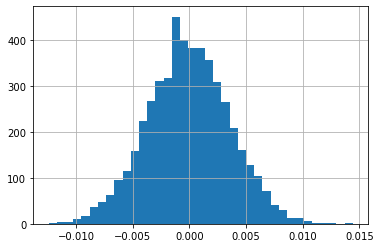

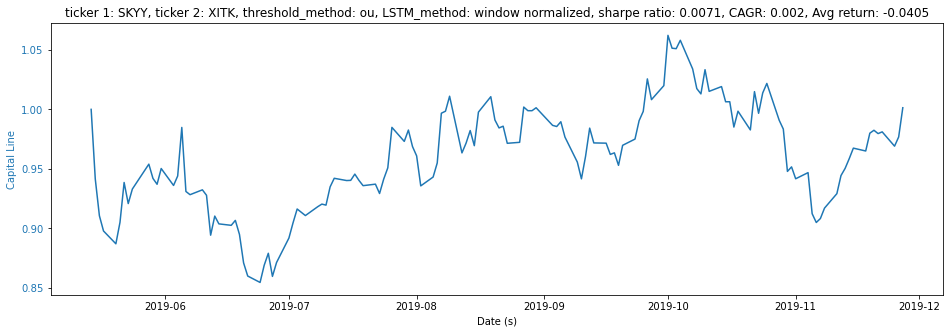

Annual return (ou) :  0.0020171577455960765
Sharpe ratio (ou) : 0.007068255823641469
CAGR (ou) :  0.0020171577455960765
Avg_return (ou) :  -0.04050908546071883
========================↑ single(window normalised), ↓ dual====================================
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0852
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0124
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0077
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0057
Epoch 5/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0046
Epoch 6/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0042
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0039
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0037
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0036
Epoch 10/20
312

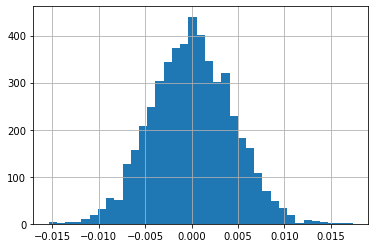

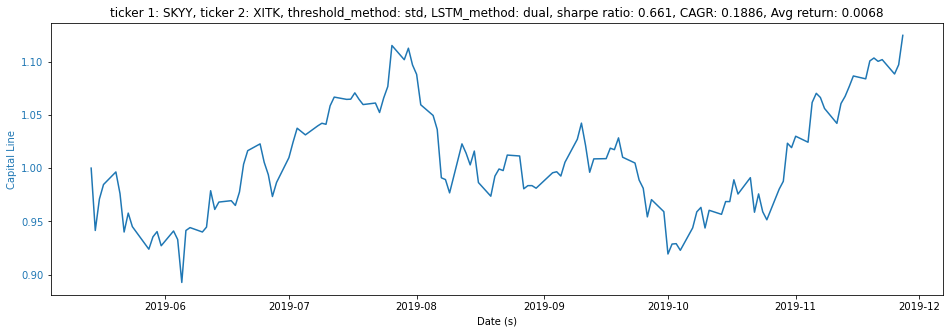

Annual return (dual+std) :  0.18864251218258454
Sharpe ratio (dual+std) : 0.6610160000554421
CAGR (dual+std) :  0.18864251218258454
Avg_return (dual+std) :  0.006827894843966284
-------------------------------------
threshold:  1.1034081153430546
average return -0.037563
[-0.00916621  0.00925397]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


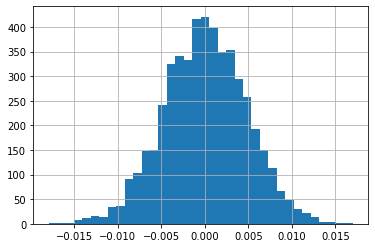

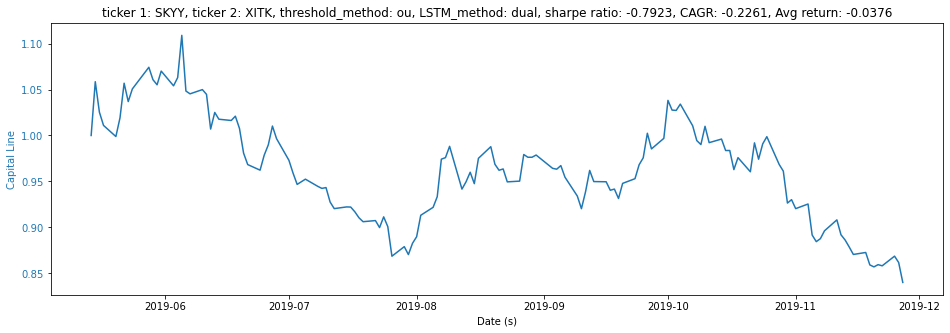

Annual return (dual+ou) :  -0.22610718910820737
Sharpe ratio (dual+ou) : -0.7922947378023989
CAGR (dual+ou) :  -0.22610718910820737
Avg_return (dual+ou) :  -0.03756250875529858
========================↑ dual, ↓ single ====================================
Epoch 1/20
312/312 [==============================] - 1s 3ms/step - loss: 0.0372
Epoch 2/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0198
Epoch 3/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0127
Epoch 4/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0103
Epoch 5/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0085
Epoch 6/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0077
Epoch 7/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0069
Epoch 8/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0059
Epoch 9/20
312/312 [==============================] - 1s 2ms/step - loss: 0.0063
Epoch 10/20
312/

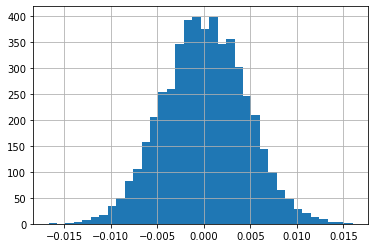

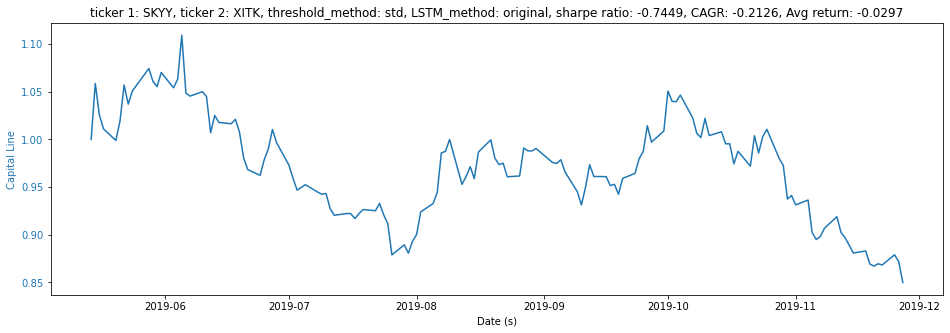

Annual return (std) :  -0.21257763282584974
Sharpe ratio (std) : -0.7448864736556006
CAGR (std) :  -0.21257763282584974
Avg_return (std) :  -0.029730021384251536
-------------------------------------
threshold:  0.6074907992697732
average return -0.029730
[-0.00886431  0.00879833]
Do not reject Ho = The population distribution of rule returns has an expected value of zero or less (because p_value is not small enough)
p_value:
0.9998


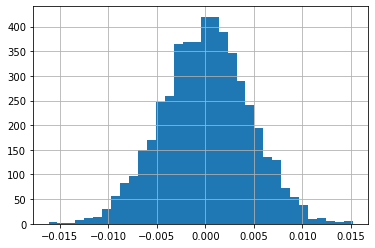

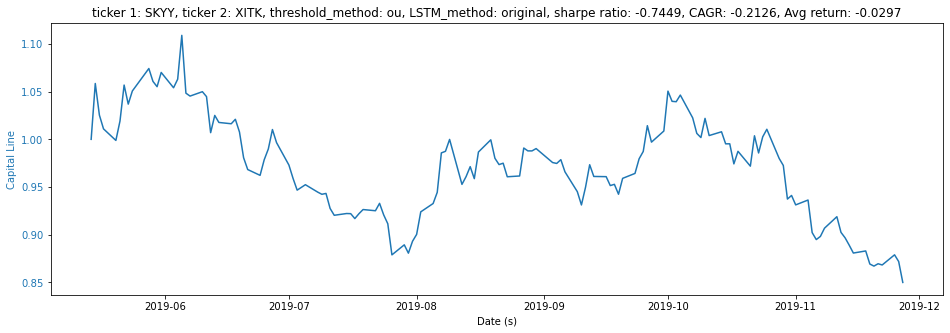

Annual return (ou) :  -0.21257763282584974
Sharpe ratio (ou) : -0.7448864736556006
CAGR (ou) :  -0.21257763282584974
Avg_return (ou) :  -0.029730021384251536


In [21]:
## Get data
# interval: 1m,2m,5m,15m,30m,60m,90m,1h,1d,5d,1wk,1mo,3mo
# The 1m data is only retrievable for the last 7 days, and anything interval <1d only for the last 60 days.
INTERVAL = '1d'
TEST_RATIO = 0.33
BATCH_SIZE = 5
# start and end date of the data
START = "2017-11-10"
END = "2019-11-29"
# look back window size
# LOOK_BACK = 30
LOOK_BACK = 5

for TICKER_PAIR in TICKER_PAIRS:
    # Run all methods of LSTM separately for each ticker pair
    print(TICKER_PAIR)
    run_window_normalize_training_workflow(TICKER_PAIR, INTERVAL, TEST_RATIO, BATCH_SIZE, LOOK_BACK, START, END)
    print("========================↑ single(window normalised), ↓ dual====================================")
    run_dual_training_workflow(TICKER_PAIR, INTERVAL, TEST_RATIO, BATCH_SIZE, LOOK_BACK, START, END)
    print("========================↑ dual, ↓ single ====================================")
    run_training_workflow(TICKER_PAIR, INTERVAL, TEST_RATIO, BATCH_SIZE, LOOK_BACK, START, END)

ticker_file.close()